# Modelling with all features - forward stepwise selection of features  

In [2043]:
#standard libraries 
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot
from matplotlib import rcParams
%matplotlib inline

#data pre-processing 

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

#modelling 
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from catboost import CatBoostClassifier, Pool, cv
from sklearn.tree import DecisionTreeClassifier


#evaluation 
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import fbeta_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import log_loss
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score

#feature importance 
import shap
shap.initjs()

#warnings 
import time 

import warnings

warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore',category=DeprecationWarning)
warnings.filterwarnings(action='ignore',category=FutureWarning)

In [2368]:
# some functions 

def threshold_setting(y_probs, y_val): 
    """find the threshold which gives the best Fbeta score"""
    
    thresholds = [n/100 for n in range(101)]
    
    scores = []
    
    for threshold in thresholds:
        y_pred_class = np.where(y_probs > threshold, 1, 0)
        scores.append((fbeta_score(y_val, y_pred_class, beta=2), threshold))

    best_threshold = max(scores)[1]
    
    adj_class = np.where(y_probs > 0.25, 1, 0)
    final_score = fbeta_score(y_val, adj_class, beta=2)
    
    print(f"Best F2 score: {final_score} at a threshold of {best_threshold}")
    
    return(best_threshold, final_score)
    
    
    
def evaluate(y_pred_class, y_test, y_probs): 
    """Evaluate Model"""

    print('\n##### Evaluating Model #####')
    
    print("ROC AUC SCORE: {:.2f}".format(roc_auc_score(y_test, y_probs)))
    
    #confusion matrix 
    
    cm = confusion_matrix(y_test, y_pred_class)
    print('\n', cm)
    
    TN, FP, FN, TP = cm.ravel()
    
    print('\nTrue Positives:', TP)
    print('True Negatives:', TN)
    print('False Positives:', FP)
    print('False Negatives:', FN)
    
    #print metrics 
    print('\n')
    print('Recall:', recall_score(y_test, y_pred_class))
    print('Precision:', precision_score(y_test, y_pred_class))
    print('Specificity', TN/(TN+FP))
    print('F1 score:', f1_score(y_test, y_pred_class))
    print('F2 score:', fbeta_score(y_test, y_pred_class, beta=2))
    print('Accuracy:', accuracy_score(y_test, y_pred_class))
    
    f2_outcome = fbeta_score(y_test, y_pred_class, beta=2)
    
    
    #precision_recall_curve
    precision, recall, _ = precision_recall_curve(y_test, y_pred_class)
    pyplot.plot(recall,precision, marker='.', label='model')
    # axis labels
    pyplot.xlabel('Recall')
    pyplot.ylabel('Precision')
    # show the legend
    pyplot.legend()
    # show the plot
    pyplot.show()
    
    
    return(f2_outcome, TP, TN, FN, FP)

In [2117]:
df = pd.read_csv('nhanes_extracted.csv')
df.drop(columns = ['Unnamed: 0'], axis=1, inplace=True)

In [2118]:
#remove participants with no laboratory values 
labs = ['Alanine Aminotransferase (ALT) (U/L)',
       'Albumin, refrigerated serum (g/dL)',
       'Alkaline Phosphatase (ALP) (U/L)',
       'Aspartate Aminotransferase (AST) (U/L)', 'Bicarbonate (mmol/L)',
       'Blood Urea Nitrogen (g/dL)', 'Chloride (mmol/L)',
       'Cholesterol, refrigerated serum (mg/dL)',
       'Creatinine, refrigerated serum (umol/L)',
       'Gamma Glutamyl Transferase (GGT) (U/L)',
       'Glucose, refrigerated serum (mmol/L)', 'Potassium (mmol/L)',
       'Sodium (mmol/L)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)',
       'Triglycerides, refrig serum (mg/dL)', 'LDL cholesterol (mmol/L)',
       'HDL cholesterol (mmol/L)', 'eGFR', 'Fasting Glucose (mmol/L)',
       'Two Hour Glucose(OGTT) (mmol/L)']

In [2119]:
diabetes_tests = ['hba1c_result', 'Fasting Glucose (mmol/L)', 'Two Hour Glucose(OGTT) (mmol/L)']

In [2120]:
df.dropna(how='all', subset=labs, inplace=True)

In [2121]:
df.dropna(how='all', subset=diabetes_tests, inplace=True)

In [2122]:
df.shape

(23310, 42)

In [2123]:
features = ['Age', 'bmi',
       'Alanine Aminotransferase (ALT) (U/L)',
       'Albumin, refrigerated serum (g/dL)',
       'Alkaline Phosphatase (ALP) (U/L)',
       'Aspartate Aminotransferase (AST) (U/L)', 'Bicarbonate (mmol/L)',
       'Blood Urea Nitrogen (g/dL)', 'Chloride (mmol/L)',
       'Cholesterol, refrigerated serum (mg/dL)',
       'Creatinine, refrigerated serum (umol/L)',
       'Gamma Glutamyl Transferase (GGT) (U/L)',
       'Glucose, refrigerated serum (mmol/L)', 'Potassium (mmol/L)',
       'Sodium (mmol/L)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)',
       'Triglycerides, refrig serum (mg/dL)', 'LDL cholesterol (mmol/L)',
       'HDL cholesterol (mmol/L)',  'eGFR', 'MAP', 
       'Gender_1.0', 'Gender_2.0', 'Ethnicity_1.0',
       'Ethnicity_2.0', 'Ethnicity_3.0', 'Ethnicity_4.0', 'Ethnicity_5.0',
       'other_agents_0', 'other_agents_1', 'metformin_0', 'metformin_1',
       'insulin_0', 'insulin_1', 'statin_0', 'statin_1', 'ace_arbs_0',
       'ace_arbs_1']

In [2124]:
#fill missing data with out-of-sample 
df.fillna(-999, inplace=True)

In [2125]:
df.shape

(23310, 42)

In [2126]:
#one-hot-encoding of categorical variables
df = pd.get_dummies(df, columns = ['Gender', 'Ethnicity', 'other_agents', 'metformin', 'insulin', 'statin', 'ace_arbs'])

In [2127]:
#target and feature selection 
y = df['diagnostic_t2dm']
X = df[features]

In [2128]:
len(X.columns)

39

In [2129]:
#split train-val-test datasets (85%, 5%, 10% respectively)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.056, random_state=1, stratify = y_train)

In [2130]:
#scale data 
scaler = StandardScaler()

X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X.columns)
X_val = pd.DataFrame(scaler.transform(X_val), columns=X.columns)

_____
# Decision Tree

In [2059]:
#instantiate model 
model = DecisionTreeClassifier(random_state = 42) 

In [2060]:
#fit model
model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [2061]:
#predict
y_preds =  cross_val_predict(model, X_val, y_val, cv=5)

In [2062]:
y_probs = cross_val_predict(model, X_val, y_val, cv=5, method='predict_proba')[:, 1]

In [2063]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val)

Best F2 score: 0.6911581569115816 at a threshold of 0.99


(0.99, 0.6911581569115816)

In [2064]:
#make prediction on hold-out test set 
y_preds =  cross_val_predict(model, X_test, y_test, cv=5)
y_probs = cross_val_predict(model, X_test, y_test, cv=5, method='predict_proba')[:, 1]

In [2065]:
#apply threshold to test set 
y_pred_class = np.where(y_probs > 0.99, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1892  119]
 [ 101  219]]

True Positives: 219
True Negatives: 1892
False Positives: 119
False Negatives: 101


Recall: 0.684375
Precision: 0.6479289940828402
Specificity 0.9408254599701641
F1 score: 0.6656534954407295
F2 score: 0.6767614338689741


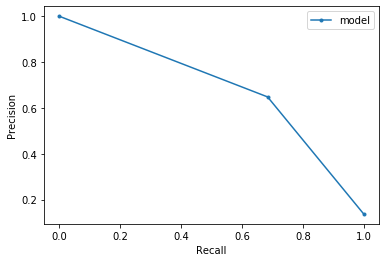

(0.6767614338689741, 219, 1892, 101, 119)

In [2066]:
evaluate(y_pred_class, y_test, y_probs)

In [1892]:
#optimisation 

dt_space = {"criterion": ['gini', 'entropy'], 
         "max_depth": [None, np.arange(1,1000,20)], 
         "min_samples_split": [2, 5, 10, 15, 20], 
         "min_samples_leaf": np.arange(1,25,5), 
         "max_features": ['auto', 'sqrt', 'log2'],
         "class_weight": [None, 'balanced']}

In [1893]:
model_optimisation = RandomizedSearchCV(
            DecisionTreeClassifier(random_state=42), 
            dt_space,  
            n_iter=200, 
            n_jobs=-1, 
            random_state = 42, 
            cv=2, 
            verbose=2)

    
best_model = model_optimisation.fit(X_train, y_train)

Fitting 2 folds for each of 200 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 364 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed:    5.8s finished


In [1894]:
best_model.best_params_

{'min_samples_split': 15,
 'min_samples_leaf': 11,
 'max_features': 'auto',
 'max_depth': None,
 'criterion': 'entropy',
 'class_weight': None}

In [2067]:
best_params_ = {'min_samples_split': 15,
 'min_samples_leaf': 11,
 'max_features': 'auto',
 'max_depth': None,
 'criterion': 'entropy',
 'class_weight': None,
 'random_state': 42}

In [2068]:
final_model = DecisionTreeClassifier(**best_params_)

In [2069]:
final_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=11, min_samples_split=15,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [2070]:
#predict
y_preds =  cross_val_predict(final_model, X_val, y_val, cv=5)
y_probs = cross_val_predict(final_model, X_val, y_val, cv=5, method='predict_proba')[:, 1]

In [2071]:
threshold_setting(y_probs, y_val)

Best F2 score: 0.68 at a threshold of 0.16


(0.16, 0.68)

In [2072]:
#predict on hold-out test set 
y_preds =  cross_val_predict(final_model, X_test, y_test, cv=5)
y_probs = cross_val_predict(final_model, X_test, y_test, cv=5, method='predict_proba')[:, 1]

In [2073]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.16, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.86

 [[1678  333]
 [  76  244]]

True Positives: 244
True Negatives: 1678
False Positives: 333
False Negatives: 76


Recall: 0.7625
Precision: 0.42287694974003465
Specificity 0.834410740924913
F1 score: 0.544035674470457
F2 score: 0.6569736133548734


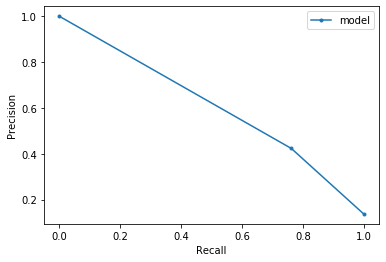

(0.6569736133548734, 244, 1678, 76, 333)

In [2074]:
evaluate(y_pred_class, y_test, y_probs)

In [2075]:
#feature selection - first order features in terms of their shap importance value 
explainer = shap.TreeExplainer(final_model)

In [2076]:
shap_values = explainer.shap_values(X_train, approximate=True)

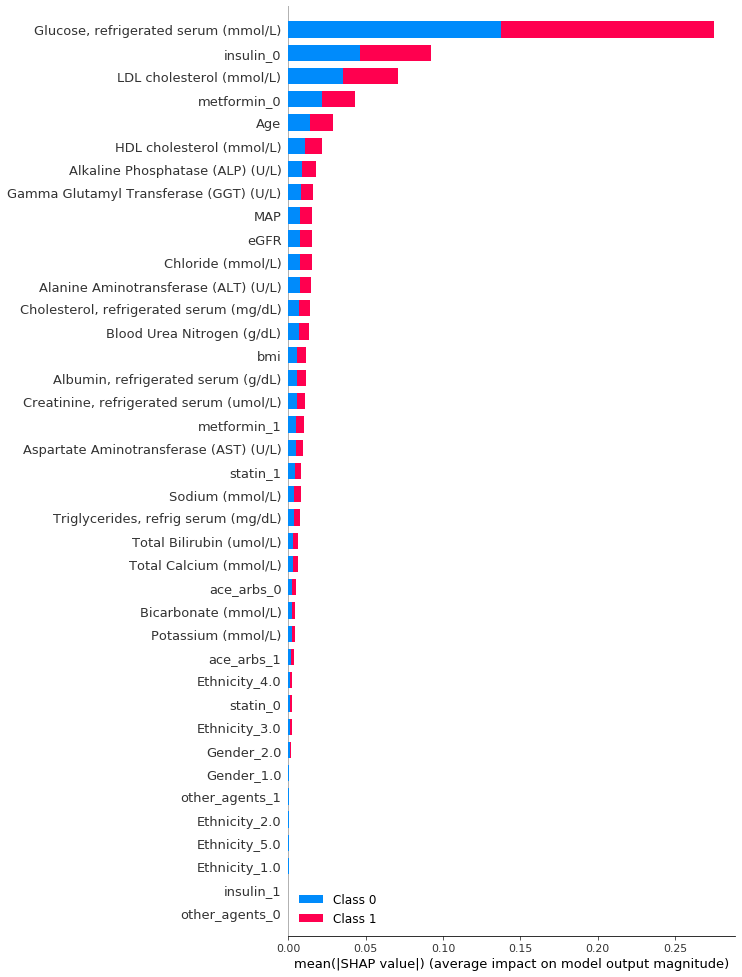

In [2077]:
shap.summary_plot(shap_values, X_train, max_display=39)

In [2078]:
vals= np.abs(shap_values[1]).mean(0)

In [2079]:
feature_importance = pd.DataFrame(list(zip(X_train.columns,vals)),columns=['col_name','feature_importance_vals'])

In [2080]:
feature_importance.sort_values(by=['feature_importance_vals'],ascending=False,inplace=True)

In [2081]:
feature_importance

,col_name,feature_importance_vals
12,"Glucose, refrigerated serum (mmol/L)",0.137541
33,insulin_0,0.046048
18,LDL cholesterol (mmol/L),0.035503
31,metformin_0,0.021527
0,Age,0.014277
19,HDL cholesterol (mmol/L),0.010709
4,Alkaline Phosphatase (ALP) (U/L),0.008876
11,Gamma Glutamyl Transferase (GGT) (U/L),0.008096
21,MAP,0.007709
20,eGFR,0.007614


In [2082]:
ordered_features_dt = list(feature_importance['col_name'])
ordered_features_dt

['Glucose, refrigerated serum (mmol/L)',
 'insulin_0',
 'LDL cholesterol (mmol/L)',
 'metformin_0',
 'Age',
 'HDL cholesterol (mmol/L)',
 'Alkaline Phosphatase (ALP) (U/L)',
 'Gamma Glutamyl Transferase (GGT) (U/L)',
 'MAP',
 'eGFR',
 'Chloride (mmol/L)',
 'Alanine Aminotransferase (ALT) (U/L)',
 'Cholesterol, refrigerated serum (mg/dL)',
 'Blood Urea Nitrogen (g/dL)',
 'bmi',
 'Albumin, refrigerated serum (g/dL)',
 'Creatinine, refrigerated serum (umol/L)',
 'metformin_1',
 'Aspartate Aminotransferase (AST) (U/L)',
 'statin_1',
 'Sodium (mmol/L)',
 'Triglycerides, refrig serum (mg/dL)',
 'Total Bilirubin (umol/L)',
 'Total Calcium (mmol/L)',
 'ace_arbs_0',
 'Bicarbonate (mmol/L)',
 'Potassium (mmol/L)',
 'ace_arbs_1',
 'Ethnicity_4.0',
 'statin_0',
 'Ethnicity_3.0',
 'Gender_2.0',
 'Gender_1.0',
 'other_agents_1',
 'Ethnicity_2.0',
 'Ethnicity_5.0',
 'Ethnicity_1.0',
 'other_agents_0',
 'insulin_1']

In [2083]:
def dt_process(df, features): 

    
    #prepare df 
    X = df[features]
    y = df['diagnostic_t2dm']
    
    
    #split into train-test (10% test and 15% validate)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.056, random_state=1, stratify = y_train)

    
    #scale 
    scaler = StandardScaler()

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    X_val = scaler.transform(X_val)
    
    #instantiate 
    model = DecisionTreeClassifier(random_state=42)
    
    #fit 
    model.fit(X_train, y_train)
    
    #predict for validate set 
    y_preds =  cross_val_predict(model, X_val, y_val, cv=5)
    y_probs = cross_val_predict(model, X_val, y_val, cv=5, method='predict_proba')[:, 1]
    
    #select threshold based on validate dataset 
    threshold, result = threshold_setting(y_probs, y_val)
    
    #apply this threshold to the test set 
    y_preds =  cross_val_predict(model, X_test, y_test, cv=5)
    y_probs = cross_val_predict(model, X_test, y_test, cv=5, method='predict_proba')[:, 1]
    
    #apply threshold 
    y_pred_class = np.where(y_probs > threshold, 1, 0)
    
    #evaluate
    fbeta, TP, TN, FN, FP = evaluate(y_pred_class, y_test, y_probs)
    
    return(fbeta)


**************

TESTING: 1 features

 ['Glucose, refrigerated serum (mmol/L)']
Best F2 score: 0.640547263681592 at a threshold of 0.12

##### Evaluating Model #####
ROC AUC SCORE: 0.87

 [[1720  291]
 [  62  258]]

True Positives: 258
True Negatives: 1720
False Positives: 291
False Negatives: 62


Recall: 0.80625
Precision: 0.46994535519125685
Specificity 0.8552958727001492
F1 score: 0.5937859608745685
F2 score: 0.7053034445051941


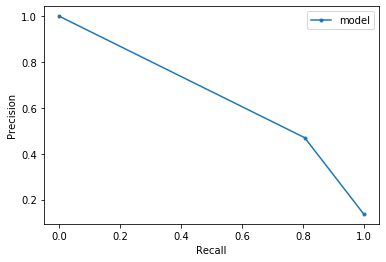

0.7053034445051941

**************

TESTING: 2 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0']
Best F2 score: 0.630461922596754 at a threshold of 0.12

##### Evaluating Model #####
ROC AUC SCORE: 0.85

 [[1727  284]
 [  68  252]]

True Positives: 252
True Negatives: 1727
False Positives: 284
False Negatives: 68


Recall: 0.7875
Precision: 0.4701492537313433
Specificity 0.8587767279960219
F1 score: 0.5887850467289719
F2 score: 0.6938325991189427


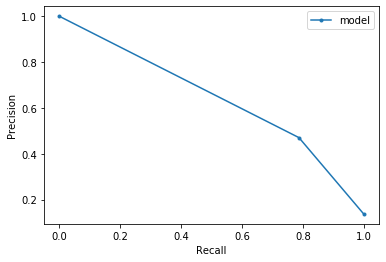

0.6938325991189427

**************

TESTING: 3 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)']
Best F2 score: 0.6654228855721394 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.82

 [[1851  160]
 [  93  227]]

True Positives: 227
True Negatives: 1851
False Positives: 160
False Negatives: 93


Recall: 0.709375
Precision: 0.58656330749354
Specificity 0.9204375932371954
F1 score: 0.6421499292786421
F2 score: 0.6808638272345531


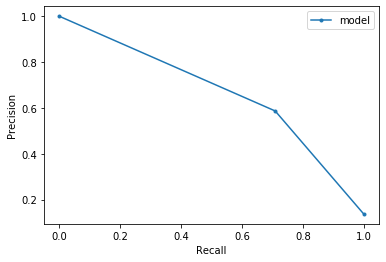

0.6808638272345531

**************

TESTING: 4 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0']
Best F2 score: 0.7169344870210136 at a threshold of 0.49

##### Evaluating Model #####
ROC AUC SCORE: 0.82

 [[1898  113]
 [ 104  216]]

True Positives: 216
True Negatives: 1898
False Positives: 113
False Negatives: 104


Recall: 0.675
Precision: 0.6565349544072948
Specificity 0.9438090502237693
F1 score: 0.6656394453004622
F2 score: 0.6712243629583592


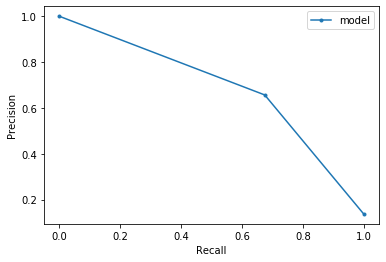

0.6712243629583592

**************

TESTING: 5 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age']
Best F2 score: 0.6888068880688806 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1895  116]
 [ 107  213]]

True Positives: 213
True Negatives: 1895
False Positives: 116
False Negatives: 107


Recall: 0.665625
Precision: 0.6474164133738601
Specificity 0.9423172550969667
F1 score: 0.6563944530046225
F2 score: 0.6619018023617155


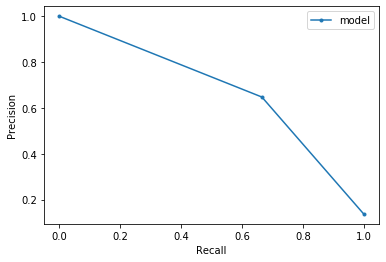

0.6619018023617155

**************

TESTING: 6 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)']
Best F2 score: 0.7080745341614907 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1888  123]
 [ 104  216]]

True Positives: 216
True Negatives: 1888
False Positives: 123
False Negatives: 104


Recall: 0.675
Precision: 0.6371681415929203
Specificity 0.938836399801094
F1 score: 0.6555386949924128
F2 score: 0.6670784434836319


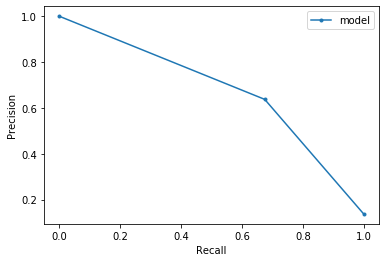

0.6670784434836319

**************

TESTING: 7 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)']
Best F2 score: 0.6857855361596009 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.79

 [[1884  127]
 [ 112  208]]

True Positives: 208
True Negatives: 1884
False Positives: 127
False Negatives: 112


Recall: 0.65
Precision: 0.6208955223880597
Specificity 0.9368473396320238
F1 score: 0.6351145038167938
F2 score: 0.6439628482972136


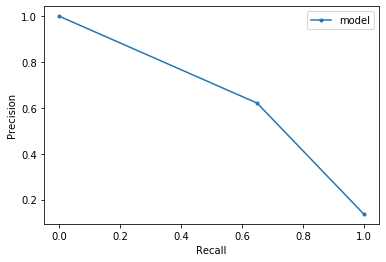

0.6439628482972136

**************

TESTING: 8 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)']
Best F2 score: 0.6949569495694957 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1888  123]
 [ 107  213]]

True Positives: 213
True Negatives: 1888
False Positives: 123
False Negatives: 107


Recall: 0.665625
Precision: 0.6339285714285714
Specificity 0.938836399801094
F1 score: 0.6493902439024389
F2 score: 0.6590346534653465


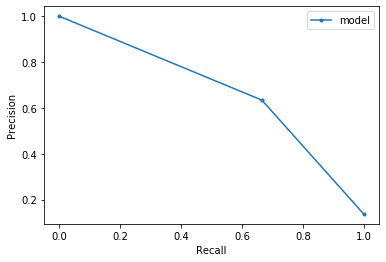

0.6590346534653465

**************

TESTING: 9 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP']
Best F2 score: 0.6778606965174129 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1881  130]
 [ 105  215]]

True Positives: 215
True Negatives: 1881
False Positives: 130
False Negatives: 105


Recall: 0.671875
Precision: 0.6231884057971014
Specificity 0.9353555445052213
F1 score: 0.6466165413533834
F2 score: 0.6615384615384615


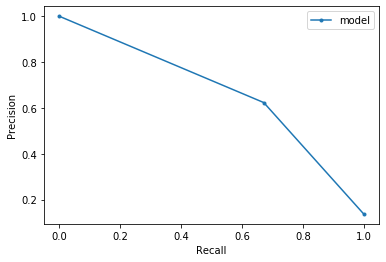

0.6615384615384615

**************

TESTING: 10 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR']
Best F2 score: 0.6691449814126393 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1872  139]
 [ 106  214]]

True Positives: 214
True Negatives: 1872
False Positives: 139
False Negatives: 106


Recall: 0.66875
Precision: 0.6062322946175638
Specificity 0.9308801591248135
F1 score: 0.635958395245171
F2 score: 0.6552357624004898


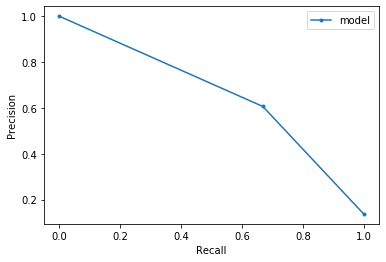

0.6552357624004898

**************

TESTING: 11 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)']
Best F2 score: 0.6521739130434783 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1876  135]
 [ 102  218]]

True Positives: 218
True Negatives: 1876
False Positives: 135
False Negatives: 102


Recall: 0.68125
Precision: 0.6175637393767706
Specificity 0.9328692192938837
F1 score: 0.647845468053492
F2 score: 0.6674831598285365


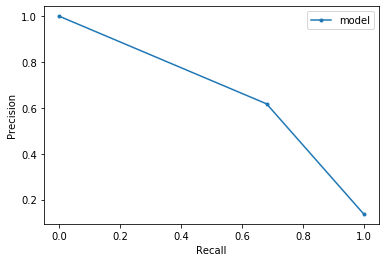

0.6674831598285365

**************

TESTING: 12 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)']
Best F2 score: 0.6546134663341646 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1876  135]
 [ 103  217]]

True Positives: 217
True Negatives: 1876
False Positives: 135
False Negatives: 103


Recall: 0.678125
Precision: 0.6164772727272727
Specificity 0.9328692192938837
F1 score: 0.6458333333333334
F2 score: 0.6648284313725489


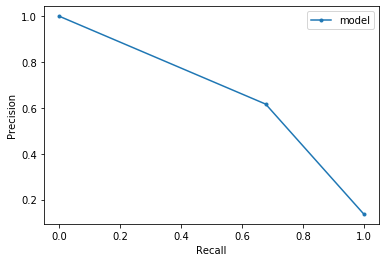

0.6648284313725489

**************

TESTING: 13 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)']
Best F2 score: 0.6992574257425743 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1881  130]
 [ 107  213]]

True Positives: 213
True Negatives: 1881
False Positives: 130
False Negatives: 107


Recall: 0.665625
Precision: 0.6209912536443148
Specificity 0.9353555445052213
F1 score: 0.6425339366515838
F2 score: 0.656192236598891


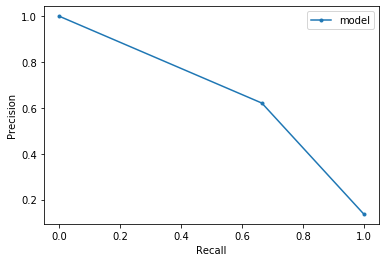

0.656192236598891

**************

TESTING: 14 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)']
Best F2 score: 0.6766917293233083 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1881  130]
 [ 106  214]]

True Positives: 214
True Negatives: 1881
False Positives: 130
False Negatives: 106


Recall: 0.66875
Precision: 0.622093023255814
Specificity 0.9353555445052213
F1 score: 0.6445783132530121
F2 score: 0.6588669950738915


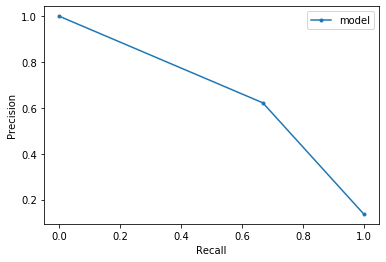

0.6588669950738915

**************

TESTING: 15 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi']
Best F2 score: 0.6866416978776528 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.82

 [[1903  108]
 [  97  223]]

True Positives: 223
True Negatives: 1903
False Positives: 108
False Negatives: 97


Recall: 0.696875
Precision: 0.6737160120845922
Specificity 0.9462953754351069
F1 score: 0.6850998463901691
F2 score: 0.6921166977032899


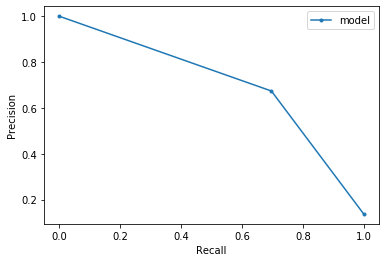

0.6921166977032899

**************

TESTING: 16 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)']
Best F2 score: 0.6885856079404467 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1896  115]
 [ 102  218]]

True Positives: 218
True Negatives: 1896
False Positives: 115
False Negatives: 102


Recall: 0.68125
Precision: 0.6546546546546547
Specificity 0.9428145201392342
F1 score: 0.667687595712098
F2 score: 0.6757594544327341


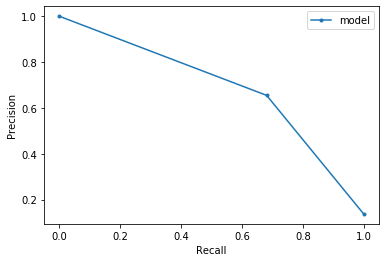

0.6757594544327341

**************

TESTING: 17 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)']
Best F2 score: 0.6801007556675063 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1896  115]
 [ 106  214]]

True Positives: 214
True Negatives: 1896
False Positives: 115
False Negatives: 106


Recall: 0.66875
Precision: 0.6504559270516718
Specificity 0.9428145201392342
F1 score: 0.6594761171032358
F2 score: 0.6650093225605966


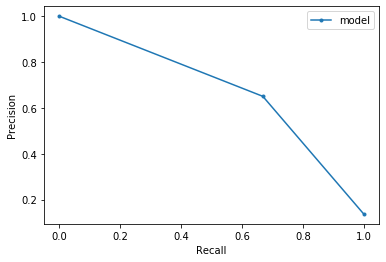

0.6650093225605966

**************

TESTING: 18 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1']
Best F2 score: 0.6838143036386449 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1898  113]
 [ 105  215]]

True Positives: 215
True Negatives: 1898
False Positives: 113
False Negatives: 105


Recall: 0.671875
Precision: 0.6554878048780488
Specificity 0.9438090502237693
F1 score: 0.6635802469135803
F2 score: 0.6685323383084577


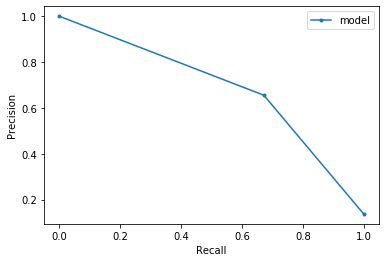

0.6685323383084577

**************

TESTING: 19 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)']
Best F2 score: 0.6954887218045113 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1891  120]
 [ 102  218]]

True Positives: 218
True Negatives: 1891
False Positives: 120
False Negatives: 102


Recall: 0.68125
Precision: 0.6449704142011834
Specificity 0.9403281949278965
F1 score: 0.662613981762918
F2 score: 0.6736711990111249


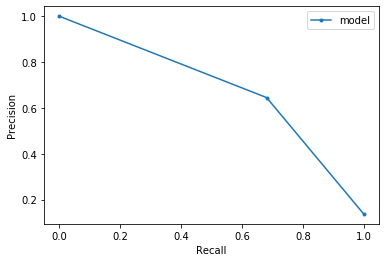

0.6736711990111249

**************

TESTING: 20 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1']
Best F2 score: 0.660377358490566 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1898  113]
 [ 103  217]]

True Positives: 217
True Negatives: 1898
False Positives: 113
False Negatives: 103


Recall: 0.678125
Precision: 0.6575757575757576
Specificity 0.9438090502237693
F1 score: 0.6676923076923077
F2 score: 0.6739130434782609


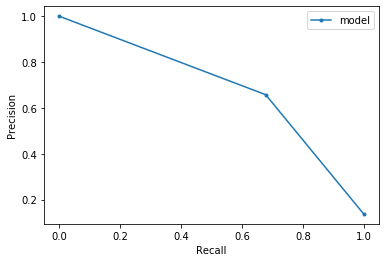

0.6739130434782609

**************

TESTING: 21 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)']
Best F2 score: 0.671267252195734 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1889  122]
 [ 102  218]]

True Positives: 218
True Negatives: 1889
False Positives: 122
False Negatives: 102


Recall: 0.68125
Precision: 0.6411764705882353
Specificity 0.9393336648433616
F1 score: 0.6606060606060606
F2 score: 0.6728395061728395


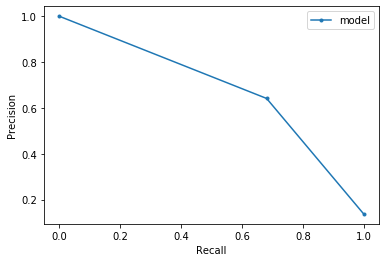

0.6728395061728395

**************

TESTING: 22 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)']
Best F2 score: 0.6766917293233083 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1883  128]
 [ 101  219]]

True Positives: 219
True Negatives: 1883
False Positives: 128
False Negatives: 101


Recall: 0.684375
Precision: 0.6311239193083573
Specificity 0.9363500745897564
F1 score: 0.656671664167916
F2 score: 0.6730178242163489


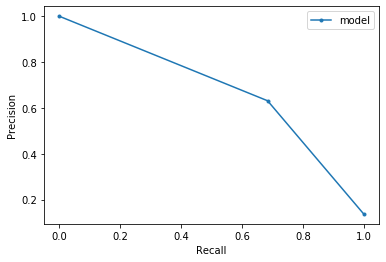

0.6730178242163489

**************

TESTING: 23 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)']
Best F2 score: 0.6750000000000002 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1888  123]
 [ 101  219]]

True Positives: 219
True Negatives: 1888
False Positives: 123
False Negatives: 101


Recall: 0.684375
Precision: 0.6403508771929824
Specificity 0.938836399801094
F1 score: 0.661631419939577
F2 score: 0.

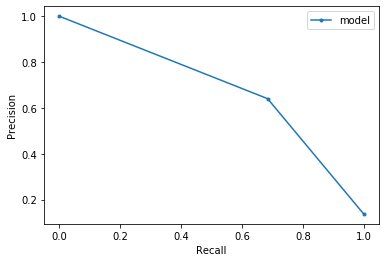

0.6750924784217015

**************

TESTING: 24 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)']
Best F2 score: 0.6823821339950371 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1892  119]
 [ 106  214]]

True Positives: 214
True Negatives: 1892
False Positives: 119
False Negatives: 106


Recall: 0.66875
Precision: 0.6426426426426426
Specificity 0.9408254599701641
F1 score: 0.65

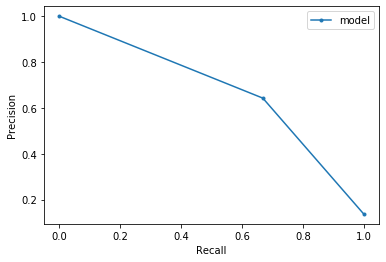

0.6633601983880966

**************

TESTING: 25 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0']
Best F2 score: 0.6529850746268656 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.80

 [[1894  117]
 [ 109  211]]

True Positives: 211
True Negatives: 1894
False Positives: 117
False Negatives: 109


Recall: 0.659375
Precision: 0.6432926829268293
Specificity 0.9418199900546992

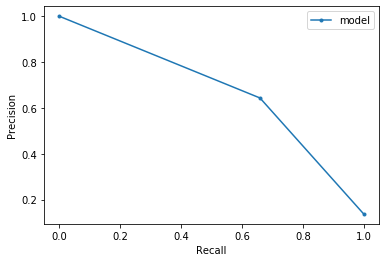

0.6560945273631842

**************

TESTING: 26 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)']
Best F2 score: 0.6843403205918618 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.82

 [[1887  124]
 [  98  222]]

True Positives: 222
True Negatives: 1887
False Positives: 124
False Negatives: 98


Recall: 0.69375
Precision: 0.6416184971098265
Specific

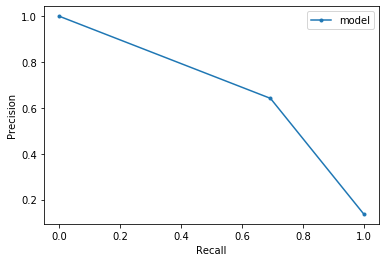

0.6826568265682657

**************

TESTING: 27 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)']
Best F2 score: 0.6874999999999999 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1891  120]
 [ 102  218]]

True Positives: 218
True Negatives: 1891
False Positives: 120
False Negatives: 102


Recall: 0.68125
Precision: 0.64

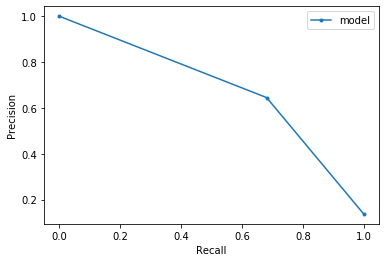

0.6736711990111249

**************

TESTING: 28 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1']
Best F2 score: 0.7027363184079601 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.82

 [[1892  119]
 [  95  225]]

True Positives: 225
True Negatives: 1892
False Positives: 119
False Negatives: 95


Recall: 0.703125
P

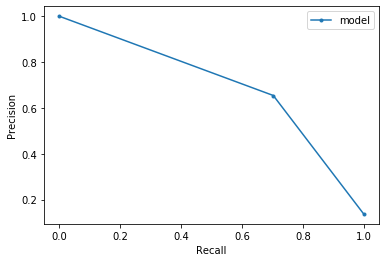

0.6927339901477833

**************

TESTING: 29 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0']
Best F2 score: 0.6866416978776528 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1899  112]
 [ 106  214]]

True Positives: 214
True Negatives: 1899
False Positives: 112
False Negatives: 106




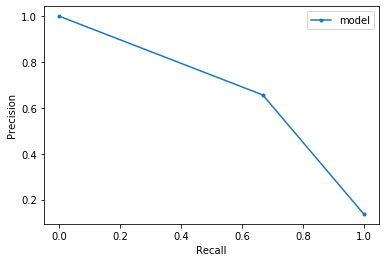

0.6662515566625156

**************

TESTING: 30 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0']
Best F2 score: 0.7133995037220844 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1892  119]
 [ 103  217]]

True Positives: 217
True Negatives: 1892
False Positives: 119
False Negat

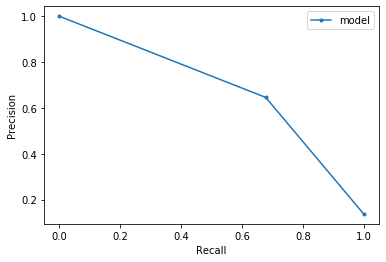

0.6714108910891089

**************

TESTING: 31 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0']
Best F2 score: 0.69375 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1888  123]
 [ 101  219]]

True Positives: 219
True Negatives: 1888
False Positives: 123
False

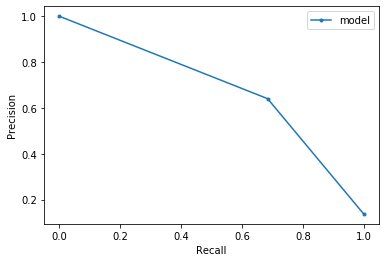

0.6750924784217015

**************

TESTING: 32 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0', 'Gender_2.0']
Best F2 score: 0.7027363184079601 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1887  124]
 [  99  221]]

True Positives: 221
True Negatives: 1887
F

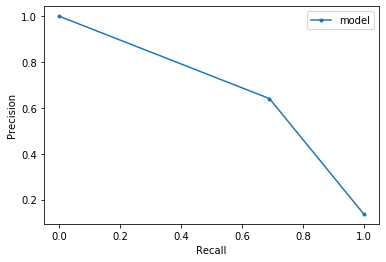

0.68

**************

TESTING: 33 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0', 'Gender_2.0', 'Gender_1.0']
Best F2 score: 0.6625000000000001 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1887  124]
 [ 101  219]]

True Positives: 219
True Negatives: 1887
F

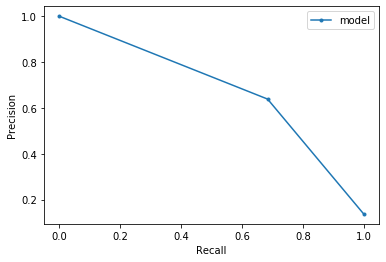

0.6746765249537893

**************

TESTING: 34 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0', 'Gender_2.0', 'Gender_1.0', 'other_agents_1']
Best F2 score: 0.681536555142503 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1896  115]
 [ 102  218]]

True Positi

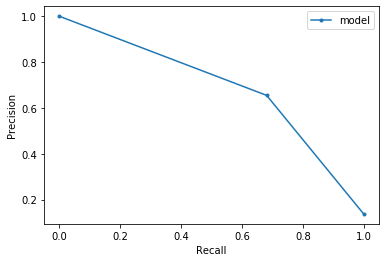

0.6757594544327341

**************

TESTING: 35 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0', 'Gender_2.0', 'Gender_1.0', 'other_agents_1', 'Ethnicity_2.0']
Best F2 score: 0.6885856079404467 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.81

 [[1894  117]
 [ 101  

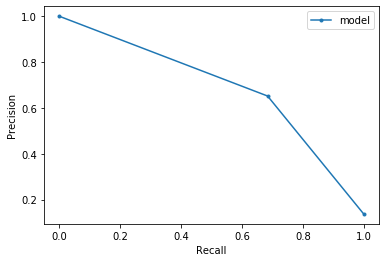

0.6775990099009901

**************

TESTING: 36 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0', 'Gender_2.0', 'Gender_1.0', 'other_agents_1', 'Ethnicity_2.0', 'Ethnicity_5.0']
Best F2 score: 0.6746532156368222 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC SCORE: 0.82

 [[18

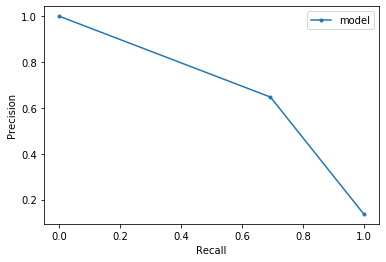

0.6839186691312383

**************

TESTING: 37 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0', 'Gender_2.0', 'Gender_1.0', 'other_agents_1', 'Ethnicity_2.0', 'Ethnicity_5.0', 'Ethnicity_1.0']
Best F2 score: 0.7037037037037037 at a threshold of 0.99

##### Evaluating Model #####
ROC AUC S

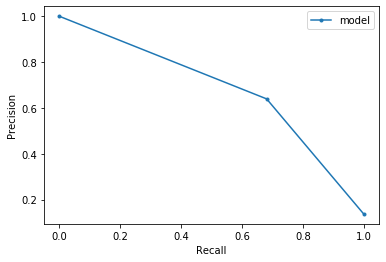

0.6724244293645898

**************

TESTING: 38 features

 ['Glucose, refrigerated serum (mmol/L)', 'insulin_0', 'LDL cholesterol (mmol/L)', 'metformin_0', 'Age', 'HDL cholesterol (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'MAP', 'eGFR', 'Chloride (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Blood Urea Nitrogen (g/dL)', 'bmi', 'Albumin, refrigerated serum (g/dL)', 'Creatinine, refrigerated serum (umol/L)', 'metformin_1', 'Aspartate Aminotransferase (AST) (U/L)', 'statin_1', 'Sodium (mmol/L)', 'Triglycerides, refrig serum (mg/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'ace_arbs_0', 'Bicarbonate (mmol/L)', 'Potassium (mmol/L)', 'ace_arbs_1', 'Ethnicity_4.0', 'statin_0', 'Ethnicity_3.0', 'Gender_2.0', 'Gender_1.0', 'other_agents_1', 'Ethnicity_2.0', 'Ethnicity_5.0', 'Ethnicity_1.0', 'other_agents_0']
Best F2 score: 0.704488778054863 at a threshold of 0.99

##### Evaluating Mode

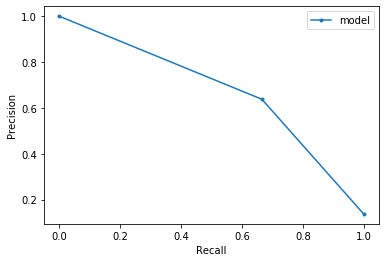

0.6598513011152417


In [2084]:
outcomes = dict()

for i in enumerate(ordered_features_dt): 
    feature_index = i[0]
    features = ordered_features_dt[:feature_index]
    
    if feature_index == 0: 
        pass
    else: 
        print('\n**************')
        print('\nTESTING:', feature_index, 'features')
        print('\n', features)
        fbeta = dt_process(df, features)
        print(fbeta)
        outcomes[feature_index] = fbeta

In [2085]:
outcomes_df = pd.DataFrame.from_dict(outcomes, orient='index').reset_index()

In [2086]:
outcomes_df.columns = ['feature_selection', 'f2']

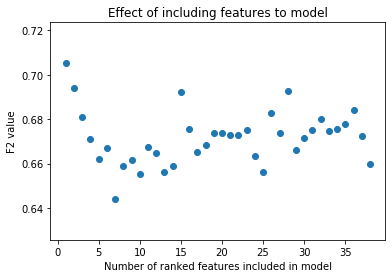

In [2087]:
plt.scatter(outcomes_df['feature_selection'], outcomes_df['f2'])
plt.xlabel('Number of ranked features included in model')
plt.ylabel('F2 value')
plt.title('Effect of including features to model')
plt.savefig('feature_selection_dt.png')

In [2088]:
import operator
max(outcomes.items(), key=operator.itemgetter(1))[0]

1

In [2089]:
dt_features = ordered_features_dt[0:1]

In [2090]:
dt_features

['Glucose, refrigerated serum (mmol/L)']

In [2091]:
#final model 

In [2092]:
df = pd.read_csv('nhanes_extracted.csv')
df.drop(columns = ['Unnamed: 0'], axis=1, inplace=True)

In [2093]:
df.dropna(how='all', subset=labs, inplace=True)

In [2094]:
df.dropna(how='all', subset=diabetes_tests, inplace=True)

In [2095]:
#fill missing data with out-of-sample 
df.fillna(-999, inplace=True)

In [2096]:
X_dt.shape

(23310, 1)

In [2097]:
#one-hot-encoding of categorical variables
df = pd.get_dummies(df, columns = ['Gender', 'Ethnicity', 'other_agents', 'metformin', 'insulin', 'statin', 'ace_arbs'])

In [2098]:
#target and feature selection 
y_dt = df['diagnostic_t2dm']
X_dt = df[dt_features]

In [2099]:
#split train-val-test datasets (85%, 5%, 10% respectively)

X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_dt, y_dt, test_size=0.1, random_state=1, stratify=y_dt)
X_train_dt, X_val_dt, y_train_dt, y_val_dt = train_test_split(X_train_dt, y_train_dt, test_size=0.056, random_state=1, stratify = y_train_dt)

In [2100]:
#scale data 
scaler = StandardScaler()

X_train_dt = pd.DataFrame(scaler.fit_transform(X_train_dt), columns = X_dt.columns)
X_test_dt = pd.DataFrame(scaler.transform(X_test_dt), columns=X_dt.columns)
X_val_dt = pd.DataFrame(scaler.transform(X_val_dt), columns=X_dt.columns)

In [2101]:
#instantiate model 
model = DecisionTreeClassifier(random_state = 42) 

In [2102]:
model.fit(X_train_dt, y_train_dt)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [2103]:
#predict
y_preds =  cross_val_predict(model, X_val_dt, y_val_dt, cv=5)
y_probs = cross_val_predict(model, X_val_dt, y_val_dt, cv=5, method='predict_proba')[:, 1]

In [2104]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val)

Best F2 score: 0.640547263681592 at a threshold of 0.12


(0.12, 0.640547263681592)

In [2105]:
#make prediction on hold-out test set 
y_preds =  cross_val_predict(model, X_test_dt, y_test_dt, cv=5)
y_probs = cross_val_predict(model, X_test_dt, y_test_dt, cv=5, method='predict_proba')[:, 1]

In [2106]:
#apply threshold to test set 
y_pred_class = np.where(y_probs > 0.12, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.87

 [[1720  291]
 [  62  258]]

True Positives: 258
True Negatives: 1720
False Positives: 291
False Negatives: 62


Recall: 0.80625
Precision: 0.46994535519125685
Specificity 0.8552958727001492
F1 score: 0.5937859608745685
F2 score: 0.7053034445051941


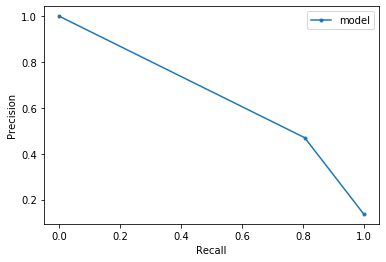

(0.7053034445051941, 258, 1720, 62, 291)

In [2107]:
evaluate(y_pred_class, y_test_dt, y_probs)

In [1937]:
model_optimisation = RandomizedSearchCV(
            DecisionTreeClassifier(random_state=42), 
            dt_space,  
            n_iter=200, 
            n_jobs=-1, 
            random_state = 42, 
            cv=2, 
            verbose=2)

    
best_model = model_optimisation.fit(X_train_dt, y_train_dt)

Fitting 2 folds for each of 200 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed:    1.0s finished


In [1938]:
best_model.best_params_

{'min_samples_split': 10,
 'min_samples_leaf': 21,
 'max_features': 'log2',
 'max_depth': None,
 'criterion': 'gini',
 'class_weight': None}

In [2108]:
best_params_ = {'min_samples_split': 10,
 'min_samples_leaf': 21,
 'max_features': 'log2',
 'max_depth': None,
 'criterion': 'gini',
 'class_weight': None, 
 'random_state': 42}

In [2109]:
final_model = DecisionTreeClassifier(**best_params_)

In [2110]:
final_model

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=21, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [2111]:
final_model.fit(X_train_dt, y_train_dt)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=21, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [2112]:
#predict
y_preds =  cross_val_predict(final_model, X_val_dt, y_val_dt, cv=5)
y_probs = cross_val_predict(final_model, X_val_dt, y_val_dt, cv=5, method='predict_proba')[:, 1]

In [2113]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val_dt)

Best F2 score: 0.7422802850356295 at a threshold of 0.18


(0.18, 0.7422802850356295)

In [2114]:
#predict on hold-out test set 
y_preds =  cross_val_predict(final_model, X_test_dt, y_test_dt, cv=5)
y_probs = cross_val_predict(final_model, X_test_dt, y_test_dt, cv=5, method='predict_proba')[:, 1]

In [2115]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.18, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.89

 [[1825  186]
 [  70  250]]

True Positives: 250
True Negatives: 1825
False Positives: 186
False Negatives: 70


Recall: 0.78125
Precision: 0.573394495412844
Specificity 0.9075087021382396
F1 score: 0.6613756613756614
F2 score: 0.7284382284382285


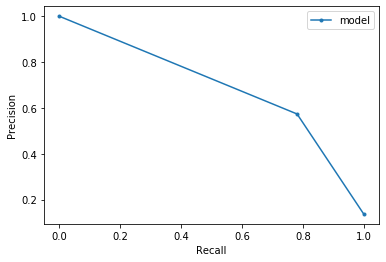

(0.7284382284382285, 250, 1825, 70, 186)

In [2116]:
evaluate(y_pred_class, y_test, y_probs)

_________
# Random Forest

In [2131]:
#instantiate model 
model = RandomForestClassifier(random_state = 42)

In [2132]:
#fit model
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [2133]:
#predict
y_preds =  cross_val_predict(model, X_val, y_val, cv=5)
y_probs = cross_val_predict(model, X_val, y_val, cv=5, method='predict_proba')[:, 1]

In [2134]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val)

Best F2 score: 0.7827102803738317 at a threshold of 0.16


(0.16, 0.7827102803738317)

In [2135]:
#make prediction for hold-out test set 
y_preds =  cross_val_predict(model, X_test, y_test, cv=5)
y_probs = cross_val_predict(model, X_test, y_test, cv=5, method='predict_proba')[:, 1]

In [2136]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.16, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1743  268]
 [  44  276]]

True Positives: 276
True Negatives: 1743
False Positives: 268
False Negatives: 44


Recall: 0.8625
Precision: 0.5073529411764706
Specificity 0.8667329686723023
F1 score: 0.638888888888889
F2 score: 0.7565789473684211


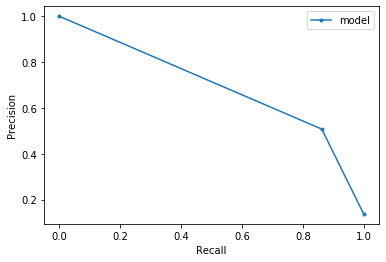

(0.7565789473684211, 276, 1743, 44, 268)

In [2137]:
evaluate(y_pred_class, y_test, y_probs)

In [2138]:
rf_space ={'n_estimators': np.arange(1, 2000, 20, dtype=int), 
        'max_depth': np.arange(1, 20, dtype=int),
        'min_samples_split': np.arange(2, 100, 10), 
        'min_samples_leaf': np.arange(1, 25, 5),
        'class_weight': ['balanced', 'balanced_subsample']}

In [1538]:
model_optimisation = RandomizedSearchCV(
            RandomForestClassifier(), 
            rf_space,  
            n_iter=250, 
            n_jobs=-1, 
            random_state = 123, 
            cv=2, 
            verbose=2)

    
best_model = model_optimisation.fit(X_train, y_train)

Fitting 2 folds for each of 250 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   47.0s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 31.3min finished


In [1539]:
best_model.best_params_

{'n_estimators': 1241,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_depth': 15,
 'class_weight': 'balanced_subsample'}

In [2139]:
best_params_ = {'n_estimators': 1241,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_depth': 15,
 'class_weight': 'balanced_subsample',
 'random_state': 42}

In [2140]:
final_model = RandomForestClassifier(**best_params_)

In [2141]:
final_model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=15, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=1241, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [2142]:
#predict
y_preds =  cross_val_predict(final_model, X_val, y_val, cv=5)
y_probs = cross_val_predict(final_model, X_val, y_val, cv=5, method='predict_proba')[:, 1]

In [2143]:
threshold_setting(y_probs, y_val)

Best F2 score: 0.7660818713450293 at a threshold of 0.21


(0.21, 0.7660818713450293)

In [2144]:
#predict on hold-out test set 
y_preds =  cross_val_predict(final_model, X_test, y_test, cv=5)
y_probs = cross_val_predict(final_model, X_test, y_test, cv=5, method='predict_proba')[:, 1]

In [2145]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.21, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1810  201]
 [  47  273]]

True Positives: 273
True Negatives: 1810
False Positives: 201
False Negatives: 47


Recall: 0.853125
Precision: 0.5759493670886076
Specificity 0.9000497265042268
F1 score: 0.6876574307304786
F2 score: 0.7782212086659066


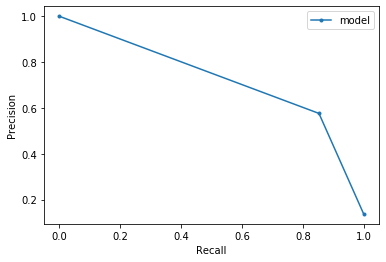

(0.7782212086659066, 273, 1810, 47, 201)

In [2146]:
evaluate(y_pred_class, y_test, y_probs)

In [2147]:
explainer = shap.TreeExplainer(final_model)

In [2148]:
shap_values = explainer.shap_values(X_train, approximate=True)

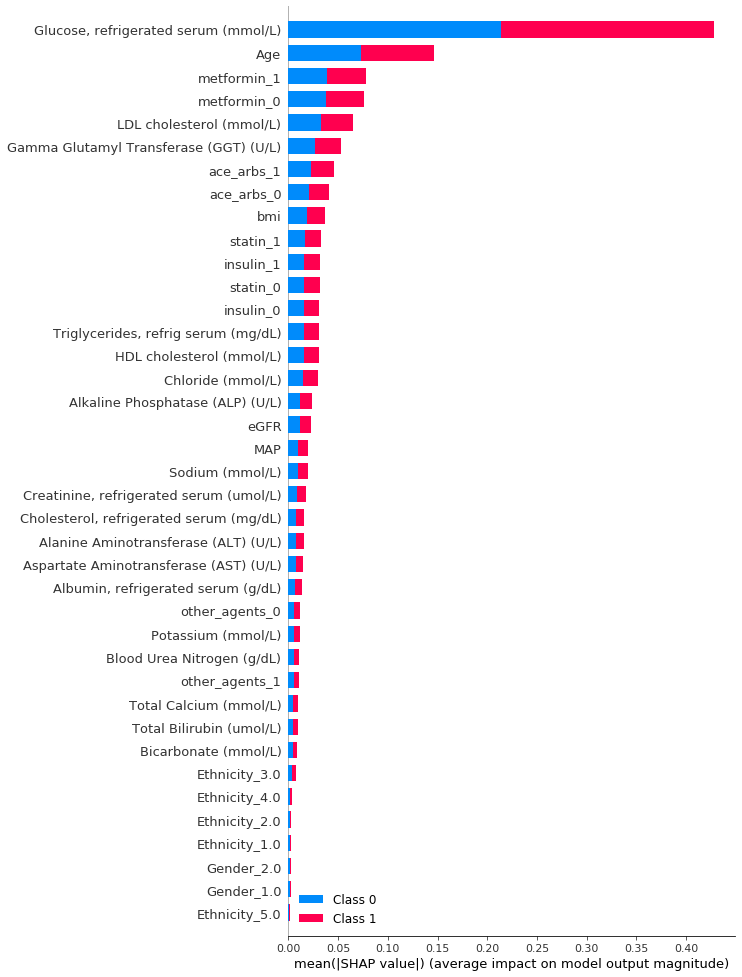

In [2149]:
shap.summary_plot(shap_values, X_train, max_display=39)

In [2150]:
vals= np.abs(shap_values[1]).mean(0)

In [2151]:
feature_importance = pd.DataFrame(list(zip(X_train.columns,vals)),columns=['col_name','feature_importance_vals'])

In [2152]:
feature_importance.sort_values(by=['feature_importance_vals'],ascending=False,inplace=True)

In [2153]:
ordered_features_rf = list(feature_importance['col_name'])

In [2154]:
ordered_features_rf

['Glucose, refrigerated serum (mmol/L)',
 'Age',
 'metformin_1',
 'metformin_0',
 'LDL cholesterol (mmol/L)',
 'Gamma Glutamyl Transferase (GGT) (U/L)',
 'ace_arbs_1',
 'ace_arbs_0',
 'bmi',
 'statin_1',
 'insulin_1',
 'statin_0',
 'insulin_0',
 'Triglycerides, refrig serum (mg/dL)',
 'HDL cholesterol (mmol/L)',
 'Chloride (mmol/L)',
 'Alkaline Phosphatase (ALP) (U/L)',
 'eGFR',
 'MAP',
 'Sodium (mmol/L)',
 'Creatinine, refrigerated serum (umol/L)',
 'Cholesterol, refrigerated serum (mg/dL)',
 'Alanine Aminotransferase (ALT) (U/L)',
 'Aspartate Aminotransferase (AST) (U/L)',
 'Albumin, refrigerated serum (g/dL)',
 'other_agents_0',
 'Potassium (mmol/L)',
 'Blood Urea Nitrogen (g/dL)',
 'other_agents_1',
 'Total Calcium (mmol/L)',
 'Total Bilirubin (umol/L)',
 'Bicarbonate (mmol/L)',
 'Ethnicity_3.0',
 'Ethnicity_4.0',
 'Ethnicity_2.0',
 'Ethnicity_1.0',
 'Gender_2.0',
 'Gender_1.0',
 'Ethnicity_5.0']

In [2155]:
def rf_process(df, features): 

    
    #prepare df 
    X = df[features]
    y = df['diagnostic_t2dm']
    
    
    #split into train-test (10% test and 15% validate)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.056, random_state=1, stratify = y_train)

    
    #scale 
    scaler = StandardScaler()

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    X_val = scaler.transform(X_val)
    
    #instantiate 
    model = RandomForestClassifier(random_state = 42)
    
    #fit 
    model.fit(X_train, y_train)
    
    #predict for validate set 
    y_preds =  cross_val_predict(model, X_val, y_val, cv=5)
    y_probs = cross_val_predict(model, X_val, y_val, cv=5, method='predict_proba')[:, 1]
    
    #select threshold based on validate dataset 
    threshold, result = threshold_setting(y_probs, y_val)
    
    #apply this threshold to the test set 
    y_preds =  cross_val_predict(model, X_test, y_test, cv=5)
    y_probs = cross_val_predict(model, X_test, y_test, cv=5, method='predict_proba')[:, 1]
    
    #apply threshold 
    y_pred_class = np.where(y_probs > threshold, 1, 0)
    
    #evaluate
    fbeta, TP, TN, FN, FP = evaluate(y_pred_class, y_test, y_probs)
    
    return(fbeta)
    


**************

TESTING: 1 features

 ['Glucose, refrigerated serum (mmol/L)']
Best F2 score: 0.6748466257668712 at a threshold of 0.13

##### Evaluating Model #####
ROC AUC SCORE: 0.89

 [[1717  294]
 [  61  259]]

True Positives: 259
True Negatives: 1717
False Positives: 294
False Negatives: 61


Recall: 0.809375
Precision: 0.46835443037974683
Specificity 0.8538040775733466
F1 score: 0.5933562428407789
F2 score: 0.7064920894708129


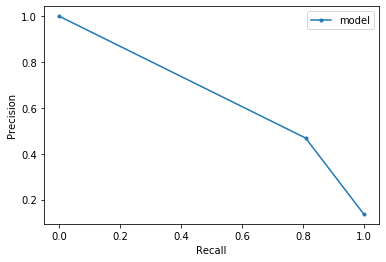

0.7064920894708129

**************

TESTING: 2 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age']
Best F2 score: 0.6674473067915692 at a threshold of 0.04

##### Evaluating Model #####
ROC AUC SCORE: 0.89

 [[1592  419]
 [  44  276]]

True Positives: 276
True Negatives: 1592
False Positives: 419
False Negatives: 44


Recall: 0.8625
Precision: 0.3971223021582734
Specificity 0.7916459472899056
F1 score: 0.5438423645320197
F2 score: 0.6987341772151898


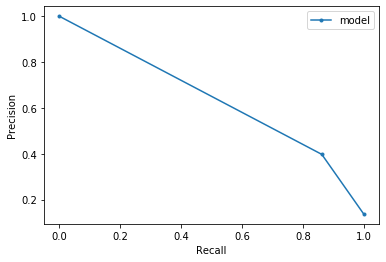

0.6987341772151898

**************

TESTING: 3 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1']
Best F2 score: 0.7317073170731707 at a threshold of 0.22

##### Evaluating Model #####
ROC AUC SCORE: 0.90

 [[1778  233]
 [  79  241]]

True Positives: 241
True Negatives: 1778
False Positives: 233
False Negatives: 79


Recall: 0.753125
Precision: 0.5084388185654009
Specificity 0.8841372451516658
F1 score: 0.6070528967254408
F2 score: 0.6870011402508551


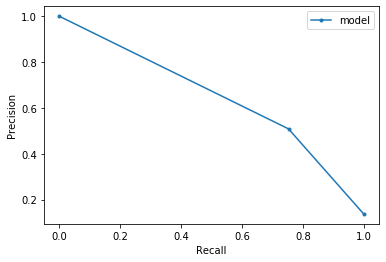

0.6870011402508551

**************

TESTING: 4 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0']
Best F2 score: 0.7291666666666667 at a threshold of 0.04

##### Evaluating Model #####
ROC AUC SCORE: 0.90

 [[1596  415]
 [  45  275]]

True Positives: 275
True Negatives: 1596
False Positives: 415
False Negatives: 45


Recall: 0.859375
Precision: 0.39855072463768115
Specificity 0.7936350074589756
F1 score: 0.5445544554455446
F2 score: 0.697969543147208


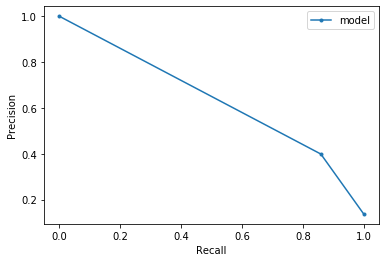

0.697969543147208

**************

TESTING: 5 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)']
Best F2 score: 0.7743097238895559 at a threshold of 0.24

##### Evaluating Model #####
ROC AUC SCORE: 0.93

 [[1865  146]
 [  67  253]]

True Positives: 253
True Negatives: 1865
False Positives: 146
False Negatives: 67


Recall: 0.790625
Precision: 0.6340852130325815
Specificity 0.9273993038289409
F1 score: 0.7037552155771906
F2 score: 0.7534246575342466


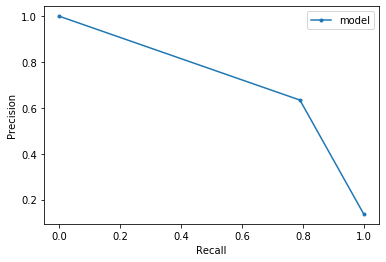

0.7534246575342466

**************

TESTING: 6 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)']
Best F2 score: 0.7595693779904307 at a threshold of 0.33

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1913   98]
 [  85  235]]

True Positives: 235
True Negatives: 1913
False Positives: 98
False Negatives: 85


Recall: 0.734375
Precision: 0.7057057057057057
Specificity 0.9512680258577823
F1 score: 0.7197549770290964
F2 score: 0.7284562926224426


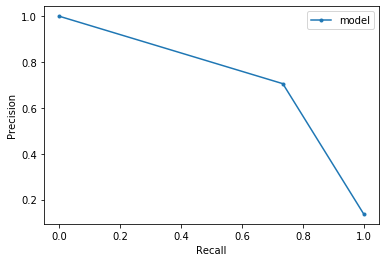

0.7284562926224426

**************

TESTING: 7 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1']
Best F2 score: 0.7678571428571428 at a threshold of 0.24

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1857  154]
 [  63  257]]

True Positives: 257
True Negatives: 1857
False Positives: 154
False Negatives: 63


Recall: 0.803125
Precision: 0.6253041362530414
Specificity 0.9234211834908006
F1 score: 0.7031463748290013
F2 score: 0.7599053814311059


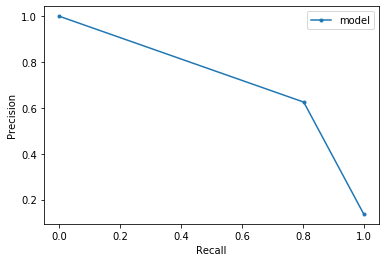

0.7599053814311059

**************

TESTING: 8 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0']
Best F2 score: 0.7586618876941458 at a threshold of 0.23

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1844  167]
 [  62  258]]

True Positives: 258
True Negatives: 1844
False Positives: 167
False Negatives: 62


Recall: 0.80625
Precision: 0.6070588235294118
Specificity 0.9169567379413227
F1 score: 0.6926174496644296
F2 score: 0.7565982404692082


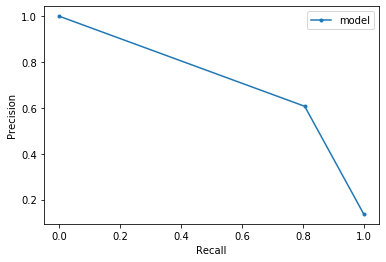

0.7565982404692082

**************

TESTING: 9 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi']
Best F2 score: 0.7719714964370545 at a threshold of 0.25

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1876  135]
 [  66  254]]

True Positives: 254
True Negatives: 1876
False Positives: 135
False Negatives: 66


Recall: 0.79375
Precision: 0.6529562982005142
Specificity 0.9328692192938837
F1 score: 0.7165021156558533
F2 score: 0.7609346914319951


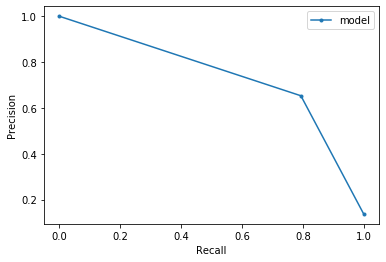

0.7609346914319951

**************

TESTING: 10 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1']
Best F2 score: 0.7429245283018868 at a threshold of 0.2

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1813  198]
 [  50  270]]

True Positives: 270
True Negatives: 1813
False Positives: 198
False Negatives: 50


Recall: 0.84375
Precision: 0.5769230769230769
Specificity 0.9015415216310293
F1 score: 0.6852791878172588
F2 score: 0.7723112128146452


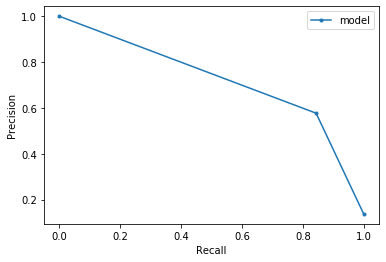

0.7723112128146452

**************

TESTING: 11 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1']
Best F2 score: 0.7624113475177304 at a threshold of 0.08

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1614  397]
 [  23  297]]

True Positives: 297
True Negatives: 1614
False Positives: 397
False Negatives: 23


Recall: 0.928125
Precision: 0.42795389048991356
Specificity 0.8025857782197912
F1 score: 0.5857988165680473
F2 score: 0.7522796352583587


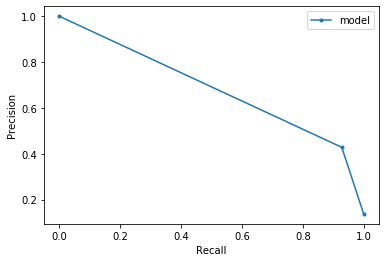

0.7522796352583587

**************

TESTING: 12 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0']
Best F2 score: 0.7511737089201878 at a threshold of 0.16

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1771  240]
 [  43  277]]

True Positives: 277
True Negatives: 1771
False Positives: 240
False Negatives: 43


Recall: 0.865625
Precision: 0.5357833655705996
Specificity 0.8806563898557931
F1 score: 0.6618876941457587
F2 score: 0.7707289927657206


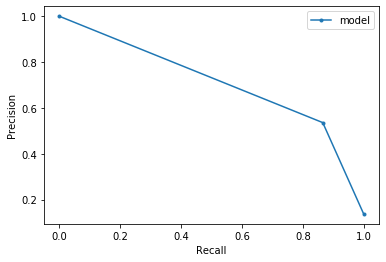

0.7707289927657206

**************

TESTING: 13 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0']
Best F2 score: 0.7714958775029447 at a threshold of 0.19

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1801  210]
 [  53  267]]

True Positives: 267
True Negatives: 1801
False Positives: 210
False Negatives: 53


Recall: 0.834375
Precision: 0.559748427672956
Specificity 0.895574341123819
F1 score: 0.6700125470514429
F2 score: 0.7598178713716562


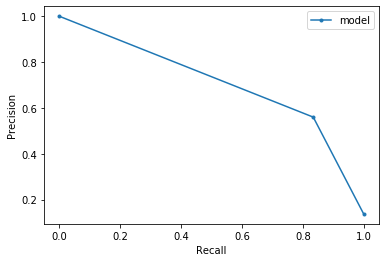

0.7598178713716562

**************

TESTING: 14 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)']
Best F2 score: 0.7505910165484634 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1770  241]
 [  49  271]]

True Positives: 271
True Negatives: 1770
False Positives: 241
False Negatives: 49


Recall: 0.846875
Precision: 0.529296875
Specificity 0.8801591248135257
F1 score: 0.6514423076923077
F2 score: 0.7561383928571429


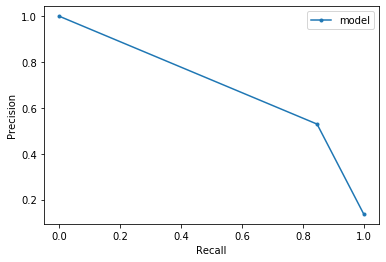

0.7561383928571429

**************

TESTING: 15 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)']
Best F2 score: 0.7687793427230047 at a threshold of 0.2

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1816  195]
 [  49  271]]

True Positives: 271
True Negatives: 1816
False Positives: 195
False Negatives: 49


Recall: 0.846875
Precision: 0.5815450643776824
Specificity 0.9030333167578319
F1 score: 0.6895674300254454
F2 score: 0.7760595647193586


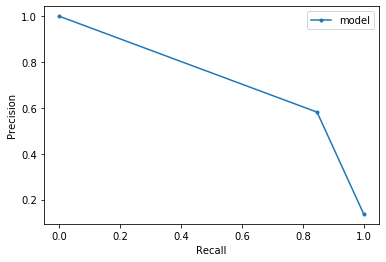

0.7760595647193586

**************

TESTING: 16 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)']
Best F2 score: 0.7903981264637002 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1783  228]
 [  52  268]]

True Positives: 268
True Negatives: 1783
False Positives: 228
False Negatives: 52


Recall: 0.8375
Precision: 0.5403225806451613
Specificity 0.8866235703630034
F1 score: 0.6568627450980392
F2 score: 0.7545045045045045


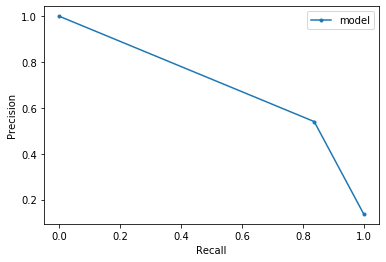

0.7545045045045045

**************

TESTING: 17 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)']
Best F2 score: 0.7692307692307693 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1758  253]
 [  51  269]]

True Positives: 269
True Negatives: 1758
False Positives: 253
False Negatives: 51


Recall: 0.840625
Precision: 0.5153256704980843
Specificity 0.8741919443063153
F1 score: 0.63895486935867
F2 score: 0.7463928967813542


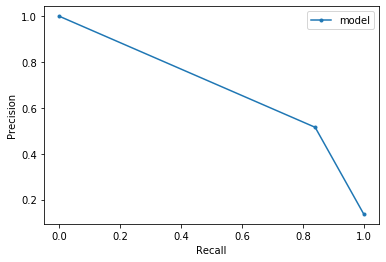

0.7463928967813542

**************

TESTING: 18 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR']
Best F2 score: 0.7728337236533958 at a threshold of 0.21

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1827  184]
 [  58  262]]

True Positives: 262
True Negatives: 1827
False Positives: 184
False Negatives: 58


Recall: 0.81875
Precision: 0.5874439461883408
Specificity 0.9085032322227747
F1 score: 0.6840731070496083
F2 score: 0.7589803012746233


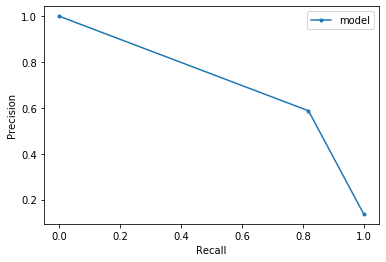

0.7589803012746233

**************

TESTING: 19 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP']
Best F2 score: 0.7805164319248826 at a threshold of 0.12

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1687  324]
 [  37  283]]

True Positives: 283
True Negatives: 1687
False Positives: 324
False Negatives: 37


Recall: 0.884375
Precision: 0.46622734761120266
Specificity 0.8388861263053208
F1 score: 0.610571736785329
F2 score: 0.749867514573397


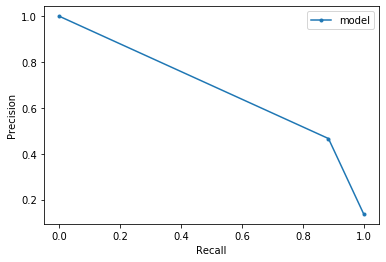

0.749867514573397

**************

TESTING: 20 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)']
Best F2 score: 0.7696827262044653 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1715  296]
 [  41  279]]

True Positives: 279
True Negatives: 1715
False Positives: 296
False Negatives: 41


Recall: 0.871875
Precision: 0.4852173913043478
Specificity 0.8528095474888115
F1 score: 0.623463687150838
F2 score: 0.7520215633423178


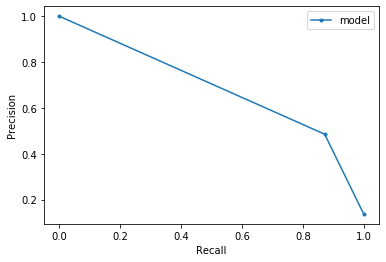

0.7520215633423178

**************

TESTING: 21 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)']
Best F2 score: 0.7783018867924529 at a threshold of 0.19

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1785  226]
 [  48  272]]

True Positives: 272
True Negatives: 1785
False Positives: 226
False Negatives: 48


Recall: 0.85
Precision: 0.5461847389558233
Specificity 0.8876181004475385
F1 score: 0.6650366748166259
F2 score: 0.764904386951631


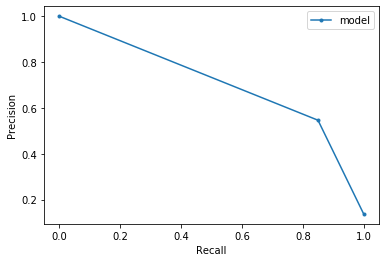

0.764904386951631

**************

TESTING: 22 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)']
Best F2 score: 0.7777777777777778 at a threshold of 0.2

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1794  217]
 [  56  264]]

True Positives: 264
True Negatives: 1794
False Positives: 217
False Negatives: 56


Recall: 0.825
Precision: 0.5488565488565489
Specificity 0.8920934858279463
F1 score: 0.6591760299625469
F2 score: 0.7495741056218057


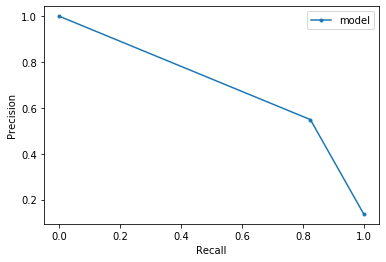

0.7495741056218057

**************

TESTING: 23 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)']
Best F2 score: 0.8002336448598132 at a threshold of 0.2

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1788  223]
 [  53  267]]

True Positives: 267
True Negatives: 1788
False Positives: 223
False Negatives: 53


Recall: 0.834375
Precision: 0.5448979591836735
Specificity 0.8891098955743412
F1 score: 0.6592592592592592
F2 score: 0.7542372881355932


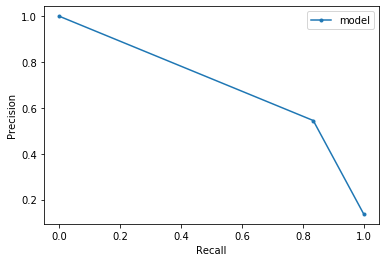

0.7542372881355932

**************

TESTING: 24 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)']
Best F2 score: 0.7928240740740741 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1754  257]
 [  50  270]]

True Positives: 270
True Negatives: 1754
False Positives: 257
False Negatives: 50


Recall: 0.84375
Precision: 0.5123339658444023
Specificity 0.8722028841372451
F1 score: 0.6375442739079102
F2 score: 0.7470946319867182


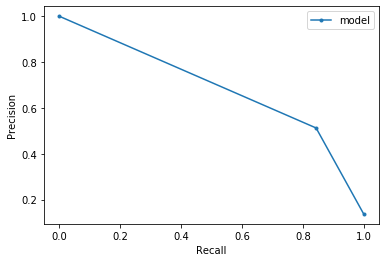

0.7470946319867182

**************

TESTING: 25 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)']
Best F2 score: 0.7647058823529411 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1753  258]
 [  48  272]]

True Positives: 272
True Negatives: 1753
False Positives: 258
False Negatives: 48


Recall: 0.85
Precision: 0.5132075471698113
Specificity 0.8717056190949776
F1 score: 0.64
F2 score: 0.7513812154696132


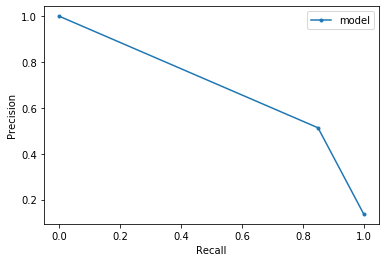

0.7513812154696132

**************

TESTING: 26 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0']
Best F2 score: 0.7783018867924529 at a threshold of 0.16

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1747  264]
 [  46  274]]

True Positives: 274
True Negatives: 1747
False Positives: 264
False Negatives: 46


Recall: 0.85625
Precision: 0.5092936802973977
Specificity 0.8687220288413725
F1 score: 0.6386946386946387

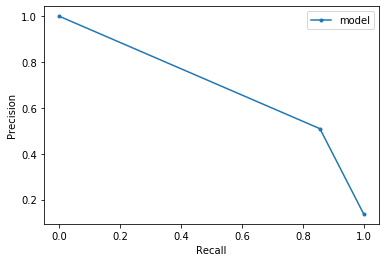

0.7535753575357534

**************

TESTING: 27 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)']
Best F2 score: 0.7983682983682984 at a threshold of 0.23

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1831  180]
 [  66  254]]

True Positives: 254
True Negatives: 1831
False Positives: 180
False Negatives: 66


Recall: 0.79375
Precision: 0.5852534562211982
Specificity 0.9104922923918448
F1 sco

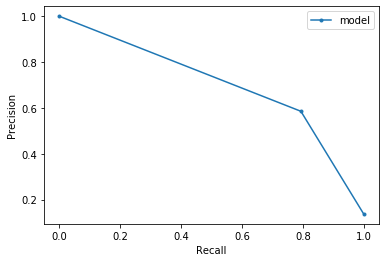

0.7409568261376897

**************

TESTING: 28 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)']
Best F2 score: 0.783625730994152 at a threshold of 0.2

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1793  218]
 [  52  268]]

True Positives: 268
True Negatives: 1793
False Positives: 218
False Negatives: 52


Recall: 0.8375
Precision: 0.551440329218107
Specificity

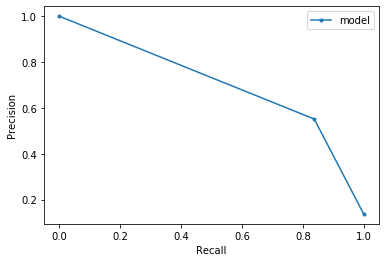

0.7587768969422425

**************

TESTING: 29 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1']
Best F2 score: 0.7879490150637312 at a threshold of 0.21

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1810  201]
 [  52  268]]

True Positives: 268
True Negatives: 1810
False Positives: 201
False Negatives: 52


Recall: 0.8375
Precision: 0.5714285

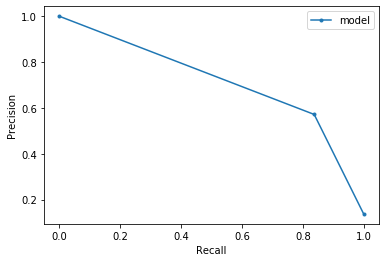

0.7661520869068039

**************

TESTING: 30 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)']
Best F2 score: 0.7786885245901639 at a threshold of 0.19

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1784  227]
 [  50  270]]

True Positives: 270
True Negatives: 1784
False Positives: 227
False Negatives: 50


Recall: 0

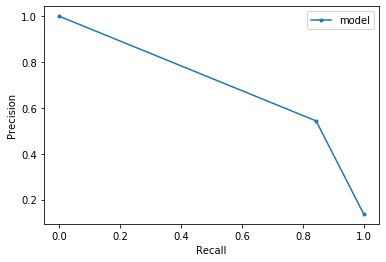

0.7597073719752392

**************

TESTING: 31 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)']
Best F2 score: 0.8034682080924855 at a threshold of 0.25

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1856  155]
 [  64  256]]

True Positives: 256
True Negatives: 1856
False Positives: 155
Fal

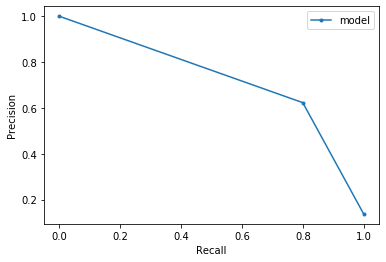

0.7569485511531638

**************

TESTING: 32 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'Bicarbonate (mmol/L)']
Best F2 score: 0.7808857808857809 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1767  244]
 [  48  272]]

True Positives: 272
True Negatives: 1767


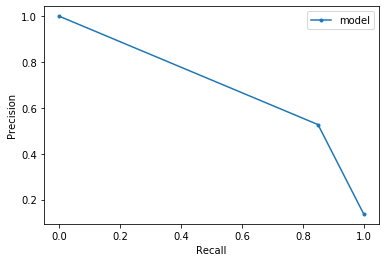

0.7572383073496658

**************

TESTING: 33 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'Bicarbonate (mmol/L)', 'Ethnicity_3.0']
Best F2 score: 0.7946635730858469 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1703  308]
 [  36  284]]

True Positives: 284
True

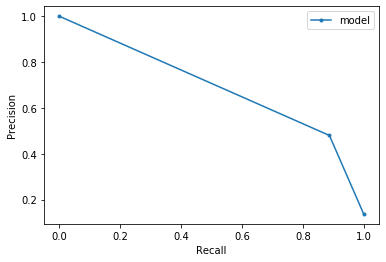

0.7585470085470085

**************

TESTING: 34 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'Bicarbonate (mmol/L)', 'Ethnicity_3.0', 'Ethnicity_4.0']
Best F2 score: 0.7848837209302326 at a threshold of 0.19

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1797  214]
 [  54  266]]

True Po

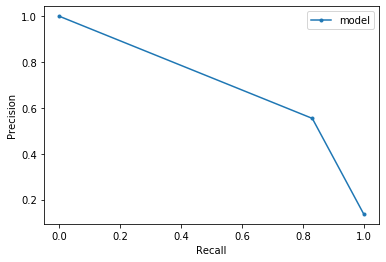

0.7556818181818183

**************

TESTING: 35 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'Bicarbonate (mmol/L)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'Ethnicity_2.0']
Best F2 score: 0.7976878612716762 at a threshold of 0.22

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1827  184]
 [  6

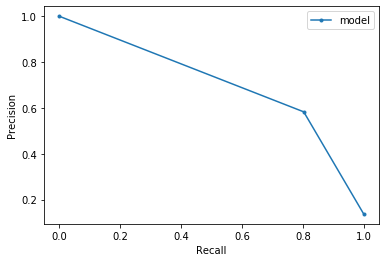

0.746658919233004

**************

TESTING: 36 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'Bicarbonate (mmol/L)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'Ethnicity_2.0', 'Ethnicity_1.0']
Best F2 score: 0.7986111111111112 at a threshold of 0.26

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[

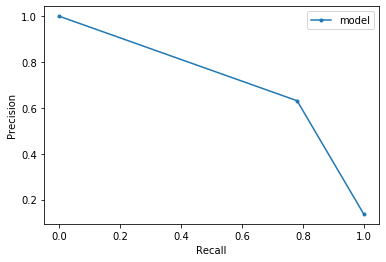

0.7458233890214797

**************

TESTING: 37 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'Bicarbonate (mmol/L)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'Ethnicity_2.0', 'Ethnicity_1.0', 'Gender_2.0']
Best F2 score: 0.8034682080924855 at a threshold of 0.25

##### Evaluating Model #####
ROC AUC S

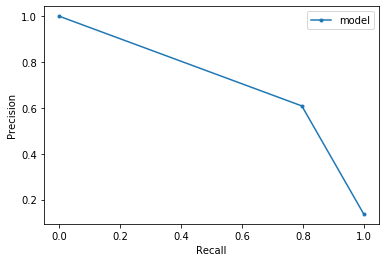

0.7504414361389051

**************

TESTING: 38 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'metformin_1', 'metformin_0', 'LDL cholesterol (mmol/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'ace_arbs_1', 'ace_arbs_0', 'bmi', 'statin_1', 'insulin_1', 'statin_0', 'insulin_0', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'Alkaline Phosphatase (ALP) (U/L)', 'eGFR', 'MAP', 'Sodium (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alanine Aminotransferase (ALT) (U/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Albumin, refrigerated serum (g/dL)', 'other_agents_0', 'Potassium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents_1', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'Bicarbonate (mmol/L)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'Ethnicity_2.0', 'Ethnicity_1.0', 'Gender_2.0', 'Gender_1.0']
Best F2 score: 0.7946635730858469 at a threshold of 0.22

##### Evaluating Model #

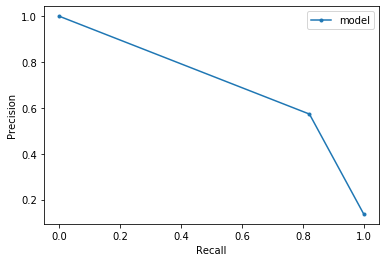

0.7561817136285223


In [2156]:
outcomes = dict()

for i in enumerate(ordered_features_rf): 
    feature_index = i[0]
    features = ordered_features_rf[:feature_index]
    
    if feature_index == 0: 
        pass
    else: 
        print('\n**************')
        print('\nTESTING:', feature_index, 'features')
        print('\n', features)
        fbeta = rf_process(df, features)
        print(fbeta)
        outcomes[feature_index] = fbeta

In [2157]:
outcomes_df = pd.DataFrame.from_dict(outcomes, orient='index').reset_index()

In [2158]:
outcomes_df.columns = ['feature_selection', 'f2']

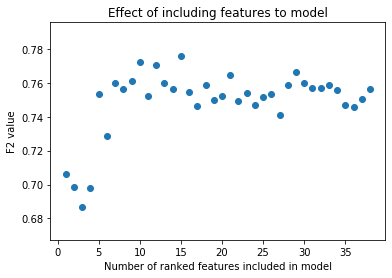

In [2159]:
plt.scatter(outcomes_df['feature_selection'], outcomes_df['f2'])
plt.xlabel('Number of ranked features included in model')
plt.ylabel('F2 value')
plt.title('Effect of including features to model')
plt.savefig('feature_selection.png')

In [2160]:
import operator
max(outcomes.items(), key=operator.itemgetter(1))[0]

15

In [2161]:
rf_features = ordered_features_rf[0:15]
rf_features

['Glucose, refrigerated serum (mmol/L)',
 'Age',
 'metformin_1',
 'metformin_0',
 'LDL cholesterol (mmol/L)',
 'Gamma Glutamyl Transferase (GGT) (U/L)',
 'ace_arbs_1',
 'ace_arbs_0',
 'bmi',
 'statin_1',
 'insulin_1',
 'statin_0',
 'insulin_0',
 'Triglycerides, refrig serum (mg/dL)',
 'HDL cholesterol (mmol/L)']

In [2162]:
#final model 

In [2163]:
df = pd.read_csv('nhanes_extracted.csv')
df.drop(columns = ['Unnamed: 0'], axis=1, inplace=True)

In [2164]:
df.dropna(how='all', subset=labs, inplace=True)

In [2165]:
df.dropna(how='all', subset=diabetes_tests, inplace=True)

In [2166]:
#fill missing data with out-of-sample 
df.fillna(-999, inplace=True)

In [2167]:
#one-hot-encoding of categorical variables
df = pd.get_dummies(df, columns = ['Gender', 'Ethnicity', 'other_agents', 'metformin', 'insulin', 'statin', 'ace_arbs'])

In [2168]:
#target and feature selection 
y_rf = df['diagnostic_t2dm']
X_rf = df[rf_features]

In [2169]:
#split train-val-test datasets (85%, 5%, 10% respectively)

X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.1, random_state=1, stratify=y_rf)
X_train_rf, X_val_rf, y_train_rf, y_val_rf = train_test_split(X_train_rf, y_train_rf, test_size=0.056, random_state=1, stratify = y_train_rf)

In [2170]:
#scale data 
scaler = StandardScaler()

X_train_rf = pd.DataFrame(scaler.fit_transform(X_train_rf), columns = X_rf.columns)
X_test_rf = pd.DataFrame(scaler.transform(X_test_rf), columns=X_rf.columns)
X_val_rf = pd.DataFrame(scaler.transform(X_val_rf), columns=X_rf.columns)

In [2171]:
#instantiate model 
model = RandomForestClassifier(random_state = 42)

In [2172]:
model.fit(X_train_rf, y_train_rf)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [2173]:
#predict
y_preds =  cross_val_predict(model, X_val_rf, y_val_rf, cv=5)
y_probs = cross_val_predict(model, X_val_rf, y_val_rf, cv=5, method='predict_proba')[:, 1]

In [2174]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val_rf)

Best F2 score: 0.7687793427230047 at a threshold of 0.2


(0.2, 0.7687793427230047)

In [2175]:
#make prediction for hold-out test set 
y_preds =  cross_val_predict(model, X_test_rf, y_test_rf, cv=5)
y_probs = cross_val_predict(model, X_test_rf, y_test_rf, cv=5, method='predict_proba')[:, 1]

In [2176]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.2, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1816  195]
 [  49  271]]

True Positives: 271
True Negatives: 1816
False Positives: 195
False Negatives: 49


Recall: 0.846875
Precision: 0.5815450643776824
Specificity 0.9030333167578319
F1 score: 0.6895674300254454
F2 score: 0.7760595647193586


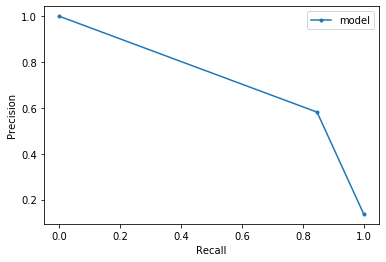

(0.7760595647193586, 271, 1816, 49, 195)

In [2177]:
evaluate(y_pred_class, y_test_rf, y_probs)

In [1584]:
model_optimisation = RandomizedSearchCV(
            RandomForestClassifier(), 
            rf_space,  
            n_iter=250, 
            n_jobs=-1, 
            random_state = 123, 
            cv=2, 
            verbose=2)

    
best_model = model_optimisation.fit(X_train_rf, y_train_rf)

Fitting 2 folds for each of 250 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   35.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 21.2min finished


In [1585]:
best_model.best_params_

{'n_estimators': 1241,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_depth': 15,
 'class_weight': 'balanced_subsample'}

In [2178]:
best_params_ = {'n_estimators': 1241,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_depth': 15,
 'class_weight': 'balanced_subsample',
 'random_state': 42}

In [2179]:
final_model = RandomForestClassifier(**best_params_)

In [2180]:
final_model.fit(X_train_rf, y_train_rf)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=15, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=1241, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [2181]:
#predict
y_preds =  cross_val_predict(final_model, X_val_rf, y_val_rf, cv=5)
y_probs = cross_val_predict(final_model, X_val_rf, y_val_rf, cv=5, method='predict_proba')[:, 1]

In [2182]:
threshold_setting(y_probs, y_val_rf)

Best F2 score: 0.7692307692307692 at a threshold of 0.16


(0.16, 0.7692307692307692)

In [2183]:
#predict on hold-out test set 
y_preds =  cross_val_predict(final_model, X_test_rf, y_test_rf, cv=5)
y_probs = cross_val_predict(final_model, X_test_rf, y_test_rf, cv=5, method='predict_proba')[:, 1]

In [2184]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.16, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1755  256]
 [  39  281]]

True Positives: 281
True Negatives: 1755
False Positives: 256
False Negatives: 39


Recall: 0.878125
Precision: 0.5232774674115456
Specificity 0.8727001491795127
F1 score: 0.6557759626604435
F2 score: 0.7732526141992294


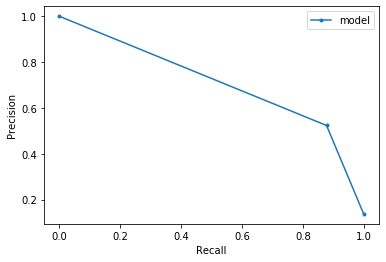

(0.7732526141992294, 281, 1755, 39, 256)

In [2185]:
evaluate(y_pred_class, y_test_rf, y_probs)

_________
# XGBoost 

In [2186]:
#instantiate model 
model = xgb.XGBClassifier(random_state = 42) 

In [2187]:
#fit model
model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [2188]:
#predict
y_preds =  cross_val_predict(model, X_val, y_val, cv=5)
y_probs = cross_val_predict(model, X_val, y_val, cv=5, method='predict_proba')[:, 1]

In [2189]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val)

Best F2 score: 0.7827669902912621 at a threshold of 0.18


(0.18, 0.7827669902912621)

In [2190]:
#make prediction from the test set 
y_preds =  cross_val_predict(model, X_test, y_test, cv=5)
y_probs = cross_val_predict(model, X_test, y_test, cv=5, method='predict_proba')[:, 1]

In [2191]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.18, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1878  133]
 [  64  256]]

True Positives: 256
True Negatives: 1878
False Positives: 133
False Negatives: 64


Recall: 0.8
Precision: 0.6580976863753213
Specificity 0.9338637493784187
F1 score: 0.7221438645980253
F2 score: 0.7669263031755541


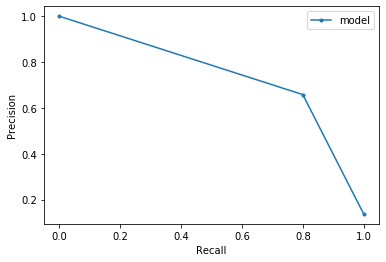

(0.7669263031755541, 256, 1878, 64, 133)

In [2192]:
evaluate(y_pred_class, y_test, y_probs)

In [1616]:
xgb_space ={'n_estimators': np.arange(1, 2000, 20, dtype=int),
        'learning_rate': np.linspace(0.0001, 0.9), 
        'max_depth': np.arange(1, 20, dtype=int),
        'subsample': np.arange(0.7, 1, 0.05),
        'gamma': np.arange(0.5, 1, 0.05),
        'colsample_bytree': np.arange(0.7, 1, 0.05),
        'reg_alpha' :  np.arange(0, 10, 1),
        'reg_lambda': np.arange(1, 2, 0.1), 
        'scale_pos_weight': np.arange(1, 100, 2)}

In [1617]:
model_optimisation = RandomizedSearchCV(
            xgb.XGBClassifier(), 
            xgb_space,  
            n_iter=200, 
            n_jobs=-1, 
            random_state = 42, 
            cv=2, 
            verbose=2)

    
best_model = model_optimisation.fit(X_train, y_train)
    

Fitting 2 folds for each of 200 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 24.3min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 60.2min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 67.5min finished


In [1618]:
best_model.best_params_

{'subsample': 0.8,
 'scale_pos_weight': 1,
 'reg_lambda': 1.4000000000000004,
 'reg_alpha': 2,
 'n_estimators': 1801,
 'max_depth': 14,
 'learning_rate': 0.4408673469387755,
 'gamma': 0.5,
 'colsample_bytree': 0.7}

In [2193]:
best_params_ = {'subsample': 0.8,
 'scale_pos_weight': 1,
 'reg_lambda': 1.4000000000000004,
 'reg_alpha': 2,
 'n_estimators': 1801,
 'max_depth': 14,
 'learning_rate': 0.4408673469387755,
 'gamma': 0.5,
 'colsample_bytree': 0.7,
'random_state': 42}

In [2194]:
final_model = xgb.XGBClassifier(**best_params_)

In [2195]:
final_model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0.5,
              learning_rate=0.4408673469387755, max_delta_step=0, max_depth=14,
              min_child_weight=1, missing=None, n_estimators=1801, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=2, reg_lambda=1.4000000000000004, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [2196]:
#predict
y_preds =  cross_val_predict(final_model, X_val, y_val, cv=5)
y_probs = cross_val_predict(final_model, X_val, y_val, cv=5, method='predict_proba')[:, 1]

In [2197]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val)

Best F2 score: 0.7343941248470012 at a threshold of 0.1


(0.1, 0.7343941248470012)

In [2198]:
#make prediction from the test set 
y_preds =  cross_val_predict(final_model, X_test, y_test, cv=5)
y_probs = cross_val_predict(final_model, X_test, y_test, cv=5, method='predict_proba')[:, 1]

In [2199]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.1, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.93

 [[1823  188]
 [  58  262]]

True Positives: 262
True Negatives: 1823
False Positives: 188
False Negatives: 58


Recall: 0.81875
Precision: 0.5822222222222222
Specificity 0.9065141720537047
F1 score: 0.6805194805194804
F2 score: 0.7572254335260116


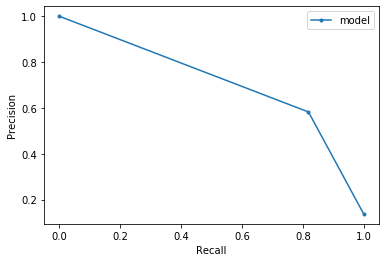

(0.7572254335260116, 262, 1823, 58, 188)

In [2200]:
evaluate(y_pred_class, y_test, y_probs)

In [2201]:
explainer = shap.TreeExplainer(final_model)

In [2202]:
shap_values = explainer.shap_values(X_train, approximate=True)

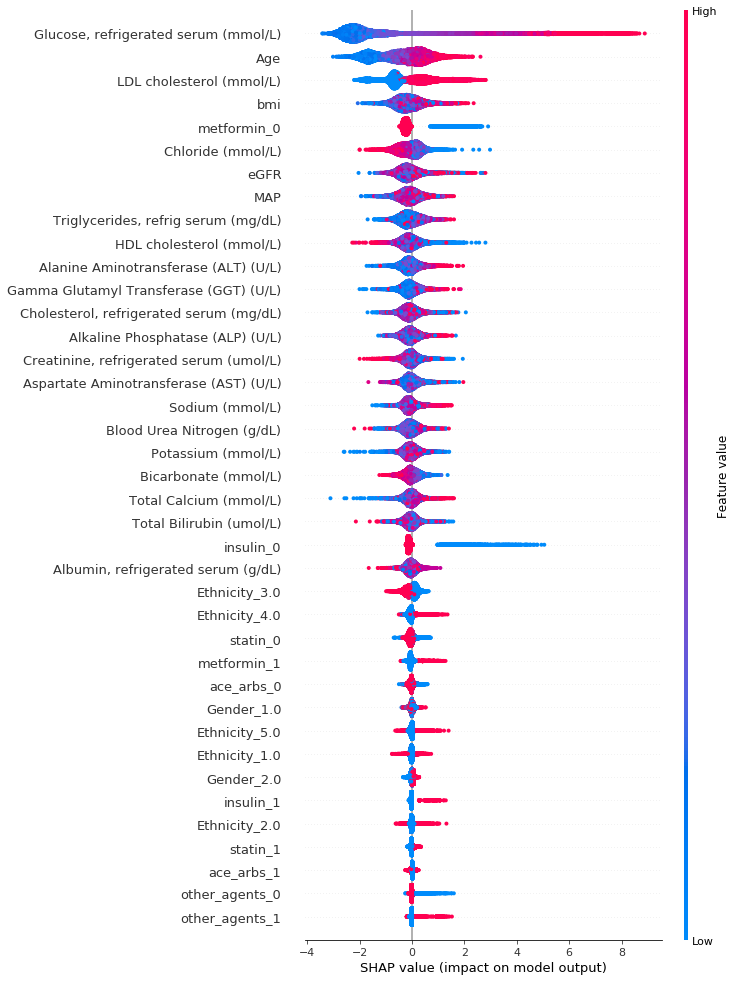

In [2203]:
shap.summary_plot(shap_values, X_train, max_display=39)

In [2204]:
feature_importance = {}

for i in enumerate(X_train.columns): 
    
    feature_importance[i[1]] = np.mean(np.abs([item[i[0]] for item in shap_values]))

In [2205]:
feature_importance = pd.DataFrame.from_dict(feature_importance, orient='index').reset_index()

In [2206]:
feature_importance.columns = ['Feature', 'SHAP value']

In [2207]:
feature_importance.sort_values(by=['SHAP value'],ascending=False,inplace=True)

In [2208]:
ordered_features_xgb = list(feature_importance['Feature'])

In [2209]:
df.shape

(23310, 52)

In [2210]:
def xgb_process(df, features): 

    
    #prepare df 
    X = df[features]
    y = df['diagnostic_t2dm']
    
    
    #split into train-test (10% test and 15% validate)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.056, random_state=1, stratify = y_train)

    
    #scale 
    scaler = StandardScaler()

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    X_val = scaler.transform(X_val)
    
    #instantiate 
    model = xgb.XGBClassifier(random_state = 42)
    
    #fit 
    model.fit(X_train, y_train)
    
    #predict for validate set 
    y_preds =  cross_val_predict(model, X_val, y_val, cv=5)
    y_probs = cross_val_predict(model, X_val, y_val, cv=5, method='predict_proba')[:, 1]
    
    #select threshold based on validate dataset 
    threshold, result = threshold_setting(y_probs, y_val)
    
    #apply this threshold to the test set 
    y_preds =  cross_val_predict(model, X_test, y_test, cv=5)
    y_probs = cross_val_predict(model, X_test, y_test, cv=5, method='predict_proba')[:, 1]
    
    #apply threshold 
    y_pred_class = np.where(y_probs > threshold, 1, 0)
    
    #evaluate
    fbeta, TP, TN, FN, FP = evaluate(y_pred_class, y_test, y_probs)
    
    return(fbeta)


**************

TESTING: 1 features

 ['Glucose, refrigerated serum (mmol/L)']
Best F2 score: 0.7333333333333333 at a threshold of 0.12

##### Evaluating Model #####
ROC AUC SCORE: 0.90

 [[1696  315]
 [  50  270]]

True Positives: 270
True Negatives: 1696
False Positives: 315
False Negatives: 50


Recall: 0.84375
Precision: 0.46153846153846156
Specificity 0.8433615116857285
F1 score: 0.5966850828729281
F2 score: 0.7238605898123325


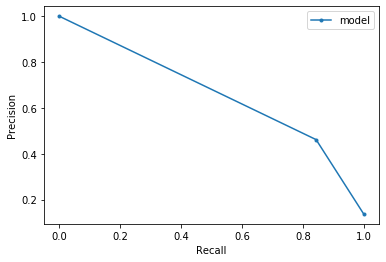

0.7238605898123325

**************

TESTING: 2 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age']
Best F2 score: 0.7168674698795179 at a threshold of 0.06

##### Evaluating Model #####
ROC AUC SCORE: 0.92

 [[1550  461]
 [  35  285]]

True Positives: 285
True Negatives: 1550
False Positives: 461
False Negatives: 35


Recall: 0.890625
Precision: 0.3820375335120643
Specificity 0.7707608155146694
F1 score: 0.5347091932457786
F2 score: 0.7033563672260612


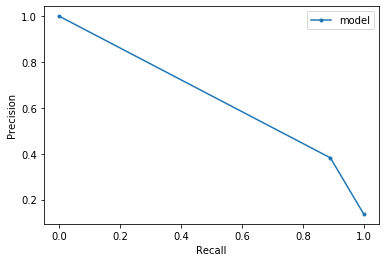

0.7033563672260612

**************

TESTING: 3 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)']
Best F2 score: 0.7020757020757021 at a threshold of 0.09

##### Evaluating Model #####
ROC AUC SCORE: 0.93

 [[1695  316]
 [  47  273]]

True Positives: 273
True Negatives: 1695
False Positives: 316
False Negatives: 47


Recall: 0.853125
Precision: 0.4634974533106961
Specificity 0.8428642466434609
F1 score: 0.6006600660066007
F2 score: 0.7303370786516854


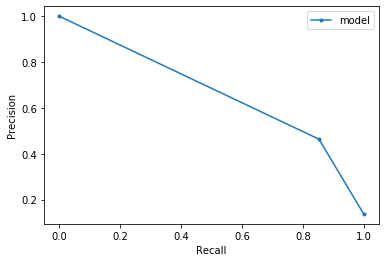

0.7303370786516854

**************

TESTING: 4 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi']
Best F2 score: 0.7256097560975608 at a threshold of 0.15

##### Evaluating Model #####
ROC AUC SCORE: 0.93

 [[1821  190]
 [  62  258]]

True Positives: 258
True Negatives: 1821
False Positives: 190
False Negatives: 62


Recall: 0.80625
Precision: 0.5758928571428571
Specificity 0.9055196419691696
F1 score: 0.671875
F2 score: 0.7465277777777778


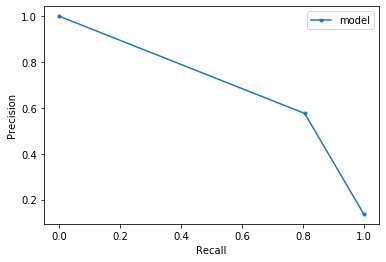

0.7465277777777778

**************

TESTING: 5 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0']
Best F2 score: 0.7579462102689486 at a threshold of 0.24

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1908  103]
 [  67  253]]

True Positives: 253
True Negatives: 1908
False Positives: 103
False Negatives: 67


Recall: 0.790625
Precision: 0.7106741573033708
Specificity 0.9487817006464445
F1 score: 0.7485207100591716
F2 score: 0.7732273838630807


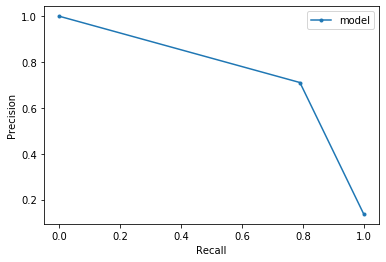

0.7732273838630807

**************

TESTING: 6 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)']
Best F2 score: 0.7776427703523693 at a threshold of 0.16

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1847  164]
 [  60  260]]

True Positives: 260
True Negatives: 1847
False Positives: 164
False Negatives: 60


Recall: 0.8125
Precision: 0.6132075471698113
Specificity 0.9184485330681254
F1 score: 0.6989247311827956
F2 score: 0.7629107981220657


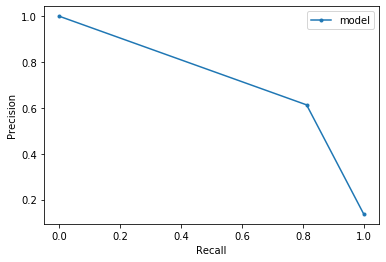

0.7629107981220657

**************

TESTING: 7 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR']
Best F2 score: 0.783132530120482 at a threshold of 0.21

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1888  123]
 [  73  247]]

True Positives: 247
True Negatives: 1888
False Positives: 123
False Negatives: 73


Recall: 0.771875
Precision: 0.6675675675675675
Specificity 0.938836399801094
F1 score: 0.7159420289855072
F2 score: 0.7484848484848484


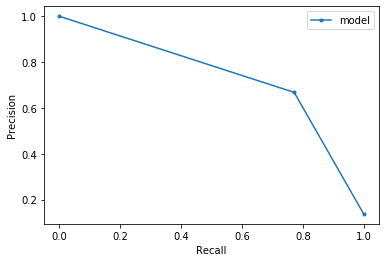

0.7484848484848484

**************

TESTING: 8 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP']
Best F2 score: 0.7645631067961166 at a threshold of 0.16

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1840  171]
 [  60  260]]

True Positives: 260
True Negatives: 1840
False Positives: 171
False Negatives: 60


Recall: 0.8125
Precision: 0.6032482598607889
Specificity 0.9149676777722526
F1 score: 0.6924101198402131
F2 score: 0.7597895967270601


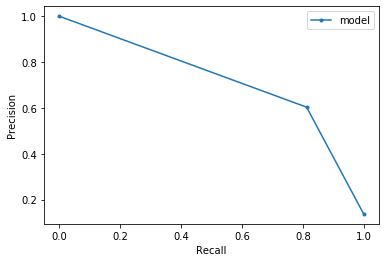

0.7597895967270601

**************

TESTING: 9 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)']
Best F2 score: 0.7818181818181817 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1853  158]
 [  61  259]]

True Positives: 259
True Negatives: 1853
False Positives: 158
False Negatives: 61


Recall: 0.809375
Precision: 0.6211031175059952
Specificity 0.9214321233217305
F1 score: 0.7028493894165536
F2 score: 0.7631113730111962


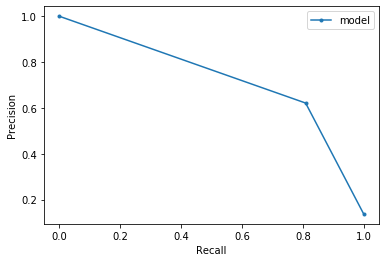

0.7631113730111962

**************

TESTING: 10 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)']
Best F2 score: 0.7757575757575758 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1817  194]
 [  55  265]]

True Positives: 265
True Negatives: 1817
False Positives: 194
False Negatives: 55


Recall: 0.828125
Precision: 0.5773420479302832
Specificity 0.9035305818000995
F1 score: 0.6803594351732991
F2 score: 0.7619321449108682


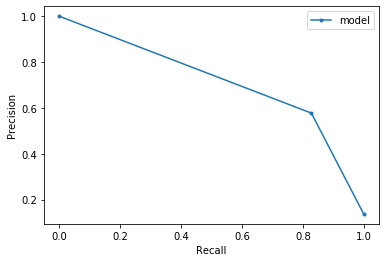

0.7619321449108682

**************

TESTING: 11 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)']
Best F2 score: 0.7776427703523693 at a threshold of 0.16

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1848  163]
 [  59  261]]

True Positives: 261
True Negatives: 1848
False Positives: 163
False Negatives: 59


Recall: 0.815625
Precision: 0.6155660377358491
Specificity 0.9189457981103928
F1 score: 0.7016129032258065
F2 score: 0.7658450704225352


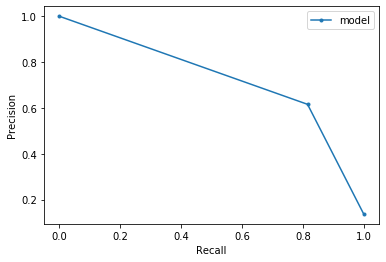

0.7658450704225352

**************

TESTING: 12 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)']
Best F2 score: 0.7734470158343484 at a threshold of 0.1

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1753  258]
 [  44  276]]

True Positives: 276
True Negatives: 1753
False Positives: 258
False Negatives: 44


Recall: 0.8625
Precision: 0.5168539325842697
Specificity 0.8717056190949776
F1 score: 0.6463700234192038
F2 score: 0.7607497243660419


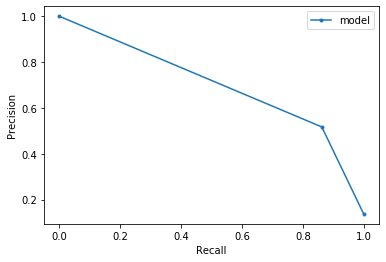

0.7607497243660419

**************

TESTING: 13 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)']
Best F2 score: 0.7720588235294118 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1860  151]
 [  61  259]]

True Positives: 259
True Negatives: 1860
False Positives: 151
False Negatives: 61


Recall: 0.809375
Precision: 0.6317073170731707
Specificity 0.9249129786176031
F1 score: 0.7095890410958904
F2 score: 0.7662721893491126


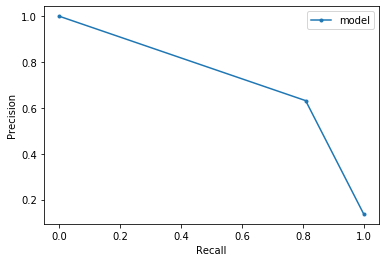

0.7662721893491126

**************

TESTING: 14 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)']
Best F2 score: 0.7659313725490197 at a threshold of 0.13

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1811  200]
 [  52  268]]

True Positives: 268
True Negatives: 1811
False Positives: 200
False Negatives: 52


Recall: 0.8375
Precision: 0.5726495726495726
Specificity 0.9005469915464943
F1 score: 0.6802030456852791
F2 score: 0.7665903890160183


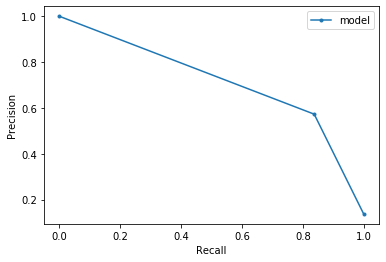

0.7665903890160183

**************

TESTING: 15 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)']
Best F2 score: 0.7579462102689486 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1825  186]
 [  55  265]]

True Positives: 265
True Negatives: 1825
False Positives: 186
False Negatives: 55


Recall: 0.828125
Precision: 0.5875831485587583
Specificity 0.9075087021382396
F1 score: 0.6874189364461738
F2 score: 0.7654534950895435


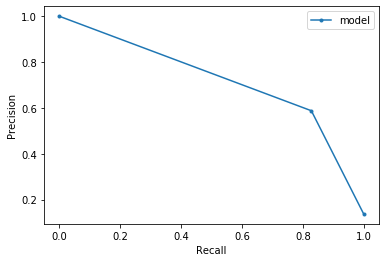

0.7654534950895435

**************

TESTING: 16 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)']
Best F2 score: 0.7659313725490197 at a threshold of 0.15

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1829  182]
 [  58  262]]

True Positives: 262
True Negatives: 1829
False Positives: 182
False Negatives: 58


Recall: 0.81875
Precision: 0.5900900900900901
Specificity 0.9094977623073098
F1 score: 0.6858638743455497
F2 score: 0.759860788863109


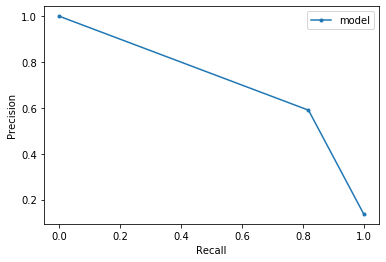

0.759860788863109

**************

TESTING: 17 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)']
Best F2 score: 0.774390243902439 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1842  169]
 [  62  258]]

True Positives: 258
True Negatives: 1842
False Positives: 169
False Negatives: 62


Recall: 0.80625
Precision: 0.6042154566744731
Specificity 0.9159622078567876
F1 score: 0.6907630522088353
F2 score: 0.7557117750439368


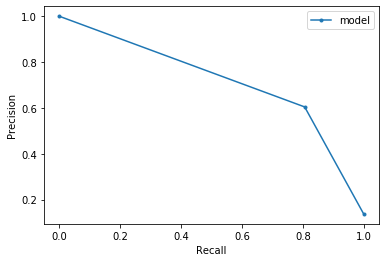

0.7557117750439368

**************

TESTING: 18 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)']
Best F2 score: 0.7711138310893513 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1816  195]
 [  59  261]]

True Positives: 261
True Negatives: 1816
False Positives: 195
False Negatives: 59


Recall: 0.815625
Precision: 0.5723684210526315
Specificity 0.9030333167578319
F1 score: 0.672680412371134
F2 score: 0.7517281105990782


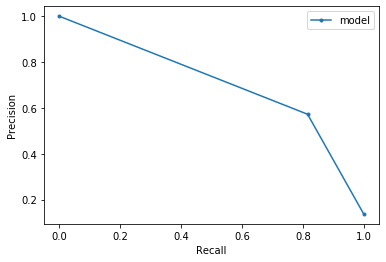

0.7517281105990782

**************

TESTING: 19 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)']
Best F2 score: 0.7978075517661389 at a threshold of 0.15

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1839  172]
 [  61  259]]

True Positives: 259
True Negatives: 1839
False Positives: 172
False Negatives: 61


Recall: 0.809375
Precision: 0.6009280742459396
Specificity 0.9144704127299851
F1 score: 0.6897470039946738
F2 score: 0.7568673290473408


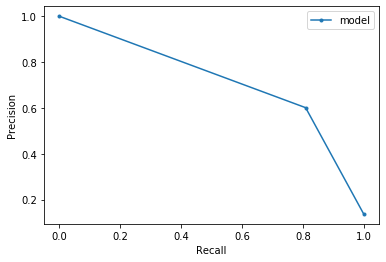

0.7568673290473408

**************

TESTING: 20 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)']
Best F2 score: 0.7907542579075426 at a threshold of 0.19

##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1880  131]
 [  68  252]]

True Positives: 252
True Negatives: 1880
False Positives: 131
False Negatives: 68


Recall: 0.7875
Precision: 0.6579634464751958
Specificity 0.9348582794629537
F1 score: 0.7169274537695591
F2 score: 0.7576668671076369


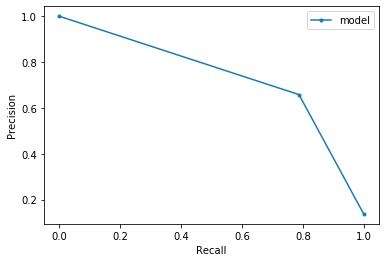

0.7576668671076369

**************

TESTING: 21 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)']
Best F2 score: 0.777233782129743 at a threshold of 0.11

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1776  235]
 [  49  271]]

True Positives: 271
True Negatives: 1776
False Positives: 235
False Negatives: 49


Recall: 0.846875
Precision: 0.5355731225296443
Specificity 0.8831427150671308
F1 score: 0.6561743341404359
F2 score: 0.7586786114221726


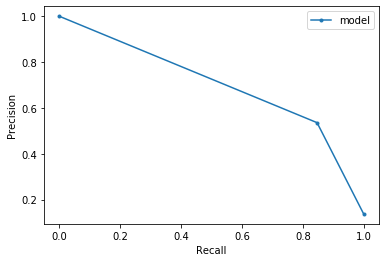

0.7586786114221726

**************

TESTING: 22 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)']
Best F2 score: 0.7833537331701345 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1867  144]
 [  68  252]]

True Positives: 252
True Negatives: 1867
False Positives: 144
False Negatives: 68


Recall: 0.7875
Precision: 0.6363636363636364
Specificity 0.9283938339134759
F1 score: 0.7039106145251396
F2 score: 0.7517899

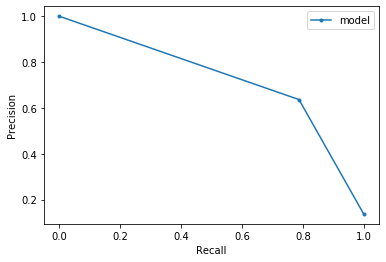

0.7517899761336515

**************

TESTING: 23 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0']
Best F2 score: 0.7885085574572126 at a threshold of 0.24

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1902  109]
 [  73  247]]

True Positives: 247
True Negatives: 1902
False Positives: 109
False Negatives: 73


Recall: 0.771875
Precision: 0.6938202247191011
Specificity 0.9457981103928393
F1 score: 0.7307692307692307
F2 s

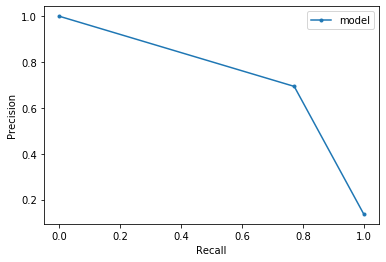

0.7548899755501223

**************

TESTING: 24 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)']
Best F2 score: 0.7885085574572126 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1831  180]
 [  59  261]]

True Positives: 261
True Negatives: 1831
False Positives: 180
False Negatives: 59


Recall: 0.815625
Precision: 0.5918367346938775
Specificity 0.910492292391

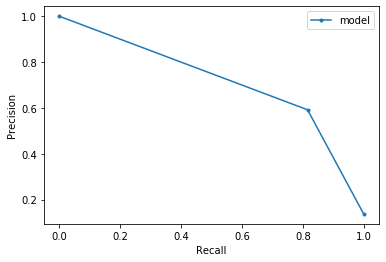

0.7582800697269031

**************

TESTING: 25 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0']
Best F2 score: 0.7856272838002435 at a threshold of 0.12

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1804  207]
 [  53  267]]

True Positives: 267
True Negatives: 1804
False Positives: 207
False Negatives: 53


Recall: 0.834375
Precision: 0.5632911392405063
Specifici

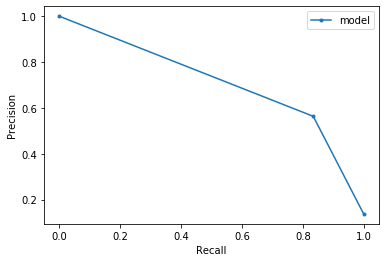

0.7611174458380843

**************

TESTING: 26 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0']
Best F2 score: 0.7875457875457875 at a threshold of 0.09

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1735  276]
 [  47  273]]

True Positives: 273
True Negatives: 1735
False Positives: 276
False Negatives: 47


Recall: 0.853125
Precision: 0.497267759

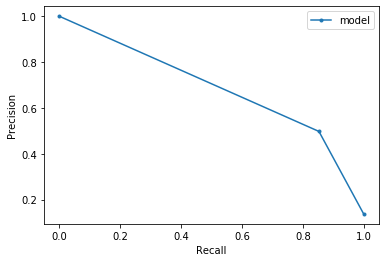

0.7463094587206124

**************

TESTING: 27 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0']
Best F2 score: 0.7907542579075426 at a threshold of 0.26

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1916   95]
 [  80  240]]

True Positives: 240
True Negatives: 1916
False Positives: 95
False Negatives: 80


Recall: 0.75
Precision: 0.71

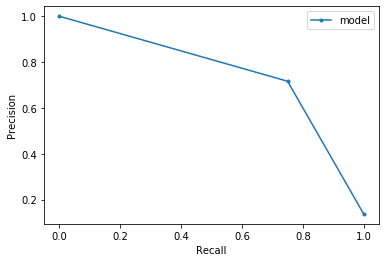

0.7430340557275541

**************

TESTING: 28 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1']
Best F2 score: 0.7907542579075426 at a threshold of 0.26

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1916   95]
 [  80  240]]

True Positives: 240
True Negatives: 1916
False Positives: 95
False Negatives: 80


Recall: 0.75


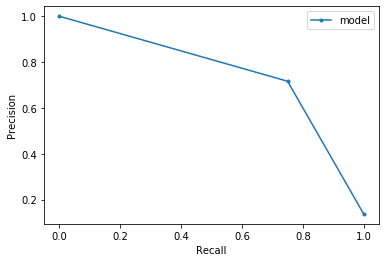

0.7430340557275541

**************

TESTING: 29 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0']
Best F2 score: 0.7865853658536585 at a threshold of 0.19

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1872  139]
 [  70  250]]

True Positives: 250
True Negatives: 1872
False Positives: 139
False Negatives: 70


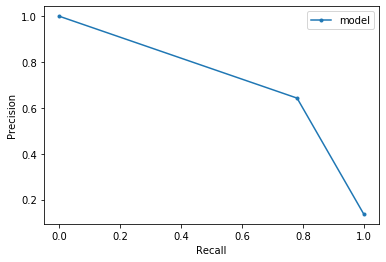

0.7489514679448772

**************

TESTING: 30 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0']
Best F2 score: 0.7865853658536585 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1869  142]
 [  70  250]]

True Positives: 250
True Negatives: 1869
False Positives: 142
False 

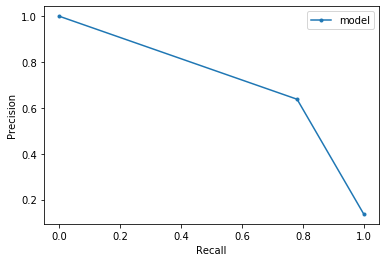

0.7476076555023923

**************

TESTING: 31 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0']
Best F2 score: 0.7814407814407813 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1867  144]
 [  70  250]]

True Positives: 250
True Negatives: 1867
False Posi

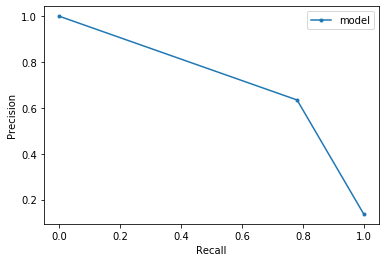

0.7467144563918757

**************

TESTING: 32 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0', 'Ethnicity_1.0']
Best F2 score: 0.7795371498172959 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1866  145]
 [  68  252]]

True Positives: 252
True Negatives

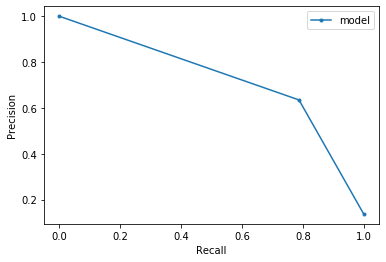

0.7513416815742398

**************

TESTING: 33 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0', 'Ethnicity_1.0', 'Gender_2.0']
Best F2 score: 0.7795371498172959 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1866  145]
 [  68  252]]

True Positives: 252


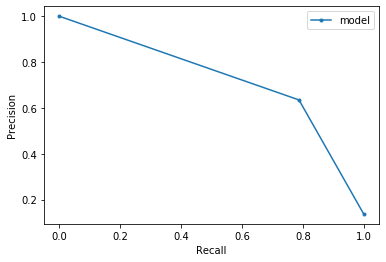

0.7513416815742398

**************

TESTING: 34 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0', 'Ethnicity_1.0', 'Gender_2.0', 'insulin_1']
Best F2 score: 0.7795371498172959 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1866  145]
 [  68  252]]

True Po

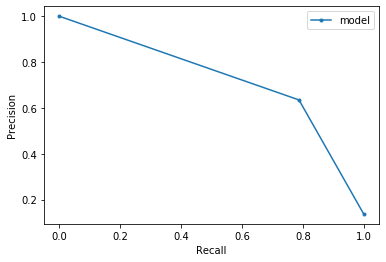

0.7513416815742398

**************

TESTING: 35 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0', 'Ethnicity_1.0', 'Gender_2.0', 'insulin_1', 'Ethnicity_2.0']
Best F2 score: 0.7837181044957473 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1865  146]
 [  6

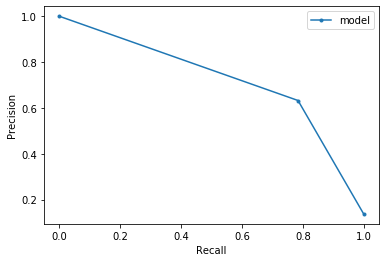

0.7483601669648182

**************

TESTING: 36 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0', 'Ethnicity_1.0', 'Gender_2.0', 'insulin_1', 'Ethnicity_2.0', 'statin_1']
Best F2 score: 0.7837181044957473 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1865

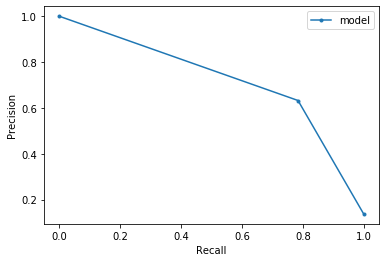

0.7483601669648182

**************

TESTING: 37 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0', 'Ethnicity_1.0', 'Gender_2.0', 'insulin_1', 'Ethnicity_2.0', 'statin_1', 'ace_arbs_1']
Best F2 score: 0.7837181044957473 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE:

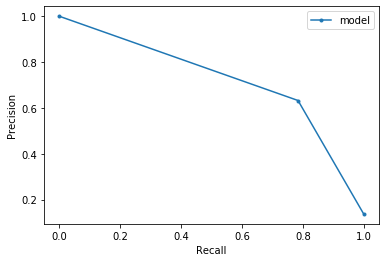

0.7483601669648182

**************

TESTING: 38 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'bmi', 'metformin_0', 'Chloride (mmol/L)', 'eGFR', 'MAP', 'Triglycerides, refrig serum (mg/dL)', 'HDL cholesterol (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'Alkaline Phosphatase (ALP) (U/L)', 'Creatinine, refrigerated serum (umol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Sodium (mmol/L)', 'Blood Urea Nitrogen (g/dL)', 'Potassium (mmol/L)', 'Bicarbonate (mmol/L)', 'Total Calcium (mmol/L)', 'Total Bilirubin (umol/L)', 'insulin_0', 'Albumin, refrigerated serum (g/dL)', 'Ethnicity_3.0', 'Ethnicity_4.0', 'statin_0', 'metformin_1', 'ace_arbs_0', 'Gender_1.0', 'Ethnicity_5.0', 'Ethnicity_1.0', 'Gender_2.0', 'insulin_1', 'Ethnicity_2.0', 'statin_1', 'ace_arbs_1', 'other_agents_0']
Best F2 score: 0.7827669902912621 at a threshold of 0.19

##### Evaluating Model ##

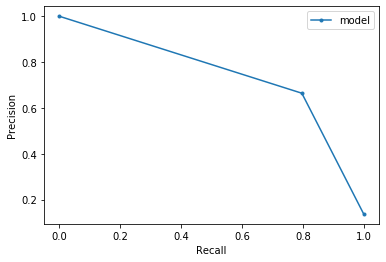

0.7662259615384616


In [2211]:
outcomes = dict()

for i in enumerate(ordered_features_xgb): 
    feature_index = i[0]
    features = ordered_features_xgb[:feature_index]
    
    if feature_index == 0: 
        pass
    else: 
        print('\n**************')
        print('\nTESTING:', feature_index, 'features')
        print('\n', features)
        fbeta = xgb_process(df, features)
        print(fbeta)
        outcomes[feature_index] = fbeta

In [2212]:
outcomes_df = pd.DataFrame.from_dict(outcomes, orient='index').reset_index()

In [2213]:
outcomes_df.columns = ['feature_selection', 'f2']

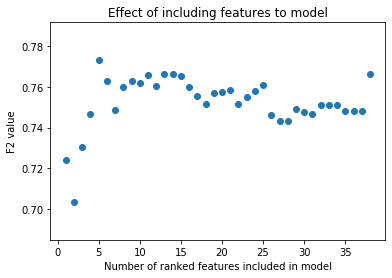

In [2214]:
plt.scatter(outcomes_df['feature_selection'], outcomes_df['f2'])
plt.xlabel('Number of ranked features included in model')
plt.ylabel('F2 value')
plt.title('Effect of including features to model')
plt.savefig('feature_selection.png')

In [2215]:
import operator
max(outcomes.items(), key=operator.itemgetter(1))[0]

5

In [2248]:
xgb_features = ordered_features_xgb[0:15]
xgb_features

['Glucose, refrigerated serum (mmol/L)',
 'Age',
 'LDL cholesterol (mmol/L)',
 'bmi',
 'metformin_0',
 'Chloride (mmol/L)',
 'eGFR',
 'MAP',
 'Triglycerides, refrig serum (mg/dL)',
 'HDL cholesterol (mmol/L)',
 'Alanine Aminotransferase (ALT) (U/L)',
 'Gamma Glutamyl Transferase (GGT) (U/L)',
 'Cholesterol, refrigerated serum (mg/dL)',
 'Alkaline Phosphatase (ALP) (U/L)',
 'Creatinine, refrigerated serum (umol/L)']

In [2249]:
df = pd.read_csv('nhanes_extracted.csv')
df.drop(columns = ['Unnamed: 0'], axis=1, inplace=True)

In [2250]:
df.dropna(how='all', subset=labs, inplace=True)

In [2251]:
df.dropna(how='all', subset=diabetes_tests, inplace=True)

In [2252]:
#fill missing data with out-of-sample 
df.fillna(-999, inplace=True)

In [2253]:
#one-hot-encoding of categorical variables
df = pd.get_dummies(df, columns = ['Gender', 'Ethnicity', 'other_agents', 'metformin', 'insulin', 'statin', 'ace_arbs'])

In [2254]:
#target and feature selection 
y_xgb = df['diagnostic_t2dm']
X_xgb = df[xgb_features]

In [2255]:
#split train-val-test datasets (85%, 5%, 10% respectively)

X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb= train_test_split(X_xgb, y_xgb, test_size=0.1, random_state=1, stratify=y_xgb)
X_train_xgb, X_val_xgb, y_train_xgb, y_val_xgb= train_test_split(X_train_xgb, y_train_xgb, test_size=0.056, random_state=1, stratify = y_train_xgb)

In [2256]:
#scale data 
scaler = StandardScaler()

X_train_xgb = pd.DataFrame(scaler.fit_transform(X_train_xgb), columns = X_xgb.columns)
X_test_xgb = pd.DataFrame(scaler.transform(X_test_xgb), columns=X_xgb.columns)
X_val_xgb = pd.DataFrame(scaler.transform(X_val_xgb), columns=X_xgb.columns)

In [2257]:
#instantiate model 
model = xgb.XGBClassifier(random_state = 42)

In [2258]:
model.fit(X_train_xgb, y_train_xgb)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [2259]:
#predict
y_preds =  cross_val_predict(model, X_val_xgb, y_val_xgb, cv=5)
y_probs = cross_val_predict(model, X_val_xgb, y_val_xgb, cv=5, method='predict_proba')[:, 1]

In [2260]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val_xgb)

Best F2 score: 0.7579462102689486 at a threshold of 0.14


(0.14, 0.7579462102689486)

In [2261]:
#make prediction for hold-out test set 
y_preds =  cross_val_predict(model, X_test_xgb, y_test_xgb, cv=5)
y_probs = cross_val_predict(model, X_test_xgb, y_test_xgb, cv=5, method='predict_proba')[:, 1]

In [2262]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.14, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.94

 [[1825  186]
 [  55  265]]

True Positives: 265
True Negatives: 1825
False Positives: 186
False Negatives: 55


Recall: 0.828125
Precision: 0.5875831485587583
Specificity 0.9075087021382396
F1 score: 0.6874189364461738
F2 score: 0.7654534950895435


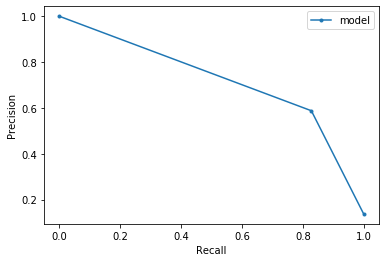

(0.7654534950895435, 265, 1825, 55, 186)

In [2263]:
evaluate(y_pred_class, y_test_xgb, y_probs)

In [2264]:
model_optimisation = RandomizedSearchCV(
            xgb.XGBClassifier(), 
            xgb_space,  
            n_iter=200, 
            n_jobs=-1, 
            random_state = 42, 
            cv=2, 
            verbose=2)

    
best_model = model_optimisation.fit(X_train_xgb, y_train_xgb)

Fitting 2 folds for each of 200 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 25.1min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 28.3min finished


In [2265]:
best_model.best_params_

{'subsample': 0.8,
 'scale_pos_weight': 1,
 'reg_lambda': 1.4000000000000004,
 'reg_alpha': 2,
 'n_estimators': 1801,
 'max_depth': 14,
 'learning_rate': 0.4408673469387755,
 'gamma': 0.5,
 'colsample_bytree': 0.7}

In [2266]:
#params for 5 features 
best_params_ = {'subsample': 1.0000000000000002,
 'scale_pos_weight': 3,
 'reg_lambda': 1.3000000000000003,
 'reg_alpha': 3,
 'n_estimators': 901,
 'max_depth': 18,
 'learning_rate': 0.3123102040816326,
 'gamma': 0.55,
 'colsample_bytree': 0.9000000000000001, 
 'random_state': 42}

In [2267]:
#params for 15 features 
best_params_ = {'subsample': 0.8,
 'scale_pos_weight': 1,
 'reg_lambda': 1.4000000000000004,
 'reg_alpha': 2,
 'n_estimators': 1801,
 'max_depth': 14,
 'learning_rate': 0.4408673469387755,
 'gamma': 0.5,
 'colsample_bytree': 0.7,
 'random_state': 42}

In [2268]:
final_model = xgb.XGBClassifier(**best_params_)

In [2269]:
final_model.fit(X_train_xgb, y_train_xgb)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0.5,
              learning_rate=0.4408673469387755, max_delta_step=0, max_depth=14,
              min_child_weight=1, missing=None, n_estimators=1801, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=2, reg_lambda=1.4000000000000004, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [2270]:
#predict
y_preds =  cross_val_predict(final_model, X_val_xgb, y_val_xgb, cv=5)
y_probs = cross_val_predict(final_model, X_val_xgb, y_val_xgb, cv=5, method='predict_proba')[:, 1]

In [2271]:
threshold_setting(y_probs, y_val_xgb)

Best F2 score: 0.7527539779681761 at a threshold of 0.12


(0.12, 0.7527539779681761)

In [2272]:
#predict on hold-out test set 
y_preds =  cross_val_predict(final_model, X_test_xgb, y_test_xgb, cv=5)
y_probs = cross_val_predict(final_model, X_test_xgb, y_test_xgb, cv=5, method='predict_proba')[:, 1]

In [2273]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.12, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.93

 [[1849  162]
 [  63  257]]

True Positives: 257
True Negatives: 1849
False Positives: 162
False Negatives: 63


Recall: 0.803125
Precision: 0.6133651551312649
Specificity 0.9194430631526603
F1 score: 0.6955345060893099
F2 score: 0.7563272513243084


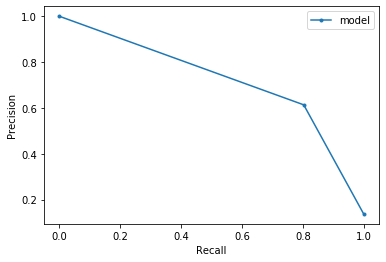

(0.7563272513243084, 257, 1849, 63, 162)

In [2274]:
evaluate(y_pred_class, y_test_xgb, y_probs)

_____
# CatBoost 

In [2288]:
df = pd.read_csv('nhanes_extracted.csv')
df.drop(columns = ['Unnamed: 0'], axis=1, inplace=True)
df['Gender'] = df['Gender'].astype(int)
df.dropna(how='all', subset=labs, inplace=True)
df.dropna(how='all', subset=diabetes_tests, inplace=True)
#fill missing data with out-of-sample 
df.fillna(-999, inplace=True)

In [2289]:
df

,SEQN,Gender,Age,Ethnicity,FHx,Fasting Glucose (mmol/L),Two Hour Glucose(OGTT) (mmol/L),How long ago saw a diabetes specialist,Retinopathy,Last time had pupils dilated for exam,...,metformin,other_agents,ace_arbs,eGFR,HbA1c_correct,known_diabetes,hba1c_result,MAP,ogtt_result,diagnostic_t2dm
0,83732,1,62.0,3.0,1.0,-999.000,-999.000,4.0,2.0,2.0,...,1,1,1,90.878589,52.995190,1.0,1.0,83.60,0,1
1,83733,1,53.0,3.0,1.0,5.590,-999.000,-999.0,-999.0,-999.0,...,0,0,0,78.529438,36.598164,2.0,0.0,102.96,0,0
2,83734,1,78.0,3.0,2.0,4.660,8.660,3.0,2.0,2.0,...,0,0,1,67.393831,-999.000000,1.0,-999.0,74.58,0,0
3,83735,2,56.0,3.0,-999.0,-999.000,-999.000,-999.0,-999.0,-999.0,...,0,0,0,63.898943,37.691299,2.0,0.0,90.42,0,0
4,83737,2,72.0,1.0,1.0,5.930,5.500,-999.0,-999.0,-999.0,...,0,0,0,49.298425,40.970704,2.0,0.0,78.10,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28268,51618,1,48.0,3.0,1.0,5.551,3.997,-999.0,-999.0,-999.0,...,0,0,0,79.253419,37.691299,2.0,0.0,100.10,0,0
28269,51619,1,61.0,1.0,1.0,-999.000,-999.000,-999.0,-999.0,-999.0,...,0,0,0,92.362338,34.411893,2.0,0.0,97.24,0,0
28270,51620,2,50.0,3.0,2.0,5.440,6.162,-999.0,-999.0,-999.0,...,0,0,0,68.677549,35.505028,2.0,0.0,81.51,0,0
28271,51622,2,60.0,4.0,2.0,-999.000,-999.000,-999.0,-999.0,-999.0,...,0,0,0,154.948333,28.946218,2.0,0.0,104.50,0,0


In [2290]:
#assign categorical features 
df['Gender'] = df['Gender'].astype(str, copy=False)
df['Ethnicity'] = df['Ethnicity'].astype(str, copy=False)
df['insulin'] = df['insulin'].astype(str, copy=False)
df['metformin'] = df['metformin'].astype(str, copy=False)
df['other_agents'] = df['other_agents'].astype(str, copy=False)
df['statin'] = df['statin'].astype(str, copy=False)
df['ace_arbs'] = df['ace_arbs'].astype(str, copy=False)

In [2291]:
df.columns

Index(['SEQN', 'Gender', 'Age', 'Ethnicity', 'FHx', 'Fasting Glucose (mmol/L)',
       'Two Hour Glucose(OGTT) (mmol/L)',
       'How long ago saw a diabetes specialist', 'Retinopathy',
       'Last time had pupils dilated for exam', 'bmi',
       'Alanine Aminotransferase (ALT) (U/L)',
       'Albumin, refrigerated serum (g/dL)',
       'Alkaline Phosphatase (ALP) (U/L)',
       'Aspartate Aminotransferase (AST) (U/L)', 'Bicarbonate (mmol/L)',
       'Blood Urea Nitrogen (g/dL)', 'Chloride (mmol/L)',
       'Cholesterol, refrigerated serum (mg/dL)',
       'Creatinine, refrigerated serum (umol/L)',
       'Gamma Glutamyl Transferase (GGT) (U/L)',
       'Glucose, refrigerated serum (mmol/L)', 'Potassium (mmol/L)',
       'Sodium (mmol/L)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)',
       'Triglycerides, refrig serum (mg/dL)', 'LDL cholesterol (mmol/L)',
       'HDL cholesterol (mmol/L)', 'Prescriptions', 'insulin', 'statin',
       'metformin', 'other_agents', 'ace_arbs', 

In [2292]:
X = df[features]
y = df['diagnostic_t2dm']

In [2293]:
X.dtypes

Gender                                      object
Age                                        float64
Ethnicity                                   object
bmi                                        float64
Alanine Aminotransferase (ALT) (U/L)       float64
Albumin, refrigerated serum (g/dL)         float64
Alkaline Phosphatase (ALP) (U/L)           float64
Aspartate Aminotransferase (AST) (U/L)     float64
Bicarbonate (mmol/L)                       float64
Blood Urea Nitrogen (g/dL)                 float64
Chloride (mmol/L)                          float64
Cholesterol, refrigerated serum (mg/dL)    float64
Creatinine, refrigerated serum (umol/L)    float64
Gamma Glutamyl Transferase (GGT) (U/L)     float64
Glucose, refrigerated serum (mmol/L)       float64
Potassium (mmol/L)                         float64
Sodium (mmol/L)                            float64
Total Bilirubin (umol/L)                   float64
Total Calcium (mmol/L)                     float64
Triglycerides, refrig serum (mg

In [2294]:
#split into train-test (10% test and 15% validate)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.166666667, random_state=1, stratify = y_train)

In [2295]:
categorical_features_indices = np.where(X_train.dtypes != np.float)[0]

In [2297]:
continuous = []

for i in np.where(X_train.dtypes == np.float)[0]: 
    continuous.append(list(X_train.columns)[i])

In [2298]:
#scale data 
scaler = StandardScaler()

X_train[continuous] = scaler.fit_transform(X_train[continuous])
X_test[continuous] = scaler.transform(X_test[continuous])
X_val[continuous] = scaler.transform(X_val[continuous])

In [2299]:
train_pool = Pool(X_train, y_train, cat_features=categorical_features_indices)
validate_pool = Pool(X_val, y_val, cat_features=categorical_features_indices)
test_pool = Pool(X_test, y_test, cat_features=categorical_features_indices)

In [2300]:
#instantiate model 
model = CatBoostClassifier(random_seed = 42) 

In [2301]:
#fit model
model.fit(train_pool)

Learning rate set to 0.034956
0:	learn: 0.6444691	total: 50.9ms	remaining: 50.9s
1:	learn: 0.5993016	total: 81ms	remaining: 40.4s
2:	learn: 0.5604666	total: 107ms	remaining: 35.6s
3:	learn: 0.5180880	total: 133ms	remaining: 33.1s
4:	learn: 0.4848879	total: 160ms	remaining: 31.8s
5:	learn: 0.4528181	total: 190ms	remaining: 31.5s
6:	learn: 0.4267619	total: 224ms	remaining: 31.8s
7:	learn: 0.4021952	total: 249ms	remaining: 30.9s
8:	learn: 0.3806311	total: 281ms	remaining: 31s
9:	learn: 0.3608398	total: 306ms	remaining: 30.3s
10:	learn: 0.3420251	total: 329ms	remaining: 29.6s
11:	learn: 0.3264528	total: 354ms	remaining: 29.1s
12:	learn: 0.3134319	total: 373ms	remaining: 28.3s
13:	learn: 0.2986085	total: 392ms	remaining: 27.6s
14:	learn: 0.2863729	total: 421ms	remaining: 27.6s
15:	learn: 0.2755052	total: 449ms	remaining: 27.6s
16:	learn: 0.2653545	total: 473ms	remaining: 27.3s
17:	learn: 0.2550624	total: 497ms	remaining: 27.1s
18:	learn: 0.2476022	total: 520ms	remaining: 26.9s
19:	learn: 0.

169:	learn: 0.1306548	total: 2.95s	remaining: 14.4s
170:	learn: 0.1306399	total: 2.97s	remaining: 14.4s
171:	learn: 0.1305597	total: 2.98s	remaining: 14.4s
172:	learn: 0.1303953	total: 3s	remaining: 14.3s
173:	learn: 0.1303087	total: 3.01s	remaining: 14.3s
174:	learn: 0.1302494	total: 3.02s	remaining: 14.3s
175:	learn: 0.1301615	total: 3.03s	remaining: 14.2s
176:	learn: 0.1301236	total: 3.04s	remaining: 14.1s
177:	learn: 0.1300461	total: 3.05s	remaining: 14.1s
178:	learn: 0.1299359	total: 3.06s	remaining: 14s
179:	learn: 0.1298382	total: 3.07s	remaining: 14s
180:	learn: 0.1297495	total: 3.08s	remaining: 13.9s
181:	learn: 0.1296519	total: 3.09s	remaining: 13.9s
182:	learn: 0.1294902	total: 3.1s	remaining: 13.8s
183:	learn: 0.1294230	total: 3.11s	remaining: 13.8s
184:	learn: 0.1292945	total: 3.12s	remaining: 13.7s
185:	learn: 0.1291998	total: 3.13s	remaining: 13.7s
186:	learn: 0.1291099	total: 3.14s	remaining: 13.6s
187:	learn: 0.1290242	total: 3.15s	remaining: 13.6s
188:	learn: 0.128938

334:	learn: 0.1156109	total: 4.82s	remaining: 9.57s
335:	learn: 0.1155191	total: 4.84s	remaining: 9.57s
336:	learn: 0.1154219	total: 4.86s	remaining: 9.56s
337:	learn: 0.1153388	total: 4.88s	remaining: 9.55s
338:	learn: 0.1152481	total: 4.89s	remaining: 9.54s
339:	learn: 0.1151044	total: 4.9s	remaining: 9.51s
340:	learn: 0.1149772	total: 4.91s	remaining: 9.49s
341:	learn: 0.1148952	total: 4.92s	remaining: 9.46s
342:	learn: 0.1148531	total: 4.93s	remaining: 9.44s
343:	learn: 0.1148425	total: 4.94s	remaining: 9.42s
344:	learn: 0.1147267	total: 4.95s	remaining: 9.39s
345:	learn: 0.1146438	total: 4.96s	remaining: 9.37s
346:	learn: 0.1145956	total: 4.97s	remaining: 9.35s
347:	learn: 0.1145206	total: 4.98s	remaining: 9.32s
348:	learn: 0.1144151	total: 4.99s	remaining: 9.3s
349:	learn: 0.1143609	total: 4.99s	remaining: 9.28s
350:	learn: 0.1142562	total: 5s	remaining: 9.25s
351:	learn: 0.1141367	total: 5.01s	remaining: 9.23s
352:	learn: 0.1140502	total: 5.03s	remaining: 9.21s
353:	learn: 0.114

493:	learn: 0.1033157	total: 6.69s	remaining: 6.85s
494:	learn: 0.1032299	total: 6.71s	remaining: 6.84s
495:	learn: 0.1030624	total: 6.72s	remaining: 6.83s
496:	learn: 0.1029294	total: 6.74s	remaining: 6.82s
497:	learn: 0.1028694	total: 6.75s	remaining: 6.8s
498:	learn: 0.1027919	total: 6.76s	remaining: 6.78s
499:	learn: 0.1026291	total: 6.77s	remaining: 6.77s
500:	learn: 0.1025191	total: 6.78s	remaining: 6.75s
501:	learn: 0.1024518	total: 6.79s	remaining: 6.73s
502:	learn: 0.1023521	total: 6.8s	remaining: 6.71s
503:	learn: 0.1022251	total: 6.8s	remaining: 6.7s
504:	learn: 0.1021440	total: 6.81s	remaining: 6.68s
505:	learn: 0.1020671	total: 6.82s	remaining: 6.66s
506:	learn: 0.1019640	total: 6.83s	remaining: 6.65s
507:	learn: 0.1018470	total: 6.84s	remaining: 6.63s
508:	learn: 0.1018365	total: 6.85s	remaining: 6.61s
509:	learn: 0.1017689	total: 6.86s	remaining: 6.59s
510:	learn: 0.1017091	total: 6.87s	remaining: 6.58s
511:	learn: 0.1016300	total: 6.88s	remaining: 6.56s
512:	learn: 0.10

657:	learn: 0.0915748	total: 8.56s	remaining: 4.45s
658:	learn: 0.0915251	total: 8.58s	remaining: 4.44s
659:	learn: 0.0914546	total: 8.6s	remaining: 4.43s
660:	learn: 0.0913900	total: 8.62s	remaining: 4.42s
661:	learn: 0.0913040	total: 8.63s	remaining: 4.4s
662:	learn: 0.0912889	total: 8.63s	remaining: 4.39s
663:	learn: 0.0912288	total: 8.64s	remaining: 4.37s
664:	learn: 0.0912080	total: 8.65s	remaining: 4.36s
665:	learn: 0.0911922	total: 8.66s	remaining: 4.34s
666:	learn: 0.0911406	total: 8.67s	remaining: 4.33s
667:	learn: 0.0911389	total: 8.68s	remaining: 4.32s
668:	learn: 0.0911176	total: 8.69s	remaining: 4.3s
669:	learn: 0.0910676	total: 8.7s	remaining: 4.29s
670:	learn: 0.0910112	total: 8.71s	remaining: 4.27s
671:	learn: 0.0909430	total: 8.72s	remaining: 4.26s
672:	learn: 0.0909126	total: 8.73s	remaining: 4.24s
673:	learn: 0.0908210	total: 8.74s	remaining: 4.23s
674:	learn: 0.0907677	total: 8.75s	remaining: 4.21s
675:	learn: 0.0907043	total: 8.76s	remaining: 4.2s
676:	learn: 0.090

820:	learn: 0.0819324	total: 10.4s	remaining: 2.27s
821:	learn: 0.0818794	total: 10.4s	remaining: 2.26s
822:	learn: 0.0818444	total: 10.4s	remaining: 2.25s
823:	learn: 0.0817955	total: 10.5s	remaining: 2.23s
824:	learn: 0.0817487	total: 10.5s	remaining: 2.22s
825:	learn: 0.0816642	total: 10.5s	remaining: 2.21s
826:	learn: 0.0816524	total: 10.5s	remaining: 2.2s
827:	learn: 0.0816072	total: 10.5s	remaining: 2.18s
828:	learn: 0.0815859	total: 10.5s	remaining: 2.17s
829:	learn: 0.0815189	total: 10.5s	remaining: 2.16s
830:	learn: 0.0814306	total: 10.5s	remaining: 2.14s
831:	learn: 0.0813989	total: 10.6s	remaining: 2.13s
832:	learn: 0.0813248	total: 10.6s	remaining: 2.12s
833:	learn: 0.0812573	total: 10.6s	remaining: 2.1s
834:	learn: 0.0811202	total: 10.6s	remaining: 2.09s
835:	learn: 0.0810746	total: 10.6s	remaining: 2.08s
836:	learn: 0.0810065	total: 10.6s	remaining: 2.06s
837:	learn: 0.0809412	total: 10.6s	remaining: 2.05s
838:	learn: 0.0808466	total: 10.6s	remaining: 2.04s
839:	learn: 0.

984:	learn: 0.0734497	total: 12.5s	remaining: 190ms
985:	learn: 0.0734030	total: 12.5s	remaining: 177ms
986:	learn: 0.0733435	total: 12.5s	remaining: 165ms
987:	learn: 0.0733060	total: 12.5s	remaining: 152ms
988:	learn: 0.0732249	total: 12.5s	remaining: 140ms
989:	learn: 0.0731833	total: 12.6s	remaining: 127ms
990:	learn: 0.0731353	total: 12.6s	remaining: 114ms
991:	learn: 0.0730477	total: 12.6s	remaining: 101ms
992:	learn: 0.0729884	total: 12.6s	remaining: 88.7ms
993:	learn: 0.0729225	total: 12.6s	remaining: 76ms
994:	learn: 0.0728396	total: 12.6s	remaining: 63.4ms
995:	learn: 0.0727869	total: 12.6s	remaining: 50.7ms
996:	learn: 0.0727034	total: 12.6s	remaining: 38ms
997:	learn: 0.0726811	total: 12.6s	remaining: 25.3ms
998:	learn: 0.0726507	total: 12.6s	remaining: 12.7ms
999:	learn: 0.0725839	total: 12.7s	remaining: 0us


In [2302]:
model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'Logloss',
 'combinations_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1',
  'Counter:CtrBorderCount=15:CtrBorderType=Uniform:Prior=0/1'],
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'fold_permutation_block': 0,
 'leaf_estimation_method': 'Newton',
 'counter_calc_method': 'SkipTest',
 'grow_policy': 'SymmetricTree',
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'ctr_leaf_count_limit': 18446744073709551615,
 'bayesian_matrix_reg': 0.10000000149011612,
 'one_hot_max_size': 2,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': False,
 'max_ctr_complexity': 4,
 'model_size_reg': 0.5,
 'simple_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1',
  'Counter:CtrBorderCount=15:CtrBorderType=Unifo

In [2303]:
cv_params = model.get_params()

cv_params.update({'loss_function': 'Logloss'})

cv_data = cv(
Pool(X_train, y_train, cat_features = categorical_features_indices), cv_params, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6508608	test: 0.6509513	best: 0.6509513 (0)	total: 111ms	remaining: 1m 50s
1:	learn: 0.6126194	test: 0.6127831	best: 0.6127831 (1)	total: 199ms	remaining: 1m 39s
2:	learn: 0.5799971	test: 0.5801839	best: 0.5801839 (2)	total: 279ms	remaining: 1m 32s
3:	learn: 0.5484443	test: 0.5487486	best: 0.5487486 (3)	total: 357ms	remaining: 1m 28s
4:	learn: 0.5172291	test: 0.5177419	best: 0.5177419 (4)	total: 441ms	remaining: 1m 27s
5:	learn: 0.4890442	test: 0.4895679	best: 0.4895679 (5)	total: 526ms	remaining: 1m 27s
6:	learn: 0.4627755	test: 0.4634226	best: 0.4634226 (6)	total: 631ms	remaining: 1m 29s
7:	learn: 0.4378596	test: 0.4386576	best: 0.4386576 (7)	total: 723ms	remaining: 1m 29s
8:	learn: 0.4157806	test: 0.4167146	best: 0.4167146 (8)	total: 806ms	remaining: 1m 28s
9:	learn: 0.3945635	test: 0.3956138	best: 0.3956138 (9)	total: 891ms	remaining: 1m 28s
10:	learn: 0.3771778	test: 0.3782456	best: 0.3782456 (10)	total: 989ms	remaining: 1m 28s
11:	learn: 0.3611301	test: 0.3623527	best

95:	learn: 0.1430352	test: 0.1533116	best: 0.1533116 (95)	total: 6.31s	remaining: 59.4s
96:	learn: 0.1427612	test: 0.1531803	best: 0.1531803 (96)	total: 6.46s	remaining: 1m
97:	learn: 0.1424408	test: 0.1529704	best: 0.1529704 (97)	total: 6.53s	remaining: 1m
98:	learn: 0.1421993	test: 0.1528354	best: 0.1528354 (98)	total: 6.61s	remaining: 1m
99:	learn: 0.1419448	test: 0.1527369	best: 0.1527369 (99)	total: 6.69s	remaining: 1m
100:	learn: 0.1416862	test: 0.1525884	best: 0.1525884 (100)	total: 6.79s	remaining: 1m
101:	learn: 0.1414743	test: 0.1524613	best: 0.1524613 (101)	total: 6.84s	remaining: 1m
102:	learn: 0.1411557	test: 0.1523180	best: 0.1523180 (102)	total: 6.88s	remaining: 59.9s
103:	learn: 0.1409064	test: 0.1522332	best: 0.1522332 (103)	total: 6.92s	remaining: 59.7s
104:	learn: 0.1406565	test: 0.1521161	best: 0.1521161 (104)	total: 6.97s	remaining: 59.4s
105:	learn: 0.1404871	test: 0.1520659	best: 0.1520659 (105)	total: 7.03s	remaining: 59.3s
106:	learn: 0.1402942	test: 0.1519613	

187:	learn: 0.1275811	test: 0.1476089	best: 0.1476089 (187)	total: 11.1s	remaining: 48s
188:	learn: 0.1274594	test: 0.1475838	best: 0.1475838 (188)	total: 11.2s	remaining: 47.8s
189:	learn: 0.1273453	test: 0.1475629	best: 0.1475629 (189)	total: 11.2s	remaining: 47.7s
190:	learn: 0.1271826	test: 0.1475277	best: 0.1475277 (190)	total: 11.2s	remaining: 47.6s
191:	learn: 0.1270841	test: 0.1474930	best: 0.1474930 (191)	total: 11.3s	remaining: 47.4s
192:	learn: 0.1269397	test: 0.1474606	best: 0.1474606 (192)	total: 11.3s	remaining: 47.3s
193:	learn: 0.1268163	test: 0.1474476	best: 0.1474476 (193)	total: 11.4s	remaining: 47.3s
194:	learn: 0.1267101	test: 0.1474370	best: 0.1474370 (194)	total: 11.4s	remaining: 47.2s
195:	learn: 0.1265918	test: 0.1474190	best: 0.1474190 (195)	total: 11.5s	remaining: 47s
196:	learn: 0.1264530	test: 0.1473762	best: 0.1473762 (196)	total: 11.5s	remaining: 46.9s
197:	learn: 0.1263278	test: 0.1473511	best: 0.1473511 (197)	total: 11.6s	remaining: 47s
198:	learn: 0.12

281:	learn: 0.1173239	test: 0.1459908	best: 0.1459908 (281)	total: 16s	remaining: 40.7s
282:	learn: 0.1172089	test: 0.1459537	best: 0.1459537 (282)	total: 16s	remaining: 40.7s
283:	learn: 0.1171014	test: 0.1459283	best: 0.1459283 (283)	total: 16.1s	remaining: 40.6s
284:	learn: 0.1170210	test: 0.1459115	best: 0.1459115 (284)	total: 16.2s	remaining: 40.5s
285:	learn: 0.1169085	test: 0.1459089	best: 0.1459089 (285)	total: 16.2s	remaining: 40.5s
286:	learn: 0.1167805	test: 0.1458952	best: 0.1458952 (286)	total: 16.3s	remaining: 40.5s
287:	learn: 0.1166758	test: 0.1458940	best: 0.1458940 (287)	total: 16.3s	remaining: 40.4s
288:	learn: 0.1166188	test: 0.1458805	best: 0.1458805 (288)	total: 16.4s	remaining: 40.3s
289:	learn: 0.1165466	test: 0.1458794	best: 0.1458794 (289)	total: 16.4s	remaining: 40.2s
290:	learn: 0.1164648	test: 0.1458820	best: 0.1458794 (289)	total: 16.4s	remaining: 40s
291:	learn: 0.1163648	test: 0.1458827	best: 0.1458794 (289)	total: 16.5s	remaining: 40s
292:	learn: 0.1162

374:	learn: 0.1079052	test: 0.1453598	best: 0.1453598 (374)	total: 20.9s	remaining: 34.8s
375:	learn: 0.1077929	test: 0.1453448	best: 0.1453448 (375)	total: 20.9s	remaining: 34.8s
376:	learn: 0.1077070	test: 0.1453382	best: 0.1453382 (376)	total: 21s	remaining: 34.7s
377:	learn: 0.1076050	test: 0.1453474	best: 0.1453382 (376)	total: 21s	remaining: 34.6s
378:	learn: 0.1075092	test: 0.1453553	best: 0.1453382 (376)	total: 21.1s	remaining: 34.5s
379:	learn: 0.1074217	test: 0.1453593	best: 0.1453382 (376)	total: 21.1s	remaining: 34.4s
380:	learn: 0.1073386	test: 0.1453521	best: 0.1453382 (376)	total: 21.2s	remaining: 34.4s
381:	learn: 0.1072339	test: 0.1453542	best: 0.1453382 (376)	total: 21.2s	remaining: 34.3s
382:	learn: 0.1071799	test: 0.1453740	best: 0.1453382 (376)	total: 21.2s	remaining: 34.2s
383:	learn: 0.1070525	test: 0.1453670	best: 0.1453382 (376)	total: 21.3s	remaining: 34.1s
384:	learn: 0.1069806	test: 0.1453640	best: 0.1453382 (376)	total: 21.4s	remaining: 34.1s
385:	learn: 0.

467:	learn: 0.0999404	test: 0.1451079	best: 0.1450697 (446)	total: 25.3s	remaining: 28.8s
468:	learn: 0.0998835	test: 0.1451144	best: 0.1450697 (446)	total: 25.4s	remaining: 28.7s
469:	learn: 0.0997901	test: 0.1451052	best: 0.1450697 (446)	total: 25.5s	remaining: 28.7s
470:	learn: 0.0996785	test: 0.1451271	best: 0.1450697 (446)	total: 25.5s	remaining: 28.6s
471:	learn: 0.0995799	test: 0.1451145	best: 0.1450697 (446)	total: 25.5s	remaining: 28.6s
472:	learn: 0.0994997	test: 0.1451064	best: 0.1450697 (446)	total: 25.6s	remaining: 28.5s
473:	learn: 0.0994268	test: 0.1450984	best: 0.1450697 (446)	total: 25.6s	remaining: 28.4s
474:	learn: 0.0993771	test: 0.1450995	best: 0.1450697 (446)	total: 25.7s	remaining: 28.4s
475:	learn: 0.0992703	test: 0.1450931	best: 0.1450697 (446)	total: 25.7s	remaining: 28.3s
476:	learn: 0.0991613	test: 0.1450954	best: 0.1450697 (446)	total: 25.8s	remaining: 28.2s
477:	learn: 0.0991315	test: 0.1450962	best: 0.1450697 (446)	total: 25.8s	remaining: 28.2s
478:	learn

559:	learn: 0.0928268	test: 0.1453582	best: 0.1450561 (483)	total: 31.5s	remaining: 24.8s
560:	learn: 0.0927384	test: 0.1453571	best: 0.1450561 (483)	total: 31.6s	remaining: 24.7s
561:	learn: 0.0927158	test: 0.1453603	best: 0.1450561 (483)	total: 31.7s	remaining: 24.7s
562:	learn: 0.0926300	test: 0.1453600	best: 0.1450561 (483)	total: 31.7s	remaining: 24.6s
563:	learn: 0.0925586	test: 0.1453683	best: 0.1450561 (483)	total: 31.8s	remaining: 24.6s
564:	learn: 0.0924532	test: 0.1453664	best: 0.1450561 (483)	total: 31.9s	remaining: 24.5s
565:	learn: 0.0923901	test: 0.1453591	best: 0.1450561 (483)	total: 32s	remaining: 24.5s
566:	learn: 0.0923417	test: 0.1453521	best: 0.1450561 (483)	total: 32s	remaining: 24.4s
567:	learn: 0.0922658	test: 0.1453520	best: 0.1450561 (483)	total: 32.1s	remaining: 24.4s
568:	learn: 0.0922001	test: 0.1453447	best: 0.1450561 (483)	total: 32.2s	remaining: 24.4s
569:	learn: 0.0921464	test: 0.1453589	best: 0.1450561 (483)	total: 32.2s	remaining: 24.3s
570:	learn: 0.

654:	learn: 0.0857556	test: 0.1456099	best: 0.1450561 (483)	total: 38.3s	remaining: 20.2s
655:	learn: 0.0857029	test: 0.1456150	best: 0.1450561 (483)	total: 38.3s	remaining: 20.1s
656:	learn: 0.0856388	test: 0.1456069	best: 0.1450561 (483)	total: 38.4s	remaining: 20s
657:	learn: 0.0855388	test: 0.1456163	best: 0.1450561 (483)	total: 38.4s	remaining: 20s
658:	learn: 0.0854554	test: 0.1456267	best: 0.1450561 (483)	total: 38.5s	remaining: 19.9s
659:	learn: 0.0853662	test: 0.1456167	best: 0.1450561 (483)	total: 38.5s	remaining: 19.8s
660:	learn: 0.0853135	test: 0.1456079	best: 0.1450561 (483)	total: 38.6s	remaining: 19.8s
661:	learn: 0.0852416	test: 0.1456261	best: 0.1450561 (483)	total: 38.6s	remaining: 19.7s
662:	learn: 0.0851814	test: 0.1456347	best: 0.1450561 (483)	total: 38.6s	remaining: 19.6s
663:	learn: 0.0851117	test: 0.1456477	best: 0.1450561 (483)	total: 38.7s	remaining: 19.6s
664:	learn: 0.0850212	test: 0.1456561	best: 0.1450561 (483)	total: 38.7s	remaining: 19.5s
665:	learn: 0.

747:	learn: 0.0791567	test: 0.1460004	best: 0.1450561 (483)	total: 43.7s	remaining: 14.7s
748:	learn: 0.0790799	test: 0.1459995	best: 0.1450561 (483)	total: 43.8s	remaining: 14.7s
749:	learn: 0.0790480	test: 0.1460042	best: 0.1450561 (483)	total: 43.9s	remaining: 14.6s
750:	learn: 0.0789984	test: 0.1460050	best: 0.1450561 (483)	total: 43.9s	remaining: 14.6s
751:	learn: 0.0789341	test: 0.1460182	best: 0.1450561 (483)	total: 44s	remaining: 14.5s
752:	learn: 0.0789089	test: 0.1460213	best: 0.1450561 (483)	total: 44.1s	remaining: 14.5s
753:	learn: 0.0788325	test: 0.1460470	best: 0.1450561 (483)	total: 44.2s	remaining: 14.4s
754:	learn: 0.0787698	test: 0.1460481	best: 0.1450561 (483)	total: 44.4s	remaining: 14.4s
755:	learn: 0.0786714	test: 0.1460613	best: 0.1450561 (483)	total: 44.5s	remaining: 14.3s
756:	learn: 0.0786317	test: 0.1460542	best: 0.1450561 (483)	total: 44.5s	remaining: 14.3s
757:	learn: 0.0785399	test: 0.1460710	best: 0.1450561 (483)	total: 44.6s	remaining: 14.2s
758:	learn: 

842:	learn: 0.0731350	test: 0.1465448	best: 0.1450561 (483)	total: 52.2s	remaining: 9.71s
843:	learn: 0.0730686	test: 0.1465498	best: 0.1450561 (483)	total: 52.2s	remaining: 9.65s
844:	learn: 0.0729997	test: 0.1465522	best: 0.1450561 (483)	total: 52.3s	remaining: 9.59s
845:	learn: 0.0729361	test: 0.1465615	best: 0.1450561 (483)	total: 52.3s	remaining: 9.53s
846:	learn: 0.0729051	test: 0.1465635	best: 0.1450561 (483)	total: 52.4s	remaining: 9.47s
847:	learn: 0.0728514	test: 0.1465708	best: 0.1450561 (483)	total: 52.5s	remaining: 9.41s
848:	learn: 0.0728083	test: 0.1465690	best: 0.1450561 (483)	total: 52.6s	remaining: 9.35s
849:	learn: 0.0727569	test: 0.1465816	best: 0.1450561 (483)	total: 52.6s	remaining: 9.29s
850:	learn: 0.0726929	test: 0.1465845	best: 0.1450561 (483)	total: 52.7s	remaining: 9.23s
851:	learn: 0.0726247	test: 0.1465801	best: 0.1450561 (483)	total: 52.8s	remaining: 9.16s
852:	learn: 0.0725710	test: 0.1465715	best: 0.1450561 (483)	total: 52.8s	remaining: 9.1s
853:	learn:

934:	learn: 0.0678543	test: 0.1469469	best: 0.1450561 (483)	total: 59.1s	remaining: 4.11s
935:	learn: 0.0678121	test: 0.1469541	best: 0.1450561 (483)	total: 59.2s	remaining: 4.05s
936:	learn: 0.0677644	test: 0.1469653	best: 0.1450561 (483)	total: 59.3s	remaining: 3.99s
937:	learn: 0.0677082	test: 0.1469891	best: 0.1450561 (483)	total: 59.4s	remaining: 3.92s
938:	learn: 0.0676479	test: 0.1469836	best: 0.1450561 (483)	total: 59.4s	remaining: 3.86s
939:	learn: 0.0675720	test: 0.1469853	best: 0.1450561 (483)	total: 59.5s	remaining: 3.8s
940:	learn: 0.0675233	test: 0.1470030	best: 0.1450561 (483)	total: 59.6s	remaining: 3.73s
941:	learn: 0.0674641	test: 0.1470061	best: 0.1450561 (483)	total: 59.7s	remaining: 3.67s
942:	learn: 0.0674527	test: 0.1470112	best: 0.1450561 (483)	total: 59.7s	remaining: 3.61s
943:	learn: 0.0674223	test: 0.1470110	best: 0.1450561 (483)	total: 59.8s	remaining: 3.55s
944:	learn: 0.0673756	test: 0.1470086	best: 0.1450561 (483)	total: 59.8s	remaining: 3.48s
945:	learn:

In [2304]:
y_preds = model.predict(validate_pool)
y_probs = model.predict_proba(validate_pool)[:, 1]

In [2305]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val)

Best F2 score: 0.7999999999999999 at a threshold of 0.12


(0.12, 0.7999999999999999)

In [2306]:
y_preds = model.predict(test_pool)
y_probs = model.predict_proba(test_pool)[:,1]

In [2307]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.12, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.96

 [[1814  197]
 [  45  275]]

True Positives: 275
True Negatives: 1814
False Positives: 197
False Negatives: 45


Recall: 0.859375
Precision: 0.5826271186440678
Specificity 0.9020387866732968
F1 score: 0.6944444444444444
F2 score: 0.7848173515981736


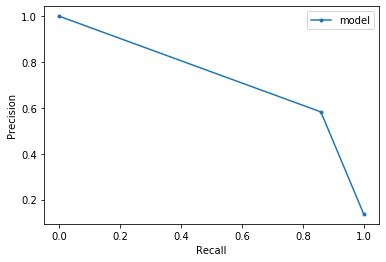

(0.7848173515981736, 275, 1814, 45, 197)

In [2308]:
evaluate(y_pred_class, y_test, y_probs)

In [2309]:
final_model = CatBoostClassifier(random_seed = 42) 

In [2310]:
cb_space = {
    'iterations' : np.arange(10, 2000, 20), 
    'learning_rate' : np.linspace(0.000001, 0.1),
    'max_depth' : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    'l2_leaf_reg': np.arange(2, 30), 
    'border_count' : np.arange(1, 255), 
    'bagging_temperature': np.linspace(0.0,1.0), 
    'random_strength': np.linspace(0.000000001, 1.0), 
    'one_hot_max_size': [1, 2, 3, 4, 5]}

In [2311]:
randomized_search_result = final_model.randomized_search(cb_space,train_pool, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.1807692	best: 0.1807692 (0)	total: 11.2s	remaining: 1m 40s
1:	loss: 0.1499905	best: 0.1499905 (1)	total: 22.2s	remaining: 1m 28s
2:	loss: 0.1499807	best: 0.1499807 (2)	total: 35.2s	remaining: 1m 22s
3:	loss: 0.1480545	best: 0.1480545 (3)	total: 57.4s	remaining: 1m 26s
4:	loss: 0.1471849	best: 0.1471849 (4)	total: 1m 21s	remaining: 1m 21s
5:	loss: 0.1514700	best: 0.1471849 (4)	total: 1m 25s	remaining: 57.1s
6:	loss: 0.1467986	best: 0.1467986 (6)	total: 1m 29s	remaining: 38.6s
7:	loss: 0.1460737	best: 0.1460737 (7)	total: 1m 54s	remaining: 28.6s
8:	loss: 0.1494128	best: 0.1460737 (7)	total: 1m 58s	remaining: 13.2s
9:	loss: 0.1476085	best: 0.1460737 (7)	total: 2m 7s	remaining: 0us
Estimating final quality...


In [2312]:
final_model

In [2313]:
cv_params = final_model.get_params()

cv_params.update({'loss_function': 'Logloss'})

cv_data = cv(
Pool(X_train, y_train, cat_features = categorical_features_indices), cv_params, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.5988405	test: 0.5991186	best: 0.5991186 (0)	total: 103ms	remaining: 3m 15s
1:	learn: 0.5208329	test: 0.5212002	best: 0.5212002 (1)	total: 291ms	remaining: 4m 34s
2:	learn: 0.4599474	test: 0.4604187	best: 0.4604187 (2)	total: 367ms	remaining: 3m 50s
3:	learn: 0.4105512	test: 0.4112885	best: 0.4112885 (3)	total: 436ms	remaining: 3m 25s
4:	learn: 0.3665226	test: 0.3672944	best: 0.3672944 (4)	total: 515ms	remaining: 3m 14s
5:	learn: 0.3324973	test: 0.3333593	best: 0.3333593 (5)	total: 593ms	remaining: 3m 6s
6:	learn: 0.3030625	test: 0.3042621	best: 0.3042621 (6)	total: 672ms	remaining: 3m
7:	learn: 0.2795577	test: 0.2811528	best: 0.2811528 (7)	total: 759ms	remaining: 2m 58s
8:	learn: 0.2615415	test: 0.2633520	best: 0.2633520 (8)	total: 837ms	remaining: 2m 54s
9:	learn: 0.2453238	test: 0.2473367	best: 0.2473367 (9)	total: 926ms	remaining: 2m 54s
10:	learn: 0.2317163	test: 0.2340621	best: 0.2340621 (10)	total: 1.01s	remaining: 2m 53s
11:	learn: 0.2203204	test: 0.2229462	best: 0.2

94:	learn: 0.1245160	test: 0.1482043	best: 0.1482043 (94)	total: 8.26s	remaining: 2m 36s
95:	learn: 0.1243109	test: 0.1481775	best: 0.1481775 (95)	total: 8.33s	remaining: 2m 35s
96:	learn: 0.1240207	test: 0.1481774	best: 0.1481774 (96)	total: 8.38s	remaining: 2m 34s
97:	learn: 0.1238099	test: 0.1481750	best: 0.1481750 (97)	total: 8.46s	remaining: 2m 34s
98:	learn: 0.1235739	test: 0.1481323	best: 0.1481323 (98)	total: 8.57s	remaining: 2m 35s
99:	learn: 0.1233383	test: 0.1480178	best: 0.1480178 (99)	total: 8.66s	remaining: 2m 35s
100:	learn: 0.1231048	test: 0.1479670	best: 0.1479670 (100)	total: 8.75s	remaining: 2m 34s
101:	learn: 0.1228244	test: 0.1479001	best: 0.1479001 (101)	total: 8.8s	remaining: 2m 34s
102:	learn: 0.1225881	test: 0.1478579	best: 0.1478579 (102)	total: 8.85s	remaining: 2m 33s
103:	learn: 0.1224020	test: 0.1478370	best: 0.1478370 (103)	total: 8.9s	remaining: 2m 32s
104:	learn: 0.1221860	test: 0.1478312	best: 0.1478312 (104)	total: 8.96s	remaining: 2m 32s
105:	learn: 0

186:	learn: 0.1113495	test: 0.1463199	best: 0.1463199 (186)	total: 14.6s	remaining: 2m 13s
187:	learn: 0.1112828	test: 0.1463149	best: 0.1463149 (187)	total: 14.7s	remaining: 2m 13s
188:	learn: 0.1112415	test: 0.1463003	best: 0.1463003 (188)	total: 14.8s	remaining: 2m 13s
189:	learn: 0.1111465	test: 0.1462924	best: 0.1462924 (189)	total: 14.9s	remaining: 2m 12s
190:	learn: 0.1110863	test: 0.1462733	best: 0.1462733 (190)	total: 14.9s	remaining: 2m 12s
191:	learn: 0.1109883	test: 0.1462465	best: 0.1462465 (191)	total: 15s	remaining: 2m 12s
192:	learn: 0.1109369	test: 0.1462481	best: 0.1462465 (191)	total: 15s	remaining: 2m 12s
193:	learn: 0.1108798	test: 0.1462524	best: 0.1462465 (191)	total: 15.1s	remaining: 2m 12s
194:	learn: 0.1108728	test: 0.1462531	best: 0.1462465 (191)	total: 15.2s	remaining: 2m 12s
195:	learn: 0.1108275	test: 0.1462571	best: 0.1462465 (191)	total: 15.2s	remaining: 2m 11s
196:	learn: 0.1107659	test: 0.1462258	best: 0.1462258 (196)	total: 15.3s	remaining: 2m 11s
197

279:	learn: 0.1038147	test: 0.1458620	best: 0.1458620 (279)	total: 21.1s	remaining: 2m 1s
280:	learn: 0.1037945	test: 0.1458564	best: 0.1458564 (280)	total: 21.1s	remaining: 2m 1s
281:	learn: 0.1036920	test: 0.1458714	best: 0.1458564 (280)	total: 21.2s	remaining: 2m
282:	learn: 0.1036242	test: 0.1458697	best: 0.1458564 (280)	total: 21.3s	remaining: 2m
283:	learn: 0.1035798	test: 0.1458827	best: 0.1458564 (280)	total: 21.4s	remaining: 2m
284:	learn: 0.1034965	test: 0.1458983	best: 0.1458564 (280)	total: 21.5s	remaining: 2m 1s
285:	learn: 0.1034809	test: 0.1458888	best: 0.1458564 (280)	total: 21.6s	remaining: 2m 1s
286:	learn: 0.1034755	test: 0.1458903	best: 0.1458564 (280)	total: 21.6s	remaining: 2m
287:	learn: 0.1034559	test: 0.1458910	best: 0.1458564 (280)	total: 21.7s	remaining: 2m
288:	learn: 0.1033826	test: 0.1458889	best: 0.1458564 (280)	total: 21.7s	remaining: 2m
289:	learn: 0.1032299	test: 0.1458099	best: 0.1458099 (289)	total: 21.8s	remaining: 2m
290:	learn: 0.1031111	test: 0.1

372:	learn: 0.0956936	test: 0.1459315	best: 0.1456992 (334)	total: 28.3s	remaining: 1m 55s
373:	learn: 0.0956913	test: 0.1459313	best: 0.1456992 (334)	total: 28.4s	remaining: 1m 55s
374:	learn: 0.0956092	test: 0.1459202	best: 0.1456992 (334)	total: 28.4s	remaining: 1m 54s
375:	learn: 0.0955806	test: 0.1459284	best: 0.1456992 (334)	total: 28.6s	remaining: 1m 54s
376:	learn: 0.0955371	test: 0.1459383	best: 0.1456992 (334)	total: 28.6s	remaining: 1m 54s
377:	learn: 0.0953752	test: 0.1459669	best: 0.1456992 (334)	total: 28.7s	remaining: 1m 54s
378:	learn: 0.0952819	test: 0.1459649	best: 0.1456992 (334)	total: 28.8s	remaining: 1m 54s
379:	learn: 0.0951988	test: 0.1459705	best: 0.1456992 (334)	total: 28.9s	remaining: 1m 54s
380:	learn: 0.0951012	test: 0.1459680	best: 0.1456992 (334)	total: 29s	remaining: 1m 54s
381:	learn: 0.0949518	test: 0.1459879	best: 0.1456992 (334)	total: 29.1s	remaining: 1m 54s
382:	learn: 0.0947990	test: 0.1459797	best: 0.1456992 (334)	total: 29.2s	remaining: 1m 54s
3

465:	learn: 0.0879324	test: 0.1460968	best: 0.1456992 (334)	total: 36.8s	remaining: 1m 52s
466:	learn: 0.0878426	test: 0.1461157	best: 0.1456992 (334)	total: 36.9s	remaining: 1m 52s
467:	learn: 0.0877651	test: 0.1461196	best: 0.1456992 (334)	total: 36.9s	remaining: 1m 52s
468:	learn: 0.0877533	test: 0.1461198	best: 0.1456992 (334)	total: 37s	remaining: 1m 52s
469:	learn: 0.0876529	test: 0.1461313	best: 0.1456992 (334)	total: 37.1s	remaining: 1m 51s
470:	learn: 0.0875909	test: 0.1461293	best: 0.1456992 (334)	total: 37.1s	remaining: 1m 51s
471:	learn: 0.0875804	test: 0.1461318	best: 0.1456992 (334)	total: 37.2s	remaining: 1m 51s
472:	learn: 0.0875096	test: 0.1461313	best: 0.1456992 (334)	total: 37.3s	remaining: 1m 51s
473:	learn: 0.0872976	test: 0.1461364	best: 0.1456992 (334)	total: 37.4s	remaining: 1m 51s
474:	learn: 0.0871799	test: 0.1461662	best: 0.1456992 (334)	total: 37.4s	remaining: 1m 51s
475:	learn: 0.0870584	test: 0.1461699	best: 0.1456992 (334)	total: 37.5s	remaining: 1m 51s
4

557:	learn: 0.0810939	test: 0.1464574	best: 0.1456992 (334)	total: 43s	remaining: 1m 42s
558:	learn: 0.0810379	test: 0.1464386	best: 0.1456992 (334)	total: 43.1s	remaining: 1m 42s
559:	learn: 0.0809522	test: 0.1464479	best: 0.1456992 (334)	total: 43.2s	remaining: 1m 42s
560:	learn: 0.0809241	test: 0.1464494	best: 0.1456992 (334)	total: 43.3s	remaining: 1m 42s
561:	learn: 0.0808513	test: 0.1464432	best: 0.1456992 (334)	total: 43.4s	remaining: 1m 42s
562:	learn: 0.0808062	test: 0.1464424	best: 0.1456992 (334)	total: 43.4s	remaining: 1m 42s
563:	learn: 0.0807319	test: 0.1464285	best: 0.1456992 (334)	total: 43.5s	remaining: 1m 42s
564:	learn: 0.0806892	test: 0.1464425	best: 0.1456992 (334)	total: 43.6s	remaining: 1m 42s
565:	learn: 0.0806245	test: 0.1464418	best: 0.1456992 (334)	total: 43.6s	remaining: 1m 42s
566:	learn: 0.0805660	test: 0.1464526	best: 0.1456992 (334)	total: 43.7s	remaining: 1m 41s
567:	learn: 0.0805074	test: 0.1464440	best: 0.1456992 (334)	total: 43.7s	remaining: 1m 41s
5

648:	learn: 0.0745737	test: 0.1467513	best: 0.1456992 (334)	total: 51.5s	remaining: 1m 38s
649:	learn: 0.0745731	test: 0.1467512	best: 0.1456992 (334)	total: 51.6s	remaining: 1m 38s
650:	learn: 0.0745011	test: 0.1467447	best: 0.1456992 (334)	total: 51.7s	remaining: 1m 38s
651:	learn: 0.0744081	test: 0.1467211	best: 0.1456992 (334)	total: 51.8s	remaining: 1m 38s
652:	learn: 0.0743244	test: 0.1467546	best: 0.1456992 (334)	total: 51.9s	remaining: 1m 38s
653:	learn: 0.0741957	test: 0.1467582	best: 0.1456992 (334)	total: 52s	remaining: 1m 38s
654:	learn: 0.0741713	test: 0.1467634	best: 0.1456992 (334)	total: 52.1s	remaining: 1m 38s
655:	learn: 0.0740470	test: 0.1467671	best: 0.1456992 (334)	total: 52.2s	remaining: 1m 38s
656:	learn: 0.0739982	test: 0.1467705	best: 0.1456992 (334)	total: 52.3s	remaining: 1m 38s
657:	learn: 0.0738795	test: 0.1467738	best: 0.1456992 (334)	total: 52.4s	remaining: 1m 38s
658:	learn: 0.0738350	test: 0.1467733	best: 0.1456992 (334)	total: 52.5s	remaining: 1m 38s
6

739:	learn: 0.0683254	test: 0.1473953	best: 0.1456992 (334)	total: 1m 4s	remaining: 1m 39s
740:	learn: 0.0682999	test: 0.1473961	best: 0.1456992 (334)	total: 1m 4s	remaining: 1m 39s
741:	learn: 0.0681691	test: 0.1473638	best: 0.1456992 (334)	total: 1m 4s	remaining: 1m 39s
742:	learn: 0.0681224	test: 0.1473754	best: 0.1456992 (334)	total: 1m 4s	remaining: 1m 39s
743:	learn: 0.0680593	test: 0.1473902	best: 0.1456992 (334)	total: 1m 4s	remaining: 1m 39s
744:	learn: 0.0679980	test: 0.1473875	best: 0.1456992 (334)	total: 1m 4s	remaining: 1m 39s
745:	learn: 0.0679283	test: 0.1473778	best: 0.1456992 (334)	total: 1m 4s	remaining: 1m 39s
746:	learn: 0.0678980	test: 0.1473816	best: 0.1456992 (334)	total: 1m 5s	remaining: 1m 39s
747:	learn: 0.0678407	test: 0.1473967	best: 0.1456992 (334)	total: 1m 5s	remaining: 1m 39s
748:	learn: 0.0677675	test: 0.1473969	best: 0.1456992 (334)	total: 1m 5s	remaining: 1m 39s
749:	learn: 0.0677201	test: 0.1474253	best: 0.1456992 (334)	total: 1m 5s	remaining: 1m 39s

831:	learn: 0.0625900	test: 0.1480277	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
832:	learn: 0.0625076	test: 0.1480228	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
833:	learn: 0.0623954	test: 0.1480183	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
834:	learn: 0.0623195	test: 0.1479956	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
835:	learn: 0.0622745	test: 0.1479942	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
836:	learn: 0.0621781	test: 0.1480281	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
837:	learn: 0.0621055	test: 0.1480648	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
838:	learn: 0.0620006	test: 0.1480799	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 32s
839:	learn: 0.0619251	test: 0.1480935	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 31s
840:	learn: 0.0618515	test: 0.1480988	best: 0.1456992 (334)	total: 1m 13s	remaining: 1m 31s
841:	learn: 0.0617550	test: 0.1480957	best: 0.1456992 (334)	total: 1m 13s	remain

923:	learn: 0.0565401	test: 0.1489064	best: 0.1456992 (334)	total: 1m 19s	remaining: 1m 23s
924:	learn: 0.0564465	test: 0.1489294	best: 0.1456992 (334)	total: 1m 19s	remaining: 1m 23s
925:	learn: 0.0564213	test: 0.1489383	best: 0.1456992 (334)	total: 1m 20s	remaining: 1m 23s
926:	learn: 0.0563482	test: 0.1489534	best: 0.1456992 (334)	total: 1m 20s	remaining: 1m 23s
927:	learn: 0.0563021	test: 0.1489703	best: 0.1456992 (334)	total: 1m 20s	remaining: 1m 23s
928:	learn: 0.0562792	test: 0.1489767	best: 0.1456992 (334)	total: 1m 20s	remaining: 1m 23s
929:	learn: 0.0562361	test: 0.1490108	best: 0.1456992 (334)	total: 1m 20s	remaining: 1m 23s
930:	learn: 0.0561894	test: 0.1490188	best: 0.1456992 (334)	total: 1m 20s	remaining: 1m 23s
931:	learn: 0.0561469	test: 0.1490321	best: 0.1456992 (334)	total: 1m 20s	remaining: 1m 23s
932:	learn: 0.0561178	test: 0.1490373	best: 0.1456992 (334)	total: 1m 21s	remaining: 1m 23s
933:	learn: 0.0560473	test: 0.1490329	best: 0.1456992 (334)	total: 1m 21s	remain

1013:	learn: 0.0514056	test: 0.1496550	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 15s
1014:	learn: 0.0513283	test: 0.1496554	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 15s
1015:	learn: 0.0513083	test: 0.1496745	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 15s
1016:	learn: 0.0512536	test: 0.1496694	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 15s
1017:	learn: 0.0511914	test: 0.1496681	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 15s
1018:	learn: 0.0511236	test: 0.1496753	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 15s
1019:	learn: 0.0510608	test: 0.1497184	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 14s
1020:	learn: 0.0510395	test: 0.1497270	best: 0.1456992 (334)	total: 1m 27s	remaining: 1m 14s
1021:	learn: 0.0509921	test: 0.1497423	best: 0.1456992 (334)	total: 1m 28s	remaining: 1m 14s
1022:	learn: 0.0509617	test: 0.1497643	best: 0.1456992 (334)	total: 1m 28s	remaining: 1m 14s
1023:	learn: 0.0509385	test: 0.1497674	best: 0.1456992 (334)	total: 1m

1103:	learn: 0.0475251	test: 0.1504975	best: 0.1456992 (334)	total: 1m 34s	remaining: 1m 7s
1104:	learn: 0.0474401	test: 0.1504940	best: 0.1456992 (334)	total: 1m 34s	remaining: 1m 7s
1105:	learn: 0.0474045	test: 0.1505038	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 7s
1106:	learn: 0.0473571	test: 0.1505024	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 7s
1107:	learn: 0.0473035	test: 0.1505005	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 7s
1108:	learn: 0.0472937	test: 0.1504974	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 7s
1109:	learn: 0.0472501	test: 0.1505330	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 7s
1110:	learn: 0.0472142	test: 0.1505414	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 7s
1111:	learn: 0.0471822	test: 0.1505270	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 7s
1112:	learn: 0.0471449	test: 0.1505328	best: 0.1456992 (334)	total: 1m 35s	remaining: 1m 6s
1113:	learn: 0.0470928	test: 0.1505269	best: 0.1456992 (334)	total: 1m 35s	remai

1194:	learn: 0.0434542	test: 0.1512854	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1195:	learn: 0.0434097	test: 0.1512874	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1196:	learn: 0.0433728	test: 0.1512954	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1197:	learn: 0.0433555	test: 0.1512920	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1198:	learn: 0.0433224	test: 0.1513141	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1199:	learn: 0.0433124	test: 0.1513104	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1200:	learn: 0.0432772	test: 0.1513274	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1201:	learn: 0.0432084	test: 0.1513211	best: 0.1456992 (334)	total: 1m 44s	remaining: 1m
1202:	learn: 0.0431387	test: 0.1513348	best: 0.1456992 (334)	total: 1m 45s	remaining: 1m
1203:	learn: 0.0431255	test: 0.1513302	best: 0.1456992 (334)	total: 1m 45s	remaining: 59.9s
1204:	learn: 0.0431182	test: 0.1513267	best: 0.1456992 (334)	total: 1m 45s	remaining: 59.8s
1205:	learn: 0.

1284:	learn: 0.0400694	test: 0.1521173	best: 0.1456992 (334)	total: 1m 51s	remaining: 52.6s
1285:	learn: 0.0400268	test: 0.1521290	best: 0.1456992 (334)	total: 1m 51s	remaining: 52.5s
1286:	learn: 0.0399631	test: 0.1521002	best: 0.1456992 (334)	total: 1m 51s	remaining: 52.5s
1287:	learn: 0.0399301	test: 0.1521114	best: 0.1456992 (334)	total: 1m 52s	remaining: 52.4s
1288:	learn: 0.0398848	test: 0.1521249	best: 0.1456992 (334)	total: 1m 52s	remaining: 52.4s
1289:	learn: 0.0398630	test: 0.1521260	best: 0.1456992 (334)	total: 1m 52s	remaining: 52.3s
1290:	learn: 0.0398013	test: 0.1521810	best: 0.1456992 (334)	total: 1m 52s	remaining: 52.2s
1291:	learn: 0.0397461	test: 0.1521906	best: 0.1456992 (334)	total: 1m 52s	remaining: 52.1s
1292:	learn: 0.0397303	test: 0.1521961	best: 0.1456992 (334)	total: 1m 52s	remaining: 52s
1293:	learn: 0.0396874	test: 0.1521959	best: 0.1456992 (334)	total: 1m 52s	remaining: 51.9s
1294:	learn: 0.0396310	test: 0.1522082	best: 0.1456992 (334)	total: 1m 52s	remaini

1375:	learn: 0.0366995	test: 0.1532243	best: 0.1456992 (334)	total: 1m 59s	remaining: 44.5s
1376:	learn: 0.0366816	test: 0.1532285	best: 0.1456992 (334)	total: 1m 59s	remaining: 44.4s
1377:	learn: 0.0366317	test: 0.1532457	best: 0.1456992 (334)	total: 1m 59s	remaining: 44.3s
1378:	learn: 0.0366026	test: 0.1532488	best: 0.1456992 (334)	total: 1m 59s	remaining: 44.2s
1379:	learn: 0.0365802	test: 0.1532756	best: 0.1456992 (334)	total: 1m 59s	remaining: 44.1s
1380:	learn: 0.0365454	test: 0.1532934	best: 0.1456992 (334)	total: 1m 59s	remaining: 44s
1381:	learn: 0.0365232	test: 0.1533115	best: 0.1456992 (334)	total: 1m 59s	remaining: 43.9s
1382:	learn: 0.0365172	test: 0.1533170	best: 0.1456992 (334)	total: 1m 59s	remaining: 43.8s
1383:	learn: 0.0365086	test: 0.1533196	best: 0.1456992 (334)	total: 1m 59s	remaining: 43.7s
1384:	learn: 0.0364839	test: 0.1533482	best: 0.1456992 (334)	total: 1m 59s	remaining: 43.6s
1385:	learn: 0.0364472	test: 0.1533499	best: 0.1456992 (334)	total: 1m 59s	remaini

1468:	learn: 0.0340996	test: 0.1543198	best: 0.1456992 (334)	total: 2m 5s	remaining: 36s
1469:	learn: 0.0340598	test: 0.1543232	best: 0.1456992 (334)	total: 2m 5s	remaining: 36s
1470:	learn: 0.0340175	test: 0.1543048	best: 0.1456992 (334)	total: 2m 5s	remaining: 35.9s
1471:	learn: 0.0339712	test: 0.1542765	best: 0.1456992 (334)	total: 2m 5s	remaining: 35.8s
1472:	learn: 0.0339423	test: 0.1543069	best: 0.1456992 (334)	total: 2m 5s	remaining: 35.7s
1473:	learn: 0.0339093	test: 0.1543199	best: 0.1456992 (334)	total: 2m 6s	remaining: 35.6s
1474:	learn: 0.0338675	test: 0.1543366	best: 0.1456992 (334)	total: 2m 6s	remaining: 35.5s
1475:	learn: 0.0338388	test: 0.1543690	best: 0.1456992 (334)	total: 2m 6s	remaining: 35.4s
1476:	learn: 0.0338027	test: 0.1544057	best: 0.1456992 (334)	total: 2m 6s	remaining: 35.3s
1477:	learn: 0.0337580	test: 0.1544304	best: 0.1456992 (334)	total: 2m 6s	remaining: 35.2s
1478:	learn: 0.0337095	test: 0.1544164	best: 0.1456992 (334)	total: 2m 6s	remaining: 35.1s
147

1559:	learn: 0.0314345	test: 0.1557171	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.9s
1560:	learn: 0.0314186	test: 0.1557216	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.9s
1561:	learn: 0.0314019	test: 0.1557340	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.8s
1562:	learn: 0.0313949	test: 0.1557302	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.7s
1563:	learn: 0.0313819	test: 0.1557398	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.6s
1564:	learn: 0.0313717	test: 0.1557560	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.5s
1565:	learn: 0.0313339	test: 0.1557511	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.4s
1566:	learn: 0.0313209	test: 0.1557643	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.3s
1567:	learn: 0.0312951	test: 0.1557856	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.2s
1568:	learn: 0.0312709	test: 0.1558097	best: 0.1456992 (334)	total: 2m 12s	remaining: 27.2s
1569:	learn: 0.0312444	test: 0.1558131	best: 0.1456992 (334)	total: 2m 12s	remai

1650:	learn: 0.0297851	test: 0.1565260	best: 0.1456992 (334)	total: 2m 18s	remaining: 20.1s
1651:	learn: 0.0297665	test: 0.1565350	best: 0.1456992 (334)	total: 2m 18s	remaining: 20s
1652:	learn: 0.0297535	test: 0.1565391	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.9s
1653:	learn: 0.0297300	test: 0.1565455	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.8s
1654:	learn: 0.0297200	test: 0.1565398	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.8s
1655:	learn: 0.0296905	test: 0.1565635	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.7s
1656:	learn: 0.0296794	test: 0.1565669	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.6s
1657:	learn: 0.0296466	test: 0.1565903	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.5s
1658:	learn: 0.0296361	test: 0.1565932	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.4s
1659:	learn: 0.0295837	test: 0.1566358	best: 0.1456992 (334)	total: 2m 19s	remaining: 19.3s
1660:	learn: 0.0295703	test: 0.1566468	best: 0.1456992 (334)	total: 2m 19s	remaini

1742:	learn: 0.0282208	test: 0.1572152	best: 0.1456992 (334)	total: 2m 25s	remaining: 12.3s
1743:	learn: 0.0282055	test: 0.1572260	best: 0.1456992 (334)	total: 2m 26s	remaining: 12.2s
1744:	learn: 0.0281993	test: 0.1572269	best: 0.1456992 (334)	total: 2m 26s	remaining: 12.1s
1745:	learn: 0.0281922	test: 0.1572266	best: 0.1456992 (334)	total: 2m 26s	remaining: 12.1s
1746:	learn: 0.0281834	test: 0.1572409	best: 0.1456992 (334)	total: 2m 26s	remaining: 12s
1747:	learn: 0.0281743	test: 0.1572475	best: 0.1456992 (334)	total: 2m 26s	remaining: 11.9s
1748:	learn: 0.0281468	test: 0.1572504	best: 0.1456992 (334)	total: 2m 26s	remaining: 11.8s
1749:	learn: 0.0281408	test: 0.1572581	best: 0.1456992 (334)	total: 2m 26s	remaining: 11.7s
1750:	learn: 0.0281187	test: 0.1572771	best: 0.1456992 (334)	total: 2m 26s	remaining: 11.6s
1751:	learn: 0.0280997	test: 0.1572985	best: 0.1456992 (334)	total: 2m 26s	remaining: 11.5s
1752:	learn: 0.0280903	test: 0.1573027	best: 0.1456992 (334)	total: 2m 26s	remaini

1832:	learn: 0.0266932	test: 0.1581243	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.76s
1833:	learn: 0.0266885	test: 0.1581226	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.68s
1834:	learn: 0.0266683	test: 0.1581319	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.59s
1835:	learn: 0.0266417	test: 0.1581316	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.51s
1836:	learn: 0.0266406	test: 0.1581313	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.43s
1837:	learn: 0.0266275	test: 0.1581414	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.34s
1838:	learn: 0.0265915	test: 0.1581646	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.26s
1839:	learn: 0.0265873	test: 0.1581635	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.17s
1840:	learn: 0.0265668	test: 0.1581777	best: 0.1456992 (334)	total: 2m 33s	remaining: 4.09s
1841:	learn: 0.0265513	test: 0.1581995	best: 0.1456992 (334)	total: 2m 33s	remaining: 4s
1842:	learn: 0.0265363	test: 0.1582121	best: 0.1456992 (334)	total: 2m 33s	remainin

In [2314]:
y_preds = final_model.predict(validate_pool)
y_probs = final_model.predict_proba(validate_pool)[:,1]

In [2315]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val)

Best F2 score: 0.7837837837837837 at a threshold of 0.08


(0.08, 0.7837837837837837)

In [2316]:
#make prediction from the test set 
y_preds = final_model.predict(test_pool)
y_probs = final_model.predict_proba(test_pool)[:,1]

In [2317]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.08, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1786  225]
 [  38  282]]

True Positives: 282
True Negatives: 1786
False Positives: 225
False Negatives: 38


Recall: 0.88125
Precision: 0.5562130177514792
Specificity 0.8881153654898061
F1 score: 0.6819830713422007
F2 score: 0.7890318970341353


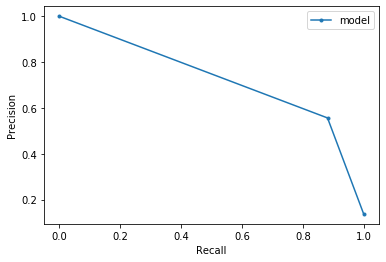

(0.7890318970341353, 282, 1786, 38, 225)

In [2318]:
evaluate(y_pred_class, y_test, y_probs)

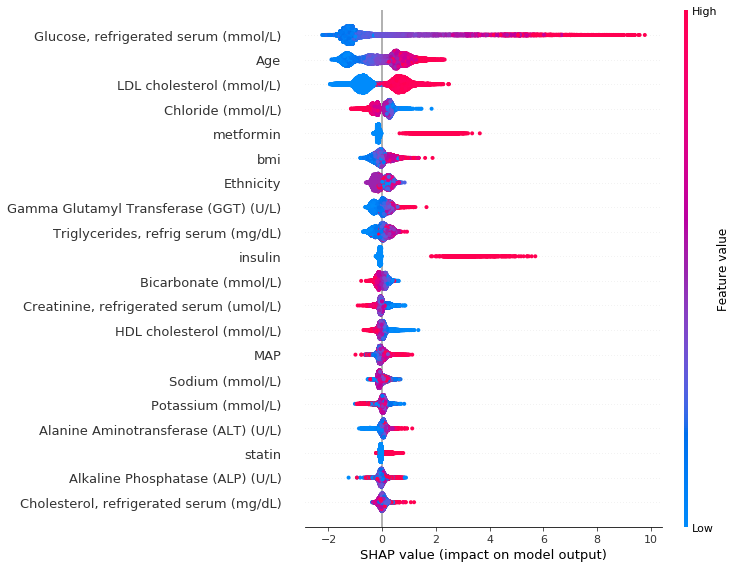

In [2319]:
shap_values = final_model.get_feature_importance(train_pool, type="ShapValues")
shap_values = shap_values[:,:-1]
shap.summary_plot(shap_values, X_train)

In [2320]:
shap_values.shape

(17482, 29)

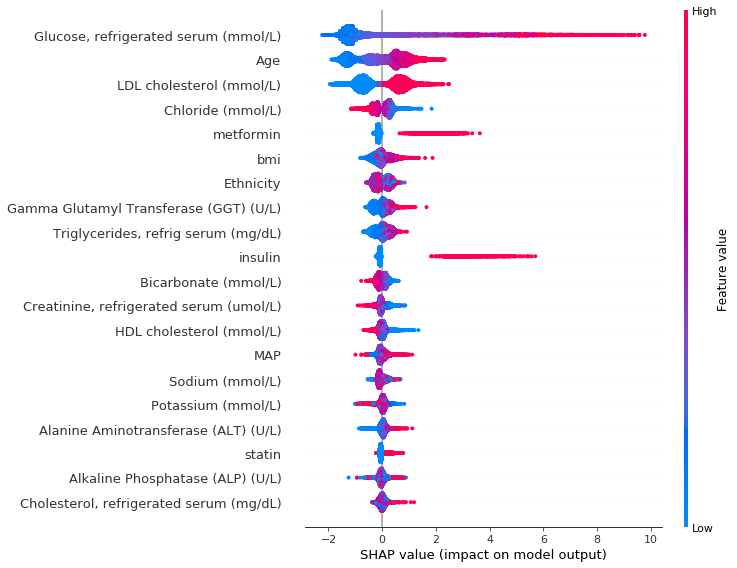

In [2321]:
shap.summary_plot(shap_values, X_train)

In [2322]:
feature_importance = {}

for i in enumerate(X_train.columns): 
    
    feature_importance[i[1]] = np.mean(np.abs([item[i[0]] for item in shap_values]))

In [2323]:
feature_importance = pd.DataFrame.from_dict(feature_importance, orient='index').reset_index()

In [2324]:
feature_importance.columns = ['Feature', 'SHAP value']

In [2325]:
feature_importance.sort_values(by=['SHAP value'],ascending=False,inplace=True)

In [2326]:
ordered_features_cb = list(feature_importance['Feature'])

In [2327]:
ordered_features_cb

['Glucose, refrigerated serum (mmol/L)',
 'Age',
 'LDL cholesterol (mmol/L)',
 'Chloride (mmol/L)',
 'metformin',
 'bmi',
 'Ethnicity',
 'Gamma Glutamyl Transferase (GGT) (U/L)',
 'Triglycerides, refrig serum (mg/dL)',
 'insulin',
 'Bicarbonate (mmol/L)',
 'Creatinine, refrigerated serum (umol/L)',
 'HDL cholesterol (mmol/L)',
 'MAP',
 'Sodium (mmol/L)',
 'Potassium (mmol/L)',
 'Alanine Aminotransferase (ALT) (U/L)',
 'statin',
 'Alkaline Phosphatase (ALP) (U/L)',
 'Cholesterol, refrigerated serum (mg/dL)',
 'eGFR',
 'Albumin, refrigerated serum (g/dL)',
 'Total Bilirubin (umol/L)',
 'Total Calcium (mmol/L)',
 'Aspartate Aminotransferase (AST) (U/L)',
 'Blood Urea Nitrogen (g/dL)',
 'other_agents',
 'Gender',
 'ace_arbs']

In [2328]:
def cb_process(df, features): 

    #prepare df 
    X = df[features]
    y = df['diagnostic_t2dm']
    
    #assign categorical features 
    
    if 'Gender' in features: 
        X['Gender'] = X['Gender'].astype(str, copy=False)
    else: 
        pass 
    
    if 'Ethnicity' in features: 
        X['Ethnicity'] = X['Ethnicity'].astype(str, copy=False)
    else: 
        pass 
    
    if 'insulin' in features: 
        X['insulin'] = X['insulin'].astype(str, copy=False)
    else: 
        pass 
    
    if 'metformin' in features:
        X['metformin'] = X['metformin'].astype(str, copy=False)
    else: 
        pass 
    
    if 'other_agents' in features: 
        X['other_agents'] = X['other_agents'].astype(str, copy=False)
    else: 
        pass 
    
    if 'statin' in features: 
        X['statin'] = X['statin'].astype(str, copy=False)
    else: 
        pass 
    
    if 'ace_arbs' in features: 
        X['ace_arbs'] = X['ace_arbs'].astype(str, copy=False)
    else: 
        pass 
    
    #split into train-test (10% test and 15% validate)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.056, random_state=1, stratify = y_train)

    #categorical features 
    categorical_features_indices = np.where(X_train.dtypes != np.float)[0]
    
    #continuous features 
    continuous = []

    for i in np.where(X_train.dtypes == np.float)[0]: 
        continuous.append(list(X_train.columns)[i])
    
    
    #scale 
    scaler = StandardScaler()

    X_train[continuous] = scaler.fit_transform(X_train[continuous])
    X_test[continuous] = scaler.transform(X_test[continuous])
    X_val[continuous] = scaler.transform(X_val[continuous])
    
    #instantiate 
    model = CatBoostClassifier(random_seed = 42) 

    train_pool = Pool(X_train, y_train, cat_features=categorical_features_indices)
    validate_pool = Pool(X_val, y_val, cat_features=categorical_features_indices)
    test_pool = Pool(X_test, y_test, cat_features=categorical_features_indices)
    
    #fit 
    model.fit(train_pool)
    
    #predict for validate set 
    y_preds = model.predict(validate_pool)
    y_probs = model.predict_proba(validate_pool)[:,1]
    
    #select threshold based on validate dataset 
    threshold, result = threshold_setting(y_probs, y_val)
    
    #apply this threshold to the test set 
    y_preds = model.predict(test_pool)
    y_probs = model.predict_proba(test_pool)[:,1]
    
    #apply threshold 
    y_pred_class = np.where(y_probs > threshold, 1, 0)
    
    #evaluate
    fbeta, TP, TN, FN, FP = evaluate(y_pred_class, y_test, y_probs)
    
    return(fbeta)
   


**************

TESTING: 2 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age'] 

Learning rate set to 0.036868
0:	learn: 0.6400684	total: 17.3ms	remaining: 17.2s
1:	learn: 0.5930919	total: 30.5ms	remaining: 15.2s
2:	learn: 0.5544170	total: 47ms	remaining: 15.6s
3:	learn: 0.5145197	total: 61.9ms	remaining: 15.4s
4:	learn: 0.4775981	total: 77.1ms	remaining: 15.3s
5:	learn: 0.4478879	total: 92.5ms	remaining: 15.3s
6:	learn: 0.4205959	total: 104ms	remaining: 14.8s
7:	learn: 0.3954087	total: 119ms	remaining: 14.7s
8:	learn: 0.3760499	total: 134ms	remaining: 14.8s
9:	learn: 0.3579292	total: 145ms	remaining: 14.4s
10:	learn: 0.3413300	total: 160ms	remaining: 14.4s
11:	learn: 0.3267374	total: 181ms	remaining: 14.9s
12:	learn: 0.3126469	total: 196ms	remaining: 14.9s
13:	learn: 0.3021343	total: 213ms	remaining: 15s
14:	learn: 0.2905057	total: 228ms	remaining: 15s
15:	learn: 0.2824284	total: 242ms	remaining: 14.9s
16:	learn: 0.2748694	total: 257ms	remaining: 14.9s
17:	learn: 0.2678673	tot

166:	learn: 0.1863436	total: 1.75s	remaining: 8.72s
167:	learn: 0.1863179	total: 1.76s	remaining: 8.73s
168:	learn: 0.1862873	total: 1.78s	remaining: 8.74s
169:	learn: 0.1862733	total: 1.79s	remaining: 8.74s
170:	learn: 0.1862623	total: 1.8s	remaining: 8.75s
171:	learn: 0.1862336	total: 1.81s	remaining: 8.73s
172:	learn: 0.1862011	total: 1.82s	remaining: 8.71s
173:	learn: 0.1861861	total: 1.83s	remaining: 8.68s
174:	learn: 0.1861599	total: 1.84s	remaining: 8.67s
175:	learn: 0.1861380	total: 1.84s	remaining: 8.64s
176:	learn: 0.1861144	total: 1.85s	remaining: 8.61s
177:	learn: 0.1860866	total: 1.86s	remaining: 8.57s
178:	learn: 0.1860477	total: 1.86s	remaining: 8.54s
179:	learn: 0.1860246	total: 1.87s	remaining: 8.52s
180:	learn: 0.1859946	total: 1.88s	remaining: 8.49s
181:	learn: 0.1859860	total: 1.88s	remaining: 8.46s
182:	learn: 0.1859606	total: 1.89s	remaining: 8.44s
183:	learn: 0.1859310	total: 1.89s	remaining: 8.4s
184:	learn: 0.1859034	total: 1.9s	remaining: 8.38s
185:	learn: 0.1

339:	learn: 0.1820663	total: 3.16s	remaining: 6.14s
340:	learn: 0.1820450	total: 3.18s	remaining: 6.14s
341:	learn: 0.1820281	total: 3.19s	remaining: 6.14s
342:	learn: 0.1819966	total: 3.2s	remaining: 6.13s
343:	learn: 0.1819717	total: 3.21s	remaining: 6.13s
344:	learn: 0.1819403	total: 3.23s	remaining: 6.13s
345:	learn: 0.1819056	total: 3.23s	remaining: 6.11s
346:	learn: 0.1818759	total: 3.24s	remaining: 6.1s
347:	learn: 0.1818270	total: 3.25s	remaining: 6.08s
348:	learn: 0.1818067	total: 3.25s	remaining: 6.07s
349:	learn: 0.1817743	total: 3.26s	remaining: 6.05s
350:	learn: 0.1817576	total: 3.27s	remaining: 6.04s
351:	learn: 0.1817391	total: 3.27s	remaining: 6.02s
352:	learn: 0.1817147	total: 3.28s	remaining: 6.01s
353:	learn: 0.1816747	total: 3.28s	remaining: 5.99s
354:	learn: 0.1816489	total: 3.29s	remaining: 5.98s
355:	learn: 0.1816129	total: 3.3s	remaining: 5.96s
356:	learn: 0.1815901	total: 3.3s	remaining: 5.95s
357:	learn: 0.1815566	total: 3.31s	remaining: 5.93s
358:	learn: 0.18

499:	learn: 0.1782287	total: 4.38s	remaining: 4.38s
500:	learn: 0.1782040	total: 4.4s	remaining: 4.38s
501:	learn: 0.1781803	total: 4.41s	remaining: 4.38s
502:	learn: 0.1781703	total: 4.42s	remaining: 4.37s
503:	learn: 0.1781327	total: 4.44s	remaining: 4.37s
504:	learn: 0.1781080	total: 4.45s	remaining: 4.36s
505:	learn: 0.1780780	total: 4.45s	remaining: 4.35s
506:	learn: 0.1780568	total: 4.46s	remaining: 4.34s
507:	learn: 0.1780339	total: 4.47s	remaining: 4.33s
508:	learn: 0.1780010	total: 4.47s	remaining: 4.31s
509:	learn: 0.1779796	total: 4.48s	remaining: 4.3s
510:	learn: 0.1779566	total: 4.49s	remaining: 4.29s
511:	learn: 0.1779257	total: 4.49s	remaining: 4.28s
512:	learn: 0.1778976	total: 4.5s	remaining: 4.27s
513:	learn: 0.1778838	total: 4.5s	remaining: 4.26s
514:	learn: 0.1778543	total: 4.51s	remaining: 4.25s
515:	learn: 0.1778319	total: 4.52s	remaining: 4.24s
516:	learn: 0.1778041	total: 4.52s	remaining: 4.23s
517:	learn: 0.1777732	total: 4.53s	remaining: 4.22s
518:	learn: 0.17

668:	learn: 0.1748133	total: 5.8s	remaining: 2.87s
669:	learn: 0.1747803	total: 5.81s	remaining: 2.86s
670:	learn: 0.1747740	total: 5.83s	remaining: 2.86s
671:	learn: 0.1747570	total: 5.84s	remaining: 2.85s
672:	learn: 0.1747456	total: 5.86s	remaining: 2.85s
673:	learn: 0.1747350	total: 5.87s	remaining: 2.84s
674:	learn: 0.1747258	total: 5.87s	remaining: 2.83s
675:	learn: 0.1746952	total: 5.88s	remaining: 2.82s
676:	learn: 0.1746695	total: 5.89s	remaining: 2.81s
677:	learn: 0.1746523	total: 5.9s	remaining: 2.8s
678:	learn: 0.1746237	total: 5.9s	remaining: 2.79s
679:	learn: 0.1746149	total: 5.91s	remaining: 2.78s
680:	learn: 0.1745935	total: 5.92s	remaining: 2.77s
681:	learn: 0.1745778	total: 5.92s	remaining: 2.76s
682:	learn: 0.1745693	total: 5.93s	remaining: 2.75s
683:	learn: 0.1745497	total: 5.94s	remaining: 2.74s
684:	learn: 0.1745416	total: 5.95s	remaining: 2.73s
685:	learn: 0.1745209	total: 5.95s	remaining: 2.73s
686:	learn: 0.1745130	total: 5.96s	remaining: 2.72s
687:	learn: 0.17

845:	learn: 0.1719917	total: 7.23s	remaining: 1.31s
846:	learn: 0.1719769	total: 7.24s	remaining: 1.31s
847:	learn: 0.1719724	total: 7.26s	remaining: 1.3s
848:	learn: 0.1719628	total: 7.27s	remaining: 1.29s
849:	learn: 0.1719552	total: 7.28s	remaining: 1.28s
850:	learn: 0.1719404	total: 7.29s	remaining: 1.28s
851:	learn: 0.1719256	total: 7.3s	remaining: 1.27s
852:	learn: 0.1719189	total: 7.3s	remaining: 1.26s
853:	learn: 0.1719120	total: 7.31s	remaining: 1.25s
854:	learn: 0.1718870	total: 7.32s	remaining: 1.24s
855:	learn: 0.1718751	total: 7.32s	remaining: 1.23s
856:	learn: 0.1718589	total: 7.33s	remaining: 1.22s
857:	learn: 0.1718427	total: 7.34s	remaining: 1.21s
858:	learn: 0.1718341	total: 7.34s	remaining: 1.21s
859:	learn: 0.1718164	total: 7.35s	remaining: 1.2s
860:	learn: 0.1717918	total: 7.35s	remaining: 1.19s
861:	learn: 0.1717846	total: 7.36s	remaining: 1.18s
862:	learn: 0.1717798	total: 7.37s	remaining: 1.17s
863:	learn: 0.1717630	total: 7.37s	remaining: 1.16s
864:	learn: 0.17

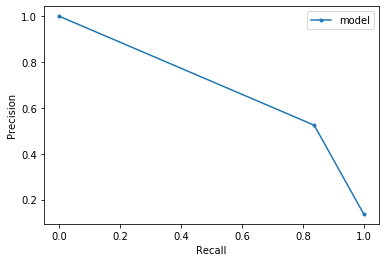

0.7481853713009493

**************

TESTING: 3 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6472496	total: 18.3ms	remaining: 18.3s
1:	learn: 0.5960327	total: 35.4ms	remaining: 17.7s
2:	learn: 0.5530138	total: 49.3ms	remaining: 16.4s
3:	learn: 0.5152161	total: 67.3ms	remaining: 16.8s
4:	learn: 0.4833583	total: 82.1ms	remaining: 16.3s
5:	learn: 0.4469463	total: 95.5ms	remaining: 15.8s
6:	learn: 0.4157505	total: 107ms	remaining: 15.2s
7:	learn: 0.3926997	total: 113ms	remaining: 14s
8:	learn: 0.3714196	total: 119ms	remaining: 13.1s
9:	learn: 0.3526038	total: 126ms	remaining: 12.5s
10:	learn: 0.3352500	total: 133ms	remaining: 11.9s
11:	learn: 0.3191411	total: 139ms	remaining: 11.4s
12:	learn: 0.3061293	total: 145ms	remaining: 11s
13:	learn: 0.2945788	total: 151ms	remaining: 10.6s
14:	learn: 0.2825824	total: 166ms	remaining: 10.9s
15:	learn: 0.2708333	total: 182ms	remaining: 11.2s
16:	learn: 0.2626619	total

167:	learn: 0.1630136	total: 1.59s	remaining: 7.89s
168:	learn: 0.1629860	total: 1.61s	remaining: 7.91s
169:	learn: 0.1629671	total: 1.62s	remaining: 7.92s
170:	learn: 0.1629496	total: 1.63s	remaining: 7.92s
171:	learn: 0.1629140	total: 1.65s	remaining: 7.93s
172:	learn: 0.1628594	total: 1.66s	remaining: 7.94s
173:	learn: 0.1628267	total: 1.68s	remaining: 7.96s
174:	learn: 0.1627583	total: 1.69s	remaining: 7.98s
175:	learn: 0.1627101	total: 1.7s	remaining: 7.97s
176:	learn: 0.1626622	total: 1.71s	remaining: 7.97s
177:	learn: 0.1626485	total: 1.72s	remaining: 7.94s
178:	learn: 0.1626321	total: 1.73s	remaining: 7.92s
179:	learn: 0.1626047	total: 1.73s	remaining: 7.89s
180:	learn: 0.1625607	total: 1.74s	remaining: 7.87s
181:	learn: 0.1625091	total: 1.75s	remaining: 7.84s
182:	learn: 0.1624810	total: 1.75s	remaining: 7.82s
183:	learn: 0.1624461	total: 1.76s	remaining: 7.79s
184:	learn: 0.1624280	total: 1.76s	remaining: 7.77s
185:	learn: 0.1624027	total: 1.77s	remaining: 7.75s
186:	learn: 0

326:	learn: 0.1573638	total: 3.09s	remaining: 6.37s
327:	learn: 0.1573095	total: 3.11s	remaining: 6.37s
328:	learn: 0.1572444	total: 3.13s	remaining: 6.38s
329:	learn: 0.1572323	total: 3.14s	remaining: 6.38s
330:	learn: 0.1571781	total: 3.15s	remaining: 6.37s
331:	learn: 0.1571660	total: 3.17s	remaining: 6.37s
332:	learn: 0.1571479	total: 3.17s	remaining: 6.36s
333:	learn: 0.1571175	total: 3.18s	remaining: 6.35s
334:	learn: 0.1570998	total: 3.19s	remaining: 6.33s
335:	learn: 0.1570706	total: 3.19s	remaining: 6.31s
336:	learn: 0.1570238	total: 3.2s	remaining: 6.3s
337:	learn: 0.1569869	total: 3.21s	remaining: 6.28s
338:	learn: 0.1569547	total: 3.22s	remaining: 6.27s
339:	learn: 0.1569212	total: 3.22s	remaining: 6.26s
340:	learn: 0.1568999	total: 3.23s	remaining: 6.25s
341:	learn: 0.1568505	total: 3.25s	remaining: 6.24s
342:	learn: 0.1568074	total: 3.26s	remaining: 6.25s
343:	learn: 0.1567780	total: 3.28s	remaining: 6.25s
344:	learn: 0.1567681	total: 3.29s	remaining: 6.25s
345:	learn: 0.

492:	learn: 0.1517932	total: 4.89s	remaining: 5.03s
493:	learn: 0.1517550	total: 4.9s	remaining: 5.02s
494:	learn: 0.1517171	total: 4.92s	remaining: 5.02s
495:	learn: 0.1517008	total: 4.94s	remaining: 5.02s
496:	learn: 0.1516983	total: 4.96s	remaining: 5.01s
497:	learn: 0.1516591	total: 4.97s	remaining: 5.01s
498:	learn: 0.1516525	total: 4.99s	remaining: 5.01s
499:	learn: 0.1516168	total: 5s	remaining: 5s
500:	learn: 0.1515959	total: 5.01s	remaining: 4.99s
501:	learn: 0.1515763	total: 5.02s	remaining: 4.98s
502:	learn: 0.1515434	total: 5.03s	remaining: 4.96s
503:	learn: 0.1514918	total: 5.03s	remaining: 4.95s
504:	learn: 0.1514513	total: 5.04s	remaining: 4.94s
505:	learn: 0.1514186	total: 5.05s	remaining: 4.93s
506:	learn: 0.1514025	total: 5.06s	remaining: 4.92s
507:	learn: 0.1513751	total: 5.06s	remaining: 4.9s
508:	learn: 0.1513435	total: 5.07s	remaining: 4.89s
509:	learn: 0.1513196	total: 5.08s	remaining: 4.88s
510:	learn: 0.1512993	total: 5.09s	remaining: 4.87s
511:	learn: 0.151262

666:	learn: 0.1470985	total: 6.74s	remaining: 3.37s
667:	learn: 0.1470930	total: 6.76s	remaining: 3.36s
668:	learn: 0.1470914	total: 6.78s	remaining: 3.35s
669:	learn: 0.1470657	total: 6.79s	remaining: 3.35s
670:	learn: 0.1470406	total: 6.81s	remaining: 3.34s
671:	learn: 0.1470391	total: 6.83s	remaining: 3.33s
672:	learn: 0.1470143	total: 6.84s	remaining: 3.33s
673:	learn: 0.1469978	total: 6.86s	remaining: 3.32s
674:	learn: 0.1469862	total: 6.87s	remaining: 3.31s
675:	learn: 0.1469786	total: 6.88s	remaining: 3.3s
676:	learn: 0.1469709	total: 6.89s	remaining: 3.29s
677:	learn: 0.1469502	total: 6.89s	remaining: 3.27s
678:	learn: 0.1469441	total: 6.9s	remaining: 3.26s
679:	learn: 0.1469152	total: 6.91s	remaining: 3.25s
680:	learn: 0.1468737	total: 6.92s	remaining: 3.24s
681:	learn: 0.1468589	total: 6.92s	remaining: 3.23s
682:	learn: 0.1468347	total: 6.93s	remaining: 3.22s
683:	learn: 0.1468058	total: 6.94s	remaining: 3.2s
684:	learn: 0.1468048	total: 6.95s	remaining: 3.19s
685:	learn: 0.1

825:	learn: 0.1437908	total: 8.4s	remaining: 1.77s
826:	learn: 0.1437578	total: 8.41s	remaining: 1.76s
827:	learn: 0.1437277	total: 8.43s	remaining: 1.75s
828:	learn: 0.1437037	total: 8.44s	remaining: 1.74s
829:	learn: 0.1436759	total: 8.46s	remaining: 1.73s
830:	learn: 0.1436547	total: 8.47s	remaining: 1.72s
831:	learn: 0.1436242	total: 8.47s	remaining: 1.71s
832:	learn: 0.1435829	total: 8.48s	remaining: 1.7s
833:	learn: 0.1435753	total: 8.49s	remaining: 1.69s
834:	learn: 0.1435560	total: 8.49s	remaining: 1.68s
835:	learn: 0.1435394	total: 8.5s	remaining: 1.67s
836:	learn: 0.1435135	total: 8.51s	remaining: 1.66s
837:	learn: 0.1434888	total: 8.51s	remaining: 1.65s
838:	learn: 0.1434800	total: 8.52s	remaining: 1.63s
839:	learn: 0.1434362	total: 8.53s	remaining: 1.62s
840:	learn: 0.1434155	total: 8.53s	remaining: 1.61s
841:	learn: 0.1434019	total: 8.54s	remaining: 1.6s
842:	learn: 0.1433962	total: 8.54s	remaining: 1.59s
843:	learn: 0.1433853	total: 8.55s	remaining: 1.58s
844:	learn: 0.14

998:	learn: 0.1401010	total: 10s	remaining: 10ms
999:	learn: 0.1400937	total: 10s	remaining: 0us
Best F2 score: 0.7467144563918757 at a threshold of 0.15

##### Evaluating Model #####
ROC AUC SCORE: 0.93

 [[1800  211]
 [  54  266]]

True Positives: 266
True Negatives: 1800
False Positives: 211
False Negatives: 54


Recall: 0.83125
Precision: 0.5576519916142557
Specificity 0.8950770760815515
F1 score: 0.6675031367628607
F2 score: 0.7569721115537849


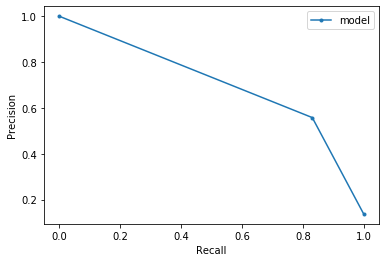

0.7569721115537849

**************

TESTING: 4 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6381069	total: 21.9ms	remaining: 21.9s
1:	learn: 0.5907728	total: 37.2ms	remaining: 18.5s
2:	learn: 0.5441584	total: 53.7ms	remaining: 17.8s
3:	learn: 0.5052198	total: 70.6ms	remaining: 17.6s
4:	learn: 0.4734857	total: 85.2ms	remaining: 16.9s
5:	learn: 0.4428131	total: 97.3ms	remaining: 16.1s
6:	learn: 0.4193428	total: 108ms	remaining: 15.3s
7:	learn: 0.3966631	total: 118ms	remaining: 14.6s
8:	learn: 0.3738525	total: 125ms	remaining: 13.7s
9:	learn: 0.3550131	total: 131ms	remaining: 13s
10:	learn: 0.3351055	total: 137ms	remaining: 12.4s
11:	learn: 0.3201367	total: 144ms	remaining: 11.9s
12:	learn: 0.3052574	total: 151ms	remaining: 11.4s
13:	learn: 0.2940788	total: 162ms	remaining: 11.4s
14:	learn: 0.2842360	total: 178ms	remaining: 11.7s
15:	learn: 0.2738253	total: 193ms	remaining: 11.9s
16:

159:	learn: 0.1609957	total: 1.66s	remaining: 8.69s
160:	learn: 0.1609485	total: 1.66s	remaining: 8.67s
161:	learn: 0.1609195	total: 1.68s	remaining: 8.66s
162:	learn: 0.1608687	total: 1.69s	remaining: 8.68s
163:	learn: 0.1608220	total: 1.7s	remaining: 8.69s
164:	learn: 0.1607956	total: 1.72s	remaining: 8.69s
165:	learn: 0.1607407	total: 1.73s	remaining: 8.68s
166:	learn: 0.1606862	total: 1.74s	remaining: 8.67s
167:	learn: 0.1606448	total: 1.75s	remaining: 8.64s
168:	learn: 0.1605842	total: 1.75s	remaining: 8.62s
169:	learn: 0.1605254	total: 1.76s	remaining: 8.59s
170:	learn: 0.1604863	total: 1.76s	remaining: 8.56s
171:	learn: 0.1604580	total: 1.77s	remaining: 8.53s
172:	learn: 0.1604391	total: 1.78s	remaining: 8.5s
173:	learn: 0.1603799	total: 1.78s	remaining: 8.47s
174:	learn: 0.1603571	total: 1.8s	remaining: 8.48s
175:	learn: 0.1602888	total: 1.81s	remaining: 8.5s
176:	learn: 0.1602262	total: 1.83s	remaining: 8.51s
177:	learn: 0.1601758	total: 1.84s	remaining: 8.51s
178:	learn: 0.16

319:	learn: 0.1543412	total: 3.23s	remaining: 6.87s
320:	learn: 0.1542618	total: 3.25s	remaining: 6.87s
321:	learn: 0.1542137	total: 3.26s	remaining: 6.87s
322:	learn: 0.1541555	total: 3.28s	remaining: 6.87s
323:	learn: 0.1541341	total: 3.29s	remaining: 6.87s
324:	learn: 0.1540783	total: 3.31s	remaining: 6.87s
325:	learn: 0.1540156	total: 3.32s	remaining: 6.87s
326:	learn: 0.1539616	total: 3.33s	remaining: 6.86s
327:	learn: 0.1539546	total: 3.35s	remaining: 6.86s
328:	learn: 0.1539069	total: 3.35s	remaining: 6.84s
329:	learn: 0.1538710	total: 3.36s	remaining: 6.83s
330:	learn: 0.1538131	total: 3.37s	remaining: 6.81s
331:	learn: 0.1537736	total: 3.38s	remaining: 6.79s
332:	learn: 0.1537315	total: 3.38s	remaining: 6.77s
333:	learn: 0.1536909	total: 3.39s	remaining: 6.76s
334:	learn: 0.1536192	total: 3.4s	remaining: 6.74s
335:	learn: 0.1535357	total: 3.4s	remaining: 6.72s
336:	learn: 0.1534602	total: 3.41s	remaining: 6.71s
337:	learn: 0.1534189	total: 3.42s	remaining: 6.69s
338:	learn: 0.

482:	learn: 0.1479703	total: 4.86s	remaining: 5.21s
483:	learn: 0.1479386	total: 4.88s	remaining: 5.2s
484:	learn: 0.1478941	total: 4.89s	remaining: 5.2s
485:	learn: 0.1478921	total: 4.91s	remaining: 5.19s
486:	learn: 0.1478685	total: 4.92s	remaining: 5.18s
487:	learn: 0.1478338	total: 4.93s	remaining: 5.17s
488:	learn: 0.1478282	total: 4.94s	remaining: 5.16s
489:	learn: 0.1477778	total: 4.95s	remaining: 5.15s
490:	learn: 0.1477637	total: 4.97s	remaining: 5.15s
491:	learn: 0.1477304	total: 4.98s	remaining: 5.14s
492:	learn: 0.1476879	total: 4.99s	remaining: 5.14s
493:	learn: 0.1476319	total: 5.01s	remaining: 5.13s
494:	learn: 0.1476205	total: 5.02s	remaining: 5.12s
495:	learn: 0.1475912	total: 5.03s	remaining: 5.11s
496:	learn: 0.1475436	total: 5.03s	remaining: 5.09s
497:	learn: 0.1474882	total: 5.04s	remaining: 5.08s
498:	learn: 0.1474446	total: 5.05s	remaining: 5.07s
499:	learn: 0.1474042	total: 5.05s	remaining: 5.05s
500:	learn: 0.1473412	total: 5.06s	remaining: 5.04s
501:	learn: 0.

643:	learn: 0.1426359	total: 6.57s	remaining: 3.63s
644:	learn: 0.1425962	total: 6.58s	remaining: 3.62s
645:	learn: 0.1425524	total: 6.6s	remaining: 3.62s
646:	learn: 0.1425429	total: 6.61s	remaining: 3.61s
647:	learn: 0.1425155	total: 6.62s	remaining: 3.6s
648:	learn: 0.1424938	total: 6.63s	remaining: 3.59s
649:	learn: 0.1424437	total: 6.64s	remaining: 3.57s
650:	learn: 0.1424129	total: 6.64s	remaining: 3.56s
651:	learn: 0.1423804	total: 6.65s	remaining: 3.55s
652:	learn: 0.1423500	total: 6.66s	remaining: 3.54s
653:	learn: 0.1423282	total: 6.67s	remaining: 3.53s
654:	learn: 0.1422922	total: 6.67s	remaining: 3.51s
655:	learn: 0.1422437	total: 6.68s	remaining: 3.5s
656:	learn: 0.1421989	total: 6.69s	remaining: 3.5s
657:	learn: 0.1421470	total: 6.71s	remaining: 3.49s
658:	learn: 0.1421327	total: 6.72s	remaining: 3.48s
659:	learn: 0.1420964	total: 6.74s	remaining: 3.47s
660:	learn: 0.1420720	total: 6.75s	remaining: 3.46s
661:	learn: 0.1420506	total: 6.76s	remaining: 3.45s
662:	learn: 0.14

815:	learn: 0.1372641	total: 8.33s	remaining: 1.88s
816:	learn: 0.1372273	total: 8.35s	remaining: 1.87s
817:	learn: 0.1372042	total: 8.36s	remaining: 1.86s
818:	learn: 0.1371516	total: 8.38s	remaining: 1.85s
819:	learn: 0.1371243	total: 8.39s	remaining: 1.84s
820:	learn: 0.1370756	total: 8.4s	remaining: 1.83s
821:	learn: 0.1370526	total: 8.42s	remaining: 1.82s
822:	learn: 0.1370318	total: 8.44s	remaining: 1.81s
823:	learn: 0.1369952	total: 8.45s	remaining: 1.8s
824:	learn: 0.1369765	total: 8.46s	remaining: 1.79s
825:	learn: 0.1369559	total: 8.47s	remaining: 1.78s
826:	learn: 0.1369309	total: 8.48s	remaining: 1.77s
827:	learn: 0.1368995	total: 8.49s	remaining: 1.76s
828:	learn: 0.1368658	total: 8.49s	remaining: 1.75s
829:	learn: 0.1368284	total: 8.5s	remaining: 1.74s
830:	learn: 0.1368078	total: 8.51s	remaining: 1.73s
831:	learn: 0.1367889	total: 8.52s	remaining: 1.72s
832:	learn: 0.1367497	total: 8.52s	remaining: 1.71s
833:	learn: 0.1367375	total: 8.53s	remaining: 1.7s
834:	learn: 0.13

978:	learn: 0.1330582	total: 9.99s	remaining: 214ms
979:	learn: 0.1330329	total: 10s	remaining: 204ms
980:	learn: 0.1330254	total: 10s	remaining: 194ms
981:	learn: 0.1330084	total: 10s	remaining: 184ms
982:	learn: 0.1329789	total: 10.1s	remaining: 174ms
983:	learn: 0.1329528	total: 10.1s	remaining: 164ms
984:	learn: 0.1329468	total: 10.1s	remaining: 154ms
985:	learn: 0.1329309	total: 10.1s	remaining: 143ms
986:	learn: 0.1328972	total: 10.1s	remaining: 133ms
987:	learn: 0.1328587	total: 10.1s	remaining: 123ms
988:	learn: 0.1328274	total: 10.1s	remaining: 113ms
989:	learn: 0.1327874	total: 10.1s	remaining: 102ms
990:	learn: 0.1327679	total: 10.1s	remaining: 92ms
991:	learn: 0.1327521	total: 10.1s	remaining: 81.8ms
992:	learn: 0.1327045	total: 10.1s	remaining: 71.5ms
993:	learn: 0.1326508	total: 10.2s	remaining: 61.3ms
994:	learn: 0.1326363	total: 10.2s	remaining: 51.1ms
995:	learn: 0.1325832	total: 10.2s	remaining: 40.8ms
996:	learn: 0.1325611	total: 10.2s	remaining: 30.6ms
997:	learn: 0

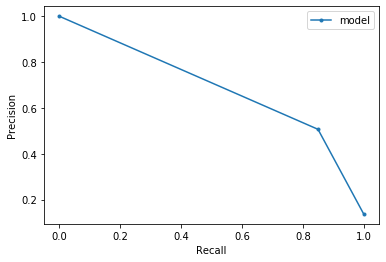

0.748486516235553

**************

TESTING: 5 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin'] 

Learning rate set to 0.036868
0:	learn: 0.6380526	total: 14.7ms	remaining: 14.6s
1:	learn: 0.5916009	total: 31.5ms	remaining: 15.7s
2:	learn: 0.5462515	total: 46ms	remaining: 15.3s
3:	learn: 0.5082506	total: 58ms	remaining: 14.5s
4:	learn: 0.4697884	total: 68.8ms	remaining: 13.7s
5:	learn: 0.4386121	total: 78.6ms	remaining: 13s
6:	learn: 0.4095770	total: 85ms	remaining: 12.1s
7:	learn: 0.3849471	total: 92.3ms	remaining: 11.4s
8:	learn: 0.3627721	total: 98.7ms	remaining: 10.9s
9:	learn: 0.3424388	total: 105ms	remaining: 10.4s
10:	learn: 0.3254607	total: 111ms	remaining: 9.97s
11:	learn: 0.3107580	total: 117ms	remaining: 9.61s
12:	learn: 0.2949116	total: 126ms	remaining: 9.59s
13:	learn: 0.2823919	total: 142ms	remaining: 9.98s
14:	learn: 0.2696718	total: 157ms	remaining: 10.3s
15:	learn: 0.2611848	total: 169ms	remaining: 

160:	learn: 0.1489433	total: 1.61s	remaining: 8.39s
161:	learn: 0.1489121	total: 1.63s	remaining: 8.41s
162:	learn: 0.1488907	total: 1.64s	remaining: 8.43s
163:	learn: 0.1488283	total: 1.65s	remaining: 8.43s
164:	learn: 0.1487802	total: 1.67s	remaining: 8.43s
165:	learn: 0.1487599	total: 1.68s	remaining: 8.42s
166:	learn: 0.1487248	total: 1.69s	remaining: 8.41s
167:	learn: 0.1486861	total: 1.69s	remaining: 8.38s
168:	learn: 0.1486084	total: 1.7s	remaining: 8.35s
169:	learn: 0.1485313	total: 1.71s	remaining: 8.33s
170:	learn: 0.1485093	total: 1.71s	remaining: 8.3s
171:	learn: 0.1484630	total: 1.72s	remaining: 8.28s
172:	learn: 0.1484155	total: 1.73s	remaining: 8.28s
173:	learn: 0.1483500	total: 1.74s	remaining: 8.28s
174:	learn: 0.1483236	total: 1.76s	remaining: 8.29s
175:	learn: 0.1482852	total: 1.77s	remaining: 8.3s
176:	learn: 0.1482472	total: 1.79s	remaining: 8.31s
177:	learn: 0.1482281	total: 1.8s	remaining: 8.31s
178:	learn: 0.1481628	total: 1.81s	remaining: 8.29s
179:	learn: 0.14

329:	learn: 0.1411702	total: 3.36s	remaining: 6.82s
330:	learn: 0.1411293	total: 3.38s	remaining: 6.82s
331:	learn: 0.1411022	total: 3.39s	remaining: 6.82s
332:	learn: 0.1410518	total: 3.4s	remaining: 6.82s
333:	learn: 0.1409698	total: 3.42s	remaining: 6.82s
334:	learn: 0.1409264	total: 3.43s	remaining: 6.81s
335:	learn: 0.1408765	total: 3.44s	remaining: 6.79s
336:	learn: 0.1408157	total: 3.44s	remaining: 6.78s
337:	learn: 0.1407870	total: 3.45s	remaining: 6.76s
338:	learn: 0.1407541	total: 3.47s	remaining: 6.76s
339:	learn: 0.1407195	total: 3.48s	remaining: 6.76s
340:	learn: 0.1406613	total: 3.5s	remaining: 6.76s
341:	learn: 0.1405926	total: 3.51s	remaining: 6.76s
342:	learn: 0.1405432	total: 3.52s	remaining: 6.75s
343:	learn: 0.1405079	total: 3.53s	remaining: 6.73s
344:	learn: 0.1404627	total: 3.54s	remaining: 6.71s
345:	learn: 0.1404161	total: 3.54s	remaining: 6.7s
346:	learn: 0.1403573	total: 3.55s	remaining: 6.68s
347:	learn: 0.1403044	total: 3.56s	remaining: 6.66s
348:	learn: 0.1

490:	learn: 0.1350092	total: 5.01s	remaining: 5.19s
491:	learn: 0.1349601	total: 5.02s	remaining: 5.18s
492:	learn: 0.1349429	total: 5.04s	remaining: 5.18s
493:	learn: 0.1349072	total: 5.05s	remaining: 5.17s
494:	learn: 0.1348543	total: 5.06s	remaining: 5.16s
495:	learn: 0.1348375	total: 5.07s	remaining: 5.16s
496:	learn: 0.1347962	total: 5.09s	remaining: 5.15s
497:	learn: 0.1347827	total: 5.1s	remaining: 5.14s
498:	learn: 0.1347412	total: 5.12s	remaining: 5.14s
499:	learn: 0.1347193	total: 5.13s	remaining: 5.13s
500:	learn: 0.1346881	total: 5.13s	remaining: 5.11s
501:	learn: 0.1346636	total: 5.14s	remaining: 5.1s
502:	learn: 0.1346192	total: 5.15s	remaining: 5.09s
503:	learn: 0.1346002	total: 5.16s	remaining: 5.08s
504:	learn: 0.1345471	total: 5.16s	remaining: 5.06s
505:	learn: 0.1345288	total: 5.17s	remaining: 5.05s
506:	learn: 0.1344954	total: 5.18s	remaining: 5.03s
507:	learn: 0.1344568	total: 5.18s	remaining: 5.02s
508:	learn: 0.1344031	total: 5.19s	remaining: 5.01s
509:	learn: 0.

653:	learn: 0.1299805	total: 6.64s	remaining: 3.51s
654:	learn: 0.1299725	total: 6.66s	remaining: 3.51s
655:	learn: 0.1299713	total: 6.67s	remaining: 3.5s
656:	learn: 0.1299522	total: 6.68s	remaining: 3.49s
657:	learn: 0.1299503	total: 6.7s	remaining: 3.48s
658:	learn: 0.1299233	total: 6.71s	remaining: 3.47s
659:	learn: 0.1299128	total: 6.72s	remaining: 3.46s
660:	learn: 0.1299117	total: 6.74s	remaining: 3.46s
661:	learn: 0.1298928	total: 6.75s	remaining: 3.45s
662:	learn: 0.1298799	total: 6.76s	remaining: 3.44s
663:	learn: 0.1298689	total: 6.77s	remaining: 3.43s
664:	learn: 0.1298434	total: 6.78s	remaining: 3.41s
665:	learn: 0.1298200	total: 6.78s	remaining: 3.4s
666:	learn: 0.1298088	total: 6.79s	remaining: 3.39s
667:	learn: 0.1297768	total: 6.8s	remaining: 3.38s
668:	learn: 0.1297660	total: 6.8s	remaining: 3.37s
669:	learn: 0.1297385	total: 6.81s	remaining: 3.35s
670:	learn: 0.1297031	total: 6.82s	remaining: 3.34s
671:	learn: 0.1296925	total: 6.82s	remaining: 3.33s
672:	learn: 0.129

821:	learn: 0.1253776	total: 8.27s	remaining: 1.79s
822:	learn: 0.1253622	total: 8.29s	remaining: 1.78s
823:	learn: 0.1253402	total: 8.3s	remaining: 1.77s
824:	learn: 0.1253055	total: 8.32s	remaining: 1.76s
825:	learn: 0.1252824	total: 8.33s	remaining: 1.75s
826:	learn: 0.1252354	total: 8.35s	remaining: 1.75s
827:	learn: 0.1252057	total: 8.36s	remaining: 1.74s
828:	learn: 0.1251619	total: 8.37s	remaining: 1.73s
829:	learn: 0.1251263	total: 8.38s	remaining: 1.72s
830:	learn: 0.1250928	total: 8.4s	remaining: 1.71s
831:	learn: 0.1250785	total: 8.4s	remaining: 1.7s
832:	learn: 0.1250564	total: 8.41s	remaining: 1.69s
833:	learn: 0.1250245	total: 8.42s	remaining: 1.68s
834:	learn: 0.1249867	total: 8.42s	remaining: 1.66s
835:	learn: 0.1249515	total: 8.43s	remaining: 1.65s
836:	learn: 0.1249021	total: 8.44s	remaining: 1.64s
837:	learn: 0.1248980	total: 8.44s	remaining: 1.63s
838:	learn: 0.1248846	total: 8.45s	remaining: 1.62s
839:	learn: 0.1248479	total: 8.46s	remaining: 1.61s
840:	learn: 0.12

981:	learn: 0.1211589	total: 9.9s	remaining: 181ms
982:	learn: 0.1211323	total: 9.92s	remaining: 171ms
983:	learn: 0.1211116	total: 9.93s	remaining: 161ms
984:	learn: 0.1210870	total: 9.94s	remaining: 151ms
985:	learn: 0.1210577	total: 9.96s	remaining: 141ms
986:	learn: 0.1210366	total: 9.97s	remaining: 131ms
987:	learn: 0.1210148	total: 9.99s	remaining: 121ms
988:	learn: 0.1209856	total: 10s	remaining: 111ms
989:	learn: 0.1209284	total: 10s	remaining: 101ms
990:	learn: 0.1209230	total: 10s	remaining: 91ms
991:	learn: 0.1209042	total: 10s	remaining: 80.9ms
992:	learn: 0.1208988	total: 10s	remaining: 70.8ms
993:	learn: 0.1208695	total: 10s	remaining: 60.6ms
994:	learn: 0.1208451	total: 10.1s	remaining: 50.5ms
995:	learn: 0.1208275	total: 10.1s	remaining: 40.4ms
996:	learn: 0.1207916	total: 10.1s	remaining: 30.3ms
997:	learn: 0.1207532	total: 10.1s	remaining: 20.2ms
998:	learn: 0.1207524	total: 10.1s	remaining: 10.1ms
999:	learn: 0.1207302	total: 10.1s	remaining: 0us
Best F2 score: 0.763

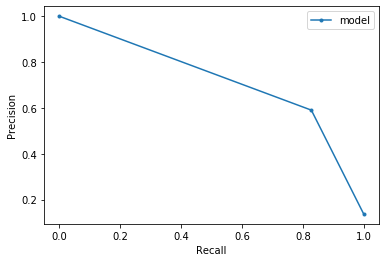

0.7663389242336611

**************

TESTING: 6 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi'] 

Learning rate set to 0.036868
0:	learn: 0.6398616	total: 17.6ms	remaining: 17.6s
1:	learn: 0.5939368	total: 33.5ms	remaining: 16.7s
2:	learn: 0.5508367	total: 48.4ms	remaining: 16.1s
3:	learn: 0.5078643	total: 61.4ms	remaining: 15.3s
4:	learn: 0.4747296	total: 74.3ms	remaining: 14.8s
5:	learn: 0.4436906	total: 82ms	remaining: 13.6s
6:	learn: 0.4158904	total: 88.9ms	remaining: 12.6s
7:	learn: 0.3873179	total: 95.7ms	remaining: 11.9s
8:	learn: 0.3645354	total: 102ms	remaining: 11.3s
9:	learn: 0.3426354	total: 109ms	remaining: 10.8s
10:	learn: 0.3255591	total: 115ms	remaining: 10.3s
11:	learn: 0.3089190	total: 132ms	remaining: 10.8s
12:	learn: 0.2953322	total: 149ms	remaining: 11.3s
13:	learn: 0.2811433	total: 162ms	remaining: 11.4s
14:	learn: 0.2708816	total: 174ms	remaining: 11.4s
15:	learn: 0.2622344	total: 184m

166:	learn: 0.1443416	total: 1.96s	remaining: 9.76s
167:	learn: 0.1442545	total: 1.97s	remaining: 9.78s
168:	learn: 0.1442146	total: 1.99s	remaining: 9.8s
169:	learn: 0.1441498	total: 2.01s	remaining: 9.8s
170:	learn: 0.1441173	total: 2.02s	remaining: 9.79s
171:	learn: 0.1440523	total: 2.03s	remaining: 9.77s
172:	learn: 0.1439959	total: 2.04s	remaining: 9.75s
173:	learn: 0.1439440	total: 2.06s	remaining: 9.76s
174:	learn: 0.1438842	total: 2.07s	remaining: 9.77s
175:	learn: 0.1438321	total: 2.09s	remaining: 9.78s
176:	learn: 0.1437658	total: 2.1s	remaining: 9.77s
177:	learn: 0.1437377	total: 2.12s	remaining: 9.77s
178:	learn: 0.1436500	total: 2.12s	remaining: 9.74s
179:	learn: 0.1435612	total: 2.13s	remaining: 9.71s
180:	learn: 0.1434756	total: 2.14s	remaining: 9.68s
181:	learn: 0.1434248	total: 2.15s	remaining: 9.66s
182:	learn: 0.1433711	total: 2.16s	remaining: 9.64s
183:	learn: 0.1433151	total: 2.18s	remaining: 9.65s
184:	learn: 0.1432376	total: 2.19s	remaining: 9.66s
185:	learn: 0.1

332:	learn: 0.1350102	total: 4s	remaining: 8.01s
333:	learn: 0.1349625	total: 4.02s	remaining: 8.01s
334:	learn: 0.1349510	total: 4.03s	remaining: 8.01s
335:	learn: 0.1348476	total: 4.05s	remaining: 8s
336:	learn: 0.1348193	total: 4.06s	remaining: 7.99s
337:	learn: 0.1347860	total: 4.07s	remaining: 7.96s
338:	learn: 0.1347061	total: 4.08s	remaining: 7.96s
339:	learn: 0.1346317	total: 4.09s	remaining: 7.94s
340:	learn: 0.1345709	total: 4.11s	remaining: 7.94s
341:	learn: 0.1345055	total: 4.13s	remaining: 7.94s
342:	learn: 0.1344900	total: 4.14s	remaining: 7.92s
343:	learn: 0.1343986	total: 4.15s	remaining: 7.92s
344:	learn: 0.1343592	total: 4.16s	remaining: 7.89s
345:	learn: 0.1342976	total: 4.17s	remaining: 7.87s
346:	learn: 0.1342426	total: 4.17s	remaining: 7.85s
347:	learn: 0.1341810	total: 4.18s	remaining: 7.83s
348:	learn: 0.1341162	total: 4.19s	remaining: 7.81s
349:	learn: 0.1340584	total: 4.19s	remaining: 7.79s
350:	learn: 0.1340048	total: 4.21s	remaining: 7.78s
351:	learn: 0.1339

499:	learn: 0.1267755	total: 5.84s	remaining: 5.84s
500:	learn: 0.1267401	total: 5.86s	remaining: 5.83s
501:	learn: 0.1266727	total: 5.87s	remaining: 5.83s
502:	learn: 0.1266296	total: 5.89s	remaining: 5.82s
503:	learn: 0.1265634	total: 5.9s	remaining: 5.81s
504:	learn: 0.1265253	total: 5.91s	remaining: 5.79s
505:	learn: 0.1264800	total: 5.92s	remaining: 5.78s
506:	learn: 0.1264389	total: 5.92s	remaining: 5.76s
507:	learn: 0.1263801	total: 5.94s	remaining: 5.75s
508:	learn: 0.1263194	total: 5.96s	remaining: 5.75s
509:	learn: 0.1262476	total: 5.97s	remaining: 5.74s
510:	learn: 0.1262215	total: 5.99s	remaining: 5.73s
511:	learn: 0.1261705	total: 5.99s	remaining: 5.71s
512:	learn: 0.1261265	total: 6s	remaining: 5.7s
513:	learn: 0.1260636	total: 6.01s	remaining: 5.68s
514:	learn: 0.1260594	total: 6.01s	remaining: 5.66s
515:	learn: 0.1260430	total: 6.02s	remaining: 5.65s
516:	learn: 0.1259810	total: 6.03s	remaining: 5.63s
517:	learn: 0.1259430	total: 6.04s	remaining: 5.62s
518:	learn: 0.125

661:	learn: 0.1202836	total: 7.68s	remaining: 3.92s
662:	learn: 0.1202656	total: 7.7s	remaining: 3.91s
663:	learn: 0.1202303	total: 7.71s	remaining: 3.9s
664:	learn: 0.1202237	total: 7.73s	remaining: 3.89s
665:	learn: 0.1201717	total: 7.74s	remaining: 3.88s
666:	learn: 0.1201701	total: 7.75s	remaining: 3.87s
667:	learn: 0.1201145	total: 7.76s	remaining: 3.86s
668:	learn: 0.1200843	total: 7.77s	remaining: 3.84s
669:	learn: 0.1200530	total: 7.79s	remaining: 3.84s
670:	learn: 0.1199986	total: 7.81s	remaining: 3.83s
671:	learn: 0.1199884	total: 7.82s	remaining: 3.82s
672:	learn: 0.1199661	total: 7.84s	remaining: 3.81s
673:	learn: 0.1199323	total: 7.85s	remaining: 3.8s
674:	learn: 0.1199075	total: 7.86s	remaining: 3.78s
675:	learn: 0.1198741	total: 7.86s	remaining: 3.77s
676:	learn: 0.1198429	total: 7.87s	remaining: 3.75s
677:	learn: 0.1197500	total: 7.88s	remaining: 3.74s
678:	learn: 0.1196981	total: 7.9s	remaining: 3.73s
679:	learn: 0.1196430	total: 7.92s	remaining: 3.73s
680:	learn: 0.11

827:	learn: 0.1144305	total: 9.85s	remaining: 2.05s
828:	learn: 0.1143764	total: 9.87s	remaining: 2.04s
829:	learn: 0.1143489	total: 9.89s	remaining: 2.02s
830:	learn: 0.1143007	total: 9.9s	remaining: 2.01s
831:	learn: 0.1142825	total: 9.92s	remaining: 2s
832:	learn: 0.1142576	total: 9.94s	remaining: 1.99s
833:	learn: 0.1142211	total: 9.95s	remaining: 1.98s
834:	learn: 0.1142163	total: 9.97s	remaining: 1.97s
835:	learn: 0.1141738	total: 9.99s	remaining: 1.96s
836:	learn: 0.1141278	total: 10s	remaining: 1.95s
837:	learn: 0.1141165	total: 10s	remaining: 1.94s
838:	learn: 0.1140717	total: 10s	remaining: 1.93s
839:	learn: 0.1140123	total: 10.1s	remaining: 1.92s
840:	learn: 0.1140112	total: 10.1s	remaining: 1.91s
841:	learn: 0.1139873	total: 10.1s	remaining: 1.9s
842:	learn: 0.1139746	total: 10.1s	remaining: 1.88s
843:	learn: 0.1139620	total: 10.1s	remaining: 1.87s
844:	learn: 0.1139276	total: 10.2s	remaining: 1.86s
845:	learn: 0.1138822	total: 10.2s	remaining: 1.85s
846:	learn: 0.1138345	t

986:	learn: 0.1093920	total: 14.5s	remaining: 191ms
987:	learn: 0.1093805	total: 14.5s	remaining: 177ms
988:	learn: 0.1093454	total: 14.6s	remaining: 162ms
989:	learn: 0.1093128	total: 14.6s	remaining: 147ms
990:	learn: 0.1092769	total: 14.7s	remaining: 133ms
991:	learn: 0.1092399	total: 14.7s	remaining: 118ms
992:	learn: 0.1092069	total: 14.7s	remaining: 104ms
993:	learn: 0.1091632	total: 14.8s	remaining: 89.1ms
994:	learn: 0.1091208	total: 14.8s	remaining: 74.3ms
995:	learn: 0.1090870	total: 14.8s	remaining: 59.5ms
996:	learn: 0.1090385	total: 14.9s	remaining: 44.7ms
997:	learn: 0.1090165	total: 14.9s	remaining: 29.8ms
998:	learn: 0.1089865	total: 14.9s	remaining: 14.9ms
999:	learn: 0.1089844	total: 14.9s	remaining: 0us
Best F2 score: 0.7932692307692307 at a threshold of 0.18

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1834  177]
 [  57  263]]

True Positives: 263
True Negatives: 1834
False Positives: 177
False Negatives: 57


Recall: 0.821875
Precision: 0.5977272727272728


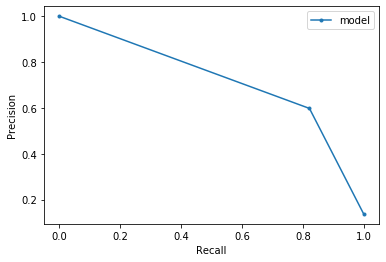

0.7645348837209303

**************

TESTING: 7 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity'] 

Learning rate set to 0.036868
0:	learn: 0.6412705	total: 67.7ms	remaining: 1m 7s
1:	learn: 0.5879261	total: 120ms	remaining: 1m
2:	learn: 0.5415392	total: 185ms	remaining: 1m 1s
3:	learn: 0.5033809	total: 219ms	remaining: 54.5s
4:	learn: 0.4681400	total: 251ms	remaining: 50s
5:	learn: 0.4373243	total: 324ms	remaining: 53.6s
6:	learn: 0.4080880	total: 372ms	remaining: 52.8s
7:	learn: 0.3846341	total: 422ms	remaining: 52.3s
8:	learn: 0.3650198	total: 461ms	remaining: 50.7s
9:	learn: 0.3452376	total: 493ms	remaining: 48.8s
10:	learn: 0.3267387	total: 525ms	remaining: 47.2s
11:	learn: 0.3117789	total: 581ms	remaining: 47.8s
12:	learn: 0.2994019	total: 642ms	remaining: 48.8s
13:	learn: 0.2868097	total: 674ms	remaining: 47.5s
14:	learn: 0.2749677	total: 724ms	remaining: 47.6s
15:	learn: 0.2645851	total: 7

158:	learn: 0.1432214	total: 5.32s	remaining: 28.1s
159:	learn: 0.1431310	total: 5.34s	remaining: 28s
160:	learn: 0.1429857	total: 5.36s	remaining: 27.9s
161:	learn: 0.1429214	total: 5.38s	remaining: 27.9s
162:	learn: 0.1428683	total: 5.41s	remaining: 27.8s
163:	learn: 0.1427525	total: 5.43s	remaining: 27.7s
164:	learn: 0.1426712	total: 5.46s	remaining: 27.6s
165:	learn: 0.1426031	total: 5.48s	remaining: 27.5s
166:	learn: 0.1425072	total: 5.51s	remaining: 27.5s
167:	learn: 0.1424578	total: 5.54s	remaining: 27.4s
168:	learn: 0.1423866	total: 5.56s	remaining: 27.3s
169:	learn: 0.1423118	total: 5.59s	remaining: 27.3s
170:	learn: 0.1422694	total: 5.61s	remaining: 27.2s
171:	learn: 0.1422284	total: 5.64s	remaining: 27.1s
172:	learn: 0.1421986	total: 5.66s	remaining: 27.1s
173:	learn: 0.1421139	total: 5.7s	remaining: 27.1s
174:	learn: 0.1420440	total: 5.73s	remaining: 27s
175:	learn: 0.1419301	total: 5.75s	remaining: 26.9s
176:	learn: 0.1418295	total: 5.78s	remaining: 26.9s
177:	learn: 0.141

327:	learn: 0.1339164	total: 8.93s	remaining: 18.3s
328:	learn: 0.1338870	total: 8.96s	remaining: 18.3s
329:	learn: 0.1338424	total: 8.98s	remaining: 18.2s
330:	learn: 0.1337553	total: 9s	remaining: 18.2s
331:	learn: 0.1337041	total: 9.02s	remaining: 18.2s
332:	learn: 0.1337010	total: 9.03s	remaining: 18.1s
333:	learn: 0.1336415	total: 9.04s	remaining: 18s
334:	learn: 0.1335846	total: 9.06s	remaining: 18s
335:	learn: 0.1335008	total: 9.07s	remaining: 17.9s
336:	learn: 0.1334750	total: 9.08s	remaining: 17.9s
337:	learn: 0.1334424	total: 9.09s	remaining: 17.8s
338:	learn: 0.1334083	total: 9.11s	remaining: 17.8s
339:	learn: 0.1333867	total: 9.12s	remaining: 17.7s
340:	learn: 0.1333324	total: 9.14s	remaining: 17.7s
341:	learn: 0.1332484	total: 9.17s	remaining: 17.6s
342:	learn: 0.1331946	total: 9.19s	remaining: 17.6s
343:	learn: 0.1331432	total: 9.22s	remaining: 17.6s
344:	learn: 0.1330582	total: 9.23s	remaining: 17.5s
345:	learn: 0.1330127	total: 9.24s	remaining: 17.5s
346:	learn: 0.13295

499:	learn: 0.1257914	total: 11.6s	remaining: 11.6s
500:	learn: 0.1257236	total: 11.6s	remaining: 11.6s
501:	learn: 0.1256819	total: 11.6s	remaining: 11.5s
502:	learn: 0.1256800	total: 11.6s	remaining: 11.5s
503:	learn: 0.1256170	total: 11.7s	remaining: 11.5s
504:	learn: 0.1255704	total: 11.7s	remaining: 11.4s
505:	learn: 0.1255007	total: 11.7s	remaining: 11.4s
506:	learn: 0.1254639	total: 11.7s	remaining: 11.4s
507:	learn: 0.1254404	total: 11.7s	remaining: 11.3s
508:	learn: 0.1253696	total: 11.7s	remaining: 11.3s
509:	learn: 0.1253679	total: 11.7s	remaining: 11.3s
510:	learn: 0.1253261	total: 11.7s	remaining: 11.2s
511:	learn: 0.1252773	total: 11.8s	remaining: 11.2s
512:	learn: 0.1252525	total: 11.8s	remaining: 11.2s
513:	learn: 0.1252125	total: 11.8s	remaining: 11.1s
514:	learn: 0.1251726	total: 11.8s	remaining: 11.1s
515:	learn: 0.1251246	total: 11.8s	remaining: 11.1s
516:	learn: 0.1250450	total: 11.9s	remaining: 11.1s
517:	learn: 0.1249833	total: 11.9s	remaining: 11s
518:	learn: 0.

667:	learn: 0.1191376	total: 14.1s	remaining: 7.02s
668:	learn: 0.1191354	total: 14.2s	remaining: 7s
669:	learn: 0.1190911	total: 14.2s	remaining: 6.99s
670:	learn: 0.1190761	total: 14.2s	remaining: 6.96s
671:	learn: 0.1190479	total: 14.2s	remaining: 6.94s
672:	learn: 0.1190040	total: 14.2s	remaining: 6.92s
673:	learn: 0.1189748	total: 14.3s	remaining: 6.9s
674:	learn: 0.1189239	total: 14.3s	remaining: 6.88s
675:	learn: 0.1188681	total: 14.3s	remaining: 6.86s
676:	learn: 0.1188669	total: 14.4s	remaining: 6.85s
677:	learn: 0.1188423	total: 14.4s	remaining: 6.83s
678:	learn: 0.1187839	total: 14.4s	remaining: 6.81s
679:	learn: 0.1187581	total: 14.4s	remaining: 6.79s
680:	learn: 0.1187058	total: 14.5s	remaining: 6.77s
681:	learn: 0.1186796	total: 14.5s	remaining: 6.75s
682:	learn: 0.1186431	total: 14.5s	remaining: 6.73s
683:	learn: 0.1185865	total: 14.5s	remaining: 6.71s
684:	learn: 0.1185458	total: 14.6s	remaining: 6.69s
685:	learn: 0.1185174	total: 14.6s	remaining: 6.67s
686:	learn: 0.11

826:	learn: 0.1137807	total: 17s	remaining: 3.56s
827:	learn: 0.1137695	total: 17.1s	remaining: 3.54s
828:	learn: 0.1137507	total: 17.1s	remaining: 3.52s
829:	learn: 0.1137340	total: 17.1s	remaining: 3.5s
830:	learn: 0.1136802	total: 17.1s	remaining: 3.48s
831:	learn: 0.1136779	total: 17.1s	remaining: 3.46s
832:	learn: 0.1136398	total: 17.1s	remaining: 3.44s
833:	learn: 0.1136343	total: 17.1s	remaining: 3.41s
834:	learn: 0.1136234	total: 17.2s	remaining: 3.39s
835:	learn: 0.1135758	total: 17.2s	remaining: 3.37s
836:	learn: 0.1135220	total: 17.2s	remaining: 3.35s
837:	learn: 0.1135144	total: 17.2s	remaining: 3.32s
838:	learn: 0.1134904	total: 17.2s	remaining: 3.3s
839:	learn: 0.1134371	total: 17.2s	remaining: 3.28s
840:	learn: 0.1134185	total: 17.2s	remaining: 3.26s
841:	learn: 0.1134063	total: 17.2s	remaining: 3.23s
842:	learn: 0.1133451	total: 17.3s	remaining: 3.21s
843:	learn: 0.1133152	total: 17.3s	remaining: 3.19s
844:	learn: 0.1132764	total: 17.3s	remaining: 3.17s
845:	learn: 0.11

993:	learn: 0.1087638	total: 19.6s	remaining: 118ms
994:	learn: 0.1087000	total: 19.6s	remaining: 98.5ms
995:	learn: 0.1086851	total: 19.6s	remaining: 78.8ms
996:	learn: 0.1086801	total: 19.6s	remaining: 59.1ms
997:	learn: 0.1086179	total: 19.7s	remaining: 39.4ms
998:	learn: 0.1085961	total: 19.7s	remaining: 19.7ms
999:	learn: 0.1085607	total: 19.7s	remaining: 0us
Best F2 score: 0.7771084337349397 at a threshold of 0.12

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1769  242]
 [  38  282]]

True Positives: 282
True Negatives: 1769
False Positives: 242
False Negatives: 38


Recall: 0.88125
Precision: 0.5381679389312977
Specificity 0.8796618597712581
F1 score: 0.6682464454976302
F2 score: 0.7815964523281596


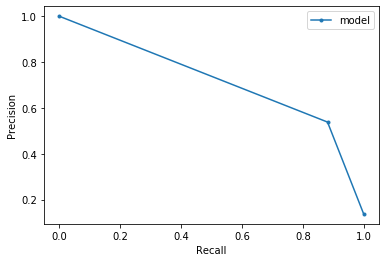

0.7815964523281596

**************

TESTING: 8 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6335125	total: 18.7ms	remaining: 18.7s
1:	learn: 0.5885433	total: 31.5ms	remaining: 15.7s
2:	learn: 0.5435602	total: 43.8ms	remaining: 14.5s
3:	learn: 0.5048095	total: 55.4ms	remaining: 13.8s
4:	learn: 0.4651503	total: 67.2ms	remaining: 13.4s
5:	learn: 0.4348903	total: 90.5ms	remaining: 15s
6:	learn: 0.4097333	total: 114ms	remaining: 16.2s
7:	learn: 0.3853800	total: 135ms	remaining: 16.7s
8:	learn: 0.3648267	total: 153ms	remaining: 16.9s
9:	learn: 0.3457928	total: 168ms	remaining: 16.6s
10:	learn: 0.3285397	total: 180ms	remaining: 16.2s
11:	learn: 0.3132539	total: 191ms	remaining: 15.8s
12:	learn: 0.3005145	total: 217ms	remaining: 16.5s
13:	learn: 0.2879377	total: 251ms	remaining: 17.7s
14:	learn: 0.2749207	total: 27

157:	learn: 0.1421008	total: 3.06s	remaining: 16.3s
158:	learn: 0.1420129	total: 3.09s	remaining: 16.3s
159:	learn: 0.1419430	total: 3.11s	remaining: 16.3s
160:	learn: 0.1418831	total: 3.13s	remaining: 16.3s
161:	learn: 0.1418220	total: 3.15s	remaining: 16.3s
162:	learn: 0.1417660	total: 3.17s	remaining: 16.3s
163:	learn: 0.1416879	total: 3.18s	remaining: 16.2s
164:	learn: 0.1416421	total: 3.21s	remaining: 16.2s
165:	learn: 0.1415777	total: 3.23s	remaining: 16.2s
166:	learn: 0.1414870	total: 3.25s	remaining: 16.2s
167:	learn: 0.1414699	total: 3.27s	remaining: 16.2s
168:	learn: 0.1414271	total: 3.3s	remaining: 16.2s
169:	learn: 0.1413548	total: 3.32s	remaining: 16.2s
170:	learn: 0.1412680	total: 3.34s	remaining: 16.2s
171:	learn: 0.1411647	total: 3.36s	remaining: 16.2s
172:	learn: 0.1411130	total: 3.37s	remaining: 16.1s
173:	learn: 0.1410389	total: 3.39s	remaining: 16.1s
174:	learn: 0.1409523	total: 3.41s	remaining: 16.1s
175:	learn: 0.1408840	total: 3.44s	remaining: 16.1s
176:	learn: 0

318:	learn: 0.1320000	total: 6.11s	remaining: 13.1s
319:	learn: 0.1319332	total: 6.13s	remaining: 13s
320:	learn: 0.1318973	total: 6.16s	remaining: 13s
321:	learn: 0.1318634	total: 6.18s	remaining: 13s
322:	learn: 0.1318237	total: 6.2s	remaining: 13s
323:	learn: 0.1317910	total: 6.22s	remaining: 13s
324:	learn: 0.1317270	total: 6.25s	remaining: 13s
325:	learn: 0.1316028	total: 6.27s	remaining: 13s
326:	learn: 0.1315935	total: 6.29s	remaining: 12.9s
327:	learn: 0.1315322	total: 6.31s	remaining: 12.9s
328:	learn: 0.1315116	total: 6.33s	remaining: 12.9s
329:	learn: 0.1315021	total: 6.35s	remaining: 12.9s
330:	learn: 0.1314534	total: 6.37s	remaining: 12.9s
331:	learn: 0.1313998	total: 6.39s	remaining: 12.9s
332:	learn: 0.1313675	total: 6.41s	remaining: 12.8s
333:	learn: 0.1312923	total: 6.42s	remaining: 12.8s
334:	learn: 0.1312619	total: 6.44s	remaining: 12.8s
335:	learn: 0.1312170	total: 6.47s	remaining: 12.8s
336:	learn: 0.1311900	total: 6.49s	remaining: 12.8s
337:	learn: 0.1311665	total

479:	learn: 0.1243995	total: 9.7s	remaining: 10.5s
480:	learn: 0.1243782	total: 9.72s	remaining: 10.5s
481:	learn: 0.1243326	total: 9.74s	remaining: 10.5s
482:	learn: 0.1243052	total: 9.76s	remaining: 10.5s
483:	learn: 0.1242660	total: 9.78s	remaining: 10.4s
484:	learn: 0.1241903	total: 9.82s	remaining: 10.4s
485:	learn: 0.1241561	total: 9.85s	remaining: 10.4s
486:	learn: 0.1241051	total: 9.87s	remaining: 10.4s
487:	learn: 0.1240213	total: 9.89s	remaining: 10.4s
488:	learn: 0.1239600	total: 9.91s	remaining: 10.4s
489:	learn: 0.1239234	total: 9.94s	remaining: 10.3s
490:	learn: 0.1238587	total: 9.96s	remaining: 10.3s
491:	learn: 0.1238223	total: 9.97s	remaining: 10.3s
492:	learn: 0.1237418	total: 9.99s	remaining: 10.3s
493:	learn: 0.1237112	total: 10s	remaining: 10.2s
494:	learn: 0.1236436	total: 10s	remaining: 10.2s
495:	learn: 0.1236360	total: 10s	remaining: 10.2s
496:	learn: 0.1236222	total: 10s	remaining: 10.2s
497:	learn: 0.1235968	total: 10.1s	remaining: 10.1s
498:	learn: 0.1235653

638:	learn: 0.1180948	total: 13s	remaining: 7.33s
639:	learn: 0.1180597	total: 13s	remaining: 7.32s
640:	learn: 0.1179981	total: 13s	remaining: 7.3s
641:	learn: 0.1179685	total: 13.1s	remaining: 7.28s
642:	learn: 0.1179320	total: 13.1s	remaining: 7.26s
643:	learn: 0.1178801	total: 13.1s	remaining: 7.24s
644:	learn: 0.1178311	total: 13.1s	remaining: 7.23s
645:	learn: 0.1178258	total: 13.2s	remaining: 7.21s
646:	learn: 0.1177973	total: 13.2s	remaining: 7.19s
647:	learn: 0.1177730	total: 13.2s	remaining: 7.17s
648:	learn: 0.1177518	total: 13.2s	remaining: 7.15s
649:	learn: 0.1177472	total: 13.2s	remaining: 7.13s
650:	learn: 0.1177162	total: 13.3s	remaining: 7.11s
651:	learn: 0.1176357	total: 13.3s	remaining: 7.08s
652:	learn: 0.1175593	total: 13.3s	remaining: 7.06s
653:	learn: 0.1174595	total: 13.3s	remaining: 7.03s
654:	learn: 0.1174365	total: 13.3s	remaining: 7.01s
655:	learn: 0.1173771	total: 13.3s	remaining: 6.99s
656:	learn: 0.1172964	total: 13.3s	remaining: 6.97s
657:	learn: 0.11729

803:	learn: 0.1117675	total: 16.4s	remaining: 4s
804:	learn: 0.1117174	total: 16.4s	remaining: 3.98s
805:	learn: 0.1116760	total: 16.5s	remaining: 3.96s
806:	learn: 0.1116410	total: 16.5s	remaining: 3.94s
807:	learn: 0.1115859	total: 16.5s	remaining: 3.92s
808:	learn: 0.1115733	total: 16.5s	remaining: 3.9s
809:	learn: 0.1115044	total: 16.5s	remaining: 3.88s
810:	learn: 0.1114834	total: 16.6s	remaining: 3.86s
811:	learn: 0.1114219	total: 16.6s	remaining: 3.84s
812:	learn: 0.1114073	total: 16.6s	remaining: 3.81s
813:	learn: 0.1113596	total: 16.6s	remaining: 3.79s
814:	learn: 0.1113032	total: 16.6s	remaining: 3.77s
815:	learn: 0.1112540	total: 16.6s	remaining: 3.75s
816:	learn: 0.1111985	total: 16.7s	remaining: 3.73s
817:	learn: 0.1111611	total: 16.7s	remaining: 3.71s
818:	learn: 0.1111494	total: 16.7s	remaining: 3.69s
819:	learn: 0.1111062	total: 16.7s	remaining: 3.67s
820:	learn: 0.1110623	total: 16.8s	remaining: 3.65s
821:	learn: 0.1110352	total: 16.8s	remaining: 3.63s
822:	learn: 0.11

964:	learn: 0.1055568	total: 19.4s	remaining: 705ms
965:	learn: 0.1055369	total: 19.4s	remaining: 685ms
966:	learn: 0.1055336	total: 19.5s	remaining: 664ms
967:	learn: 0.1054985	total: 19.5s	remaining: 644ms
968:	learn: 0.1054493	total: 19.5s	remaining: 624ms
969:	learn: 0.1054451	total: 19.5s	remaining: 604ms
970:	learn: 0.1054314	total: 19.5s	remaining: 583ms
971:	learn: 0.1054229	total: 19.6s	remaining: 563ms
972:	learn: 0.1054047	total: 19.6s	remaining: 543ms
973:	learn: 0.1053609	total: 19.6s	remaining: 523ms
974:	learn: 0.1053359	total: 19.6s	remaining: 503ms
975:	learn: 0.1052826	total: 19.6s	remaining: 483ms
976:	learn: 0.1052746	total: 19.7s	remaining: 463ms
977:	learn: 0.1052436	total: 19.7s	remaining: 443ms
978:	learn: 0.1052323	total: 19.7s	remaining: 423ms
979:	learn: 0.1052284	total: 19.7s	remaining: 403ms
980:	learn: 0.1051980	total: 19.7s	remaining: 382ms
981:	learn: 0.1051536	total: 19.8s	remaining: 362ms
982:	learn: 0.1050901	total: 19.8s	remaining: 342ms
983:	learn: 

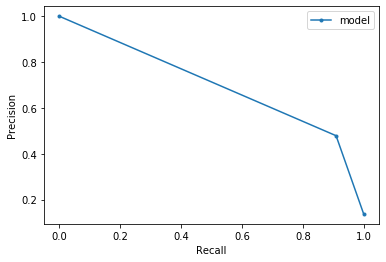

0.7706567796610171

**************

TESTING: 9 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)'] 

Learning rate set to 0.036868
0:	learn: 0.6339804	total: 18.9ms	remaining: 18.9s
1:	learn: 0.5838304	total: 34.2ms	remaining: 17.1s
2:	learn: 0.5393208	total: 47.2ms	remaining: 15.7s
3:	learn: 0.5009511	total: 62.7ms	remaining: 15.6s
4:	learn: 0.4675811	total: 85.3ms	remaining: 17s
5:	learn: 0.4343997	total: 111ms	remaining: 18.3s
6:	learn: 0.4085279	total: 131ms	remaining: 18.6s
7:	learn: 0.3808196	total: 152ms	remaining: 18.9s
8:	learn: 0.3601795	total: 165ms	remaining: 18.2s
9:	learn: 0.3420822	total: 179ms	remaining: 17.8s
10:	learn: 0.3249095	total: 192ms	remaining: 17.3s
11:	learn: 0.3077725	total: 219ms	remaining: 18s
12:	learn: 0.2949651	total: 241ms	remaining: 18.3s
13:	learn: 0.2822617	total: 263ms	remaining: 

158:	learn: 0.1408449	total: 3.15s	remaining: 16.6s
159:	learn: 0.1407429	total: 3.17s	remaining: 16.6s
160:	learn: 0.1406867	total: 3.19s	remaining: 16.6s
161:	learn: 0.1406263	total: 3.21s	remaining: 16.6s
162:	learn: 0.1405155	total: 3.23s	remaining: 16.6s
163:	learn: 0.1403589	total: 3.26s	remaining: 16.6s
164:	learn: 0.1402659	total: 3.29s	remaining: 16.6s
165:	learn: 0.1401917	total: 3.31s	remaining: 16.6s
166:	learn: 0.1401299	total: 3.33s	remaining: 16.6s
167:	learn: 0.1400463	total: 3.35s	remaining: 16.6s
168:	learn: 0.1399445	total: 3.38s	remaining: 16.6s
169:	learn: 0.1398080	total: 3.4s	remaining: 16.6s
170:	learn: 0.1397582	total: 3.42s	remaining: 16.6s
171:	learn: 0.1397563	total: 3.43s	remaining: 16.5s
172:	learn: 0.1396824	total: 3.44s	remaining: 16.5s
173:	learn: 0.1396393	total: 3.46s	remaining: 16.4s
174:	learn: 0.1395499	total: 3.49s	remaining: 16.5s
175:	learn: 0.1394502	total: 3.51s	remaining: 16.4s
176:	learn: 0.1393786	total: 3.53s	remaining: 16.4s
177:	learn: 0

324:	learn: 0.1300123	total: 6.5s	remaining: 13.5s
325:	learn: 0.1299102	total: 6.53s	remaining: 13.5s
326:	learn: 0.1298278	total: 6.55s	remaining: 13.5s
327:	learn: 0.1297917	total: 6.58s	remaining: 13.5s
328:	learn: 0.1297519	total: 6.6s	remaining: 13.5s
329:	learn: 0.1297487	total: 6.62s	remaining: 13.4s
330:	learn: 0.1296652	total: 6.64s	remaining: 13.4s
331:	learn: 0.1296197	total: 6.66s	remaining: 13.4s
332:	learn: 0.1295705	total: 6.67s	remaining: 13.4s
333:	learn: 0.1295454	total: 6.68s	remaining: 13.3s
334:	learn: 0.1294699	total: 6.7s	remaining: 13.3s
335:	learn: 0.1294331	total: 6.73s	remaining: 13.3s
336:	learn: 0.1293980	total: 6.75s	remaining: 13.3s
337:	learn: 0.1293385	total: 6.78s	remaining: 13.3s
338:	learn: 0.1292184	total: 6.8s	remaining: 13.3s
339:	learn: 0.1291697	total: 6.82s	remaining: 13.2s
340:	learn: 0.1291068	total: 6.83s	remaining: 13.2s
341:	learn: 0.1290346	total: 6.84s	remaining: 13.2s
342:	learn: 0.1289691	total: 6.86s	remaining: 13.1s
343:	learn: 0.12

484:	learn: 0.1217867	total: 9.61s	remaining: 10.2s
485:	learn: 0.1217224	total: 9.62s	remaining: 10.2s
486:	learn: 0.1216395	total: 9.64s	remaining: 10.2s
487:	learn: 0.1215733	total: 9.67s	remaining: 10.1s
488:	learn: 0.1215211	total: 9.69s	remaining: 10.1s
489:	learn: 0.1215055	total: 9.71s	remaining: 10.1s
490:	learn: 0.1214480	total: 9.72s	remaining: 10.1s
491:	learn: 0.1214114	total: 9.74s	remaining: 10.1s
492:	learn: 0.1213524	total: 9.77s	remaining: 10s
493:	learn: 0.1213244	total: 9.79s	remaining: 10s
494:	learn: 0.1212992	total: 9.81s	remaining: 10s
495:	learn: 0.1212403	total: 9.83s	remaining: 9.99s
496:	learn: 0.1211996	total: 9.86s	remaining: 9.98s
497:	learn: 0.1211082	total: 9.88s	remaining: 9.96s
498:	learn: 0.1210180	total: 9.9s	remaining: 9.94s
499:	learn: 0.1209853	total: 9.91s	remaining: 9.91s
500:	learn: 0.1209198	total: 9.93s	remaining: 9.89s
501:	learn: 0.1208475	total: 9.95s	remaining: 9.87s
502:	learn: 0.1208345	total: 9.98s	remaining: 9.86s
503:	learn: 0.12076

643:	learn: 0.1144025	total: 12.8s	remaining: 7.05s
644:	learn: 0.1143411	total: 12.8s	remaining: 7.03s
645:	learn: 0.1143286	total: 12.8s	remaining: 7.01s
646:	learn: 0.1142634	total: 12.8s	remaining: 6.99s
647:	learn: 0.1142312	total: 12.8s	remaining: 6.97s
648:	learn: 0.1142194	total: 12.9s	remaining: 6.95s
649:	learn: 0.1141295	total: 12.9s	remaining: 6.93s
650:	learn: 0.1140269	total: 12.9s	remaining: 6.91s
651:	learn: 0.1139838	total: 12.9s	remaining: 6.89s
652:	learn: 0.1139277	total: 12.9s	remaining: 6.88s
653:	learn: 0.1138380	total: 13s	remaining: 6.86s
654:	learn: 0.1138224	total: 13s	remaining: 6.84s
655:	learn: 0.1138017	total: 13s	remaining: 6.82s
656:	learn: 0.1137771	total: 13s	remaining: 6.8s
657:	learn: 0.1137240	total: 13s	remaining: 6.78s
658:	learn: 0.1137081	total: 13.1s	remaining: 6.75s
659:	learn: 0.1136846	total: 13.1s	remaining: 6.74s
660:	learn: 0.1136384	total: 13.1s	remaining: 6.72s
661:	learn: 0.1135954	total: 13.1s	remaining: 6.7s
662:	learn: 0.1135530	to

805:	learn: 0.1075811	total: 15.9s	remaining: 3.84s
806:	learn: 0.1075706	total: 16s	remaining: 3.82s
807:	learn: 0.1075540	total: 16s	remaining: 3.8s
808:	learn: 0.1075355	total: 16s	remaining: 3.78s
809:	learn: 0.1074819	total: 16s	remaining: 3.76s
810:	learn: 0.1074234	total: 16s	remaining: 3.74s
811:	learn: 0.1073364	total: 16.1s	remaining: 3.72s
812:	learn: 0.1073197	total: 16.1s	remaining: 3.7s
813:	learn: 0.1073088	total: 16.1s	remaining: 3.68s
814:	learn: 0.1072765	total: 16.1s	remaining: 3.66s
815:	learn: 0.1072473	total: 16.1s	remaining: 3.64s
816:	learn: 0.1072320	total: 16.1s	remaining: 3.62s
817:	learn: 0.1071920	total: 16.2s	remaining: 3.6s
818:	learn: 0.1071287	total: 16.2s	remaining: 3.58s
819:	learn: 0.1071227	total: 16.2s	remaining: 3.56s
820:	learn: 0.1070657	total: 16.2s	remaining: 3.54s
821:	learn: 0.1070340	total: 16.2s	remaining: 3.52s
822:	learn: 0.1070237	total: 16.3s	remaining: 3.5s
823:	learn: 0.1069998	total: 16.3s	remaining: 3.48s
824:	learn: 0.1069238	tota

971:	learn: 0.1013898	total: 19s	remaining: 549ms
972:	learn: 0.1013130	total: 19.1s	remaining: 529ms
973:	learn: 0.1012822	total: 19.1s	remaining: 510ms
974:	learn: 0.1012355	total: 19.1s	remaining: 491ms
975:	learn: 0.1011808	total: 19.2s	remaining: 471ms
976:	learn: 0.1011546	total: 19.2s	remaining: 451ms
977:	learn: 0.1011410	total: 19.2s	remaining: 432ms
978:	learn: 0.1011127	total: 19.2s	remaining: 412ms
979:	learn: 0.1010757	total: 19.2s	remaining: 392ms
980:	learn: 0.1010458	total: 19.2s	remaining: 372ms
981:	learn: 0.1010040	total: 19.2s	remaining: 353ms
982:	learn: 0.1009688	total: 19.3s	remaining: 333ms
983:	learn: 0.1009317	total: 19.3s	remaining: 314ms
984:	learn: 0.1008850	total: 19.3s	remaining: 294ms
985:	learn: 0.1008773	total: 19.3s	remaining: 275ms
986:	learn: 0.1008584	total: 19.4s	remaining: 255ms
987:	learn: 0.1008296	total: 19.4s	remaining: 235ms
988:	learn: 0.1007671	total: 19.4s	remaining: 216ms
989:	learn: 0.1007142	total: 19.4s	remaining: 196ms
990:	learn: 0.

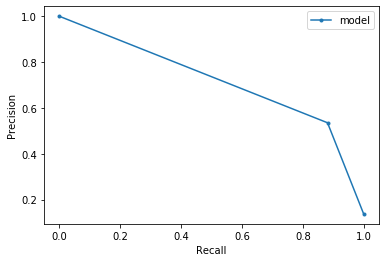

0.7802988378527946

**************

TESTING: 10 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin'] 

Learning rate set to 0.036868
0:	learn: 0.6339275	total: 18.6ms	remaining: 18.6s
1:	learn: 0.5863254	total: 31.1ms	remaining: 15.5s
2:	learn: 0.5420845	total: 51.1ms	remaining: 17s
3:	learn: 0.5014993	total: 73ms	remaining: 18.2s
4:	learn: 0.4668159	total: 99.2ms	remaining: 19.7s
5:	learn: 0.4358514	total: 121ms	remaining: 20.1s
6:	learn: 0.4082947	total: 140ms	remaining: 19.9s
7:	learn: 0.3839692	total: 153ms	remaining: 19s
8:	learn: 0.3625548	total: 171ms	remaining: 18.9s
9:	learn: 0.3411697	total: 185ms	remaining: 18.4s
10:	learn: 0.3230781	total: 202ms	remaining: 18.2s
11:	learn: 0.3067950	total: 231ms	remaining: 19s
12:	learn: 0.2941085	total: 251ms	remaining: 19.1s
13:	learn: 0.2836122	total: 271ms	rem

156:	learn: 0.1343054	total: 3.13s	remaining: 16.8s
157:	learn: 0.1342461	total: 3.16s	remaining: 16.8s
158:	learn: 0.1341364	total: 3.18s	remaining: 16.8s
159:	learn: 0.1340610	total: 3.21s	remaining: 16.8s
160:	learn: 0.1340173	total: 3.25s	remaining: 16.9s
161:	learn: 0.1338877	total: 3.28s	remaining: 17s
162:	learn: 0.1337988	total: 3.3s	remaining: 16.9s
163:	learn: 0.1336630	total: 3.31s	remaining: 16.9s
164:	learn: 0.1335566	total: 3.32s	remaining: 16.8s
165:	learn: 0.1335052	total: 3.35s	remaining: 16.8s
166:	learn: 0.1334216	total: 3.37s	remaining: 16.8s
167:	learn: 0.1333204	total: 3.4s	remaining: 16.8s
168:	learn: 0.1332465	total: 3.43s	remaining: 16.9s
169:	learn: 0.1331336	total: 3.45s	remaining: 16.8s
170:	learn: 0.1330440	total: 3.47s	remaining: 16.8s
171:	learn: 0.1329233	total: 3.48s	remaining: 16.8s
172:	learn: 0.1328474	total: 3.49s	remaining: 16.7s
173:	learn: 0.1327993	total: 3.5s	remaining: 16.6s
174:	learn: 0.1327036	total: 3.52s	remaining: 16.6s
175:	learn: 0.132

316:	learn: 0.1233729	total: 6.27s	remaining: 13.5s
317:	learn: 0.1233094	total: 6.3s	remaining: 13.5s
318:	learn: 0.1232058	total: 6.32s	remaining: 13.5s
319:	learn: 0.1231845	total: 6.34s	remaining: 13.5s
320:	learn: 0.1231486	total: 6.37s	remaining: 13.5s
321:	learn: 0.1231099	total: 6.39s	remaining: 13.5s
322:	learn: 0.1230595	total: 6.41s	remaining: 13.4s
323:	learn: 0.1229748	total: 6.43s	remaining: 13.4s
324:	learn: 0.1229357	total: 6.44s	remaining: 13.4s
325:	learn: 0.1229187	total: 6.45s	remaining: 13.3s
326:	learn: 0.1228746	total: 6.46s	remaining: 13.3s
327:	learn: 0.1228118	total: 6.47s	remaining: 13.3s
328:	learn: 0.1227401	total: 6.5s	remaining: 13.2s
329:	learn: 0.1226793	total: 6.52s	remaining: 13.2s
330:	learn: 0.1226057	total: 6.54s	remaining: 13.2s
331:	learn: 0.1225063	total: 6.57s	remaining: 13.2s
332:	learn: 0.1224805	total: 6.59s	remaining: 13.2s
333:	learn: 0.1224241	total: 6.61s	remaining: 13.2s
334:	learn: 0.1224002	total: 6.63s	remaining: 13.2s
335:	learn: 0.

477:	learn: 0.1148103	total: 9.42s	remaining: 10.3s
478:	learn: 0.1148049	total: 9.43s	remaining: 10.3s
479:	learn: 0.1147667	total: 9.46s	remaining: 10.2s
480:	learn: 0.1147319	total: 9.48s	remaining: 10.2s
481:	learn: 0.1146786	total: 9.5s	remaining: 10.2s
482:	learn: 0.1146710	total: 9.53s	remaining: 10.2s
483:	learn: 0.1146357	total: 9.55s	remaining: 10.2s
484:	learn: 0.1145806	total: 9.58s	remaining: 10.2s
485:	learn: 0.1145603	total: 9.6s	remaining: 10.2s
486:	learn: 0.1144972	total: 9.61s	remaining: 10.1s
487:	learn: 0.1144620	total: 9.63s	remaining: 10.1s
488:	learn: 0.1143919	total: 9.65s	remaining: 10.1s
489:	learn: 0.1143221	total: 9.68s	remaining: 10.1s
490:	learn: 0.1143130	total: 9.7s	remaining: 10.1s
491:	learn: 0.1142110	total: 9.71s	remaining: 10s
492:	learn: 0.1141770	total: 9.73s	remaining: 10s
493:	learn: 0.1141213	total: 9.75s	remaining: 9.99s
494:	learn: 0.1140508	total: 9.78s	remaining: 9.97s
495:	learn: 0.1140074	total: 9.8s	remaining: 9.96s
496:	learn: 0.113968

637:	learn: 0.1074552	total: 12.7s	remaining: 7.2s
638:	learn: 0.1074378	total: 12.7s	remaining: 7.18s
639:	learn: 0.1073959	total: 12.7s	remaining: 7.16s
640:	learn: 0.1073233	total: 12.8s	remaining: 7.14s
641:	learn: 0.1072803	total: 12.8s	remaining: 7.12s
642:	learn: 0.1072428	total: 12.8s	remaining: 7.1s
643:	learn: 0.1071909	total: 12.8s	remaining: 7.07s
644:	learn: 0.1071636	total: 12.8s	remaining: 7.06s
645:	learn: 0.1071392	total: 12.8s	remaining: 7.04s
646:	learn: 0.1071213	total: 12.9s	remaining: 7.02s
647:	learn: 0.1070780	total: 12.9s	remaining: 7s
648:	learn: 0.1070526	total: 12.9s	remaining: 6.98s
649:	learn: 0.1070278	total: 12.9s	remaining: 6.96s
650:	learn: 0.1069455	total: 12.9s	remaining: 6.94s
651:	learn: 0.1069144	total: 13s	remaining: 6.92s
652:	learn: 0.1068585	total: 13s	remaining: 6.9s
653:	learn: 0.1068362	total: 13s	remaining: 6.88s
654:	learn: 0.1068243	total: 13s	remaining: 6.86s
655:	learn: 0.1067838	total: 13s	remaining: 6.84s
656:	learn: 0.1066814	total:

797:	learn: 0.1004840	total: 16s	remaining: 4.05s
798:	learn: 0.1004473	total: 16s	remaining: 4.03s
799:	learn: 0.1003939	total: 16s	remaining: 4.01s
800:	learn: 0.1003485	total: 16.1s	remaining: 3.99s
801:	learn: 0.1003241	total: 16.1s	remaining: 3.97s
802:	learn: 0.1002861	total: 16.1s	remaining: 3.95s
803:	learn: 0.1002265	total: 16.1s	remaining: 3.93s
804:	learn: 0.1002246	total: 16.1s	remaining: 3.91s
805:	learn: 0.1001903	total: 16.1s	remaining: 3.89s
806:	learn: 0.1001537	total: 16.2s	remaining: 3.87s
807:	learn: 0.1001060	total: 16.2s	remaining: 3.85s
808:	learn: 0.1000848	total: 16.2s	remaining: 3.82s
809:	learn: 0.1000063	total: 16.2s	remaining: 3.8s
810:	learn: 0.0999840	total: 16.2s	remaining: 3.78s
811:	learn: 0.0999181	total: 16.3s	remaining: 3.76s
812:	learn: 0.0998488	total: 16.3s	remaining: 3.74s
813:	learn: 0.0998331	total: 16.3s	remaining: 3.72s
814:	learn: 0.0998002	total: 16.3s	remaining: 3.7s
815:	learn: 0.0997264	total: 16.3s	remaining: 3.68s
816:	learn: 0.099676

962:	learn: 0.0939141	total: 19.1s	remaining: 734ms
963:	learn: 0.0938832	total: 19.1s	remaining: 714ms
964:	learn: 0.0938681	total: 19.1s	remaining: 695ms
965:	learn: 0.0938585	total: 19.2s	remaining: 675ms
966:	learn: 0.0938130	total: 19.2s	remaining: 655ms
967:	learn: 0.0937760	total: 19.2s	remaining: 635ms
968:	learn: 0.0937204	total: 19.2s	remaining: 615ms
969:	learn: 0.0937050	total: 19.3s	remaining: 596ms
970:	learn: 0.0937006	total: 19.3s	remaining: 576ms
971:	learn: 0.0936869	total: 19.3s	remaining: 556ms
972:	learn: 0.0936531	total: 19.3s	remaining: 536ms
973:	learn: 0.0936423	total: 19.3s	remaining: 516ms
974:	learn: 0.0935941	total: 19.3s	remaining: 496ms
975:	learn: 0.0935744	total: 19.4s	remaining: 476ms
976:	learn: 0.0935360	total: 19.4s	remaining: 456ms
977:	learn: 0.0934917	total: 19.4s	remaining: 437ms
978:	learn: 0.0934493	total: 19.4s	remaining: 417ms
979:	learn: 0.0934289	total: 19.4s	remaining: 397ms
980:	learn: 0.0934084	total: 19.5s	remaining: 377ms
981:	learn: 

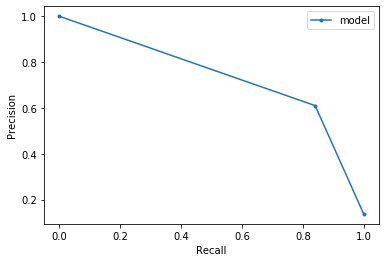

0.7815223707147008

**************

TESTING: 11 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6392165	total: 23.4ms	remaining: 23.3s
1:	learn: 0.5923888	total: 45.6ms	remaining: 22.7s
2:	learn: 0.5480147	total: 59.6ms	remaining: 19.8s
3:	learn: 0.5088141	total: 84.9ms	remaining: 21.1s
4:	learn: 0.4723688	total: 108ms	remaining: 21.4s
5:	learn: 0.4437427	total: 125ms	remaining: 20.6s
6:	learn: 0.4149225	total: 144ms	remaining: 20.4s
7:	learn: 0.3907503	total: 156ms	remaining: 19.4s
8:	learn: 0.3642325	total: 168ms	remaining: 18.5s
9:	learn: 0.3418953	total: 179ms	remaining: 17.8s
10:	learn: 0.3245646	total: 191ms	remaining: 17.1s
11:	learn: 0.3088638	total: 212ms	remaining: 17.4s
12:	learn: 0.2946652	total: 235ms	remaining: 17.8s
13:	le

154:	learn: 0.1339293	total: 2.79s	remaining: 15.2s
155:	learn: 0.1337943	total: 2.82s	remaining: 15.3s
156:	learn: 0.1337621	total: 2.85s	remaining: 15.3s
157:	learn: 0.1336566	total: 2.87s	remaining: 15.3s
158:	learn: 0.1336334	total: 2.88s	remaining: 15.2s
159:	learn: 0.1335192	total: 2.9s	remaining: 15.2s
160:	learn: 0.1334100	total: 2.91s	remaining: 15.2s
161:	learn: 0.1333355	total: 2.92s	remaining: 15.1s
162:	learn: 0.1333033	total: 2.94s	remaining: 15.1s
163:	learn: 0.1332087	total: 2.97s	remaining: 15.1s
164:	learn: 0.1330422	total: 2.99s	remaining: 15.1s
165:	learn: 0.1329531	total: 3.01s	remaining: 15.1s
166:	learn: 0.1329132	total: 3.04s	remaining: 15.1s
167:	learn: 0.1328881	total: 3.05s	remaining: 15.1s
168:	learn: 0.1327961	total: 3.07s	remaining: 15.1s
169:	learn: 0.1327219	total: 3.09s	remaining: 15.1s
170:	learn: 0.1326034	total: 3.1s	remaining: 15s
171:	learn: 0.1325365	total: 3.12s	remaining: 15s
172:	learn: 0.1324521	total: 3.13s	remaining: 15s
173:	learn: 0.132425

320:	learn: 0.1226754	total: 5.87s	remaining: 12.4s
321:	learn: 0.1225807	total: 5.89s	remaining: 12.4s
322:	learn: 0.1225351	total: 5.92s	remaining: 12.4s
323:	learn: 0.1225142	total: 5.94s	remaining: 12.4s
324:	learn: 0.1224387	total: 5.97s	remaining: 12.4s
325:	learn: 0.1223877	total: 5.99s	remaining: 12.4s
326:	learn: 0.1223414	total: 6.01s	remaining: 12.4s
327:	learn: 0.1223111	total: 6.03s	remaining: 12.3s
328:	learn: 0.1222816	total: 6.04s	remaining: 12.3s
329:	learn: 0.1222152	total: 6.05s	remaining: 12.3s
330:	learn: 0.1221787	total: 6.07s	remaining: 12.3s
331:	learn: 0.1220987	total: 6.08s	remaining: 12.2s
332:	learn: 0.1220544	total: 6.09s	remaining: 12.2s
333:	learn: 0.1220005	total: 6.12s	remaining: 12.2s
334:	learn: 0.1219094	total: 6.14s	remaining: 12.2s
335:	learn: 0.1218394	total: 6.18s	remaining: 12.2s
336:	learn: 0.1217324	total: 6.2s	remaining: 12.2s
337:	learn: 0.1217020	total: 6.22s	remaining: 12.2s
338:	learn: 0.1216663	total: 6.24s	remaining: 12.2s
339:	learn: 0

479:	learn: 0.1137602	total: 9.1s	remaining: 9.86s
480:	learn: 0.1137155	total: 9.13s	remaining: 9.85s
481:	learn: 0.1136482	total: 9.16s	remaining: 9.84s
482:	learn: 0.1136216	total: 9.18s	remaining: 9.83s
483:	learn: 0.1135940	total: 9.21s	remaining: 9.82s
484:	learn: 0.1135736	total: 9.24s	remaining: 9.81s
485:	learn: 0.1135618	total: 9.26s	remaining: 9.79s
486:	learn: 0.1135023	total: 9.28s	remaining: 9.78s
487:	learn: 0.1134792	total: 9.3s	remaining: 9.76s
488:	learn: 0.1134334	total: 9.32s	remaining: 9.73s
489:	learn: 0.1133824	total: 9.34s	remaining: 9.72s
490:	learn: 0.1133055	total: 9.37s	remaining: 9.71s
491:	learn: 0.1132591	total: 9.39s	remaining: 9.69s
492:	learn: 0.1131860	total: 9.4s	remaining: 9.67s
493:	learn: 0.1131048	total: 9.43s	remaining: 9.66s
494:	learn: 0.1130224	total: 9.46s	remaining: 9.65s
495:	learn: 0.1129731	total: 9.48s	remaining: 9.63s
496:	learn: 0.1129191	total: 9.5s	remaining: 9.61s
497:	learn: 0.1128800	total: 9.51s	remaining: 9.59s
498:	learn: 0.11

638:	learn: 0.1059334	total: 12.5s	remaining: 7.03s
639:	learn: 0.1058688	total: 12.5s	remaining: 7.02s
640:	learn: 0.1058420	total: 12.5s	remaining: 7s
641:	learn: 0.1058167	total: 12.5s	remaining: 6.98s
642:	learn: 0.1057957	total: 12.5s	remaining: 6.96s
643:	learn: 0.1057269	total: 12.6s	remaining: 6.95s
644:	learn: 0.1056597	total: 12.6s	remaining: 6.94s
645:	learn: 0.1056087	total: 12.6s	remaining: 6.92s
646:	learn: 0.1055402	total: 12.6s	remaining: 6.89s
647:	learn: 0.1054915	total: 12.6s	remaining: 6.87s
648:	learn: 0.1054245	total: 12.7s	remaining: 6.85s
649:	learn: 0.1053454	total: 12.7s	remaining: 6.83s
650:	learn: 0.1053407	total: 12.7s	remaining: 6.82s
651:	learn: 0.1052776	total: 12.7s	remaining: 6.8s
652:	learn: 0.1052485	total: 12.8s	remaining: 6.79s
653:	learn: 0.1052266	total: 12.8s	remaining: 6.76s
654:	learn: 0.1051745	total: 12.8s	remaining: 6.75s
655:	learn: 0.1051673	total: 12.8s	remaining: 6.72s
656:	learn: 0.1051180	total: 12.8s	remaining: 6.7s
657:	learn: 0.105

797:	learn: 0.0991484	total: 15.7s	remaining: 3.96s
798:	learn: 0.0991343	total: 15.7s	remaining: 3.94s
799:	learn: 0.0991235	total: 15.7s	remaining: 3.93s
800:	learn: 0.0990866	total: 15.7s	remaining: 3.91s
801:	learn: 0.0990819	total: 15.8s	remaining: 3.89s
802:	learn: 0.0990634	total: 15.8s	remaining: 3.87s
803:	learn: 0.0990192	total: 15.8s	remaining: 3.85s
804:	learn: 0.0989690	total: 15.8s	remaining: 3.83s
805:	learn: 0.0989233	total: 15.8s	remaining: 3.81s
806:	learn: 0.0988695	total: 15.8s	remaining: 3.79s
807:	learn: 0.0988410	total: 15.9s	remaining: 3.77s
808:	learn: 0.0987791	total: 15.9s	remaining: 3.75s
809:	learn: 0.0987557	total: 15.9s	remaining: 3.73s
810:	learn: 0.0987036	total: 15.9s	remaining: 3.71s
811:	learn: 0.0986489	total: 16s	remaining: 3.7s
812:	learn: 0.0985964	total: 16s	remaining: 3.68s
813:	learn: 0.0985443	total: 16s	remaining: 3.66s
814:	learn: 0.0984914	total: 16s	remaining: 3.64s
815:	learn: 0.0984852	total: 16s	remaining: 3.62s
816:	learn: 0.0984177	t

956:	learn: 0.0925318	total: 18.9s	remaining: 849ms
957:	learn: 0.0925225	total: 18.9s	remaining: 829ms
958:	learn: 0.0925099	total: 18.9s	remaining: 810ms
959:	learn: 0.0924536	total: 19s	remaining: 790ms
960:	learn: 0.0924432	total: 19s	remaining: 770ms
961:	learn: 0.0923933	total: 19s	remaining: 751ms
962:	learn: 0.0923840	total: 19s	remaining: 730ms
963:	learn: 0.0923429	total: 19s	remaining: 710ms
964:	learn: 0.0923085	total: 19s	remaining: 690ms
965:	learn: 0.0922601	total: 19.1s	remaining: 671ms
966:	learn: 0.0922082	total: 19.1s	remaining: 651ms
967:	learn: 0.0921762	total: 19.1s	remaining: 632ms
968:	learn: 0.0921456	total: 19.1s	remaining: 612ms
969:	learn: 0.0921063	total: 19.2s	remaining: 593ms
970:	learn: 0.0920583	total: 19.2s	remaining: 573ms
971:	learn: 0.0920147	total: 19.2s	remaining: 553ms
972:	learn: 0.0919795	total: 19.2s	remaining: 533ms
973:	learn: 0.0919724	total: 19.2s	remaining: 513ms
974:	learn: 0.0919200	total: 19.2s	remaining: 493ms
975:	learn: 0.0919008	to

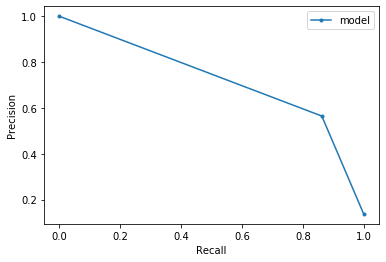

0.7801017524024872

**************

TESTING: 12 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6415429	total: 16.3ms	remaining: 16.3s
1:	learn: 0.5955407	total: 26.4ms	remaining: 13.2s
2:	learn: 0.5512555	total: 39.5ms	remaining: 13.1s
3:	learn: 0.5097430	total: 56.8ms	remaining: 14.1s
4:	learn: 0.4700094	total: 83ms	remaining: 16.5s
5:	learn: 0.4403952	total: 105ms	remaining: 17.4s
6:	learn: 0.4146402	total: 125ms	remaining: 17.7s
7:	learn: 0.3912415	total: 143ms	remaining: 17.7s
8:	learn: 0.3672873	total: 155ms	remaining: 17s
9:	learn: 0.3480042	total: 166ms	remaining: 16.5s
10:	learn: 0.3296042	total: 178ms	remaining: 16s
11:	learn: 0.3120155	total: 190ms	remaining: 15.6s
12:	learn: 0.296601

154:	learn: 0.1337457	total: 2.81s	remaining: 15.3s
155:	learn: 0.1337122	total: 2.83s	remaining: 15.3s
156:	learn: 0.1336284	total: 2.85s	remaining: 15.3s
157:	learn: 0.1335433	total: 2.88s	remaining: 15.3s
158:	learn: 0.1334897	total: 2.9s	remaining: 15.3s
159:	learn: 0.1334293	total: 2.91s	remaining: 15.3s
160:	learn: 0.1333676	total: 2.93s	remaining: 15.3s
161:	learn: 0.1332725	total: 2.94s	remaining: 15.2s
162:	learn: 0.1331441	total: 2.95s	remaining: 15.2s
163:	learn: 0.1330732	total: 2.96s	remaining: 15.1s
164:	learn: 0.1329914	total: 2.98s	remaining: 15.1s
165:	learn: 0.1329061	total: 3s	remaining: 15.1s
166:	learn: 0.1327993	total: 3.02s	remaining: 15.1s
167:	learn: 0.1327446	total: 3.04s	remaining: 15.1s
168:	learn: 0.1326471	total: 3.07s	remaining: 15.1s
169:	learn: 0.1324747	total: 3.09s	remaining: 15.1s
170:	learn: 0.1323378	total: 3.11s	remaining: 15.1s
171:	learn: 0.1322459	total: 3.13s	remaining: 15.1s
172:	learn: 0.1321700	total: 3.14s	remaining: 15s
173:	learn: 0.1321

317:	learn: 0.1222422	total: 5.71s	remaining: 12.2s
318:	learn: 0.1222008	total: 5.73s	remaining: 12.2s
319:	learn: 0.1221341	total: 5.75s	remaining: 12.2s
320:	learn: 0.1220872	total: 5.77s	remaining: 12.2s
321:	learn: 0.1220054	total: 5.8s	remaining: 12.2s
322:	learn: 0.1219388	total: 5.82s	remaining: 12.2s
323:	learn: 0.1218286	total: 5.84s	remaining: 12.2s
324:	learn: 0.1218177	total: 5.86s	remaining: 12.2s
325:	learn: 0.1218143	total: 5.87s	remaining: 12.1s
326:	learn: 0.1217375	total: 5.88s	remaining: 12.1s
327:	learn: 0.1217115	total: 5.89s	remaining: 12.1s
328:	learn: 0.1216328	total: 5.91s	remaining: 12s
329:	learn: 0.1215073	total: 5.93s	remaining: 12s
330:	learn: 0.1215037	total: 5.95s	remaining: 12s
331:	learn: 0.1214163	total: 5.97s	remaining: 12s
332:	learn: 0.1213593	total: 6s	remaining: 12s
333:	learn: 0.1213512	total: 6.02s	remaining: 12s
334:	learn: 0.1213032	total: 6.04s	remaining: 12s
335:	learn: 0.1212949	total: 6.06s	remaining: 12s
336:	learn: 0.1212296	total: 6.0

484:	learn: 0.1127123	total: 8.62s	remaining: 9.16s
485:	learn: 0.1126797	total: 8.65s	remaining: 9.15s
486:	learn: 0.1125938	total: 8.67s	remaining: 9.13s
487:	learn: 0.1125414	total: 8.69s	remaining: 9.12s
488:	learn: 0.1125206	total: 8.72s	remaining: 9.12s
489:	learn: 0.1124857	total: 8.74s	remaining: 9.1s
490:	learn: 0.1123716	total: 8.76s	remaining: 9.08s
491:	learn: 0.1123026	total: 8.78s	remaining: 9.07s
492:	learn: 0.1121828	total: 8.79s	remaining: 9.04s
493:	learn: 0.1121438	total: 8.8s	remaining: 9.02s
494:	learn: 0.1120937	total: 8.82s	remaining: 8.99s
495:	learn: 0.1120782	total: 8.83s	remaining: 8.97s
496:	learn: 0.1120211	total: 8.86s	remaining: 8.96s
497:	learn: 0.1120123	total: 8.88s	remaining: 8.95s
498:	learn: 0.1119937	total: 8.91s	remaining: 8.94s
499:	learn: 0.1119790	total: 8.93s	remaining: 8.93s
500:	learn: 0.1118946	total: 8.95s	remaining: 8.91s
501:	learn: 0.1118013	total: 8.96s	remaining: 8.89s
502:	learn: 0.1117327	total: 8.98s	remaining: 8.87s
503:	learn: 0.

646:	learn: 0.1044590	total: 11.5s	remaining: 6.29s
647:	learn: 0.1044182	total: 11.5s	remaining: 6.27s
648:	learn: 0.1043617	total: 11.6s	remaining: 6.26s
649:	learn: 0.1043220	total: 11.6s	remaining: 6.24s
650:	learn: 0.1042614	total: 11.6s	remaining: 6.22s
651:	learn: 0.1041795	total: 11.6s	remaining: 6.21s
652:	learn: 0.1041355	total: 11.7s	remaining: 6.19s
653:	learn: 0.1040872	total: 11.7s	remaining: 6.18s
654:	learn: 0.1040292	total: 11.7s	remaining: 6.17s
655:	learn: 0.1039760	total: 11.7s	remaining: 6.14s
656:	learn: 0.1039181	total: 11.7s	remaining: 6.13s
657:	learn: 0.1038929	total: 11.8s	remaining: 6.11s
658:	learn: 0.1038240	total: 11.8s	remaining: 6.1s
659:	learn: 0.1037414	total: 11.8s	remaining: 6.08s
660:	learn: 0.1036928	total: 11.8s	remaining: 6.07s
661:	learn: 0.1036330	total: 11.8s	remaining: 6.05s
662:	learn: 0.1036083	total: 11.9s	remaining: 6.03s
663:	learn: 0.1035989	total: 11.9s	remaining: 6.01s
664:	learn: 0.1035537	total: 11.9s	remaining: 5.99s
665:	learn: 0

806:	learn: 0.0964011	total: 14.7s	remaining: 3.51s
807:	learn: 0.0963119	total: 14.7s	remaining: 3.5s
808:	learn: 0.0962552	total: 14.7s	remaining: 3.48s
809:	learn: 0.0961749	total: 14.8s	remaining: 3.46s
810:	learn: 0.0961540	total: 14.8s	remaining: 3.44s
811:	learn: 0.0961299	total: 14.8s	remaining: 3.42s
812:	learn: 0.0960491	total: 14.8s	remaining: 3.41s
813:	learn: 0.0960354	total: 14.8s	remaining: 3.39s
814:	learn: 0.0960342	total: 14.9s	remaining: 3.37s
815:	learn: 0.0959916	total: 14.9s	remaining: 3.35s
816:	learn: 0.0959496	total: 14.9s	remaining: 3.34s
817:	learn: 0.0959294	total: 14.9s	remaining: 3.32s
818:	learn: 0.0958844	total: 14.9s	remaining: 3.3s
819:	learn: 0.0958719	total: 15s	remaining: 3.29s
820:	learn: 0.0958308	total: 15s	remaining: 3.27s
821:	learn: 0.0957484	total: 15s	remaining: 3.25s
822:	learn: 0.0957043	total: 15s	remaining: 3.23s
823:	learn: 0.0956610	total: 15.1s	remaining: 3.21s
824:	learn: 0.0956171	total: 15.1s	remaining: 3.2s
825:	learn: 0.0955736	t

966:	learn: 0.0896320	total: 18.2s	remaining: 622ms
967:	learn: 0.0895896	total: 18.2s	remaining: 603ms
968:	learn: 0.0895426	total: 18.3s	remaining: 585ms
969:	learn: 0.0895127	total: 18.3s	remaining: 566ms
970:	learn: 0.0894754	total: 18.3s	remaining: 548ms
971:	learn: 0.0894415	total: 18.4s	remaining: 529ms
972:	learn: 0.0893822	total: 18.4s	remaining: 510ms
973:	learn: 0.0893668	total: 18.4s	remaining: 491ms
974:	learn: 0.0893231	total: 18.4s	remaining: 473ms
975:	learn: 0.0893181	total: 18.5s	remaining: 454ms
976:	learn: 0.0892741	total: 18.5s	remaining: 435ms
977:	learn: 0.0892620	total: 18.5s	remaining: 416ms
978:	learn: 0.0892466	total: 18.5s	remaining: 398ms
979:	learn: 0.0892050	total: 18.6s	remaining: 379ms
980:	learn: 0.0891623	total: 18.6s	remaining: 360ms
981:	learn: 0.0891525	total: 18.6s	remaining: 341ms
982:	learn: 0.0891056	total: 18.6s	remaining: 322ms
983:	learn: 0.0890699	total: 18.7s	remaining: 303ms
984:	learn: 0.0890079	total: 18.7s	remaining: 284ms
985:	learn: 

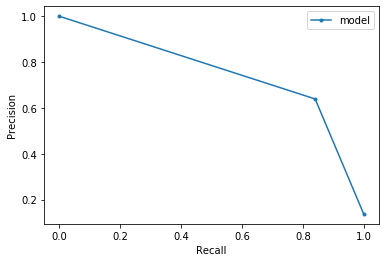

0.7907113462669019

**************

TESTING: 13 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6399734	total: 20.6ms	remaining: 20.6s
1:	learn: 0.5908611	total: 49.7ms	remaining: 24.8s
2:	learn: 0.5410143	total: 77.8ms	remaining: 25.8s
3:	learn: 0.5007986	total: 101ms	remaining: 25.1s
4:	learn: 0.4662325	total: 119ms	remaining: 23.6s
5:	learn: 0.4362248	total: 133ms	remaining: 22.1s
6:	learn: 0.4091621	total: 146ms	remaining: 20.7s
7:	learn: 0.3843302	total: 159ms	remaining: 19.8s
8:	learn: 0.3597543	total: 173ms	remaining: 19s
9:	learn: 0.3404962	total: 186ms	remaining: 18.4s
10:	learn: 0.3248384	total: 207ms	remaining: 18.6s
11:	learn: 0.3085625	total: 235ms	remain

159:	learn: 0.1322583	total: 3.78s	remaining: 19.8s
160:	learn: 0.1321524	total: 3.81s	remaining: 19.9s
161:	learn: 0.1320743	total: 3.84s	remaining: 19.9s
162:	learn: 0.1320281	total: 3.86s	remaining: 19.8s
163:	learn: 0.1319267	total: 3.88s	remaining: 19.8s
164:	learn: 0.1318615	total: 3.9s	remaining: 19.7s
165:	learn: 0.1318421	total: 3.91s	remaining: 19.7s
166:	learn: 0.1317520	total: 3.93s	remaining: 19.6s
167:	learn: 0.1316590	total: 3.94s	remaining: 19.5s
168:	learn: 0.1316033	total: 3.96s	remaining: 19.5s
169:	learn: 0.1315748	total: 3.98s	remaining: 19.4s
170:	learn: 0.1314573	total: 4s	remaining: 19.4s
171:	learn: 0.1313705	total: 4.03s	remaining: 19.4s
172:	learn: 0.1312817	total: 4.05s	remaining: 19.4s
173:	learn: 0.1311169	total: 4.08s	remaining: 19.4s
174:	learn: 0.1310573	total: 4.09s	remaining: 19.3s
175:	learn: 0.1310006	total: 4.11s	remaining: 19.2s
176:	learn: 0.1309085	total: 4.13s	remaining: 19.2s
177:	learn: 0.1308465	total: 4.14s	remaining: 19.1s
178:	learn: 0.13

320:	learn: 0.1205193	total: 8.74s	remaining: 18.5s
321:	learn: 0.1204371	total: 8.8s	remaining: 18.5s
322:	learn: 0.1203281	total: 8.85s	remaining: 18.6s
323:	learn: 0.1202826	total: 8.88s	remaining: 18.5s
324:	learn: 0.1202222	total: 8.92s	remaining: 18.5s
325:	learn: 0.1201389	total: 8.96s	remaining: 18.5s
326:	learn: 0.1200594	total: 9.01s	remaining: 18.6s
327:	learn: 0.1199554	total: 9.06s	remaining: 18.6s
328:	learn: 0.1199358	total: 9.1s	remaining: 18.6s
329:	learn: 0.1198780	total: 9.13s	remaining: 18.5s
330:	learn: 0.1198510	total: 9.16s	remaining: 18.5s
331:	learn: 0.1198400	total: 9.22s	remaining: 18.6s
332:	learn: 0.1197257	total: 9.27s	remaining: 18.6s
333:	learn: 0.1197173	total: 9.31s	remaining: 18.6s
334:	learn: 0.1196910	total: 9.35s	remaining: 18.6s
335:	learn: 0.1196085	total: 9.39s	remaining: 18.5s
336:	learn: 0.1195580	total: 9.44s	remaining: 18.6s
337:	learn: 0.1193762	total: 9.47s	remaining: 18.5s
338:	learn: 0.1193327	total: 9.5s	remaining: 18.5s
339:	learn: 0.1

481:	learn: 0.1114491	total: 13.1s	remaining: 14.1s
482:	learn: 0.1113784	total: 13.1s	remaining: 14s
483:	learn: 0.1112954	total: 13.1s	remaining: 14s
484:	learn: 0.1112912	total: 13.2s	remaining: 14s
485:	learn: 0.1112626	total: 13.2s	remaining: 13.9s
486:	learn: 0.1112583	total: 13.2s	remaining: 13.9s
487:	learn: 0.1112226	total: 13.2s	remaining: 13.9s
488:	learn: 0.1111234	total: 13.2s	remaining: 13.8s
489:	learn: 0.1110582	total: 13.2s	remaining: 13.8s
490:	learn: 0.1110415	total: 13.3s	remaining: 13.7s
491:	learn: 0.1109599	total: 13.3s	remaining: 13.7s
492:	learn: 0.1109448	total: 13.3s	remaining: 13.7s
493:	learn: 0.1108320	total: 13.3s	remaining: 13.7s
494:	learn: 0.1107492	total: 13.4s	remaining: 13.6s
495:	learn: 0.1106712	total: 13.4s	remaining: 13.6s
496:	learn: 0.1106504	total: 13.4s	remaining: 13.6s
497:	learn: 0.1106268	total: 13.4s	remaining: 13.5s
498:	learn: 0.1105461	total: 13.4s	remaining: 13.5s
499:	learn: 0.1104857	total: 13.4s	remaining: 13.4s
500:	learn: 0.1104

646:	learn: 0.1029009	total: 16.3s	remaining: 8.87s
647:	learn: 0.1028907	total: 16.3s	remaining: 8.85s
648:	learn: 0.1028105	total: 16.3s	remaining: 8.82s
649:	learn: 0.1027437	total: 16.3s	remaining: 8.8s
650:	learn: 0.1027367	total: 16.4s	remaining: 8.77s
651:	learn: 0.1026707	total: 16.4s	remaining: 8.74s
652:	learn: 0.1026161	total: 16.4s	remaining: 8.71s
653:	learn: 0.1025919	total: 16.4s	remaining: 8.68s
654:	learn: 0.1025186	total: 16.5s	remaining: 8.68s
655:	learn: 0.1024767	total: 16.5s	remaining: 8.67s
656:	learn: 0.1024308	total: 16.6s	remaining: 8.66s
657:	learn: 0.1023863	total: 16.6s	remaining: 8.65s
658:	learn: 0.1023097	total: 16.7s	remaining: 8.64s
659:	learn: 0.1022660	total: 16.7s	remaining: 8.61s
660:	learn: 0.1021971	total: 16.8s	remaining: 8.59s
661:	learn: 0.1021518	total: 16.8s	remaining: 8.57s
662:	learn: 0.1020347	total: 16.8s	remaining: 8.54s
663:	learn: 0.1019652	total: 16.8s	remaining: 8.52s
664:	learn: 0.1019252	total: 16.9s	remaining: 8.49s
665:	learn: 0

817:	learn: 0.0957514	total: 19.8s	remaining: 4.41s
818:	learn: 0.0956818	total: 19.8s	remaining: 4.39s
819:	learn: 0.0956403	total: 19.9s	remaining: 4.36s
820:	learn: 0.0955734	total: 19.9s	remaining: 4.34s
821:	learn: 0.0955166	total: 19.9s	remaining: 4.31s
822:	learn: 0.0954729	total: 19.9s	remaining: 4.29s
823:	learn: 0.0953888	total: 19.9s	remaining: 4.26s
824:	learn: 0.0953667	total: 19.9s	remaining: 4.23s
825:	learn: 0.0952943	total: 20s	remaining: 4.21s
826:	learn: 0.0952016	total: 20s	remaining: 4.18s
827:	learn: 0.0951965	total: 20s	remaining: 4.15s
828:	learn: 0.0951519	total: 20s	remaining: 4.13s
829:	learn: 0.0950726	total: 20s	remaining: 4.1s
830:	learn: 0.0949936	total: 20s	remaining: 4.07s
831:	learn: 0.0948962	total: 20.1s	remaining: 4.05s
832:	learn: 0.0948253	total: 20.1s	remaining: 4.02s
833:	learn: 0.0947757	total: 20.1s	remaining: 4s
834:	learn: 0.0947636	total: 20.1s	remaining: 3.98s
835:	learn: 0.0946725	total: 20.1s	remaining: 3.95s
836:	learn: 0.0946559	total:

976:	learn: 0.0890730	total: 22.3s	remaining: 525ms
977:	learn: 0.0890332	total: 22.3s	remaining: 502ms
978:	learn: 0.0890298	total: 22.3s	remaining: 479ms
979:	learn: 0.0889703	total: 22.4s	remaining: 456ms
980:	learn: 0.0889305	total: 22.4s	remaining: 433ms
981:	learn: 0.0888791	total: 22.4s	remaining: 411ms
982:	learn: 0.0888647	total: 22.4s	remaining: 388ms
983:	learn: 0.0888379	total: 22.4s	remaining: 365ms
984:	learn: 0.0887835	total: 22.4s	remaining: 342ms
985:	learn: 0.0887735	total: 22.4s	remaining: 319ms
986:	learn: 0.0887294	total: 22.5s	remaining: 296ms
987:	learn: 0.0886781	total: 22.5s	remaining: 273ms
988:	learn: 0.0886334	total: 22.5s	remaining: 250ms
989:	learn: 0.0886223	total: 22.5s	remaining: 227ms
990:	learn: 0.0885709	total: 22.5s	remaining: 205ms
991:	learn: 0.0885643	total: 22.6s	remaining: 182ms
992:	learn: 0.0885306	total: 22.6s	remaining: 159ms
993:	learn: 0.0884685	total: 22.6s	remaining: 136ms
994:	learn: 0.0884178	total: 22.6s	remaining: 114ms
995:	learn: 

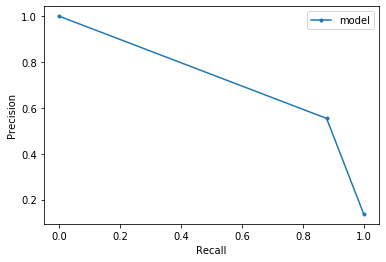

0.7862339115836597

**************

TESTING: 14 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP'] 

Learning rate set to 0.036868
0:	learn: 0.6368192	total: 19ms	remaining: 19s
1:	learn: 0.5908887	total: 39.9ms	remaining: 19.9s
2:	learn: 0.5484663	total: 72.3ms	remaining: 24s
3:	learn: 0.5084944	total: 95.2ms	remaining: 23.7s
4:	learn: 0.4721635	total: 122ms	remaining: 24.2s
5:	learn: 0.4402041	total: 137ms	remaining: 22.7s
6:	learn: 0.4151610	total: 153ms	remaining: 21.6s
7:	learn: 0.3902174	total: 170ms	remaining: 21.1s
8:	learn: 0.3672545	total: 184ms	remaining: 20.3s
9:	learn: 0.3454185	total: 203ms	remaining: 20.1s
10:	learn: 0.3291863	total: 231ms	remaining: 20.8s
11:	learn: 0.3115855	total: 257ms	re

165:	learn: 0.1322198	total: 3.02s	remaining: 15.2s
166:	learn: 0.1321179	total: 3.04s	remaining: 15.2s
167:	learn: 0.1320302	total: 3.07s	remaining: 15.2s
168:	learn: 0.1319481	total: 3.09s	remaining: 15.2s
169:	learn: 0.1318251	total: 3.11s	remaining: 15.2s
170:	learn: 0.1317280	total: 3.12s	remaining: 15.1s
171:	learn: 0.1316821	total: 3.14s	remaining: 15.1s
172:	learn: 0.1315534	total: 3.15s	remaining: 15.1s
173:	learn: 0.1314638	total: 3.16s	remaining: 15s
174:	learn: 0.1313392	total: 3.17s	remaining: 15s
175:	learn: 0.1312732	total: 3.18s	remaining: 14.9s
176:	learn: 0.1312110	total: 3.2s	remaining: 14.9s
177:	learn: 0.1311955	total: 3.2s	remaining: 14.8s
178:	learn: 0.1311217	total: 3.21s	remaining: 14.7s
179:	learn: 0.1310693	total: 3.24s	remaining: 14.8s
180:	learn: 0.1309683	total: 3.26s	remaining: 14.8s
181:	learn: 0.1308989	total: 3.28s	remaining: 14.8s
182:	learn: 0.1307469	total: 3.3s	remaining: 14.7s
183:	learn: 0.1307073	total: 3.32s	remaining: 14.7s
184:	learn: 0.13065

328:	learn: 0.1200214	total: 5.54s	remaining: 11.3s
329:	learn: 0.1199241	total: 5.57s	remaining: 11.3s
330:	learn: 0.1199135	total: 5.59s	remaining: 11.3s
331:	learn: 0.1197593	total: 5.61s	remaining: 11.3s
332:	learn: 0.1196227	total: 5.63s	remaining: 11.3s
333:	learn: 0.1195331	total: 5.64s	remaining: 11.3s
334:	learn: 0.1194787	total: 5.66s	remaining: 11.2s
335:	learn: 0.1193984	total: 5.67s	remaining: 11.2s
336:	learn: 0.1193308	total: 5.69s	remaining: 11.2s
337:	learn: 0.1193222	total: 5.7s	remaining: 11.2s
338:	learn: 0.1191607	total: 5.71s	remaining: 11.1s
339:	learn: 0.1190903	total: 5.72s	remaining: 11.1s
340:	learn: 0.1190805	total: 5.73s	remaining: 11.1s
341:	learn: 0.1190284	total: 5.75s	remaining: 11.1s
342:	learn: 0.1189404	total: 5.76s	remaining: 11s
343:	learn: 0.1189319	total: 5.78s	remaining: 11s
344:	learn: 0.1188964	total: 5.8s	remaining: 11s
345:	learn: 0.1188888	total: 5.82s	remaining: 11s
346:	learn: 0.1188478	total: 5.84s	remaining: 11s
347:	learn: 0.1187215	to

493:	learn: 0.1098097	total: 8.11s	remaining: 8.3s
494:	learn: 0.1097649	total: 8.13s	remaining: 8.3s
495:	learn: 0.1096354	total: 8.15s	remaining: 8.28s
496:	learn: 0.1095645	total: 8.18s	remaining: 8.27s
497:	learn: 0.1095194	total: 8.19s	remaining: 8.25s
498:	learn: 0.1094594	total: 8.2s	remaining: 8.23s
499:	learn: 0.1094252	total: 8.21s	remaining: 8.21s
500:	learn: 0.1093618	total: 8.23s	remaining: 8.2s
501:	learn: 0.1092585	total: 8.24s	remaining: 8.18s
502:	learn: 0.1091502	total: 8.25s	remaining: 8.15s
503:	learn: 0.1091388	total: 8.27s	remaining: 8.14s
504:	learn: 0.1091371	total: 8.29s	remaining: 8.12s
505:	learn: 0.1090536	total: 8.3s	remaining: 8.11s
506:	learn: 0.1090386	total: 8.34s	remaining: 8.11s
507:	learn: 0.1089316	total: 8.37s	remaining: 8.1s
508:	learn: 0.1088623	total: 8.39s	remaining: 8.09s
509:	learn: 0.1087838	total: 8.41s	remaining: 8.08s
510:	learn: 0.1086963	total: 8.42s	remaining: 8.06s
511:	learn: 0.1086129	total: 8.44s	remaining: 8.04s
512:	learn: 0.1085

662:	learn: 0.1007684	total: 10.9s	remaining: 5.54s
663:	learn: 0.1006727	total: 10.9s	remaining: 5.53s
664:	learn: 0.1006660	total: 10.9s	remaining: 5.51s
665:	learn: 0.1006060	total: 11s	remaining: 5.5s
666:	learn: 0.1005238	total: 11s	remaining: 5.48s
667:	learn: 0.1005016	total: 11s	remaining: 5.46s
668:	learn: 0.1004745	total: 11s	remaining: 5.45s
669:	learn: 0.1004445	total: 11s	remaining: 5.43s
670:	learn: 0.1004079	total: 11s	remaining: 5.41s
671:	learn: 0.1003092	total: 11.1s	remaining: 5.39s
672:	learn: 0.1002601	total: 11.1s	remaining: 5.38s
673:	learn: 0.1002089	total: 11.1s	remaining: 5.36s
674:	learn: 0.1001893	total: 11.1s	remaining: 5.34s
675:	learn: 0.1001561	total: 11.1s	remaining: 5.33s
676:	learn: 0.1000552	total: 11.1s	remaining: 5.32s
677:	learn: 0.1000431	total: 11.2s	remaining: 5.3s
678:	learn: 0.1000026	total: 11.2s	remaining: 5.29s
679:	learn: 0.0999830	total: 11.2s	remaining: 5.27s
680:	learn: 0.0999335	total: 11.2s	remaining: 5.25s
681:	learn: 0.0998393	tota

832:	learn: 0.0926918	total: 13.6s	remaining: 2.73s
833:	learn: 0.0926890	total: 13.6s	remaining: 2.71s
834:	learn: 0.0926149	total: 13.7s	remaining: 2.7s
835:	learn: 0.0925509	total: 13.7s	remaining: 2.68s
836:	learn: 0.0924623	total: 13.7s	remaining: 2.67s
837:	learn: 0.0924200	total: 13.7s	remaining: 2.65s
838:	learn: 0.0923840	total: 13.7s	remaining: 2.63s
839:	learn: 0.0923290	total: 13.7s	remaining: 2.62s
840:	learn: 0.0922904	total: 13.8s	remaining: 2.6s
841:	learn: 0.0922613	total: 13.8s	remaining: 2.58s
842:	learn: 0.0922297	total: 13.8s	remaining: 2.56s
843:	learn: 0.0921668	total: 13.8s	remaining: 2.55s
844:	learn: 0.0921276	total: 13.8s	remaining: 2.53s
845:	learn: 0.0921223	total: 13.8s	remaining: 2.51s
846:	learn: 0.0920711	total: 13.8s	remaining: 2.5s
847:	learn: 0.0920241	total: 13.9s	remaining: 2.48s
848:	learn: 0.0919942	total: 13.9s	remaining: 2.47s
849:	learn: 0.0918995	total: 13.9s	remaining: 2.45s
850:	learn: 0.0918970	total: 13.9s	remaining: 2.44s
851:	learn: 0.0

999:	learn: 0.0854383	total: 16.1s	remaining: 0us
Best F2 score: 0.7846715328467153 at a threshold of 0.13

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1800  211]
 [  44  276]]

True Positives: 276
True Negatives: 1800
False Positives: 211
False Negatives: 44


Recall: 0.8625
Precision: 0.5667351129363449
Specificity 0.8950770760815515
F1 score: 0.6840148698884758
F2 score: 0.7809847198641766


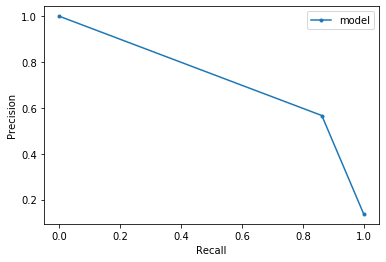

0.7809847198641766

**************

TESTING: 15 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6382928	total: 17.4ms	remaining: 17.4s
1:	learn: 0.5890796	total: 36.5ms	remaining: 18.2s
2:	learn: 0.5491747	total: 67ms	remaining: 22.3s
3:	learn: 0.5114796	total: 92.7ms	remaining: 23.1s
4:	learn: 0.4741800	total: 113ms	remaining: 22.6s
5:	learn: 0.4425207	total: 126ms	remaining: 20.9s
6:	learn: 0.4155235	total: 140ms	remaining: 19.9s
7:	learn: 0.3879661	total: 154ms	remaining: 19.1s
8:	learn: 0.3645370	total: 168ms	remaining: 18.5s
9:	learn: 0.3452008	total: 183ms	remaining: 18.1s
10:	learn: 0.3283518	total: 195ms	remaining: 17.6s
11:	learn: 0.

159:	learn: 0.1320719	total: 3.14s	remaining: 16.5s
160:	learn: 0.1320117	total: 3.17s	remaining: 16.5s
161:	learn: 0.1319019	total: 3.19s	remaining: 16.5s
162:	learn: 0.1318086	total: 3.22s	remaining: 16.5s
163:	learn: 0.1316724	total: 3.25s	remaining: 16.6s
164:	learn: 0.1315802	total: 3.27s	remaining: 16.5s
165:	learn: 0.1314489	total: 3.29s	remaining: 16.5s
166:	learn: 0.1313874	total: 3.31s	remaining: 16.5s
167:	learn: 0.1312457	total: 3.32s	remaining: 16.4s
168:	learn: 0.1311755	total: 3.33s	remaining: 16.4s
169:	learn: 0.1310967	total: 3.34s	remaining: 16.3s
170:	learn: 0.1309625	total: 3.37s	remaining: 16.3s
171:	learn: 0.1308731	total: 3.4s	remaining: 16.4s
172:	learn: 0.1307611	total: 3.43s	remaining: 16.4s
173:	learn: 0.1306735	total: 3.46s	remaining: 16.4s
174:	learn: 0.1305765	total: 3.48s	remaining: 16.4s
175:	learn: 0.1304584	total: 3.5s	remaining: 16.4s
176:	learn: 0.1303370	total: 3.52s	remaining: 16.4s
177:	learn: 0.1302684	total: 3.53s	remaining: 16.3s
178:	learn: 0.

320:	learn: 0.1193919	total: 5.84s	remaining: 12.4s
321:	learn: 0.1193845	total: 5.87s	remaining: 12.4s
322:	learn: 0.1192958	total: 5.89s	remaining: 12.4s
323:	learn: 0.1191932	total: 5.91s	remaining: 12.3s
324:	learn: 0.1191133	total: 5.94s	remaining: 12.3s
325:	learn: 0.1190428	total: 5.96s	remaining: 12.3s
326:	learn: 0.1189433	total: 5.98s	remaining: 12.3s
327:	learn: 0.1189063	total: 6s	remaining: 12.3s
328:	learn: 0.1188363	total: 6.02s	remaining: 12.3s
329:	learn: 0.1187716	total: 6.03s	remaining: 12.2s
330:	learn: 0.1185854	total: 6.05s	remaining: 12.2s
331:	learn: 0.1185563	total: 6.08s	remaining: 12.2s
332:	learn: 0.1185045	total: 6.1s	remaining: 12.2s
333:	learn: 0.1185001	total: 6.12s	remaining: 12.2s
334:	learn: 0.1183937	total: 6.13s	remaining: 12.2s
335:	learn: 0.1183095	total: 6.15s	remaining: 12.1s
336:	learn: 0.1182811	total: 6.16s	remaining: 12.1s
337:	learn: 0.1182776	total: 6.17s	remaining: 12.1s
338:	learn: 0.1181886	total: 6.18s	remaining: 12.1s
339:	learn: 0.11

484:	learn: 0.1084270	total: 8.57s	remaining: 9.1s
485:	learn: 0.1083133	total: 8.59s	remaining: 9.09s
486:	learn: 0.1082175	total: 8.62s	remaining: 9.08s
487:	learn: 0.1081774	total: 8.64s	remaining: 9.06s
488:	learn: 0.1081234	total: 8.65s	remaining: 9.04s
489:	learn: 0.1080997	total: 8.66s	remaining: 9.02s
490:	learn: 0.1080854	total: 8.68s	remaining: 9s
491:	learn: 0.1080069	total: 8.69s	remaining: 8.97s
492:	learn: 0.1079404	total: 8.71s	remaining: 8.95s
493:	learn: 0.1078999	total: 8.72s	remaining: 8.93s
494:	learn: 0.1078503	total: 8.73s	remaining: 8.91s
495:	learn: 0.1078148	total: 8.75s	remaining: 8.89s
496:	learn: 0.1077492	total: 8.76s	remaining: 8.87s
497:	learn: 0.1076792	total: 8.79s	remaining: 8.86s
498:	learn: 0.1076124	total: 8.81s	remaining: 8.85s
499:	learn: 0.1075570	total: 8.84s	remaining: 8.84s
500:	learn: 0.1074901	total: 8.86s	remaining: 8.82s
501:	learn: 0.1074805	total: 8.87s	remaining: 8.8s
502:	learn: 0.1073454	total: 8.89s	remaining: 8.78s
503:	learn: 0.107

645:	learn: 0.0992106	total: 11.3s	remaining: 6.21s
646:	learn: 0.0991498	total: 11.4s	remaining: 6.2s
647:	learn: 0.0990979	total: 11.4s	remaining: 6.18s
648:	learn: 0.0990875	total: 11.4s	remaining: 6.17s
649:	learn: 0.0990139	total: 11.4s	remaining: 6.15s
650:	learn: 0.0989701	total: 11.4s	remaining: 6.14s
651:	learn: 0.0988814	total: 11.5s	remaining: 6.12s
652:	learn: 0.0988356	total: 11.5s	remaining: 6.1s
653:	learn: 0.0988298	total: 11.5s	remaining: 6.08s
654:	learn: 0.0987500	total: 11.5s	remaining: 6.07s
655:	learn: 0.0987089	total: 11.5s	remaining: 6.05s
656:	learn: 0.0986964	total: 11.6s	remaining: 6.04s
657:	learn: 0.0986801	total: 11.6s	remaining: 6.03s
658:	learn: 0.0986108	total: 11.6s	remaining: 6.01s
659:	learn: 0.0985656	total: 11.6s	remaining: 6s
660:	learn: 0.0985643	total: 11.7s	remaining: 5.98s
661:	learn: 0.0985231	total: 11.7s	remaining: 5.96s
662:	learn: 0.0985225	total: 11.7s	remaining: 5.94s
663:	learn: 0.0984785	total: 11.7s	remaining: 5.92s
664:	learn: 0.098

805:	learn: 0.0911178	total: 14s	remaining: 3.38s
806:	learn: 0.0910463	total: 14.1s	remaining: 3.36s
807:	learn: 0.0910134	total: 14.1s	remaining: 3.35s
808:	learn: 0.0909677	total: 14.1s	remaining: 3.33s
809:	learn: 0.0908646	total: 14.1s	remaining: 3.32s
810:	learn: 0.0907842	total: 14.2s	remaining: 3.3s
811:	learn: 0.0907273	total: 14.2s	remaining: 3.28s
812:	learn: 0.0906694	total: 14.2s	remaining: 3.26s
813:	learn: 0.0906149	total: 14.2s	remaining: 3.24s
814:	learn: 0.0905706	total: 14.2s	remaining: 3.23s
815:	learn: 0.0905389	total: 14.2s	remaining: 3.21s
816:	learn: 0.0904914	total: 14.2s	remaining: 3.19s
817:	learn: 0.0904163	total: 14.3s	remaining: 3.17s
818:	learn: 0.0903851	total: 14.3s	remaining: 3.16s
819:	learn: 0.0903581	total: 14.3s	remaining: 3.14s
820:	learn: 0.0903121	total: 14.3s	remaining: 3.13s
821:	learn: 0.0902872	total: 14.4s	remaining: 3.11s
822:	learn: 0.0902480	total: 14.4s	remaining: 3.09s
823:	learn: 0.0901681	total: 14.4s	remaining: 3.07s
824:	learn: 0.0

965:	learn: 0.0840297	total: 16.8s	remaining: 591ms
966:	learn: 0.0840269	total: 16.8s	remaining: 574ms
967:	learn: 0.0840038	total: 16.8s	remaining: 556ms
968:	learn: 0.0839507	total: 16.9s	remaining: 539ms
969:	learn: 0.0838950	total: 16.9s	remaining: 522ms
970:	learn: 0.0838504	total: 16.9s	remaining: 504ms
971:	learn: 0.0837827	total: 16.9s	remaining: 487ms
972:	learn: 0.0837741	total: 16.9s	remaining: 469ms
973:	learn: 0.0837234	total: 16.9s	remaining: 452ms
974:	learn: 0.0836529	total: 16.9s	remaining: 434ms
975:	learn: 0.0836339	total: 16.9s	remaining: 417ms
976:	learn: 0.0836288	total: 17s	remaining: 399ms
977:	learn: 0.0835968	total: 17s	remaining: 382ms
978:	learn: 0.0835646	total: 17s	remaining: 364ms
979:	learn: 0.0834948	total: 17s	remaining: 347ms
980:	learn: 0.0834497	total: 17s	remaining: 330ms
981:	learn: 0.0833868	total: 17.1s	remaining: 313ms
982:	learn: 0.0833630	total: 17.1s	remaining: 295ms
983:	learn: 0.0833189	total: 17.1s	remaining: 278ms
984:	learn: 0.0832693	

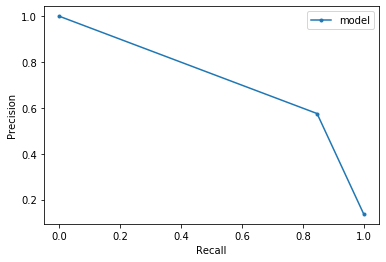

0.7738435179897202

**************

TESTING: 16 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6391724	total: 17.2ms	remaining: 17.2s
1:	learn: 0.5921662	total: 42.1ms	remaining: 21s
2:	learn: 0.5447014	total: 68.1ms	remaining: 22.6s
3:	learn: 0.5048749	total: 88.8ms	remaining: 22.1s
4:	learn: 0.4699844	total: 110ms	remaining: 21.8s
5:	learn: 0.4397643	total: 124ms	remaining: 20.5s
6:	learn: 0.4122596	total: 137ms	remaining: 19.4s
7:	learn: 0.3888073	total: 149ms	remaining: 18.5s
8:	learn: 0.3646814	total: 161ms	remaining: 17.7s
9:	learn: 0.3456342	total: 174ms	remaining: 17.2s
10:	learn: 0.3279946	total: 187ms	remainin

157:	learn: 0.1319885	total: 3.38s	remaining: 18s
158:	learn: 0.1318977	total: 3.4s	remaining: 18s
159:	learn: 0.1318301	total: 3.43s	remaining: 18s
160:	learn: 0.1316635	total: 3.46s	remaining: 18s
161:	learn: 0.1315304	total: 3.48s	remaining: 18s
162:	learn: 0.1314383	total: 3.5s	remaining: 18s
163:	learn: 0.1313650	total: 3.52s	remaining: 18s
164:	learn: 0.1313066	total: 3.54s	remaining: 17.9s
165:	learn: 0.1311954	total: 3.55s	remaining: 17.8s
166:	learn: 0.1310467	total: 3.56s	remaining: 17.8s
167:	learn: 0.1308948	total: 3.58s	remaining: 17.7s
168:	learn: 0.1307672	total: 3.6s	remaining: 17.7s
169:	learn: 0.1306942	total: 3.63s	remaining: 17.7s
170:	learn: 0.1306053	total: 3.65s	remaining: 17.7s
171:	learn: 0.1305318	total: 3.68s	remaining: 17.7s
172:	learn: 0.1304716	total: 3.7s	remaining: 17.7s
173:	learn: 0.1303933	total: 3.72s	remaining: 17.7s
174:	learn: 0.1302880	total: 3.74s	remaining: 17.6s
175:	learn: 0.1301782	total: 3.75s	remaining: 17.6s
176:	learn: 0.1300280	total: 3

317:	learn: 0.1190808	total: 6.75s	remaining: 14.5s
318:	learn: 0.1189828	total: 6.78s	remaining: 14.5s
319:	learn: 0.1188902	total: 6.8s	remaining: 14.4s
320:	learn: 0.1188157	total: 6.82s	remaining: 14.4s
321:	learn: 0.1187648	total: 6.85s	remaining: 14.4s
322:	learn: 0.1186853	total: 6.87s	remaining: 14.4s
323:	learn: 0.1186260	total: 6.89s	remaining: 14.4s
324:	learn: 0.1185374	total: 6.91s	remaining: 14.4s
325:	learn: 0.1184347	total: 6.92s	remaining: 14.3s
326:	learn: 0.1183517	total: 6.94s	remaining: 14.3s
327:	learn: 0.1182469	total: 6.95s	remaining: 14.2s
328:	learn: 0.1181758	total: 6.98s	remaining: 14.2s
329:	learn: 0.1181139	total: 7s	remaining: 14.2s
330:	learn: 0.1179808	total: 7.02s	remaining: 14.2s
331:	learn: 0.1179547	total: 7.05s	remaining: 14.2s
332:	learn: 0.1178713	total: 7.08s	remaining: 14.2s
333:	learn: 0.1178485	total: 7.1s	remaining: 14.2s
334:	learn: 0.1177106	total: 7.12s	remaining: 14.1s
335:	learn: 0.1176124	total: 7.13s	remaining: 14.1s
336:	learn: 0.117

481:	learn: 0.1078657	total: 10.2s	remaining: 10.9s
482:	learn: 0.1078551	total: 10.2s	remaining: 10.9s
483:	learn: 0.1077543	total: 10.2s	remaining: 10.9s
484:	learn: 0.1076809	total: 10.2s	remaining: 10.9s
485:	learn: 0.1076775	total: 10.3s	remaining: 10.9s
486:	learn: 0.1076294	total: 10.3s	remaining: 10.8s
487:	learn: 0.1075871	total: 10.3s	remaining: 10.8s
488:	learn: 0.1075125	total: 10.3s	remaining: 10.8s
489:	learn: 0.1074510	total: 10.4s	remaining: 10.8s
490:	learn: 0.1074319	total: 10.4s	remaining: 10.7s
491:	learn: 0.1073764	total: 10.4s	remaining: 10.7s
492:	learn: 0.1073010	total: 10.4s	remaining: 10.7s
493:	learn: 0.1072611	total: 10.4s	remaining: 10.7s
494:	learn: 0.1072590	total: 10.4s	remaining: 10.7s
495:	learn: 0.1071962	total: 10.5s	remaining: 10.6s
496:	learn: 0.1070606	total: 10.5s	remaining: 10.6s
497:	learn: 0.1069212	total: 10.5s	remaining: 10.6s
498:	learn: 0.1068489	total: 10.5s	remaining: 10.6s
499:	learn: 0.1067982	total: 10.6s	remaining: 10.6s
500:	learn: 

641:	learn: 0.0987203	total: 13.5s	remaining: 7.55s
642:	learn: 0.0987190	total: 13.6s	remaining: 7.53s
643:	learn: 0.0986339	total: 13.6s	remaining: 7.51s
644:	learn: 0.0985497	total: 13.6s	remaining: 7.49s
645:	learn: 0.0985113	total: 13.6s	remaining: 7.46s
646:	learn: 0.0984830	total: 13.6s	remaining: 7.44s
647:	learn: 0.0984500	total: 13.6s	remaining: 7.41s
648:	learn: 0.0983803	total: 13.7s	remaining: 7.4s
649:	learn: 0.0982624	total: 13.7s	remaining: 7.38s
650:	learn: 0.0982431	total: 13.7s	remaining: 7.36s
651:	learn: 0.0981873	total: 13.7s	remaining: 7.33s
652:	learn: 0.0981377	total: 13.8s	remaining: 7.32s
653:	learn: 0.0980676	total: 13.8s	remaining: 7.3s
654:	learn: 0.0980376	total: 13.8s	remaining: 7.27s
655:	learn: 0.0980179	total: 13.8s	remaining: 7.25s
656:	learn: 0.0979855	total: 13.8s	remaining: 7.22s
657:	learn: 0.0979560	total: 13.9s	remaining: 7.2s
658:	learn: 0.0978958	total: 13.9s	remaining: 7.18s
659:	learn: 0.0977909	total: 13.9s	remaining: 7.16s
660:	learn: 0.0

800:	learn: 0.0902665	total: 16.6s	remaining: 4.12s
801:	learn: 0.0902253	total: 16.6s	remaining: 4.1s
802:	learn: 0.0901577	total: 16.6s	remaining: 4.08s
803:	learn: 0.0901095	total: 16.7s	remaining: 4.06s
804:	learn: 0.0900777	total: 16.7s	remaining: 4.04s
805:	learn: 0.0900293	total: 16.7s	remaining: 4.02s
806:	learn: 0.0899992	total: 16.7s	remaining: 4s
807:	learn: 0.0899140	total: 16.7s	remaining: 3.98s
808:	learn: 0.0898390	total: 16.7s	remaining: 3.95s
809:	learn: 0.0898014	total: 16.8s	remaining: 3.93s
810:	learn: 0.0897312	total: 16.8s	remaining: 3.91s
811:	learn: 0.0896920	total: 16.8s	remaining: 3.88s
812:	learn: 0.0896823	total: 16.8s	remaining: 3.86s
813:	learn: 0.0896343	total: 16.8s	remaining: 3.84s
814:	learn: 0.0896215	total: 16.8s	remaining: 3.82s
815:	learn: 0.0895922	total: 16.9s	remaining: 3.8s
816:	learn: 0.0895725	total: 16.9s	remaining: 3.78s
817:	learn: 0.0895044	total: 16.9s	remaining: 3.76s
818:	learn: 0.0894982	total: 16.9s	remaining: 3.74s
819:	learn: 0.089

962:	learn: 0.0829453	total: 19.7s	remaining: 759ms
963:	learn: 0.0829303	total: 19.8s	remaining: 738ms
964:	learn: 0.0829086	total: 19.8s	remaining: 718ms
965:	learn: 0.0828859	total: 19.8s	remaining: 698ms
966:	learn: 0.0828270	total: 19.8s	remaining: 677ms
967:	learn: 0.0827655	total: 19.9s	remaining: 657ms
968:	learn: 0.0827639	total: 19.9s	remaining: 636ms
969:	learn: 0.0827400	total: 19.9s	remaining: 616ms
970:	learn: 0.0827037	total: 19.9s	remaining: 595ms
971:	learn: 0.0826342	total: 19.9s	remaining: 574ms
972:	learn: 0.0825984	total: 19.9s	remaining: 553ms
973:	learn: 0.0825730	total: 20s	remaining: 533ms
974:	learn: 0.0825463	total: 20s	remaining: 512ms
975:	learn: 0.0825011	total: 20s	remaining: 492ms
976:	learn: 0.0824895	total: 20s	remaining: 471ms
977:	learn: 0.0824206	total: 20.1s	remaining: 451ms
978:	learn: 0.0823624	total: 20.1s	remaining: 431ms
979:	learn: 0.0823246	total: 20.1s	remaining: 410ms
980:	learn: 0.0822868	total: 20.1s	remaining: 389ms
981:	learn: 0.082247

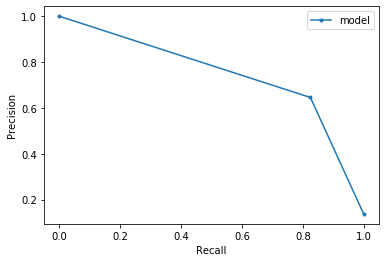

0.7815275310834814

**************

TESTING: 17 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6385444	total: 17ms	remaining: 17s
1:	learn: 0.5860377	total: 33.1ms	remaining: 16.5s
2:	learn: 0.5448411	total: 60.5ms	remaining: 20.1s
3:	learn: 0.5069236	total: 85.4ms	remaining: 21.3s
4:	learn: 0.4730377	total: 106ms	remaining: 21s
5:	learn: 0.4419504	total: 125ms	remaining: 20.7s
6:	learn: 0.4124766	total: 139ms	remaining: 19.7s
7:	learn: 0.3860664	total: 151ms	remaining: 18.7s
8:	learn: 0.3657762	total: 162ms	remaining: 17.9s
9:	learn: 0.3467785	total: 174ms	remaining: 17.3s
10:	le

152:	learn: 0.1325494	total: 2.99s	remaining: 16.6s
153:	learn: 0.1324524	total: 3.01s	remaining: 16.6s
154:	learn: 0.1323350	total: 3.04s	remaining: 16.6s
155:	learn: 0.1321937	total: 3.06s	remaining: 16.6s
156:	learn: 0.1321178	total: 3.1s	remaining: 16.6s
157:	learn: 0.1320974	total: 3.12s	remaining: 16.6s
158:	learn: 0.1319944	total: 3.14s	remaining: 16.6s
159:	learn: 0.1318789	total: 3.17s	remaining: 16.6s
160:	learn: 0.1318109	total: 3.19s	remaining: 16.6s
161:	learn: 0.1317004	total: 3.21s	remaining: 16.6s
162:	learn: 0.1315888	total: 3.23s	remaining: 16.6s
163:	learn: 0.1315571	total: 3.27s	remaining: 16.6s
164:	learn: 0.1314586	total: 3.29s	remaining: 16.6s
165:	learn: 0.1312757	total: 3.31s	remaining: 16.7s
166:	learn: 0.1311932	total: 3.33s	remaining: 16.6s
167:	learn: 0.1309930	total: 3.36s	remaining: 16.6s
168:	learn: 0.1309112	total: 3.38s	remaining: 16.6s
169:	learn: 0.1307544	total: 3.4s	remaining: 16.6s
170:	learn: 0.1306459	total: 3.43s	remaining: 16.6s
171:	learn: 0.

314:	learn: 0.1183132	total: 6.94s	remaining: 15.1s
315:	learn: 0.1182571	total: 6.96s	remaining: 15.1s
316:	learn: 0.1180892	total: 7s	remaining: 15.1s
317:	learn: 0.1180803	total: 7.02s	remaining: 15.1s
318:	learn: 0.1180103	total: 7.04s	remaining: 15s
319:	learn: 0.1179278	total: 7.06s	remaining: 15s
320:	learn: 0.1179154	total: 7.08s	remaining: 15s
321:	learn: 0.1178386	total: 7.11s	remaining: 15s
322:	learn: 0.1177662	total: 7.14s	remaining: 15s
323:	learn: 0.1176463	total: 7.16s	remaining: 14.9s
324:	learn: 0.1176106	total: 7.18s	remaining: 14.9s
325:	learn: 0.1175151	total: 7.2s	remaining: 14.9s
326:	learn: 0.1174410	total: 7.22s	remaining: 14.9s
327:	learn: 0.1173695	total: 7.24s	remaining: 14.8s
328:	learn: 0.1172499	total: 7.26s	remaining: 14.8s
329:	learn: 0.1171538	total: 7.29s	remaining: 14.8s
330:	learn: 0.1170770	total: 7.31s	remaining: 14.8s
331:	learn: 0.1170652	total: 7.33s	remaining: 14.8s
332:	learn: 0.1170569	total: 7.36s	remaining: 14.7s
333:	learn: 0.1169765	tota

473:	learn: 0.1073973	total: 10.9s	remaining: 12.1s
474:	learn: 0.1073216	total: 10.9s	remaining: 12.1s
475:	learn: 0.1071826	total: 11s	remaining: 12.1s
476:	learn: 0.1070984	total: 11s	remaining: 12s
477:	learn: 0.1069638	total: 11s	remaining: 12s
478:	learn: 0.1069029	total: 11s	remaining: 12s
479:	learn: 0.1068733	total: 11s	remaining: 12s
480:	learn: 0.1068276	total: 11.1s	remaining: 11.9s
481:	learn: 0.1067786	total: 11.1s	remaining: 11.9s
482:	learn: 0.1067205	total: 11.1s	remaining: 11.9s
483:	learn: 0.1066049	total: 11.1s	remaining: 11.9s
484:	learn: 0.1065275	total: 11.2s	remaining: 11.9s
485:	learn: 0.1064832	total: 11.2s	remaining: 11.8s
486:	learn: 0.1063898	total: 11.2s	remaining: 11.8s
487:	learn: 0.1063221	total: 11.2s	remaining: 11.8s
488:	learn: 0.1062780	total: 11.2s	remaining: 11.7s
489:	learn: 0.1062332	total: 11.3s	remaining: 11.7s
490:	learn: 0.1061694	total: 11.3s	remaining: 11.7s
491:	learn: 0.1061231	total: 11.3s	remaining: 11.7s
492:	learn: 0.1059935	total: 1

634:	learn: 0.0971613	total: 14.5s	remaining: 8.34s
635:	learn: 0.0971599	total: 14.5s	remaining: 8.32s
636:	learn: 0.0971209	total: 14.6s	remaining: 8.3s
637:	learn: 0.0970831	total: 14.6s	remaining: 8.28s
638:	learn: 0.0970525	total: 14.6s	remaining: 8.26s
639:	learn: 0.0969558	total: 14.6s	remaining: 8.23s
640:	learn: 0.0968768	total: 14.7s	remaining: 8.21s
641:	learn: 0.0968118	total: 14.7s	remaining: 8.18s
642:	learn: 0.0967964	total: 14.7s	remaining: 8.15s
643:	learn: 0.0967232	total: 14.7s	remaining: 8.13s
644:	learn: 0.0966949	total: 14.7s	remaining: 8.1s
645:	learn: 0.0966854	total: 14.7s	remaining: 8.08s
646:	learn: 0.0966267	total: 14.8s	remaining: 8.06s
647:	learn: 0.0965842	total: 14.8s	remaining: 8.04s
648:	learn: 0.0964888	total: 14.8s	remaining: 8.02s
649:	learn: 0.0963727	total: 14.9s	remaining: 8s
650:	learn: 0.0962903	total: 14.9s	remaining: 7.97s
651:	learn: 0.0962402	total: 14.9s	remaining: 7.95s
652:	learn: 0.0961567	total: 14.9s	remaining: 7.92s
653:	learn: 0.096

797:	learn: 0.0882044	total: 17.5s	remaining: 4.42s
798:	learn: 0.0881494	total: 17.5s	remaining: 4.4s
799:	learn: 0.0881251	total: 17.5s	remaining: 4.38s
800:	learn: 0.0880982	total: 17.5s	remaining: 4.36s
801:	learn: 0.0880693	total: 17.6s	remaining: 4.34s
802:	learn: 0.0880102	total: 17.6s	remaining: 4.31s
803:	learn: 0.0879640	total: 17.6s	remaining: 4.29s
804:	learn: 0.0879283	total: 17.6s	remaining: 4.26s
805:	learn: 0.0878575	total: 17.6s	remaining: 4.24s
806:	learn: 0.0878565	total: 17.6s	remaining: 4.22s
807:	learn: 0.0878147	total: 17.6s	remaining: 4.19s
808:	learn: 0.0877979	total: 17.7s	remaining: 4.17s
809:	learn: 0.0877968	total: 17.7s	remaining: 4.15s
810:	learn: 0.0877270	total: 17.7s	remaining: 4.13s
811:	learn: 0.0876263	total: 17.7s	remaining: 4.1s
812:	learn: 0.0876250	total: 17.7s	remaining: 4.08s
813:	learn: 0.0875911	total: 17.8s	remaining: 4.06s
814:	learn: 0.0875670	total: 17.8s	remaining: 4.04s
815:	learn: 0.0875416	total: 17.8s	remaining: 4.01s
816:	learn: 0.

959:	learn: 0.0811123	total: 20.4s	remaining: 850ms
960:	learn: 0.0810559	total: 20.4s	remaining: 829ms
961:	learn: 0.0810343	total: 20.5s	remaining: 809ms
962:	learn: 0.0809677	total: 20.5s	remaining: 788ms
963:	learn: 0.0809609	total: 20.5s	remaining: 766ms
964:	learn: 0.0808964	total: 20.5s	remaining: 745ms
965:	learn: 0.0808676	total: 20.5s	remaining: 723ms
966:	learn: 0.0808131	total: 20.6s	remaining: 702ms
967:	learn: 0.0807122	total: 20.6s	remaining: 680ms
968:	learn: 0.0806575	total: 20.6s	remaining: 659ms
969:	learn: 0.0806243	total: 20.6s	remaining: 638ms
970:	learn: 0.0805501	total: 20.6s	remaining: 617ms
971:	learn: 0.0805135	total: 20.7s	remaining: 595ms
972:	learn: 0.0804809	total: 20.7s	remaining: 574ms
973:	learn: 0.0804115	total: 20.7s	remaining: 553ms
974:	learn: 0.0803737	total: 20.7s	remaining: 531ms
975:	learn: 0.0803633	total: 20.7s	remaining: 510ms
976:	learn: 0.0803266	total: 20.8s	remaining: 489ms
977:	learn: 0.0802768	total: 20.8s	remaining: 467ms
978:	learn: 

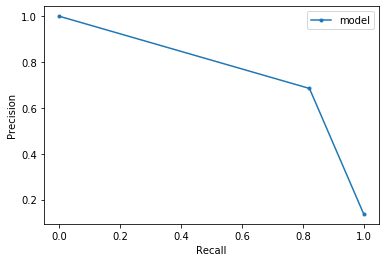

0.7902644230769231

**************

TESTING: 18 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin'] 

Learning rate set to 0.036868
0:	learn: 0.6326438	total: 34.8ms	remaining: 34.7s
1:	learn: 0.5912339	total: 56ms	remaining: 27.9s
2:	learn: 0.5461554	total: 78.6ms	remaining: 26.1s
3:	learn: 0.5088629	total: 93.4ms	remaining: 23.3s
4:	learn: 0.4752263	total: 106ms	remaining: 21.1s
5:	learn: 0.4418519	total: 118ms	remaining: 19.6s
6:	learn: 0.4106781	total: 131ms	remaining: 18.6s
7:	learn: 0.3869517	total: 143ms	remaining: 17.7s
8:	learn: 0.3628358	total: 155ms	remaining: 17.1s
9:	learn: 0.3443453	total: 173ms	remaining

151:	learn: 0.1325348	total: 3.22s	remaining: 18s
152:	learn: 0.1324493	total: 3.24s	remaining: 17.9s
153:	learn: 0.1323174	total: 3.27s	remaining: 18s
154:	learn: 0.1322410	total: 3.29s	remaining: 18s
155:	learn: 0.1321275	total: 3.32s	remaining: 17.9s
156:	learn: 0.1320079	total: 3.34s	remaining: 17.9s
157:	learn: 0.1318994	total: 3.35s	remaining: 17.9s
158:	learn: 0.1318215	total: 3.38s	remaining: 17.9s
159:	learn: 0.1316913	total: 3.41s	remaining: 17.9s
160:	learn: 0.1316193	total: 3.43s	remaining: 17.9s
161:	learn: 0.1314518	total: 3.46s	remaining: 17.9s
162:	learn: 0.1313114	total: 3.49s	remaining: 17.9s
163:	learn: 0.1311958	total: 3.51s	remaining: 17.9s
164:	learn: 0.1311238	total: 3.53s	remaining: 17.9s
165:	learn: 0.1310295	total: 3.55s	remaining: 17.8s
166:	learn: 0.1309712	total: 3.58s	remaining: 17.8s
167:	learn: 0.1307957	total: 3.6s	remaining: 17.8s
168:	learn: 0.1307178	total: 3.63s	remaining: 17.8s
169:	learn: 0.1306326	total: 3.65s	remaining: 17.8s
170:	learn: 0.13056

311:	learn: 0.1190904	total: 6.67s	remaining: 14.7s
312:	learn: 0.1190086	total: 6.7s	remaining: 14.7s
313:	learn: 0.1189588	total: 6.73s	remaining: 14.7s
314:	learn: 0.1188669	total: 6.75s	remaining: 14.7s
315:	learn: 0.1187339	total: 6.78s	remaining: 14.7s
316:	learn: 0.1186434	total: 6.8s	remaining: 14.7s
317:	learn: 0.1185831	total: 6.83s	remaining: 14.6s
318:	learn: 0.1185073	total: 6.85s	remaining: 14.6s
319:	learn: 0.1183938	total: 6.86s	remaining: 14.6s
320:	learn: 0.1183245	total: 6.88s	remaining: 14.6s
321:	learn: 0.1182691	total: 6.91s	remaining: 14.5s
322:	learn: 0.1181450	total: 6.93s	remaining: 14.5s
323:	learn: 0.1181306	total: 6.96s	remaining: 14.5s
324:	learn: 0.1181122	total: 6.99s	remaining: 14.5s
325:	learn: 0.1181077	total: 7.01s	remaining: 14.5s
326:	learn: 0.1180879	total: 7.04s	remaining: 14.5s
327:	learn: 0.1179965	total: 7.05s	remaining: 14.4s
328:	learn: 0.1179456	total: 7.07s	remaining: 14.4s
329:	learn: 0.1178653	total: 7.08s	remaining: 14.4s
330:	learn: 0.

471:	learn: 0.1074876	total: 10.1s	remaining: 11.3s
472:	learn: 0.1073699	total: 10.1s	remaining: 11.3s
473:	learn: 0.1072933	total: 10.2s	remaining: 11.3s
474:	learn: 0.1071951	total: 10.2s	remaining: 11.3s
475:	learn: 0.1070894	total: 10.2s	remaining: 11.3s
476:	learn: 0.1070194	total: 10.2s	remaining: 11.2s
477:	learn: 0.1069480	total: 10.3s	remaining: 11.2s
478:	learn: 0.1069385	total: 10.3s	remaining: 11.2s
479:	learn: 0.1068184	total: 10.3s	remaining: 11.2s
480:	learn: 0.1067820	total: 10.3s	remaining: 11.1s
481:	learn: 0.1066785	total: 10.4s	remaining: 11.1s
482:	learn: 0.1066199	total: 10.4s	remaining: 11.1s
483:	learn: 0.1065500	total: 10.4s	remaining: 11.1s
484:	learn: 0.1064726	total: 10.4s	remaining: 11.1s
485:	learn: 0.1064141	total: 10.4s	remaining: 11s
486:	learn: 0.1063012	total: 10.5s	remaining: 11s
487:	learn: 0.1062338	total: 10.5s	remaining: 11s
488:	learn: 0.1061650	total: 10.5s	remaining: 11s
489:	learn: 0.1061606	total: 10.5s	remaining: 11s
490:	learn: 0.1061463	

631:	learn: 0.0974619	total: 13.7s	remaining: 7.99s
632:	learn: 0.0974174	total: 13.7s	remaining: 7.97s
633:	learn: 0.0973713	total: 13.8s	remaining: 7.95s
634:	learn: 0.0973235	total: 13.8s	remaining: 7.93s
635:	learn: 0.0973169	total: 13.8s	remaining: 7.91s
636:	learn: 0.0971784	total: 13.8s	remaining: 7.89s
637:	learn: 0.0971285	total: 13.9s	remaining: 7.86s
638:	learn: 0.0970626	total: 13.9s	remaining: 7.84s
639:	learn: 0.0969864	total: 13.9s	remaining: 7.82s
640:	learn: 0.0969166	total: 13.9s	remaining: 7.8s
641:	learn: 0.0968759	total: 14s	remaining: 7.78s
642:	learn: 0.0968238	total: 14s	remaining: 7.76s
643:	learn: 0.0967534	total: 14s	remaining: 7.74s
644:	learn: 0.0966985	total: 14s	remaining: 7.72s
645:	learn: 0.0966138	total: 14s	remaining: 7.7s
646:	learn: 0.0965601	total: 14.1s	remaining: 7.67s
647:	learn: 0.0965161	total: 14.1s	remaining: 7.64s
648:	learn: 0.0964613	total: 14.1s	remaining: 7.63s
649:	learn: 0.0963987	total: 14.1s	remaining: 7.61s
650:	learn: 0.0962964	to

790:	learn: 0.0885278	total: 17.8s	remaining: 4.71s
791:	learn: 0.0884997	total: 17.9s	remaining: 4.7s
792:	learn: 0.0884947	total: 17.9s	remaining: 4.67s
793:	learn: 0.0884501	total: 18s	remaining: 4.66s
794:	learn: 0.0883876	total: 18s	remaining: 4.64s
795:	learn: 0.0883117	total: 18s	remaining: 4.62s
796:	learn: 0.0882570	total: 18.1s	remaining: 4.61s
797:	learn: 0.0882406	total: 18.1s	remaining: 4.58s
798:	learn: 0.0882316	total: 18.1s	remaining: 4.56s
799:	learn: 0.0881585	total: 18.2s	remaining: 4.54s
800:	learn: 0.0880933	total: 18.2s	remaining: 4.52s
801:	learn: 0.0880850	total: 18.2s	remaining: 4.49s
802:	learn: 0.0880493	total: 18.2s	remaining: 4.47s
803:	learn: 0.0880481	total: 18.2s	remaining: 4.45s
804:	learn: 0.0879672	total: 18.3s	remaining: 4.43s
805:	learn: 0.0879211	total: 18.3s	remaining: 4.4s
806:	learn: 0.0878863	total: 18.3s	remaining: 4.38s
807:	learn: 0.0878505	total: 18.3s	remaining: 4.36s
808:	learn: 0.0878103	total: 18.4s	remaining: 4.34s
809:	learn: 0.087760

955:	learn: 0.0808678	total: 21.6s	remaining: 995ms
956:	learn: 0.0808186	total: 21.7s	remaining: 973ms
957:	learn: 0.0807900	total: 21.7s	remaining: 951ms
958:	learn: 0.0807548	total: 21.7s	remaining: 928ms
959:	learn: 0.0807540	total: 21.7s	remaining: 905ms
960:	learn: 0.0807251	total: 21.7s	remaining: 883ms
961:	learn: 0.0807245	total: 21.8s	remaining: 860ms
962:	learn: 0.0806585	total: 21.8s	remaining: 836ms
963:	learn: 0.0806386	total: 21.8s	remaining: 814ms
964:	learn: 0.0805575	total: 21.8s	remaining: 791ms
965:	learn: 0.0805008	total: 21.8s	remaining: 768ms
966:	learn: 0.0804502	total: 21.8s	remaining: 745ms
967:	learn: 0.0804019	total: 21.9s	remaining: 723ms
968:	learn: 0.0803308	total: 21.9s	remaining: 700ms
969:	learn: 0.0802787	total: 21.9s	remaining: 678ms
970:	learn: 0.0801959	total: 21.9s	remaining: 655ms
971:	learn: 0.0801499	total: 21.9s	remaining: 632ms
972:	learn: 0.0801288	total: 22s	remaining: 609ms
973:	learn: 0.0800518	total: 22s	remaining: 587ms
974:	learn: 0.07

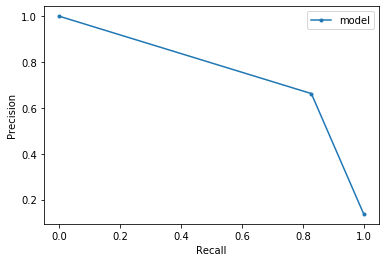

0.7886904761904762

**************

TESTING: 19 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6366287	total: 22ms	remaining: 21.9s
1:	learn: 0.5886848	total: 37.9ms	remaining: 18.9s
2:	learn: 0.5448071	total: 58.8ms	remaining: 19.5s
3:	learn: 0.5036364	total: 73.2ms	remaining: 18.2s
4:	learn: 0.4662816	total: 88.5ms	remaining: 17.6s
5:	learn: 0.4354246	total: 110ms	remaining: 18.2s
6:	learn: 0.4089137	total: 125ms	remaining: 17.7s
7:	learn: 0.3847869	total: 140ms	remaining: 17.3s
8:	learn: 0.3626982	total: 159ms	remaining: 17.5s
9:	le

151:	learn: 0.1326720	total: 2.54s	remaining: 14.2s
152:	learn: 0.1325562	total: 2.57s	remaining: 14.2s
153:	learn: 0.1324704	total: 2.6s	remaining: 14.3s
154:	learn: 0.1323226	total: 2.62s	remaining: 14.3s
155:	learn: 0.1322083	total: 2.64s	remaining: 14.3s
156:	learn: 0.1320757	total: 2.65s	remaining: 14.2s
157:	learn: 0.1320365	total: 2.67s	remaining: 14.2s
158:	learn: 0.1319217	total: 2.68s	remaining: 14.2s
159:	learn: 0.1318266	total: 2.69s	remaining: 14.1s
160:	learn: 0.1317244	total: 2.71s	remaining: 14.1s
161:	learn: 0.1316275	total: 2.72s	remaining: 14.1s
162:	learn: 0.1315704	total: 2.73s	remaining: 14s
163:	learn: 0.1314987	total: 2.75s	remaining: 14s
164:	learn: 0.1313864	total: 2.79s	remaining: 14.1s
165:	learn: 0.1312529	total: 2.81s	remaining: 14.1s
166:	learn: 0.1311516	total: 2.83s	remaining: 14.1s
167:	learn: 0.1311141	total: 2.85s	remaining: 14.1s
168:	learn: 0.1310056	total: 2.86s	remaining: 14.1s
169:	learn: 0.1309449	total: 2.88s	remaining: 14s
170:	learn: 0.13082

314:	learn: 0.1190435	total: 5.24s	remaining: 11.4s
315:	learn: 0.1190183	total: 5.27s	remaining: 11.4s
316:	learn: 0.1189776	total: 5.29s	remaining: 11.4s
317:	learn: 0.1189334	total: 5.31s	remaining: 11.4s
318:	learn: 0.1188845	total: 5.33s	remaining: 11.4s
319:	learn: 0.1188385	total: 5.34s	remaining: 11.4s
320:	learn: 0.1187843	total: 5.36s	remaining: 11.3s
321:	learn: 0.1187027	total: 5.37s	remaining: 11.3s
322:	learn: 0.1186219	total: 5.38s	remaining: 11.3s
323:	learn: 0.1185330	total: 5.4s	remaining: 11.3s
324:	learn: 0.1184198	total: 5.41s	remaining: 11.2s
325:	learn: 0.1183413	total: 5.42s	remaining: 11.2s
326:	learn: 0.1182621	total: 5.43s	remaining: 11.2s
327:	learn: 0.1181661	total: 5.45s	remaining: 11.2s
328:	learn: 0.1180592	total: 5.48s	remaining: 11.2s
329:	learn: 0.1178936	total: 5.5s	remaining: 11.2s
330:	learn: 0.1177495	total: 5.52s	remaining: 11.2s
331:	learn: 0.1175956	total: 5.54s	remaining: 11.1s
332:	learn: 0.1174749	total: 5.55s	remaining: 11.1s
333:	learn: 0.

473:	learn: 0.1078229	total: 7.76s	remaining: 8.61s
474:	learn: 0.1076690	total: 7.79s	remaining: 8.6s
475:	learn: 0.1076176	total: 7.8s	remaining: 8.59s
476:	learn: 0.1075243	total: 7.82s	remaining: 8.58s
477:	learn: 0.1074503	total: 7.84s	remaining: 8.56s
478:	learn: 0.1073281	total: 7.86s	remaining: 8.54s
479:	learn: 0.1072311	total: 7.87s	remaining: 8.52s
480:	learn: 0.1071390	total: 7.88s	remaining: 8.5s
481:	learn: 0.1071199	total: 7.89s	remaining: 8.48s
482:	learn: 0.1070113	total: 7.9s	remaining: 8.46s
483:	learn: 0.1069163	total: 7.92s	remaining: 8.44s
484:	learn: 0.1068902	total: 7.93s	remaining: 8.42s
485:	learn: 0.1068473	total: 7.94s	remaining: 8.4s
486:	learn: 0.1068433	total: 7.95s	remaining: 8.38s
487:	learn: 0.1067677	total: 7.98s	remaining: 8.37s
488:	learn: 0.1067047	total: 8s	remaining: 8.36s
489:	learn: 0.1066446	total: 8.02s	remaining: 8.35s
490:	learn: 0.1066265	total: 8.04s	remaining: 8.34s
491:	learn: 0.1065666	total: 8.06s	remaining: 8.32s
492:	learn: 0.106463

635:	learn: 0.0970985	total: 10.3s	remaining: 5.88s
636:	learn: 0.0970007	total: 10.3s	remaining: 5.87s
637:	learn: 0.0969616	total: 10.3s	remaining: 5.86s
638:	learn: 0.0969208	total: 10.3s	remaining: 5.84s
639:	learn: 0.0968460	total: 10.4s	remaining: 5.83s
640:	learn: 0.0967484	total: 10.4s	remaining: 5.81s
641:	learn: 0.0966698	total: 10.4s	remaining: 5.79s
642:	learn: 0.0965628	total: 10.4s	remaining: 5.77s
643:	learn: 0.0965070	total: 10.4s	remaining: 5.75s
644:	learn: 0.0964439	total: 10.4s	remaining: 5.74s
645:	learn: 0.0963929	total: 10.4s	remaining: 5.72s
646:	learn: 0.0962874	total: 10.4s	remaining: 5.7s
647:	learn: 0.0961830	total: 10.5s	remaining: 5.68s
648:	learn: 0.0961029	total: 10.5s	remaining: 5.67s
649:	learn: 0.0960587	total: 10.5s	remaining: 5.66s
650:	learn: 0.0959888	total: 10.5s	remaining: 5.64s
651:	learn: 0.0959706	total: 10.5s	remaining: 5.63s
652:	learn: 0.0958937	total: 10.6s	remaining: 5.61s
653:	learn: 0.0958172	total: 10.6s	remaining: 5.6s
654:	learn: 0.

795:	learn: 0.0887034	total: 13.3s	remaining: 3.41s
796:	learn: 0.0886695	total: 13.4s	remaining: 3.4s
797:	learn: 0.0886483	total: 13.4s	remaining: 3.39s
798:	learn: 0.0885721	total: 13.4s	remaining: 3.38s
799:	learn: 0.0885324	total: 13.5s	remaining: 3.36s
800:	learn: 0.0885024	total: 13.5s	remaining: 3.35s
801:	learn: 0.0884114	total: 13.5s	remaining: 3.34s
802:	learn: 0.0883449	total: 13.6s	remaining: 3.33s
803:	learn: 0.0882524	total: 13.6s	remaining: 3.32s
804:	learn: 0.0881874	total: 13.7s	remaining: 3.31s
805:	learn: 0.0881477	total: 13.7s	remaining: 3.3s
806:	learn: 0.0881399	total: 13.7s	remaining: 3.29s
807:	learn: 0.0880846	total: 13.8s	remaining: 3.28s
808:	learn: 0.0880836	total: 13.8s	remaining: 3.27s
809:	learn: 0.0880316	total: 13.9s	remaining: 3.25s
810:	learn: 0.0879559	total: 13.9s	remaining: 3.24s
811:	learn: 0.0879049	total: 13.9s	remaining: 3.22s
812:	learn: 0.0878763	total: 14s	remaining: 3.21s
813:	learn: 0.0878396	total: 14s	remaining: 3.2s
814:	learn: 0.08781

958:	learn: 0.0812632	total: 18.6s	remaining: 794ms
959:	learn: 0.0811741	total: 18.6s	remaining: 776ms
960:	learn: 0.0811573	total: 18.7s	remaining: 757ms
961:	learn: 0.0811528	total: 18.7s	remaining: 738ms
962:	learn: 0.0811109	total: 18.7s	remaining: 719ms
963:	learn: 0.0810668	total: 18.7s	remaining: 700ms
964:	learn: 0.0810190	total: 18.8s	remaining: 680ms
965:	learn: 0.0809593	total: 18.8s	remaining: 661ms
966:	learn: 0.0808889	total: 18.8s	remaining: 642ms
967:	learn: 0.0808414	total: 18.9s	remaining: 623ms
968:	learn: 0.0807859	total: 18.9s	remaining: 604ms
969:	learn: 0.0807048	total: 19s	remaining: 588ms
970:	learn: 0.0806434	total: 19.1s	remaining: 570ms
971:	learn: 0.0806316	total: 19.2s	remaining: 554ms
972:	learn: 0.0805802	total: 19.3s	remaining: 535ms
973:	learn: 0.0804951	total: 19.3s	remaining: 516ms
974:	learn: 0.0804638	total: 19.4s	remaining: 497ms
975:	learn: 0.0804292	total: 19.4s	remaining: 478ms
976:	learn: 0.0803977	total: 19.5s	remaining: 458ms
977:	learn: 0.

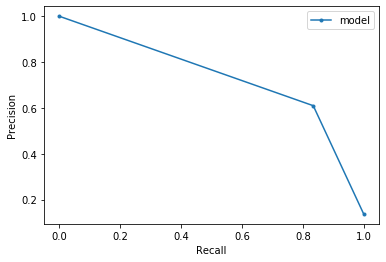

0.7770663562281722

**************

TESTING: 20 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)'] 

Learning rate set to 0.036868
0:	learn: 0.6411930	total: 24.7ms	remaining: 24.6s
1:	learn: 0.5922699	total: 42.4ms	remaining: 21.1s
2:	learn: 0.5442431	total: 62ms	remaining: 20.6s
3:	learn: 0.5071221	total: 77.8ms	remaining: 19.4s
4:	learn: 0.4733421	total: 95.1ms	remaining: 18.9s
5:	learn: 0.4434522	total: 113ms	remaining: 18.6s
6:	learn: 0.4157493	total: 133ms	remaining: 18.8s
7:	learn: 0.3885129	total: 154ms	remaining: 19s
8:	learn: 0.36

153:	learn: 0.1327383	total: 3.45s	remaining: 19s
154:	learn: 0.1326857	total: 3.48s	remaining: 19s
155:	learn: 0.1325145	total: 3.51s	remaining: 19s
156:	learn: 0.1324547	total: 3.54s	remaining: 19s
157:	learn: 0.1323998	total: 3.56s	remaining: 19s
158:	learn: 0.1322076	total: 3.58s	remaining: 18.9s
159:	learn: 0.1321576	total: 3.6s	remaining: 18.9s
160:	learn: 0.1320855	total: 3.62s	remaining: 18.8s
161:	learn: 0.1319658	total: 3.63s	remaining: 18.8s
162:	learn: 0.1318712	total: 3.65s	remaining: 18.8s
163:	learn: 0.1317584	total: 3.68s	remaining: 18.8s
164:	learn: 0.1316360	total: 3.71s	remaining: 18.8s
165:	learn: 0.1315515	total: 3.74s	remaining: 18.8s
166:	learn: 0.1314597	total: 3.77s	remaining: 18.8s
167:	learn: 0.1313588	total: 3.78s	remaining: 18.7s
168:	learn: 0.1312009	total: 3.81s	remaining: 18.7s
169:	learn: 0.1310860	total: 3.84s	remaining: 18.7s
170:	learn: 0.1309634	total: 3.86s	remaining: 18.7s
171:	learn: 0.1308382	total: 3.88s	remaining: 18.7s
172:	learn: 0.1307439	t

314:	learn: 0.1182137	total: 6.65s	remaining: 14.5s
315:	learn: 0.1180989	total: 6.68s	remaining: 14.5s
316:	learn: 0.1180077	total: 6.7s	remaining: 14.4s
317:	learn: 0.1179443	total: 6.72s	remaining: 14.4s
318:	learn: 0.1178490	total: 6.75s	remaining: 14.4s
319:	learn: 0.1177835	total: 6.77s	remaining: 14.4s
320:	learn: 0.1176984	total: 6.78s	remaining: 14.3s
321:	learn: 0.1176095	total: 6.8s	remaining: 14.3s
322:	learn: 0.1175135	total: 6.81s	remaining: 14.3s
323:	learn: 0.1174110	total: 6.84s	remaining: 14.3s
324:	learn: 0.1173423	total: 6.85s	remaining: 14.2s
325:	learn: 0.1172488	total: 6.88s	remaining: 14.2s
326:	learn: 0.1171960	total: 6.91s	remaining: 14.2s
327:	learn: 0.1171622	total: 6.93s	remaining: 14.2s
328:	learn: 0.1171005	total: 6.94s	remaining: 14.2s
329:	learn: 0.1170161	total: 6.96s	remaining: 14.1s
330:	learn: 0.1168873	total: 6.97s	remaining: 14.1s
331:	learn: 0.1167971	total: 6.98s	remaining: 14s
332:	learn: 0.1167067	total: 6.99s	remaining: 14s
333:	learn: 0.1165

484:	learn: 0.1060816	total: 9.59s	remaining: 10.2s
485:	learn: 0.1060811	total: 9.62s	remaining: 10.2s
486:	learn: 0.1060790	total: 9.64s	remaining: 10.2s
487:	learn: 0.1060049	total: 9.66s	remaining: 10.1s
488:	learn: 0.1059471	total: 9.69s	remaining: 10.1s
489:	learn: 0.1059181	total: 9.7s	remaining: 10.1s
490:	learn: 0.1058083	total: 9.71s	remaining: 10.1s
491:	learn: 0.1057147	total: 9.72s	remaining: 10s
492:	learn: 0.1056541	total: 9.73s	remaining: 10s
493:	learn: 0.1056535	total: 9.75s	remaining: 9.98s
494:	learn: 0.1056060	total: 9.76s	remaining: 9.96s
495:	learn: 0.1055653	total: 9.77s	remaining: 9.93s
496:	learn: 0.1054579	total: 9.78s	remaining: 9.9s
497:	learn: 0.1054298	total: 9.8s	remaining: 9.88s
498:	learn: 0.1053407	total: 9.83s	remaining: 9.87s
499:	learn: 0.1052381	total: 9.86s	remaining: 9.86s
500:	learn: 0.1051360	total: 9.88s	remaining: 9.84s
501:	learn: 0.1050102	total: 9.89s	remaining: 9.81s
502:	learn: 0.1049428	total: 9.91s	remaining: 9.79s
503:	learn: 0.10488

648:	learn: 0.0957262	total: 12.3s	remaining: 6.67s
649:	learn: 0.0956806	total: 12.4s	remaining: 6.65s
650:	learn: 0.0956259	total: 12.4s	remaining: 6.64s
651:	learn: 0.0955843	total: 12.4s	remaining: 6.62s
652:	learn: 0.0955310	total: 12.4s	remaining: 6.6s
653:	learn: 0.0954799	total: 12.4s	remaining: 6.58s
654:	learn: 0.0954263	total: 12.4s	remaining: 6.56s
655:	learn: 0.0953810	total: 12.5s	remaining: 6.54s
656:	learn: 0.0952622	total: 12.5s	remaining: 6.51s
657:	learn: 0.0952196	total: 12.5s	remaining: 6.49s
658:	learn: 0.0951373	total: 12.5s	remaining: 6.47s
659:	learn: 0.0950796	total: 12.5s	remaining: 6.45s
660:	learn: 0.0949798	total: 12.5s	remaining: 6.43s
661:	learn: 0.0949235	total: 12.6s	remaining: 6.42s
662:	learn: 0.0948495	total: 12.6s	remaining: 6.4s
663:	learn: 0.0947867	total: 12.6s	remaining: 6.39s
664:	learn: 0.0947126	total: 12.6s	remaining: 6.37s
665:	learn: 0.0946643	total: 12.7s	remaining: 6.34s
666:	learn: 0.0946341	total: 12.7s	remaining: 6.32s
667:	learn: 0.

811:	learn: 0.0869108	total: 15.1s	remaining: 3.5s
812:	learn: 0.0868858	total: 15.2s	remaining: 3.49s
813:	learn: 0.0868321	total: 15.2s	remaining: 3.48s
814:	learn: 0.0868048	total: 15.2s	remaining: 3.46s
815:	learn: 0.0867377	total: 15.3s	remaining: 3.44s
816:	learn: 0.0866254	total: 15.3s	remaining: 3.42s
817:	learn: 0.0866200	total: 15.3s	remaining: 3.4s
818:	learn: 0.0865397	total: 15.3s	remaining: 3.38s
819:	learn: 0.0865000	total: 15.3s	remaining: 3.36s
820:	learn: 0.0864375	total: 15.3s	remaining: 3.34s
821:	learn: 0.0863731	total: 15.3s	remaining: 3.32s
822:	learn: 0.0863331	total: 15.4s	remaining: 3.3s
823:	learn: 0.0862611	total: 15.4s	remaining: 3.29s
824:	learn: 0.0861997	total: 15.4s	remaining: 3.27s
825:	learn: 0.0861387	total: 15.4s	remaining: 3.25s
826:	learn: 0.0861088	total: 15.4s	remaining: 3.23s
827:	learn: 0.0860381	total: 15.5s	remaining: 3.21s
828:	learn: 0.0859963	total: 15.5s	remaining: 3.19s
829:	learn: 0.0859399	total: 15.5s	remaining: 3.17s
830:	learn: 0.0

978:	learn: 0.0785368	total: 17.9s	remaining: 384ms
979:	learn: 0.0784655	total: 17.9s	remaining: 365ms
980:	learn: 0.0783732	total: 17.9s	remaining: 347ms
981:	learn: 0.0783325	total: 18s	remaining: 329ms
982:	learn: 0.0782504	total: 18s	remaining: 311ms
983:	learn: 0.0782064	total: 18s	remaining: 292ms
984:	learn: 0.0781481	total: 18s	remaining: 274ms
985:	learn: 0.0781304	total: 18s	remaining: 256ms
986:	learn: 0.0781024	total: 18s	remaining: 238ms
987:	learn: 0.0780698	total: 18s	remaining: 219ms
988:	learn: 0.0780227	total: 18.1s	remaining: 201ms
989:	learn: 0.0779904	total: 18.1s	remaining: 183ms
990:	learn: 0.0779625	total: 18.1s	remaining: 164ms
991:	learn: 0.0779130	total: 18.1s	remaining: 146ms
992:	learn: 0.0779121	total: 18.1s	remaining: 128ms
993:	learn: 0.0778506	total: 18.2s	remaining: 110ms
994:	learn: 0.0778029	total: 18.2s	remaining: 91.3ms
995:	learn: 0.0777484	total: 18.2s	remaining: 73.1ms
996:	learn: 0.0777047	total: 18.2s	remaining: 54.8ms
997:	learn: 0.0776447	t

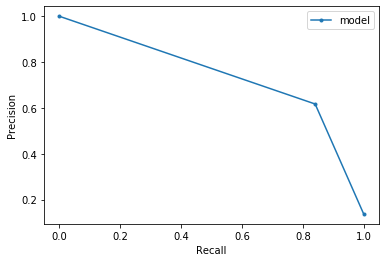

0.7837995337995337

**************

TESTING: 21 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR'] 

Learning rate set to 0.036868
0:	learn: 0.6359562	total: 17.2ms	remaining: 17.2s
1:	learn: 0.5901451	total: 30.1ms	remaining: 15s
2:	learn: 0.5468167	total: 43.9ms	remaining: 14.6s
3:	learn: 0.5105194	total: 55.9ms	remaining: 13.9s
4:	learn: 0.4753109	total: 70.9ms	remaining: 14.1s
5:	learn: 0.4429034	total: 82.4ms	remaining: 13.6s
6:	learn: 0.4136551	total: 95.4ms	remaining: 13.5s
7:	learn: 0.3890597	total: 107ms	remaining: 13.3s
8:

155:	learn: 0.1326568	total: 2.57s	remaining: 13.9s
156:	learn: 0.1325169	total: 2.6s	remaining: 13.9s
157:	learn: 0.1324597	total: 2.62s	remaining: 14s
158:	learn: 0.1323780	total: 2.64s	remaining: 14s
159:	learn: 0.1323054	total: 2.66s	remaining: 14s
160:	learn: 0.1322039	total: 2.68s	remaining: 14s
161:	learn: 0.1321062	total: 2.69s	remaining: 13.9s
162:	learn: 0.1320333	total: 2.71s	remaining: 13.9s
163:	learn: 0.1319342	total: 2.72s	remaining: 13.9s
164:	learn: 0.1317586	total: 2.73s	remaining: 13.8s
165:	learn: 0.1315971	total: 2.74s	remaining: 13.8s
166:	learn: 0.1314717	total: 2.75s	remaining: 13.7s
167:	learn: 0.1314180	total: 2.77s	remaining: 13.7s
168:	learn: 0.1312725	total: 2.79s	remaining: 13.7s
169:	learn: 0.1311507	total: 2.82s	remaining: 13.8s
170:	learn: 0.1310699	total: 2.84s	remaining: 13.8s
171:	learn: 0.1309740	total: 2.86s	remaining: 13.8s
172:	learn: 0.1308891	total: 2.88s	remaining: 13.8s
173:	learn: 0.1307350	total: 2.89s	remaining: 13.7s
174:	learn: 0.1306371

324:	learn: 0.1175794	total: 5.29s	remaining: 11s
325:	learn: 0.1174951	total: 5.32s	remaining: 11s
326:	learn: 0.1174285	total: 5.34s	remaining: 11s
327:	learn: 0.1173893	total: 5.36s	remaining: 11s
328:	learn: 0.1172743	total: 5.38s	remaining: 11s
329:	learn: 0.1171964	total: 5.39s	remaining: 10.9s
330:	learn: 0.1171352	total: 5.41s	remaining: 10.9s
331:	learn: 0.1171124	total: 5.42s	remaining: 10.9s
332:	learn: 0.1170292	total: 5.43s	remaining: 10.9s
333:	learn: 0.1168432	total: 5.44s	remaining: 10.9s
334:	learn: 0.1167812	total: 5.45s	remaining: 10.8s
335:	learn: 0.1166591	total: 5.47s	remaining: 10.8s
336:	learn: 0.1166393	total: 5.48s	remaining: 10.8s
337:	learn: 0.1164363	total: 5.49s	remaining: 10.8s
338:	learn: 0.1163787	total: 5.52s	remaining: 10.8s
339:	learn: 0.1163055	total: 5.55s	remaining: 10.8s
340:	learn: 0.1162384	total: 5.57s	remaining: 10.8s
341:	learn: 0.1161189	total: 5.59s	remaining: 10.8s
342:	learn: 0.1160576	total: 5.61s	remaining: 10.7s
343:	learn: 0.1159761	

488:	learn: 0.1053866	total: 7.97s	remaining: 8.33s
489:	learn: 0.1053267	total: 8s	remaining: 8.33s
490:	learn: 0.1052552	total: 8.03s	remaining: 8.32s
491:	learn: 0.1051696	total: 8.04s	remaining: 8.3s
492:	learn: 0.1050915	total: 8.06s	remaining: 8.29s
493:	learn: 0.1050626	total: 8.08s	remaining: 8.27s
494:	learn: 0.1050227	total: 8.09s	remaining: 8.25s
495:	learn: 0.1049331	total: 8.1s	remaining: 8.23s
496:	learn: 0.1048496	total: 8.11s	remaining: 8.21s
497:	learn: 0.1048164	total: 8.12s	remaining: 8.19s
498:	learn: 0.1047908	total: 8.13s	remaining: 8.17s
499:	learn: 0.1047493	total: 8.15s	remaining: 8.15s
500:	learn: 0.1046494	total: 8.16s	remaining: 8.13s
501:	learn: 0.1045472	total: 8.17s	remaining: 8.11s
502:	learn: 0.1045164	total: 8.2s	remaining: 8.1s
503:	learn: 0.1044106	total: 8.22s	remaining: 8.09s
504:	learn: 0.1043398	total: 8.24s	remaining: 8.08s
505:	learn: 0.1042590	total: 8.26s	remaining: 8.06s
506:	learn: 0.1041735	total: 8.28s	remaining: 8.05s
507:	learn: 0.10409

650:	learn: 0.0953023	total: 10.5s	remaining: 5.62s
651:	learn: 0.0953012	total: 10.5s	remaining: 5.6s
652:	learn: 0.0952715	total: 10.5s	remaining: 5.59s
653:	learn: 0.0952546	total: 10.5s	remaining: 5.58s
654:	learn: 0.0951961	total: 10.6s	remaining: 5.56s
655:	learn: 0.0951925	total: 10.6s	remaining: 5.54s
656:	learn: 0.0951689	total: 10.6s	remaining: 5.53s
657:	learn: 0.0950926	total: 10.6s	remaining: 5.51s
658:	learn: 0.0950749	total: 10.6s	remaining: 5.49s
659:	learn: 0.0950523	total: 10.6s	remaining: 5.47s
660:	learn: 0.0949756	total: 10.6s	remaining: 5.45s
661:	learn: 0.0949693	total: 10.7s	remaining: 5.44s
662:	learn: 0.0949055	total: 10.7s	remaining: 5.42s
663:	learn: 0.0948698	total: 10.7s	remaining: 5.4s
664:	learn: 0.0948139	total: 10.7s	remaining: 5.39s
665:	learn: 0.0948125	total: 10.7s	remaining: 5.38s
666:	learn: 0.0948002	total: 10.7s	remaining: 5.37s
667:	learn: 0.0947589	total: 10.8s	remaining: 5.35s
668:	learn: 0.0947147	total: 10.8s	remaining: 5.33s
669:	learn: 0.

815:	learn: 0.0867310	total: 13s	remaining: 2.93s
816:	learn: 0.0867300	total: 13s	remaining: 2.91s
817:	learn: 0.0866710	total: 13s	remaining: 2.9s
818:	learn: 0.0866199	total: 13s	remaining: 2.88s
819:	learn: 0.0865649	total: 13.1s	remaining: 2.87s
820:	learn: 0.0864760	total: 13.1s	remaining: 2.85s
821:	learn: 0.0864334	total: 13.1s	remaining: 2.83s
822:	learn: 0.0863775	total: 13.1s	remaining: 2.82s
823:	learn: 0.0863313	total: 13.1s	remaining: 2.8s
824:	learn: 0.0862886	total: 13.1s	remaining: 2.78s
825:	learn: 0.0862388	total: 13.1s	remaining: 2.77s
826:	learn: 0.0862286	total: 13.2s	remaining: 2.75s
827:	learn: 0.0861544	total: 13.2s	remaining: 2.73s
828:	learn: 0.0861079	total: 13.2s	remaining: 2.72s
829:	learn: 0.0861068	total: 13.2s	remaining: 2.7s
830:	learn: 0.0860479	total: 13.2s	remaining: 2.69s
831:	learn: 0.0860165	total: 13.2s	remaining: 2.67s
832:	learn: 0.0859888	total: 13.3s	remaining: 2.66s
833:	learn: 0.0859414	total: 13.3s	remaining: 2.64s
834:	learn: 0.0858465	t

986:	learn: 0.0788192	total: 15.7s	remaining: 206ms
987:	learn: 0.0787824	total: 15.7s	remaining: 191ms
988:	learn: 0.0787629	total: 15.7s	remaining: 175ms
989:	learn: 0.0787056	total: 15.7s	remaining: 159ms
990:	learn: 0.0786532	total: 15.8s	remaining: 143ms
991:	learn: 0.0786193	total: 15.8s	remaining: 127ms
992:	learn: 0.0785556	total: 15.8s	remaining: 111ms
993:	learn: 0.0785256	total: 15.8s	remaining: 95.3ms
994:	learn: 0.0784348	total: 15.8s	remaining: 79.4ms
995:	learn: 0.0784106	total: 15.8s	remaining: 63.5ms
996:	learn: 0.0783272	total: 15.8s	remaining: 47.6ms
997:	learn: 0.0782645	total: 15.8s	remaining: 31.8ms
998:	learn: 0.0782032	total: 15.9s	remaining: 15.9ms
999:	learn: 0.0781495	total: 15.9s	remaining: 0us
Best F2 score: 0.7968369829683698 at a threshold of 0.14

##### Evaluating Model #####
ROC AUC SCORE: 0.96

 [[1819  192]
 [  45  275]]

True Positives: 275
True Negatives: 1819
False Positives: 192
False Negatives: 45


Recall: 0.859375
Precision: 0.588865096359743
S

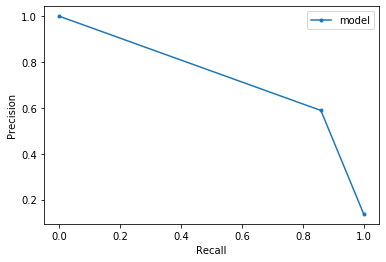

0.7870635374928449

**************

TESTING: 22 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR', 'Albumin, refrigerated serum (g/dL)'] 

Learning rate set to 0.036868
0:	learn: 0.6432239	total: 29.1ms	remaining: 29.1s
1:	learn: 0.5929129	total: 55.6ms	remaining: 27.7s
2:	learn: 0.5496370	total: 76ms	remaining: 25.3s
3:	learn: 0.5119923	total: 95.4ms	remaining: 23.8s
4:	learn: 0.4787354	total: 108ms	remaining: 21.5s
5:	learn: 0.4451396	total: 121ms	remaining: 20.1s
6:	learn: 0.4137487	total: 134ms	remaining: 19.1s
7:	learn: 0.38903

158:	learn: 0.1313935	total: 2.51s	remaining: 13.3s
159:	learn: 0.1312802	total: 2.53s	remaining: 13.3s
160:	learn: 0.1311278	total: 2.56s	remaining: 13.3s
161:	learn: 0.1310166	total: 2.58s	remaining: 13.4s
162:	learn: 0.1309448	total: 2.6s	remaining: 13.3s
163:	learn: 0.1308669	total: 2.61s	remaining: 13.3s
164:	learn: 0.1307670	total: 2.63s	remaining: 13.3s
165:	learn: 0.1306738	total: 2.64s	remaining: 13.3s
166:	learn: 0.1305086	total: 2.65s	remaining: 13.2s
167:	learn: 0.1303640	total: 2.66s	remaining: 13.2s
168:	learn: 0.1302949	total: 2.67s	remaining: 13.2s
169:	learn: 0.1301779	total: 2.69s	remaining: 13.1s
170:	learn: 0.1301041	total: 2.7s	remaining: 13.1s
171:	learn: 0.1300212	total: 2.71s	remaining: 13.1s
172:	learn: 0.1298859	total: 2.74s	remaining: 13.1s
173:	learn: 0.1297775	total: 2.76s	remaining: 13.1s
174:	learn: 0.1296528	total: 2.78s	remaining: 13.1s
175:	learn: 0.1295494	total: 2.8s	remaining: 13.1s
176:	learn: 0.1294436	total: 2.82s	remaining: 13.1s
177:	learn: 0.1

317:	learn: 0.1179396	total: 4.98s	remaining: 10.7s
318:	learn: 0.1178783	total: 5s	remaining: 10.7s
319:	learn: 0.1177881	total: 5.03s	remaining: 10.7s
320:	learn: 0.1176887	total: 5.04s	remaining: 10.7s
321:	learn: 0.1175585	total: 5.07s	remaining: 10.7s
322:	learn: 0.1175171	total: 5.08s	remaining: 10.6s
323:	learn: 0.1174542	total: 5.09s	remaining: 10.6s
324:	learn: 0.1173648	total: 5.1s	remaining: 10.6s
325:	learn: 0.1172578	total: 5.12s	remaining: 10.6s
326:	learn: 0.1171749	total: 5.13s	remaining: 10.6s
327:	learn: 0.1170612	total: 5.14s	remaining: 10.5s
328:	learn: 0.1169654	total: 5.15s	remaining: 10.5s
329:	learn: 0.1168725	total: 5.16s	remaining: 10.5s
330:	learn: 0.1167814	total: 5.17s	remaining: 10.5s
331:	learn: 0.1166366	total: 5.2s	remaining: 10.5s
332:	learn: 0.1165510	total: 5.23s	remaining: 10.5s
333:	learn: 0.1164466	total: 5.25s	remaining: 10.5s
334:	learn: 0.1163645	total: 5.27s	remaining: 10.5s
335:	learn: 0.1162863	total: 5.28s	remaining: 10.4s
336:	learn: 0.116

480:	learn: 0.1051523	total: 7.49s	remaining: 8.08s
481:	learn: 0.1051220	total: 7.52s	remaining: 8.08s
482:	learn: 0.1050153	total: 7.54s	remaining: 8.07s
483:	learn: 0.1049807	total: 7.56s	remaining: 8.06s
484:	learn: 0.1048685	total: 7.58s	remaining: 8.04s
485:	learn: 0.1047959	total: 7.59s	remaining: 8.03s
486:	learn: 0.1047936	total: 7.61s	remaining: 8.01s
487:	learn: 0.1047721	total: 7.62s	remaining: 8s
488:	learn: 0.1046747	total: 7.64s	remaining: 7.99s
489:	learn: 0.1046057	total: 7.66s	remaining: 7.97s
490:	learn: 0.1045885	total: 7.67s	remaining: 7.95s
491:	learn: 0.1045507	total: 7.69s	remaining: 7.94s
492:	learn: 0.1044046	total: 7.71s	remaining: 7.93s
493:	learn: 0.1043336	total: 7.74s	remaining: 7.93s
494:	learn: 0.1043156	total: 7.76s	remaining: 7.92s
495:	learn: 0.1042302	total: 7.78s	remaining: 7.91s
496:	learn: 0.1042022	total: 7.8s	remaining: 7.89s
497:	learn: 0.1041275	total: 7.81s	remaining: 7.88s
498:	learn: 0.1040207	total: 7.83s	remaining: 7.86s
499:	learn: 0.10

647:	learn: 0.0954652	total: 10.2s	remaining: 5.56s
648:	learn: 0.0954362	total: 10.3s	remaining: 5.54s
649:	learn: 0.0953720	total: 10.3s	remaining: 5.54s
650:	learn: 0.0952944	total: 10.3s	remaining: 5.52s
651:	learn: 0.0952423	total: 10.3s	remaining: 5.51s
652:	learn: 0.0952192	total: 10.3s	remaining: 5.49s
653:	learn: 0.0950918	total: 10.3s	remaining: 5.47s
654:	learn: 0.0950692	total: 10.4s	remaining: 5.45s
655:	learn: 0.0949958	total: 10.4s	remaining: 5.44s
656:	learn: 0.0949184	total: 10.4s	remaining: 5.42s
657:	learn: 0.0948087	total: 10.4s	remaining: 5.4s
658:	learn: 0.0947643	total: 10.4s	remaining: 5.38s
659:	learn: 0.0947035	total: 10.4s	remaining: 5.37s
660:	learn: 0.0946282	total: 10.4s	remaining: 5.35s
661:	learn: 0.0945826	total: 10.5s	remaining: 5.34s
662:	learn: 0.0945389	total: 10.5s	remaining: 5.33s
663:	learn: 0.0944726	total: 10.5s	remaining: 5.31s
664:	learn: 0.0943807	total: 10.5s	remaining: 5.3s
665:	learn: 0.0943387	total: 10.5s	remaining: 5.28s
666:	learn: 0.

808:	learn: 0.0861621	total: 12.8s	remaining: 3.02s
809:	learn: 0.0861315	total: 12.8s	remaining: 3s
810:	learn: 0.0860572	total: 12.8s	remaining: 2.99s
811:	learn: 0.0859799	total: 12.8s	remaining: 2.97s
812:	learn: 0.0859218	total: 12.9s	remaining: 2.96s
813:	learn: 0.0858756	total: 12.9s	remaining: 2.94s
814:	learn: 0.0858351	total: 12.9s	remaining: 2.93s
815:	learn: 0.0858312	total: 12.9s	remaining: 2.91s
816:	learn: 0.0857627	total: 12.9s	remaining: 2.89s
817:	learn: 0.0857614	total: 12.9s	remaining: 2.88s
818:	learn: 0.0857163	total: 12.9s	remaining: 2.86s
819:	learn: 0.0856889	total: 13s	remaining: 2.84s
820:	learn: 0.0856403	total: 13s	remaining: 2.83s
821:	learn: 0.0856306	total: 13s	remaining: 2.82s
822:	learn: 0.0856279	total: 13s	remaining: 2.8s
823:	learn: 0.0855887	total: 13.1s	remaining: 2.79s
824:	learn: 0.0855772	total: 13.1s	remaining: 2.77s
825:	learn: 0.0855340	total: 13.1s	remaining: 2.76s
826:	learn: 0.0855130	total: 13.1s	remaining: 2.74s
827:	learn: 0.0855078	to

977:	learn: 0.0785563	total: 15.5s	remaining: 349ms
978:	learn: 0.0784968	total: 15.5s	remaining: 333ms
979:	learn: 0.0784595	total: 15.6s	remaining: 318ms
980:	learn: 0.0784204	total: 15.6s	remaining: 302ms
981:	learn: 0.0783882	total: 15.6s	remaining: 286ms
982:	learn: 0.0783206	total: 15.6s	remaining: 270ms
983:	learn: 0.0783051	total: 15.6s	remaining: 254ms
984:	learn: 0.0782168	total: 15.6s	remaining: 238ms
985:	learn: 0.0781930	total: 15.7s	remaining: 222ms
986:	learn: 0.0781407	total: 15.7s	remaining: 206ms
987:	learn: 0.0780918	total: 15.7s	remaining: 190ms
988:	learn: 0.0780710	total: 15.7s	remaining: 174ms
989:	learn: 0.0779966	total: 15.7s	remaining: 159ms
990:	learn: 0.0779381	total: 15.7s	remaining: 143ms
991:	learn: 0.0778713	total: 15.7s	remaining: 127ms
992:	learn: 0.0778537	total: 15.8s	remaining: 111ms
993:	learn: 0.0778098	total: 15.8s	remaining: 95.3ms
994:	learn: 0.0777748	total: 15.8s	remaining: 79.5ms
995:	learn: 0.0777403	total: 15.8s	remaining: 63.6ms
996:	lear

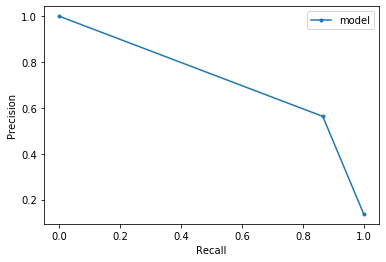

0.7816027088036117

**************

TESTING: 23 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR', 'Albumin, refrigerated serum (g/dL)', 'Total Bilirubin (umol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6392348	total: 17.6ms	remaining: 17.6s
1:	learn: 0.5910856	total: 31.6ms	remaining: 15.8s
2:	learn: 0.5520886	total: 44.5ms	remaining: 14.8s
3:	learn: 0.5140241	total: 56.8ms	remaining: 14.1s
4:	learn: 0.4771462	total: 70.4ms	remaining: 14s
5:	learn: 0.4475562	total: 83.1ms	remaining: 13.8s
6:	learn: 0.4177714	total: 96ms	remai

155:	learn: 0.1323405	total: 2.5s	remaining: 13.6s
156:	learn: 0.1321857	total: 2.53s	remaining: 13.6s
157:	learn: 0.1321132	total: 2.56s	remaining: 13.6s
158:	learn: 0.1320289	total: 2.58s	remaining: 13.6s
159:	learn: 0.1319236	total: 2.6s	remaining: 13.6s
160:	learn: 0.1318405	total: 2.61s	remaining: 13.6s
161:	learn: 0.1317448	total: 2.62s	remaining: 13.6s
162:	learn: 0.1316877	total: 2.63s	remaining: 13.5s
163:	learn: 0.1316159	total: 2.65s	remaining: 13.5s
164:	learn: 0.1315603	total: 2.66s	remaining: 13.5s
165:	learn: 0.1314960	total: 2.67s	remaining: 13.4s
166:	learn: 0.1314435	total: 2.69s	remaining: 13.4s
167:	learn: 0.1313723	total: 2.7s	remaining: 13.4s
168:	learn: 0.1312784	total: 2.72s	remaining: 13.4s
169:	learn: 0.1311403	total: 2.75s	remaining: 13.4s
170:	learn: 0.1310498	total: 2.77s	remaining: 13.4s
171:	learn: 0.1310017	total: 2.79s	remaining: 13.4s
172:	learn: 0.1308810	total: 2.81s	remaining: 13.4s
173:	learn: 0.1307697	total: 2.82s	remaining: 13.4s
174:	learn: 0.1

325:	learn: 0.1184601	total: 5.24s	remaining: 10.8s
326:	learn: 0.1183930	total: 5.27s	remaining: 10.8s
327:	learn: 0.1183672	total: 5.29s	remaining: 10.8s
328:	learn: 0.1182764	total: 5.31s	remaining: 10.8s
329:	learn: 0.1181809	total: 5.32s	remaining: 10.8s
330:	learn: 0.1180828	total: 5.34s	remaining: 10.8s
331:	learn: 0.1180105	total: 5.35s	remaining: 10.8s
332:	learn: 0.1179785	total: 5.36s	remaining: 10.7s
333:	learn: 0.1179466	total: 5.37s	remaining: 10.7s
334:	learn: 0.1178253	total: 5.39s	remaining: 10.7s
335:	learn: 0.1177720	total: 5.4s	remaining: 10.7s
336:	learn: 0.1177444	total: 5.41s	remaining: 10.6s
337:	learn: 0.1177341	total: 5.42s	remaining: 10.6s
338:	learn: 0.1176457	total: 5.43s	remaining: 10.6s
339:	learn: 0.1175532	total: 5.46s	remaining: 10.6s
340:	learn: 0.1175049	total: 5.49s	remaining: 10.6s
341:	learn: 0.1174718	total: 5.51s	remaining: 10.6s
342:	learn: 0.1174134	total: 5.53s	remaining: 10.6s
343:	learn: 0.1172267	total: 5.54s	remaining: 10.6s
344:	learn: 0

491:	learn: 0.1070651	total: 7.93s	remaining: 8.19s
492:	learn: 0.1070149	total: 7.96s	remaining: 8.19s
493:	learn: 0.1070038	total: 7.99s	remaining: 8.18s
494:	learn: 0.1069762	total: 8.01s	remaining: 8.17s
495:	learn: 0.1069186	total: 8.03s	remaining: 8.16s
496:	learn: 0.1068556	total: 8.04s	remaining: 8.14s
497:	learn: 0.1068218	total: 8.05s	remaining: 8.12s
498:	learn: 0.1067671	total: 8.07s	remaining: 8.1s
499:	learn: 0.1067229	total: 8.08s	remaining: 8.08s
500:	learn: 0.1066442	total: 8.09s	remaining: 8.06s
501:	learn: 0.1065631	total: 8.11s	remaining: 8.04s
502:	learn: 0.1064956	total: 8.12s	remaining: 8.03s
503:	learn: 0.1063664	total: 8.13s	remaining: 8.01s
504:	learn: 0.1062412	total: 8.16s	remaining: 8s
505:	learn: 0.1061192	total: 8.19s	remaining: 7.99s
506:	learn: 0.1060381	total: 8.21s	remaining: 7.98s
507:	learn: 0.1058871	total: 8.23s	remaining: 7.97s
508:	learn: 0.1058389	total: 8.24s	remaining: 7.95s
509:	learn: 0.1058173	total: 8.26s	remaining: 7.93s
510:	learn: 0.10

659:	learn: 0.0960455	total: 10.7s	remaining: 5.49s
660:	learn: 0.0959959	total: 10.7s	remaining: 5.48s
661:	learn: 0.0958776	total: 10.7s	remaining: 5.47s
662:	learn: 0.0958682	total: 10.7s	remaining: 5.46s
663:	learn: 0.0957731	total: 10.8s	remaining: 5.44s
664:	learn: 0.0957564	total: 10.8s	remaining: 5.42s
665:	learn: 0.0957542	total: 10.8s	remaining: 5.41s
666:	learn: 0.0956480	total: 10.8s	remaining: 5.39s
667:	learn: 0.0955871	total: 10.8s	remaining: 5.38s
668:	learn: 0.0955293	total: 10.8s	remaining: 5.36s
669:	learn: 0.0954503	total: 10.9s	remaining: 5.34s
670:	learn: 0.0954234	total: 10.9s	remaining: 5.33s
671:	learn: 0.0953539	total: 10.9s	remaining: 5.32s
672:	learn: 0.0952696	total: 10.9s	remaining: 5.31s
673:	learn: 0.0951941	total: 11s	remaining: 5.3s
674:	learn: 0.0951344	total: 11s	remaining: 5.28s
675:	learn: 0.0950554	total: 11s	remaining: 5.26s
676:	learn: 0.0949771	total: 11s	remaining: 5.25s
677:	learn: 0.0949243	total: 11s	remaining: 5.23s
678:	learn: 0.0948350	t

823:	learn: 0.0864719	total: 13.4s	remaining: 2.85s
824:	learn: 0.0864333	total: 13.4s	remaining: 2.84s
825:	learn: 0.0863815	total: 13.4s	remaining: 2.83s
826:	learn: 0.0863763	total: 13.4s	remaining: 2.81s
827:	learn: 0.0863364	total: 13.5s	remaining: 2.8s
828:	learn: 0.0862974	total: 13.5s	remaining: 2.78s
829:	learn: 0.0862246	total: 13.5s	remaining: 2.76s
830:	learn: 0.0861266	total: 13.5s	remaining: 2.75s
831:	learn: 0.0860308	total: 13.5s	remaining: 2.73s
832:	learn: 0.0859718	total: 13.5s	remaining: 2.71s
833:	learn: 0.0859221	total: 13.5s	remaining: 2.69s
834:	learn: 0.0858243	total: 13.5s	remaining: 2.68s
835:	learn: 0.0858030	total: 13.6s	remaining: 2.66s
836:	learn: 0.0857406	total: 13.6s	remaining: 2.64s
837:	learn: 0.0857073	total: 13.6s	remaining: 2.63s
838:	learn: 0.0856447	total: 13.6s	remaining: 2.62s
839:	learn: 0.0856023	total: 13.6s	remaining: 2.6s
840:	learn: 0.0855175	total: 13.7s	remaining: 2.58s
841:	learn: 0.0854475	total: 13.7s	remaining: 2.57s
842:	learn: 0.

983:	learn: 0.0782338	total: 15.8s	remaining: 258ms
984:	learn: 0.0781801	total: 15.9s	remaining: 242ms
985:	learn: 0.0781511	total: 15.9s	remaining: 226ms
986:	learn: 0.0781271	total: 15.9s	remaining: 210ms
987:	learn: 0.0780984	total: 15.9s	remaining: 194ms
988:	learn: 0.0780601	total: 16s	remaining: 177ms
989:	learn: 0.0780303	total: 16s	remaining: 161ms
990:	learn: 0.0779714	total: 16s	remaining: 145ms
991:	learn: 0.0778771	total: 16s	remaining: 129ms
992:	learn: 0.0778413	total: 16s	remaining: 113ms
993:	learn: 0.0777750	total: 16s	remaining: 96.7ms
994:	learn: 0.0777671	total: 16s	remaining: 80.6ms
995:	learn: 0.0777189	total: 16s	remaining: 64.4ms
996:	learn: 0.0776304	total: 16.1s	remaining: 48.3ms
997:	learn: 0.0776239	total: 16.1s	remaining: 32.2ms
998:	learn: 0.0775688	total: 16.1s	remaining: 16.1ms
999:	learn: 0.0775341	total: 16.1s	remaining: 0us
Best F2 score: 0.7904411764705882 at a threshold of 0.17

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1854  157]
 [  51

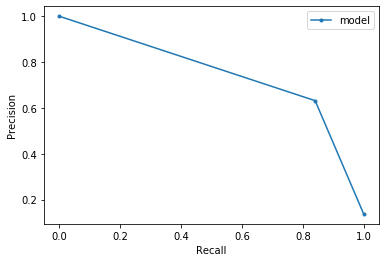

0.7883939038686987

**************

TESTING: 24 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR', 'Albumin, refrigerated serum (g/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6384997	total: 16.9ms	remaining: 16.9s
1:	learn: 0.5897956	total: 30.1ms	remaining: 15s
2:	learn: 0.5498845	total: 42.9ms	remaining: 14.3s
3:	learn: 0.5098281	total: 55.7ms	remaining: 13.9s
4:	learn: 0.4747572	total: 68.3ms	remaining: 13.6s
5:	learn: 0.4478152	total: 79.8ms	remaining: 13.2s
6:	learn: 0

148:	learn: 0.1328942	total: 2.33s	remaining: 13.3s
149:	learn: 0.1327413	total: 2.35s	remaining: 13.3s
150:	learn: 0.1326441	total: 2.38s	remaining: 13.4s
151:	learn: 0.1325091	total: 2.39s	remaining: 13.4s
152:	learn: 0.1323801	total: 2.41s	remaining: 13.3s
153:	learn: 0.1323361	total: 2.42s	remaining: 13.3s
154:	learn: 0.1322184	total: 2.44s	remaining: 13.3s
155:	learn: 0.1320895	total: 2.45s	remaining: 13.2s
156:	learn: 0.1319750	total: 2.46s	remaining: 13.2s
157:	learn: 0.1318731	total: 2.47s	remaining: 13.2s
158:	learn: 0.1317464	total: 2.48s	remaining: 13.1s
159:	learn: 0.1316157	total: 2.5s	remaining: 13.1s
160:	learn: 0.1315114	total: 2.51s	remaining: 13.1s
161:	learn: 0.1314373	total: 2.52s	remaining: 13.1s
162:	learn: 0.1313737	total: 2.55s	remaining: 13.1s
163:	learn: 0.1312839	total: 2.57s	remaining: 13.1s
164:	learn: 0.1311490	total: 2.59s	remaining: 13.1s
165:	learn: 0.1310497	total: 2.61s	remaining: 13.1s
166:	learn: 0.1309292	total: 2.63s	remaining: 13.1s
167:	learn: 0

307:	learn: 0.1195352	total: 4.85s	remaining: 10.9s
308:	learn: 0.1194441	total: 4.87s	remaining: 10.9s
309:	learn: 0.1193657	total: 4.9s	remaining: 10.9s
310:	learn: 0.1192502	total: 4.92s	remaining: 10.9s
311:	learn: 0.1191486	total: 4.94s	remaining: 10.9s
312:	learn: 0.1191322	total: 4.96s	remaining: 10.9s
313:	learn: 0.1190689	total: 4.97s	remaining: 10.8s
314:	learn: 0.1189851	total: 4.98s	remaining: 10.8s
315:	learn: 0.1188929	total: 4.99s	remaining: 10.8s
316:	learn: 0.1188506	total: 5s	remaining: 10.8s
317:	learn: 0.1187145	total: 5.01s	remaining: 10.8s
318:	learn: 0.1185698	total: 5.03s	remaining: 10.7s
319:	learn: 0.1184365	total: 5.04s	remaining: 10.7s
320:	learn: 0.1183793	total: 5.06s	remaining: 10.7s
321:	learn: 0.1182765	total: 5.08s	remaining: 10.7s
322:	learn: 0.1181629	total: 5.11s	remaining: 10.7s
323:	learn: 0.1180561	total: 5.13s	remaining: 10.7s
324:	learn: 0.1180026	total: 5.15s	remaining: 10.7s
325:	learn: 0.1178904	total: 5.16s	remaining: 10.7s
326:	learn: 0.11

477:	learn: 0.1062831	total: 7.58s	remaining: 8.28s
478:	learn: 0.1062183	total: 7.6s	remaining: 8.27s
479:	learn: 0.1061191	total: 7.63s	remaining: 8.27s
480:	learn: 0.1060212	total: 7.65s	remaining: 8.26s
481:	learn: 0.1060001	total: 7.67s	remaining: 8.25s
482:	learn: 0.1059463	total: 7.69s	remaining: 8.23s
483:	learn: 0.1058642	total: 7.7s	remaining: 8.21s
484:	learn: 0.1057670	total: 7.72s	remaining: 8.19s
485:	learn: 0.1057323	total: 7.73s	remaining: 8.18s
486:	learn: 0.1057044	total: 7.74s	remaining: 8.16s
487:	learn: 0.1055905	total: 7.75s	remaining: 8.14s
488:	learn: 0.1054788	total: 7.77s	remaining: 8.12s
489:	learn: 0.1054610	total: 7.8s	remaining: 8.12s
490:	learn: 0.1053933	total: 7.83s	remaining: 8.12s
491:	learn: 0.1053162	total: 7.85s	remaining: 8.11s
492:	learn: 0.1051828	total: 7.87s	remaining: 8.09s
493:	learn: 0.1050662	total: 7.89s	remaining: 8.08s
494:	learn: 0.1049927	total: 7.9s	remaining: 8.06s
495:	learn: 0.1049153	total: 7.91s	remaining: 8.04s
496:	learn: 0.10

641:	learn: 0.0962376	total: 10.3s	remaining: 5.74s
642:	learn: 0.0961508	total: 10.3s	remaining: 5.73s
643:	learn: 0.0960680	total: 10.3s	remaining: 5.72s
644:	learn: 0.0960677	total: 10.4s	remaining: 5.7s
645:	learn: 0.0960139	total: 10.4s	remaining: 5.69s
646:	learn: 0.0959530	total: 10.4s	remaining: 5.67s
647:	learn: 0.0958828	total: 10.4s	remaining: 5.65s
648:	learn: 0.0958432	total: 10.4s	remaining: 5.63s
649:	learn: 0.0958210	total: 10.4s	remaining: 5.62s
650:	learn: 0.0957698	total: 10.4s	remaining: 5.6s
651:	learn: 0.0957472	total: 10.5s	remaining: 5.58s
652:	learn: 0.0956292	total: 10.5s	remaining: 5.56s
653:	learn: 0.0955454	total: 10.5s	remaining: 5.54s
654:	learn: 0.0954426	total: 10.5s	remaining: 5.53s
655:	learn: 0.0953623	total: 10.5s	remaining: 5.52s
656:	learn: 0.0952556	total: 10.6s	remaining: 5.51s
657:	learn: 0.0952286	total: 10.6s	remaining: 5.49s
658:	learn: 0.0951677	total: 10.6s	remaining: 5.48s
659:	learn: 0.0951108	total: 10.6s	remaining: 5.46s
660:	learn: 0.

811:	learn: 0.0868656	total: 13s	remaining: 3.02s
812:	learn: 0.0868203	total: 13.1s	remaining: 3s
813:	learn: 0.0867461	total: 13.1s	remaining: 2.99s
814:	learn: 0.0867458	total: 13.1s	remaining: 2.98s
815:	learn: 0.0866900	total: 13.1s	remaining: 2.96s
816:	learn: 0.0866472	total: 13.1s	remaining: 2.94s
817:	learn: 0.0866166	total: 13.2s	remaining: 2.93s
818:	learn: 0.0865536	total: 13.2s	remaining: 2.91s
819:	learn: 0.0864849	total: 13.2s	remaining: 2.89s
820:	learn: 0.0864237	total: 13.2s	remaining: 2.88s
821:	learn: 0.0863110	total: 13.2s	remaining: 2.86s
822:	learn: 0.0862697	total: 13.2s	remaining: 2.84s
823:	learn: 0.0862071	total: 13.2s	remaining: 2.83s
824:	learn: 0.0861726	total: 13.3s	remaining: 2.81s
825:	learn: 0.0861308	total: 13.3s	remaining: 2.8s
826:	learn: 0.0860903	total: 13.3s	remaining: 2.78s
827:	learn: 0.0860899	total: 13.3s	remaining: 2.77s
828:	learn: 0.0860173	total: 13.3s	remaining: 2.75s
829:	learn: 0.0859643	total: 13.4s	remaining: 2.73s
830:	learn: 0.0859

981:	learn: 0.0783543	total: 15.8s	remaining: 289ms
982:	learn: 0.0782870	total: 15.8s	remaining: 273ms
983:	learn: 0.0782115	total: 15.8s	remaining: 258ms
984:	learn: 0.0781548	total: 15.9s	remaining: 242ms
985:	learn: 0.0781017	total: 15.9s	remaining: 225ms
986:	learn: 0.0780511	total: 15.9s	remaining: 209ms
987:	learn: 0.0780376	total: 15.9s	remaining: 193ms
988:	learn: 0.0779885	total: 15.9s	remaining: 177ms
989:	learn: 0.0779477	total: 15.9s	remaining: 161ms
990:	learn: 0.0778905	total: 15.9s	remaining: 145ms
991:	learn: 0.0778136	total: 16s	remaining: 129ms
992:	learn: 0.0777345	total: 16s	remaining: 113ms
993:	learn: 0.0776649	total: 16s	remaining: 96.5ms
994:	learn: 0.0776559	total: 16s	remaining: 80.5ms
995:	learn: 0.0775913	total: 16s	remaining: 64.4ms
996:	learn: 0.0775445	total: 16.1s	remaining: 48.3ms
997:	learn: 0.0774470	total: 16.1s	remaining: 32.2ms
998:	learn: 0.0773828	total: 16.1s	remaining: 16.1ms
999:	learn: 0.0773008	total: 16.1s	remaining: 0us
Best F2 score: 0.8

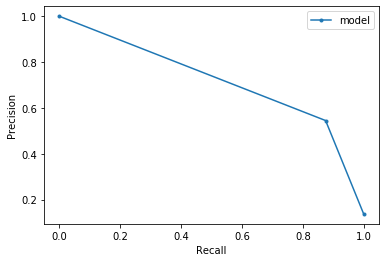

0.7803790412486064

**************

TESTING: 25 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR', 'Albumin, refrigerated serum (g/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'Aspartate Aminotransferase (AST) (U/L)'] 

Learning rate set to 0.036868
0:	learn: 0.6395077	total: 18ms	remaining: 17.9s
1:	learn: 0.5918509	total: 32.1ms	remaining: 16s
2:	learn: 0.5448076	total: 45.1ms	remaining: 15s
3:	learn: 0.5064456	total: 58.7ms	remaining: 14.6s
4:	learn: 0.4720169	total: 72.2ms	remaining: 14.4s
5:	learn: 0.4445351	tota

150:	learn: 0.1330974	total: 2.53s	remaining: 14.2s
151:	learn: 0.1330048	total: 2.56s	remaining: 14.3s
152:	learn: 0.1328803	total: 2.58s	remaining: 14.3s
153:	learn: 0.1327207	total: 2.61s	remaining: 14.3s
154:	learn: 0.1326092	total: 2.62s	remaining: 14.3s
155:	learn: 0.1325952	total: 2.63s	remaining: 14.3s
156:	learn: 0.1324991	total: 2.65s	remaining: 14.2s
157:	learn: 0.1324325	total: 2.66s	remaining: 14.2s
158:	learn: 0.1322388	total: 2.67s	remaining: 14.1s
159:	learn: 0.1321584	total: 2.68s	remaining: 14.1s
160:	learn: 0.1320590	total: 2.7s	remaining: 14.1s
161:	learn: 0.1319886	total: 2.72s	remaining: 14.1s
162:	learn: 0.1318968	total: 2.76s	remaining: 14.2s
163:	learn: 0.1318336	total: 2.78s	remaining: 14.2s
164:	learn: 0.1317356	total: 2.81s	remaining: 14.2s
165:	learn: 0.1316729	total: 2.83s	remaining: 14.2s
166:	learn: 0.1315513	total: 2.84s	remaining: 14.2s
167:	learn: 0.1314585	total: 2.85s	remaining: 14.1s
168:	learn: 0.1313298	total: 2.87s	remaining: 14.1s
169:	learn: 0

316:	learn: 0.1176390	total: 5.3s	remaining: 11.4s
317:	learn: 0.1175385	total: 5.33s	remaining: 11.4s
318:	learn: 0.1174378	total: 5.36s	remaining: 11.4s
319:	learn: 0.1173768	total: 5.38s	remaining: 11.4s
320:	learn: 0.1173548	total: 5.4s	remaining: 11.4s
321:	learn: 0.1172873	total: 5.41s	remaining: 11.4s
322:	learn: 0.1171993	total: 5.42s	remaining: 11.4s
323:	learn: 0.1171122	total: 5.44s	remaining: 11.3s
324:	learn: 0.1170369	total: 5.46s	remaining: 11.3s
325:	learn: 0.1169512	total: 5.49s	remaining: 11.4s
326:	learn: 0.1168485	total: 5.52s	remaining: 11.4s
327:	learn: 0.1168092	total: 5.54s	remaining: 11.4s
328:	learn: 0.1167315	total: 5.57s	remaining: 11.4s
329:	learn: 0.1166599	total: 5.6s	remaining: 11.4s
330:	learn: 0.1165937	total: 5.63s	remaining: 11.4s
331:	learn: 0.1165168	total: 5.72s	remaining: 11.5s
332:	learn: 0.1163987	total: 5.83s	remaining: 11.7s
333:	learn: 0.1162928	total: 5.91s	remaining: 11.8s
334:	learn: 0.1162211	total: 5.94s	remaining: 11.8s
335:	learn: 0.1

484:	learn: 0.1058485	total: 9.01s	remaining: 9.56s
485:	learn: 0.1057285	total: 9.04s	remaining: 9.56s
486:	learn: 0.1056322	total: 9.06s	remaining: 9.54s
487:	learn: 0.1055459	total: 9.08s	remaining: 9.53s
488:	learn: 0.1055139	total: 9.1s	remaining: 9.51s
489:	learn: 0.1054058	total: 9.12s	remaining: 9.49s
490:	learn: 0.1053645	total: 9.13s	remaining: 9.47s
491:	learn: 0.1053620	total: 9.15s	remaining: 9.45s
492:	learn: 0.1052836	total: 9.16s	remaining: 9.43s
493:	learn: 0.1051802	total: 9.18s	remaining: 9.4s
494:	learn: 0.1050668	total: 9.2s	remaining: 9.38s
495:	learn: 0.1050227	total: 9.21s	remaining: 9.36s
496:	learn: 0.1049905	total: 9.24s	remaining: 9.35s
497:	learn: 0.1049544	total: 9.27s	remaining: 9.34s
498:	learn: 0.1048618	total: 9.29s	remaining: 9.33s
499:	learn: 0.1048391	total: 9.32s	remaining: 9.32s
500:	learn: 0.1048139	total: 9.34s	remaining: 9.31s
501:	learn: 0.1047055	total: 9.38s	remaining: 9.3s
502:	learn: 0.1047048	total: 9.4s	remaining: 9.29s
503:	learn: 0.104

650:	learn: 0.0957613	total: 12.4s	remaining: 6.63s
651:	learn: 0.0957125	total: 12.4s	remaining: 6.62s
652:	learn: 0.0956300	total: 12.4s	remaining: 6.6s
653:	learn: 0.0955595	total: 12.5s	remaining: 6.59s
654:	learn: 0.0954500	total: 12.5s	remaining: 6.58s
655:	learn: 0.0953680	total: 12.5s	remaining: 6.56s
656:	learn: 0.0952680	total: 12.5s	remaining: 6.55s
657:	learn: 0.0951788	total: 12.6s	remaining: 6.53s
658:	learn: 0.0951071	total: 12.6s	remaining: 6.52s
659:	learn: 0.0950758	total: 12.6s	remaining: 6.51s
660:	learn: 0.0949329	total: 12.7s	remaining: 6.49s
661:	learn: 0.0948396	total: 12.7s	remaining: 6.48s
662:	learn: 0.0947900	total: 12.7s	remaining: 6.46s
663:	learn: 0.0947205	total: 12.7s	remaining: 6.45s
664:	learn: 0.0946532	total: 12.8s	remaining: 6.43s
665:	learn: 0.0945917	total: 12.8s	remaining: 6.42s
666:	learn: 0.0945795	total: 12.8s	remaining: 6.4s
667:	learn: 0.0945143	total: 12.8s	remaining: 6.39s
668:	learn: 0.0944982	total: 12.9s	remaining: 6.37s
669:	learn: 0.

812:	learn: 0.0865378	total: 16.8s	remaining: 3.85s
813:	learn: 0.0864795	total: 16.8s	remaining: 3.84s
814:	learn: 0.0864643	total: 16.8s	remaining: 3.82s
815:	learn: 0.0864632	total: 16.8s	remaining: 3.8s
816:	learn: 0.0864325	total: 16.9s	remaining: 3.78s
817:	learn: 0.0864083	total: 16.9s	remaining: 3.76s
818:	learn: 0.0863969	total: 16.9s	remaining: 3.74s
819:	learn: 0.0863135	total: 16.9s	remaining: 3.72s
820:	learn: 0.0862912	total: 17s	remaining: 3.7s
821:	learn: 0.0862178	total: 17s	remaining: 3.68s
822:	learn: 0.0862128	total: 17s	remaining: 3.66s
823:	learn: 0.0861547	total: 17.1s	remaining: 3.65s
824:	learn: 0.0861007	total: 17.1s	remaining: 3.63s
825:	learn: 0.0860225	total: 17.1s	remaining: 3.61s
826:	learn: 0.0859606	total: 17.2s	remaining: 3.59s
827:	learn: 0.0859042	total: 17.2s	remaining: 3.57s
828:	learn: 0.0858115	total: 17.2s	remaining: 3.55s
829:	learn: 0.0857659	total: 17.2s	remaining: 3.53s
830:	learn: 0.0857220	total: 17.3s	remaining: 3.52s
831:	learn: 0.085675

974:	learn: 0.0786979	total: 21s	remaining: 539ms
975:	learn: 0.0786259	total: 21.1s	remaining: 518ms
976:	learn: 0.0785968	total: 21.1s	remaining: 496ms
977:	learn: 0.0785291	total: 21.1s	remaining: 474ms
978:	learn: 0.0785112	total: 21.1s	remaining: 453ms
979:	learn: 0.0784848	total: 21.1s	remaining: 431ms
980:	learn: 0.0784249	total: 21.1s	remaining: 409ms
981:	learn: 0.0783660	total: 21.2s	remaining: 388ms
982:	learn: 0.0783239	total: 21.2s	remaining: 366ms
983:	learn: 0.0782442	total: 21.2s	remaining: 344ms
984:	learn: 0.0781830	total: 21.2s	remaining: 323ms
985:	learn: 0.0781362	total: 21.2s	remaining: 301ms
986:	learn: 0.0781288	total: 21.2s	remaining: 280ms
987:	learn: 0.0781112	total: 21.2s	remaining: 258ms
988:	learn: 0.0780345	total: 21.3s	remaining: 236ms
989:	learn: 0.0780150	total: 21.3s	remaining: 215ms
990:	learn: 0.0779261	total: 21.3s	remaining: 193ms
991:	learn: 0.0779252	total: 21.3s	remaining: 172ms
992:	learn: 0.0778848	total: 21.3s	remaining: 150ms
993:	learn: 0.

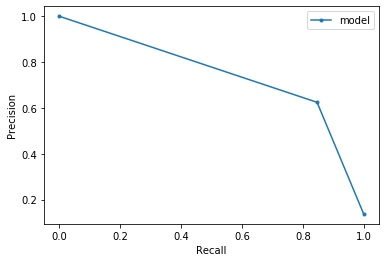

0.7905484247374563

**************

TESTING: 26 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR', 'Albumin, refrigerated serum (g/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Blood Urea Nitrogen (g/dL)'] 

Learning rate set to 0.036868
0:	learn: 0.6410627	total: 20.6ms	remaining: 20.6s
1:	learn: 0.5968256	total: 35.5ms	remaining: 17.7s
2:	learn: 0.5554662	total: 50.4ms	remaining: 16.8s
3:	learn: 0.5158497	total: 64.8ms	remaining: 16.1s
4:	learn: 0.4831204	total: 76.3ms	remai

146:	learn: 0.1335869	total: 3.44s	remaining: 20s
147:	learn: 0.1333713	total: 3.47s	remaining: 20s
148:	learn: 0.1332898	total: 3.5s	remaining: 20s
149:	learn: 0.1331372	total: 3.52s	remaining: 20s
150:	learn: 0.1330887	total: 3.55s	remaining: 20s
151:	learn: 0.1329964	total: 3.58s	remaining: 20s
152:	learn: 0.1329370	total: 3.6s	remaining: 19.9s
153:	learn: 0.1329042	total: 3.62s	remaining: 19.9s
154:	learn: 0.1327608	total: 3.63s	remaining: 19.8s
155:	learn: 0.1326342	total: 3.65s	remaining: 19.8s
156:	learn: 0.1324865	total: 3.68s	remaining: 19.8s
157:	learn: 0.1323955	total: 3.71s	remaining: 19.8s
158:	learn: 0.1322686	total: 3.73s	remaining: 19.7s
159:	learn: 0.1321269	total: 3.75s	remaining: 19.7s
160:	learn: 0.1319133	total: 3.78s	remaining: 19.7s
161:	learn: 0.1318055	total: 3.8s	remaining: 19.7s
162:	learn: 0.1316486	total: 3.84s	remaining: 19.7s
163:	learn: 0.1315603	total: 3.87s	remaining: 19.7s
164:	learn: 0.1314635	total: 3.89s	remaining: 19.7s
165:	learn: 0.1313648	total

309:	learn: 0.1189329	total: 7.21s	remaining: 16s
310:	learn: 0.1188735	total: 7.24s	remaining: 16s
311:	learn: 0.1187597	total: 7.27s	remaining: 16s
312:	learn: 0.1185685	total: 7.3s	remaining: 16s
313:	learn: 0.1185391	total: 7.32s	remaining: 16s
314:	learn: 0.1184159	total: 7.34s	remaining: 16s
315:	learn: 0.1183060	total: 7.37s	remaining: 15.9s
316:	learn: 0.1182018	total: 7.38s	remaining: 15.9s
317:	learn: 0.1181277	total: 7.4s	remaining: 15.9s
318:	learn: 0.1179838	total: 7.43s	remaining: 15.9s
319:	learn: 0.1179034	total: 7.45s	remaining: 15.8s
320:	learn: 0.1178369	total: 7.48s	remaining: 15.8s
321:	learn: 0.1176895	total: 7.5s	remaining: 15.8s
322:	learn: 0.1176491	total: 7.52s	remaining: 15.8s
323:	learn: 0.1175032	total: 7.53s	remaining: 15.7s
324:	learn: 0.1174455	total: 7.55s	remaining: 15.7s
325:	learn: 0.1174138	total: 7.56s	remaining: 15.6s
326:	learn: 0.1172873	total: 7.58s	remaining: 15.6s
327:	learn: 0.1171992	total: 7.59s	remaining: 15.6s
328:	learn: 0.1171182	total

471:	learn: 0.1063434	total: 11.1s	remaining: 12.4s
472:	learn: 0.1063423	total: 11.1s	remaining: 12.4s
473:	learn: 0.1061777	total: 11.1s	remaining: 12.4s
474:	learn: 0.1061213	total: 11.2s	remaining: 12.3s
475:	learn: 0.1060033	total: 11.2s	remaining: 12.3s
476:	learn: 0.1059094	total: 11.2s	remaining: 12.3s
477:	learn: 0.1058345	total: 11.2s	remaining: 12.2s
478:	learn: 0.1057627	total: 11.2s	remaining: 12.2s
479:	learn: 0.1057348	total: 11.2s	remaining: 12.2s
480:	learn: 0.1056682	total: 11.3s	remaining: 12.2s
481:	learn: 0.1056607	total: 11.3s	remaining: 12.1s
482:	learn: 0.1056480	total: 11.3s	remaining: 12.1s
483:	learn: 0.1055653	total: 11.3s	remaining: 12.1s
484:	learn: 0.1054858	total: 11.4s	remaining: 12.1s
485:	learn: 0.1053731	total: 11.4s	remaining: 12s
486:	learn: 0.1052719	total: 11.4s	remaining: 12s
487:	learn: 0.1052318	total: 11.4s	remaining: 12s
488:	learn: 0.1052309	total: 11.4s	remaining: 12s
489:	learn: 0.1051001	total: 11.5s	remaining: 11.9s
490:	learn: 0.105068

631:	learn: 0.0951856	total: 14s	remaining: 8.14s
632:	learn: 0.0951644	total: 14s	remaining: 8.13s
633:	learn: 0.0951136	total: 14s	remaining: 8.11s
634:	learn: 0.0950986	total: 14.1s	remaining: 8.09s
635:	learn: 0.0949753	total: 14.1s	remaining: 8.06s
636:	learn: 0.0949152	total: 14.1s	remaining: 8.04s
637:	learn: 0.0948960	total: 14.1s	remaining: 8.02s
638:	learn: 0.0947923	total: 14.1s	remaining: 7.99s
639:	learn: 0.0947392	total: 14.2s	remaining: 7.96s
640:	learn: 0.0947216	total: 14.2s	remaining: 7.94s
641:	learn: 0.0946669	total: 14.2s	remaining: 7.92s
642:	learn: 0.0946146	total: 14.2s	remaining: 7.9s
643:	learn: 0.0946005	total: 14.3s	remaining: 7.88s
644:	learn: 0.0945523	total: 14.3s	remaining: 7.86s
645:	learn: 0.0944618	total: 14.3s	remaining: 7.83s
646:	learn: 0.0944112	total: 14.3s	remaining: 7.81s
647:	learn: 0.0943283	total: 14.3s	remaining: 7.79s
648:	learn: 0.0942972	total: 14.4s	remaining: 7.76s
649:	learn: 0.0942253	total: 14.4s	remaining: 7.74s
650:	learn: 0.09412

793:	learn: 0.0857810	total: 17.9s	remaining: 4.66s
794:	learn: 0.0856877	total: 18s	remaining: 4.64s
795:	learn: 0.0856498	total: 18s	remaining: 4.62s
796:	learn: 0.0856238	total: 18.1s	remaining: 4.6s
797:	learn: 0.0855533	total: 18.1s	remaining: 4.58s
798:	learn: 0.0855442	total: 18.1s	remaining: 4.56s
799:	learn: 0.0855324	total: 18.2s	remaining: 4.54s
800:	learn: 0.0854820	total: 18.2s	remaining: 4.53s
801:	learn: 0.0854334	total: 18.3s	remaining: 4.51s
802:	learn: 0.0853776	total: 18.3s	remaining: 4.49s
803:	learn: 0.0853763	total: 18.3s	remaining: 4.47s
804:	learn: 0.0853309	total: 18.4s	remaining: 4.45s
805:	learn: 0.0852557	total: 18.4s	remaining: 4.43s
806:	learn: 0.0852173	total: 18.5s	remaining: 4.42s
807:	learn: 0.0851804	total: 18.5s	remaining: 4.39s
808:	learn: 0.0851231	total: 18.5s	remaining: 4.37s
809:	learn: 0.0850392	total: 18.6s	remaining: 4.35s
810:	learn: 0.0849838	total: 18.6s	remaining: 4.33s
811:	learn: 0.0849636	total: 18.6s	remaining: 4.32s
812:	learn: 0.084

954:	learn: 0.0778045	total: 23.8s	remaining: 1.12s
955:	learn: 0.0777470	total: 23.8s	remaining: 1.1s
956:	learn: 0.0776756	total: 23.9s	remaining: 1.07s
957:	learn: 0.0776262	total: 23.9s	remaining: 1.05s
958:	learn: 0.0775455	total: 23.9s	remaining: 1.02s
959:	learn: 0.0774904	total: 23.9s	remaining: 998ms
960:	learn: 0.0774156	total: 24s	remaining: 973ms
961:	learn: 0.0773345	total: 24s	remaining: 948ms
962:	learn: 0.0772967	total: 24s	remaining: 923ms
963:	learn: 0.0772319	total: 24.1s	remaining: 899ms
964:	learn: 0.0772182	total: 24.1s	remaining: 874ms
965:	learn: 0.0771344	total: 24.1s	remaining: 849ms
966:	learn: 0.0771209	total: 24.1s	remaining: 824ms
967:	learn: 0.0770602	total: 24.2s	remaining: 799ms
968:	learn: 0.0769694	total: 24.2s	remaining: 774ms
969:	learn: 0.0769412	total: 24.2s	remaining: 749ms
970:	learn: 0.0768980	total: 24.3s	remaining: 725ms
971:	learn: 0.0768634	total: 24.3s	remaining: 700ms
972:	learn: 0.0767849	total: 24.3s	remaining: 675ms
973:	learn: 0.07674

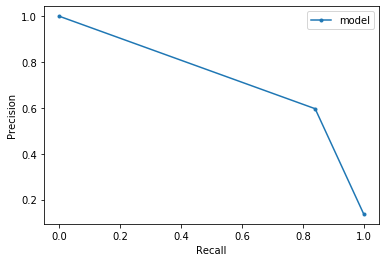

0.7770075101097631

**************

TESTING: 27 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR', 'Albumin, refrigerated serum (g/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents'] 

Learning rate set to 0.036868
0:	learn: 0.6389943	total: 27ms	remaining: 27s
1:	learn: 0.5925424	total: 46.3ms	remaining: 23.1s
2:	learn: 0.5440296	total: 64.5ms	remaining: 21.4s
3:	learn: 0.5085075	total: 85ms	remaining: 21.2s
4:	learn: 0.4739044	total: 10

151:	learn: 0.1326206	total: 3.44s	remaining: 19.2s
152:	learn: 0.1324967	total: 3.47s	remaining: 19.2s
153:	learn: 0.1323332	total: 3.51s	remaining: 19.3s
154:	learn: 0.1322355	total: 3.53s	remaining: 19.3s
155:	learn: 0.1321012	total: 3.56s	remaining: 19.3s
156:	learn: 0.1319917	total: 3.58s	remaining: 19.2s
157:	learn: 0.1319334	total: 3.6s	remaining: 19.2s
158:	learn: 0.1317777	total: 3.62s	remaining: 19.1s
159:	learn: 0.1316897	total: 3.64s	remaining: 19.1s
160:	learn: 0.1315699	total: 3.68s	remaining: 19.2s
161:	learn: 0.1314530	total: 3.71s	remaining: 19.2s
162:	learn: 0.1313514	total: 3.74s	remaining: 19.2s
163:	learn: 0.1312792	total: 3.76s	remaining: 19.2s
164:	learn: 0.1311105	total: 3.78s	remaining: 19.1s
165:	learn: 0.1310190	total: 3.8s	remaining: 19.1s
166:	learn: 0.1308531	total: 3.83s	remaining: 19.1s
167:	learn: 0.1307719	total: 3.85s	remaining: 19.1s
168:	learn: 0.1306867	total: 3.88s	remaining: 19.1s
169:	learn: 0.1305800	total: 3.92s	remaining: 19.1s
170:	learn: 0.

320:	learn: 0.1172531	total: 7.28s	remaining: 15.4s
321:	learn: 0.1172015	total: 7.31s	remaining: 15.4s
322:	learn: 0.1171318	total: 7.33s	remaining: 15.4s
323:	learn: 0.1170645	total: 7.36s	remaining: 15.3s
324:	learn: 0.1170121	total: 7.38s	remaining: 15.3s
325:	learn: 0.1169307	total: 7.39s	remaining: 15.3s
326:	learn: 0.1168545	total: 7.41s	remaining: 15.3s
327:	learn: 0.1167441	total: 7.43s	remaining: 15.2s
328:	learn: 0.1166909	total: 7.45s	remaining: 15.2s
329:	learn: 0.1166169	total: 7.47s	remaining: 15.2s
330:	learn: 0.1165845	total: 7.5s	remaining: 15.1s
331:	learn: 0.1165408	total: 7.53s	remaining: 15.1s
332:	learn: 0.1164158	total: 7.55s	remaining: 15.1s
333:	learn: 0.1163762	total: 7.58s	remaining: 15.1s
334:	learn: 0.1162751	total: 7.6s	remaining: 15.1s
335:	learn: 0.1162238	total: 7.61s	remaining: 15s
336:	learn: 0.1161390	total: 7.63s	remaining: 15s
337:	learn: 0.1160798	total: 7.64s	remaining: 15s
338:	learn: 0.1160786	total: 7.66s	remaining: 14.9s
339:	learn: 0.116038

484:	learn: 0.1059671	total: 10.4s	remaining: 11.1s
485:	learn: 0.1059045	total: 10.5s	remaining: 11.1s
486:	learn: 0.1058277	total: 10.5s	remaining: 11.1s
487:	learn: 0.1057901	total: 10.5s	remaining: 11s
488:	learn: 0.1057786	total: 10.5s	remaining: 11s
489:	learn: 0.1056779	total: 10.6s	remaining: 11s
490:	learn: 0.1056157	total: 10.6s	remaining: 11s
491:	learn: 0.1055515	total: 10.6s	remaining: 10.9s
492:	learn: 0.1054649	total: 10.6s	remaining: 10.9s
493:	learn: 0.1054366	total: 10.6s	remaining: 10.9s
494:	learn: 0.1053488	total: 10.6s	remaining: 10.8s
495:	learn: 0.1052745	total: 10.6s	remaining: 10.8s
496:	learn: 0.1051743	total: 10.7s	remaining: 10.8s
497:	learn: 0.1050932	total: 10.7s	remaining: 10.8s
498:	learn: 0.1050037	total: 10.7s	remaining: 10.8s
499:	learn: 0.1048462	total: 10.7s	remaining: 10.7s
500:	learn: 0.1047624	total: 10.8s	remaining: 10.7s
501:	learn: 0.1047616	total: 10.8s	remaining: 10.7s
502:	learn: 0.1046607	total: 10.8s	remaining: 10.7s
503:	learn: 0.104567

650:	learn: 0.0951015	total: 13.6s	remaining: 7.3s
651:	learn: 0.0950447	total: 13.7s	remaining: 7.29s
652:	learn: 0.0949831	total: 13.7s	remaining: 7.27s
653:	learn: 0.0949397	total: 13.7s	remaining: 7.25s
654:	learn: 0.0949016	total: 13.7s	remaining: 7.22s
655:	learn: 0.0948275	total: 13.7s	remaining: 7.2s
656:	learn: 0.0947547	total: 13.7s	remaining: 7.18s
657:	learn: 0.0947044	total: 13.8s	remaining: 7.15s
658:	learn: 0.0946797	total: 13.8s	remaining: 7.13s
659:	learn: 0.0946048	total: 13.8s	remaining: 7.11s
660:	learn: 0.0945655	total: 13.8s	remaining: 7.08s
661:	learn: 0.0944932	total: 13.8s	remaining: 7.06s
662:	learn: 0.0944816	total: 13.9s	remaining: 7.05s
663:	learn: 0.0944160	total: 13.9s	remaining: 7.03s
664:	learn: 0.0943811	total: 13.9s	remaining: 7.01s
665:	learn: 0.0943788	total: 13.9s	remaining: 6.99s
666:	learn: 0.0943766	total: 13.9s	remaining: 6.96s
667:	learn: 0.0943153	total: 14s	remaining: 6.94s
668:	learn: 0.0942049	total: 14s	remaining: 6.92s
669:	learn: 0.0940

809:	learn: 0.0859430	total: 16.6s	remaining: 3.88s
810:	learn: 0.0858639	total: 16.6s	remaining: 3.87s
811:	learn: 0.0858499	total: 16.6s	remaining: 3.85s
812:	learn: 0.0857676	total: 16.6s	remaining: 3.83s
813:	learn: 0.0857046	total: 16.7s	remaining: 3.81s
814:	learn: 0.0856486	total: 16.7s	remaining: 3.79s
815:	learn: 0.0856399	total: 16.7s	remaining: 3.76s
816:	learn: 0.0855314	total: 16.7s	remaining: 3.74s
817:	learn: 0.0855284	total: 16.7s	remaining: 3.72s
818:	learn: 0.0854147	total: 16.7s	remaining: 3.7s
819:	learn: 0.0853622	total: 16.7s	remaining: 3.68s
820:	learn: 0.0853165	total: 16.8s	remaining: 3.65s
821:	learn: 0.0852616	total: 16.8s	remaining: 3.63s
822:	learn: 0.0851718	total: 16.8s	remaining: 3.62s
823:	learn: 0.0851286	total: 16.8s	remaining: 3.6s
824:	learn: 0.0851262	total: 16.9s	remaining: 3.58s
825:	learn: 0.0850801	total: 16.9s	remaining: 3.55s
826:	learn: 0.0850328	total: 16.9s	remaining: 3.53s
827:	learn: 0.0849897	total: 16.9s	remaining: 3.51s
828:	learn: 0.

971:	learn: 0.0769558	total: 19.3s	remaining: 557ms
972:	learn: 0.0768728	total: 19.4s	remaining: 537ms
973:	learn: 0.0768069	total: 19.4s	remaining: 518ms
974:	learn: 0.0767690	total: 19.4s	remaining: 498ms
975:	learn: 0.0767347	total: 19.4s	remaining: 478ms
976:	learn: 0.0767100	total: 19.4s	remaining: 458ms
977:	learn: 0.0766897	total: 19.5s	remaining: 438ms
978:	learn: 0.0766344	total: 19.5s	remaining: 418ms
979:	learn: 0.0766335	total: 19.5s	remaining: 398ms
980:	learn: 0.0765795	total: 19.5s	remaining: 378ms
981:	learn: 0.0765627	total: 19.5s	remaining: 358ms
982:	learn: 0.0764967	total: 19.5s	remaining: 338ms
983:	learn: 0.0764653	total: 19.5s	remaining: 318ms
984:	learn: 0.0764282	total: 19.6s	remaining: 298ms
985:	learn: 0.0764061	total: 19.6s	remaining: 278ms
986:	learn: 0.0763875	total: 19.6s	remaining: 258ms
987:	learn: 0.0763724	total: 19.6s	remaining: 238ms
988:	learn: 0.0762973	total: 19.6s	remaining: 219ms
989:	learn: 0.0762061	total: 19.7s	remaining: 199ms
990:	learn: 

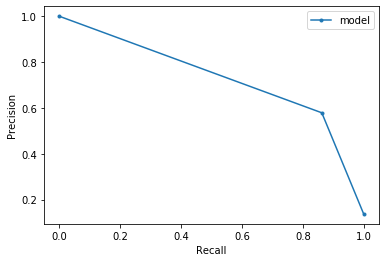

0.7854297097324986

**************

TESTING: 28 features

 ['Glucose, refrigerated serum (mmol/L)', 'Age', 'LDL cholesterol (mmol/L)', 'Chloride (mmol/L)', 'metformin', 'bmi', 'Ethnicity', 'Gamma Glutamyl Transferase (GGT) (U/L)', 'Triglycerides, refrig serum (mg/dL)', 'insulin', 'Bicarbonate (mmol/L)', 'Creatinine, refrigerated serum (umol/L)', 'HDL cholesterol (mmol/L)', 'MAP', 'Sodium (mmol/L)', 'Potassium (mmol/L)', 'Alanine Aminotransferase (ALT) (U/L)', 'statin', 'Alkaline Phosphatase (ALP) (U/L)', 'Cholesterol, refrigerated serum (mg/dL)', 'eGFR', 'Albumin, refrigerated serum (g/dL)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)', 'Aspartate Aminotransferase (AST) (U/L)', 'Blood Urea Nitrogen (g/dL)', 'other_agents', 'Gender'] 

Learning rate set to 0.036868
0:	learn: 0.6373461	total: 18.1ms	remaining: 18.1s
1:	learn: 0.5883570	total: 31ms	remaining: 15.5s
2:	learn: 0.5497620	total: 44ms	remaining: 14.6s
3:	learn: 0.5144305	total: 59.7ms	remaining: 14.9s
4:	learn: 0.48263

154:	learn: 0.1321717	total: 2.24s	remaining: 12.2s
155:	learn: 0.1320638	total: 2.27s	remaining: 12.3s
156:	learn: 0.1319639	total: 2.29s	remaining: 12.3s
157:	learn: 0.1317807	total: 2.31s	remaining: 12.3s
158:	learn: 0.1316540	total: 2.33s	remaining: 12.3s
159:	learn: 0.1315921	total: 2.34s	remaining: 12.3s
160:	learn: 0.1314902	total: 2.35s	remaining: 12.3s
161:	learn: 0.1313790	total: 2.36s	remaining: 12.2s
162:	learn: 0.1312088	total: 2.38s	remaining: 12.2s
163:	learn: 0.1311447	total: 2.39s	remaining: 12.2s
164:	learn: 0.1310157	total: 2.4s	remaining: 12.1s
165:	learn: 0.1309969	total: 2.41s	remaining: 12.1s
166:	learn: 0.1308949	total: 2.42s	remaining: 12.1s
167:	learn: 0.1307927	total: 2.43s	remaining: 12s
168:	learn: 0.1306322	total: 2.44s	remaining: 12s
169:	learn: 0.1305562	total: 2.46s	remaining: 12s
170:	learn: 0.1305244	total: 2.48s	remaining: 12s
171:	learn: 0.1304628	total: 2.5s	remaining: 12.1s
172:	learn: 0.1303584	total: 2.52s	remaining: 12.1s
173:	learn: 0.1302684	

320:	learn: 0.1171383	total: 4.79s	remaining: 10.1s
321:	learn: 0.1170501	total: 4.82s	remaining: 10.1s
322:	learn: 0.1170104	total: 4.84s	remaining: 10.2s
323:	learn: 0.1169721	total: 4.86s	remaining: 10.1s
324:	learn: 0.1169207	total: 4.88s	remaining: 10.1s
325:	learn: 0.1168387	total: 4.9s	remaining: 10.1s
326:	learn: 0.1167012	total: 4.91s	remaining: 10.1s
327:	learn: 0.1166280	total: 4.92s	remaining: 10.1s
328:	learn: 0.1165174	total: 4.93s	remaining: 10.1s
329:	learn: 0.1164785	total: 4.95s	remaining: 10s
330:	learn: 0.1163503	total: 4.96s	remaining: 10s
331:	learn: 0.1162959	total: 4.97s	remaining: 10s
332:	learn: 0.1161866	total: 4.98s	remaining: 9.98s
333:	learn: 0.1160670	total: 5s	remaining: 9.97s
334:	learn: 0.1159889	total: 5.03s	remaining: 9.98s
335:	learn: 0.1158935	total: 5.05s	remaining: 9.98s
336:	learn: 0.1158279	total: 5.07s	remaining: 9.97s
337:	learn: 0.1157145	total: 5.09s	remaining: 9.97s
338:	learn: 0.1156544	total: 5.1s	remaining: 9.95s
339:	learn: 0.1156048	t

489:	learn: 0.1047531	total: 7.54s	remaining: 7.85s
490:	learn: 0.1046618	total: 7.57s	remaining: 7.85s
491:	learn: 0.1045052	total: 7.59s	remaining: 7.84s
492:	learn: 0.1044096	total: 7.61s	remaining: 7.83s
493:	learn: 0.1043680	total: 7.63s	remaining: 7.82s
494:	learn: 0.1043444	total: 7.65s	remaining: 7.8s
495:	learn: 0.1042873	total: 7.66s	remaining: 7.78s
496:	learn: 0.1041693	total: 7.67s	remaining: 7.76s
497:	learn: 0.1041361	total: 7.68s	remaining: 7.75s
498:	learn: 0.1040969	total: 7.7s	remaining: 7.73s
499:	learn: 0.1040127	total: 7.71s	remaining: 7.71s
500:	learn: 0.1039089	total: 7.72s	remaining: 7.69s
501:	learn: 0.1038416	total: 7.74s	remaining: 7.68s
502:	learn: 0.1037277	total: 7.76s	remaining: 7.67s
503:	learn: 0.1037072	total: 7.79s	remaining: 7.67s
504:	learn: 0.1036189	total: 7.81s	remaining: 7.66s
505:	learn: 0.1034952	total: 7.83s	remaining: 7.65s
506:	learn: 0.1034059	total: 7.85s	remaining: 7.63s
507:	learn: 0.1033898	total: 7.86s	remaining: 7.62s
508:	learn: 0.

656:	learn: 0.0922942	total: 10.3s	remaining: 5.38s
657:	learn: 0.0922514	total: 10.3s	remaining: 5.37s
658:	learn: 0.0922439	total: 10.4s	remaining: 5.36s
659:	learn: 0.0921711	total: 10.4s	remaining: 5.34s
660:	learn: 0.0921213	total: 10.4s	remaining: 5.33s
661:	learn: 0.0920209	total: 10.4s	remaining: 5.32s
662:	learn: 0.0919846	total: 10.4s	remaining: 5.3s
663:	learn: 0.0919062	total: 10.4s	remaining: 5.29s
664:	learn: 0.0918222	total: 10.5s	remaining: 5.27s
665:	learn: 0.0917592	total: 10.5s	remaining: 5.26s
666:	learn: 0.0916804	total: 10.5s	remaining: 5.24s
667:	learn: 0.0915519	total: 10.5s	remaining: 5.23s
668:	learn: 0.0914487	total: 10.6s	remaining: 5.22s
669:	learn: 0.0913750	total: 10.6s	remaining: 5.21s
670:	learn: 0.0912671	total: 10.6s	remaining: 5.2s
671:	learn: 0.0912212	total: 10.6s	remaining: 5.18s
672:	learn: 0.0911875	total: 10.6s	remaining: 5.16s
673:	learn: 0.0910454	total: 10.6s	remaining: 5.15s
674:	learn: 0.0909769	total: 10.7s	remaining: 5.13s
675:	learn: 0.

827:	learn: 0.0826638	total: 13.3s	remaining: 2.77s
828:	learn: 0.0826418	total: 13.3s	remaining: 2.75s
829:	learn: 0.0825862	total: 13.4s	remaining: 2.74s
830:	learn: 0.0824848	total: 13.4s	remaining: 2.72s
831:	learn: 0.0824465	total: 13.4s	remaining: 2.71s
832:	learn: 0.0824120	total: 13.4s	remaining: 2.69s
833:	learn: 0.0823397	total: 13.4s	remaining: 2.67s
834:	learn: 0.0823269	total: 13.4s	remaining: 2.66s
835:	learn: 0.0822630	total: 13.5s	remaining: 2.64s
836:	learn: 0.0821824	total: 13.5s	remaining: 2.62s
837:	learn: 0.0821432	total: 13.5s	remaining: 2.61s
838:	learn: 0.0820971	total: 13.5s	remaining: 2.59s
839:	learn: 0.0820363	total: 13.5s	remaining: 2.57s
840:	learn: 0.0819795	total: 13.5s	remaining: 2.56s
841:	learn: 0.0818900	total: 13.6s	remaining: 2.54s
842:	learn: 0.0818805	total: 13.6s	remaining: 2.53s
843:	learn: 0.0817955	total: 13.6s	remaining: 2.52s
844:	learn: 0.0817828	total: 13.6s	remaining: 2.5s
845:	learn: 0.0817076	total: 13.6s	remaining: 2.48s
846:	learn: 0

991:	learn: 0.0746280	total: 16.3s	remaining: 131ms
992:	learn: 0.0745930	total: 16.3s	remaining: 115ms
993:	learn: 0.0745421	total: 16.3s	remaining: 98.5ms
994:	learn: 0.0745047	total: 16.3s	remaining: 82.1ms
995:	learn: 0.0744207	total: 16.4s	remaining: 65.7ms
996:	learn: 0.0743692	total: 16.4s	remaining: 49.3ms
997:	learn: 0.0743221	total: 16.4s	remaining: 32.9ms
998:	learn: 0.0742652	total: 16.4s	remaining: 16.4ms
999:	learn: 0.0741885	total: 16.4s	remaining: 0us
Best F2 score: 0.7885085574572126 at a threshold of 0.16

##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1838  173]
 [  50  270]]

True Positives: 270
True Negatives: 1838
False Positives: 173
False Negatives: 50


Recall: 0.84375
Precision: 0.6094808126410836
Specificity 0.9139731476877175
F1 score: 0.707732634338139
F2 score: 0.7835171213000581


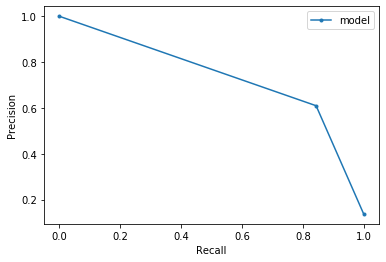

0.7835171213000581


In [2329]:
outcomes = dict()

for i in enumerate(ordered_features_cb): 
    feature_index = i[0]
    features = ordered_features_cb[:feature_index]
    
    if feature_index < 2: 
        pass
    else: 
        print('\n**************')
        print('\nTESTING:', feature_index, 'features')
        print('\n', features, '\n')
        fbeta = cb_process(df, features)
        print(fbeta)
        outcomes[feature_index] = fbeta
    

In [2330]:
#result for just glucose 

In [2332]:
df = pd.read_csv('nhanes_extracted.csv')
df.drop(columns = ['Unnamed: 0'], axis=1, inplace=True)
df['Gender'] = df['Gender'].astype(int)
df.dropna(how='all', subset=labs, inplace=True)
df.dropna(how='all', subset=diabetes_tests, inplace=True)
#fill missing data with out-of-sample 
df.fillna(-999, inplace=True)

Learning rate set to 0.036868
0:	learn: 0.6475262	total: 20.6ms	remaining: 20.6s
1:	learn: 0.6072796	total: 33.5ms	remaining: 16.7s
2:	learn: 0.5690660	total: 47.1ms	remaining: 15.6s
3:	learn: 0.5330016	total: 59.4ms	remaining: 14.8s
4:	learn: 0.4976813	total: 72.6ms	remaining: 14.5s
5:	learn: 0.4696799	total: 85.3ms	remaining: 14.1s
6:	learn: 0.4435496	total: 97.2ms	remaining: 13.8s
7:	learn: 0.4195967	total: 111ms	remaining: 13.8s
8:	learn: 0.3978455	total: 121ms	remaining: 13.4s
9:	learn: 0.3810838	total: 133ms	remaining: 13.2s
10:	learn: 0.3642507	total: 148ms	remaining: 13.3s
11:	learn: 0.3485020	total: 166ms	remaining: 13.6s
12:	learn: 0.3346155	total: 178ms	remaining: 13.5s
13:	learn: 0.3218791	total: 189ms	remaining: 13.3s
14:	learn: 0.3103328	total: 207ms	remaining: 13.6s
15:	learn: 0.3020892	total: 221ms	remaining: 13.6s
16:	learn: 0.2939009	total: 234ms	remaining: 13.6s
17:	learn: 0.2849993	total: 247ms	remaining: 13.5s
18:	learn: 0.2782079	total: 260ms	remaining: 13.4s
19:	

183:	learn: 0.1999770	total: 1.88s	remaining: 8.32s
184:	learn: 0.1999728	total: 1.89s	remaining: 8.34s
185:	learn: 0.1999697	total: 1.91s	remaining: 8.35s
186:	learn: 0.1999582	total: 1.92s	remaining: 8.36s
187:	learn: 0.1999475	total: 1.94s	remaining: 8.38s
188:	learn: 0.1999397	total: 1.95s	remaining: 8.36s
189:	learn: 0.1999371	total: 1.96s	remaining: 8.36s
190:	learn: 0.1999268	total: 1.97s	remaining: 8.35s
191:	learn: 0.1999058	total: 1.98s	remaining: 8.34s
192:	learn: 0.1999012	total: 1.99s	remaining: 8.32s
193:	learn: 0.1998982	total: 2s	remaining: 8.31s
194:	learn: 0.1998836	total: 2.01s	remaining: 8.29s
195:	learn: 0.1998828	total: 2.02s	remaining: 8.28s
196:	learn: 0.1998779	total: 2.02s	remaining: 8.25s
197:	learn: 0.1998734	total: 2.04s	remaining: 8.25s
198:	learn: 0.1998580	total: 2.05s	remaining: 8.24s
199:	learn: 0.1998547	total: 2.05s	remaining: 8.22s
200:	learn: 0.1998511	total: 2.06s	remaining: 8.2s
201:	learn: 0.1998383	total: 2.07s	remaining: 8.19s
202:	learn: 0.19

355:	learn: 0.1986358	total: 3.69s	remaining: 6.68s
356:	learn: 0.1986208	total: 3.71s	remaining: 6.67s
357:	learn: 0.1986007	total: 3.72s	remaining: 6.67s
358:	learn: 0.1985939	total: 3.73s	remaining: 6.66s
359:	learn: 0.1985834	total: 3.74s	remaining: 6.65s
360:	learn: 0.1985754	total: 3.75s	remaining: 6.64s
361:	learn: 0.1985647	total: 3.76s	remaining: 6.63s
362:	learn: 0.1985613	total: 3.78s	remaining: 6.63s
363:	learn: 0.1985479	total: 3.78s	remaining: 6.61s
364:	learn: 0.1985409	total: 3.79s	remaining: 6.59s
365:	learn: 0.1985349	total: 3.8s	remaining: 6.58s
366:	learn: 0.1985278	total: 3.81s	remaining: 6.57s
367:	learn: 0.1985223	total: 3.81s	remaining: 6.55s
368:	learn: 0.1985125	total: 3.82s	remaining: 6.53s
369:	learn: 0.1985035	total: 3.82s	remaining: 6.51s
370:	learn: 0.1984973	total: 3.83s	remaining: 6.5s
371:	learn: 0.1984894	total: 3.84s	remaining: 6.48s
372:	learn: 0.1984840	total: 3.84s	remaining: 6.46s
373:	learn: 0.1984696	total: 3.85s	remaining: 6.44s
374:	learn: 0.

534:	learn: 0.1974769	total: 5.1s	remaining: 4.43s
535:	learn: 0.1974731	total: 5.12s	remaining: 4.43s
536:	learn: 0.1974702	total: 5.13s	remaining: 4.42s
537:	learn: 0.1974675	total: 5.14s	remaining: 4.42s
538:	learn: 0.1974648	total: 5.15s	remaining: 4.41s
539:	learn: 0.1974628	total: 5.16s	remaining: 4.4s
540:	learn: 0.1974592	total: 5.17s	remaining: 4.39s
541:	learn: 0.1974524	total: 5.17s	remaining: 4.37s
542:	learn: 0.1974505	total: 5.18s	remaining: 4.36s
543:	learn: 0.1974466	total: 5.19s	remaining: 4.35s
544:	learn: 0.1974432	total: 5.19s	remaining: 4.34s
545:	learn: 0.1974400	total: 5.2s	remaining: 4.32s
546:	learn: 0.1974382	total: 5.21s	remaining: 4.31s
547:	learn: 0.1974349	total: 5.21s	remaining: 4.3s
548:	learn: 0.1974234	total: 5.22s	remaining: 4.29s
549:	learn: 0.1974194	total: 5.22s	remaining: 4.28s
550:	learn: 0.1974154	total: 5.23s	remaining: 4.26s
551:	learn: 0.1974048	total: 5.24s	remaining: 4.25s
552:	learn: 0.1974009	total: 5.24s	remaining: 4.24s
553:	learn: 0.19

707:	learn: 0.1968534	total: 6.55s	remaining: 2.7s
708:	learn: 0.1968508	total: 6.56s	remaining: 2.69s
709:	learn: 0.1968489	total: 6.57s	remaining: 2.69s
710:	learn: 0.1968468	total: 6.58s	remaining: 2.68s
711:	learn: 0.1968439	total: 6.6s	remaining: 2.67s
712:	learn: 0.1968417	total: 6.61s	remaining: 2.66s
713:	learn: 0.1968390	total: 6.63s	remaining: 2.65s
714:	learn: 0.1968374	total: 6.64s	remaining: 2.65s
715:	learn: 0.1968339	total: 6.66s	remaining: 2.64s
716:	learn: 0.1968326	total: 6.67s	remaining: 2.63s
717:	learn: 0.1968315	total: 6.68s	remaining: 2.62s
718:	learn: 0.1968254	total: 6.7s	remaining: 2.62s
719:	learn: 0.1968237	total: 6.71s	remaining: 2.61s
720:	learn: 0.1968217	total: 6.72s	remaining: 2.6s
721:	learn: 0.1968200	total: 6.74s	remaining: 2.59s
722:	learn: 0.1968180	total: 6.75s	remaining: 2.58s
723:	learn: 0.1968161	total: 6.76s	remaining: 2.58s
724:	learn: 0.1968137	total: 6.77s	remaining: 2.57s
725:	learn: 0.1968118	total: 6.79s	remaining: 2.56s
726:	learn: 0.19

884:	learn: 0.1964356	total: 8.16s	remaining: 1.06s
885:	learn: 0.1964347	total: 8.17s	remaining: 1.05s
886:	learn: 0.1964340	total: 8.18s	remaining: 1.04s
887:	learn: 0.1964325	total: 8.2s	remaining: 1.03s
888:	learn: 0.1964313	total: 8.21s	remaining: 1.02s
889:	learn: 0.1964276	total: 8.22s	remaining: 1.01s
890:	learn: 0.1964268	total: 8.22s	remaining: 1s
891:	learn: 0.1964257	total: 8.23s	remaining: 996ms
892:	learn: 0.1964222	total: 8.23s	remaining: 987ms
893:	learn: 0.1964189	total: 8.24s	remaining: 977ms
894:	learn: 0.1964180	total: 8.25s	remaining: 968ms
895:	learn: 0.1964157	total: 8.25s	remaining: 958ms
896:	learn: 0.1964125	total: 8.26s	remaining: 948ms
897:	learn: 0.1964114	total: 8.26s	remaining: 939ms
898:	learn: 0.1964083	total: 8.27s	remaining: 929ms
899:	learn: 0.1964068	total: 8.28s	remaining: 920ms
900:	learn: 0.1964045	total: 8.28s	remaining: 910ms
901:	learn: 0.1964035	total: 8.29s	remaining: 900ms
902:	learn: 0.1964023	total: 8.3s	remaining: 891ms
903:	learn: 0.196

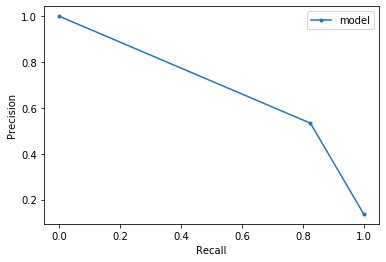


##### Evaluating Model #####
ROC AUC SCORE: 0.91

 [[1780  231]
 [  56  264]]

True Positives: 264
True Negatives: 1780
False Positives: 231
False Negatives: 56


Recall: 0.825
Precision: 0.5333333333333333
Specificity 0.8851317752362009
F1 score: 0.6478527607361962
F2 score: 0.7436619718309859


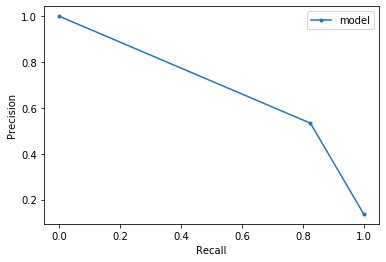

In [2333]:
#prepare df 
X = df[['Glucose, refrigerated serum (mmol/L)']]
y = df['diagnostic_t2dm']
    
    
#split into train-test (10% test and 15% validate)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.056, random_state=1, stratify = y_train)

    
#scale 
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_val = scaler.transform(X_val)
    
#instantiate 
model = CatBoostClassifier(random_seed = 42) 

train_pool = Pool(X_train, y_train)
validate_pool = Pool(X_val, y_val)
test_pool = Pool(X_test, y_test)
    
#fit 
model.fit(train_pool)
    
#predict for validate set 
y_preds = model.predict(validate_pool)
y_probs = model.predict_proba(validate_pool)[:,1]
    
#select threshold based on validate dataset 
threshold, result = threshold_setting(y_probs, y_val)
    
#apply this threshold to the test set 
y_preds = model.predict(test_pool)
y_probs = model.predict_proba(test_pool)[:,1]
    
#apply threshold 
y_pred_class = np.where(y_probs > threshold, 1, 0)
    
#evaluate
fbeta, TP, TN, FN, FP = evaluate(y_pred_class, y_test, y_probs)
    
evaluate(y_pred_class, y_test, y_probs)

outcomes[1] = fbeta

In [2334]:
outcomes_df = pd.DataFrame.from_dict(outcomes, orient='index').reset_index()
outcomes_df.columns = ['feature_selection', 'f2']

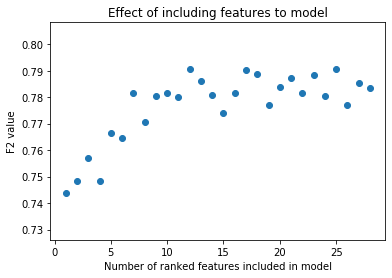

In [2335]:
plt.scatter(outcomes_df['feature_selection'], outcomes_df['f2'])
plt.xlabel('Number of ranked features included in model')
plt.ylabel('F2 value')
plt.title('Effect of including features to model')
plt.savefig('feature_selection.png')

In [2336]:
import operator
max(outcomes.items(), key=operator.itemgetter(1))[0]

12

In [2338]:
cb_features = ordered_features_cb[0:12]
cb_features

['Glucose, refrigerated serum (mmol/L)',
 'Age',
 'LDL cholesterol (mmol/L)',
 'Chloride (mmol/L)',
 'metformin',
 'bmi',
 'Ethnicity',
 'Gamma Glutamyl Transferase (GGT) (U/L)',
 'Triglycerides, refrig serum (mg/dL)',
 'insulin',
 'Bicarbonate (mmol/L)',
 'Creatinine, refrigerated serum (umol/L)']

In [2339]:
#final model 

In [2377]:
X = df[cb_features]
y = df

In [2378]:
#split into train-test (10% test and 15% validate)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1, stratify=y['diagnostic_t2dm'])
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.166666667, random_state=1, stratify = y_train['diagnostic_t2dm'])

In [2379]:
#categorical features 
categorical_features_indices = np.where(X_train.dtypes != np.float)[0]
    
#continuous features 
continuous = []

for i in np.where(X_train.dtypes == np.float)[0]: 
    continuous.append(list(X_train.columns)[i])

In [2380]:
scaler = StandardScaler()

X_train[continuous] = scaler.fit_transform(X_train[continuous])
X_test[continuous] = scaler.transform(X_test[continuous])
X_val[continuous] = scaler.transform(X_val[continuous])

In [2381]:
#instantiate 
model = CatBoostClassifier(random_seed = 42) 

In [2382]:
train_pool = Pool(X_train, y_train['diagnostic_t2dm'], cat_features=categorical_features_indices)
validate_pool = Pool(X_val, y_val['diagnostic_t2dm'], cat_features=categorical_features_indices)
test_pool = Pool(X_test, y_test['diagnostic_t2dm'], cat_features=categorical_features_indices)

In [2383]:
#fit 
model.fit(train_pool)

Learning rate set to 0.034956
0:	learn: 0.6439039	total: 58.1ms	remaining: 58.1s
1:	learn: 0.5964779	total: 113ms	remaining: 56.5s
2:	learn: 0.5598546	total: 143ms	remaining: 47.4s
3:	learn: 0.5211406	total: 167ms	remaining: 41.7s
4:	learn: 0.4868414	total: 190ms	remaining: 37.8s
5:	learn: 0.4558982	total: 228ms	remaining: 37.7s
6:	learn: 0.4299853	total: 255ms	remaining: 36.1s
7:	learn: 0.4044671	total: 273ms	remaining: 33.9s
8:	learn: 0.3810502	total: 291ms	remaining: 32s
9:	learn: 0.3618734	total: 309ms	remaining: 30.6s
10:	learn: 0.3424186	total: 324ms	remaining: 29.1s
11:	learn: 0.3268451	total: 344ms	remaining: 28.3s
12:	learn: 0.3114260	total: 355ms	remaining: 26.9s
13:	learn: 0.2960193	total: 365ms	remaining: 25.7s
14:	learn: 0.2833622	total: 374ms	remaining: 24.6s
15:	learn: 0.2726191	total: 385ms	remaining: 23.7s
16:	learn: 0.2629739	total: 401ms	remaining: 23.2s
17:	learn: 0.2539959	total: 412ms	remaining: 22.5s
18:	learn: 0.2445949	total: 428ms	remaining: 22.1s
19:	learn: 0

161:	learn: 0.1338980	total: 2.38s	remaining: 12.3s
162:	learn: 0.1338331	total: 2.4s	remaining: 12.3s
163:	learn: 0.1337241	total: 2.42s	remaining: 12.3s
164:	learn: 0.1336315	total: 2.43s	remaining: 12.3s
165:	learn: 0.1335189	total: 2.45s	remaining: 12.3s
166:	learn: 0.1334492	total: 2.46s	remaining: 12.3s
167:	learn: 0.1333669	total: 2.47s	remaining: 12.2s
168:	learn: 0.1332495	total: 2.48s	remaining: 12.2s
169:	learn: 0.1332104	total: 2.48s	remaining: 12.1s
170:	learn: 0.1330560	total: 2.49s	remaining: 12.1s
171:	learn: 0.1329548	total: 2.5s	remaining: 12s
172:	learn: 0.1328270	total: 2.51s	remaining: 12s
173:	learn: 0.1326982	total: 2.52s	remaining: 12s
174:	learn: 0.1326425	total: 2.53s	remaining: 11.9s
175:	learn: 0.1325745	total: 2.55s	remaining: 12s
176:	learn: 0.1324235	total: 2.57s	remaining: 12s
177:	learn: 0.1323282	total: 2.59s	remaining: 12s
178:	learn: 0.1322015	total: 2.61s	remaining: 12s
179:	learn: 0.1320693	total: 2.63s	remaining: 12s
180:	learn: 0.1320019	total: 2

323:	learn: 0.1204366	total: 4.25s	remaining: 8.88s
324:	learn: 0.1203824	total: 4.27s	remaining: 8.86s
325:	learn: 0.1202910	total: 4.28s	remaining: 8.84s
326:	learn: 0.1202262	total: 4.29s	remaining: 8.83s
327:	learn: 0.1201224	total: 4.31s	remaining: 8.82s
328:	learn: 0.1200903	total: 4.32s	remaining: 8.81s
329:	learn: 0.1200346	total: 4.33s	remaining: 8.8s
330:	learn: 0.1199502	total: 4.35s	remaining: 8.79s
331:	learn: 0.1198176	total: 4.36s	remaining: 8.77s
332:	learn: 0.1197617	total: 4.37s	remaining: 8.75s
333:	learn: 0.1197109	total: 4.38s	remaining: 8.74s
334:	learn: 0.1196474	total: 4.39s	remaining: 8.73s
335:	learn: 0.1196117	total: 4.41s	remaining: 8.71s
336:	learn: 0.1195243	total: 4.42s	remaining: 8.7s
337:	learn: 0.1194506	total: 4.43s	remaining: 8.68s
338:	learn: 0.1193565	total: 4.44s	remaining: 8.65s
339:	learn: 0.1192998	total: 4.45s	remaining: 8.63s
340:	learn: 0.1192514	total: 4.45s	remaining: 8.6s
341:	learn: 0.1191834	total: 4.46s	remaining: 8.59s
342:	learn: 0.1

494:	learn: 0.1079620	total: 6.09s	remaining: 6.22s
495:	learn: 0.1079091	total: 6.1s	remaining: 6.2s
496:	learn: 0.1078356	total: 6.11s	remaining: 6.18s
497:	learn: 0.1077940	total: 6.12s	remaining: 6.16s
498:	learn: 0.1077320	total: 6.14s	remaining: 6.16s
499:	learn: 0.1076999	total: 6.15s	remaining: 6.15s
500:	learn: 0.1075833	total: 6.17s	remaining: 6.14s
501:	learn: 0.1075295	total: 6.18s	remaining: 6.13s
502:	learn: 0.1074478	total: 6.19s	remaining: 6.12s
503:	learn: 0.1074277	total: 6.21s	remaining: 6.11s
504:	learn: 0.1073225	total: 6.21s	remaining: 6.09s
505:	learn: 0.1072486	total: 6.22s	remaining: 6.08s
506:	learn: 0.1071629	total: 6.23s	remaining: 6.06s
507:	learn: 0.1070910	total: 6.24s	remaining: 6.04s
508:	learn: 0.1070345	total: 6.25s	remaining: 6.03s
509:	learn: 0.1069247	total: 6.25s	remaining: 6.01s
510:	learn: 0.1068485	total: 6.26s	remaining: 5.99s
511:	learn: 0.1067762	total: 6.27s	remaining: 5.97s
512:	learn: 0.1067182	total: 6.27s	remaining: 5.96s
513:	learn: 0.

663:	learn: 0.0979943	total: 7.92s	remaining: 4.01s
664:	learn: 0.0979613	total: 7.92s	remaining: 3.99s
665:	learn: 0.0979408	total: 7.94s	remaining: 3.98s
666:	learn: 0.0978765	total: 7.96s	remaining: 3.97s
667:	learn: 0.0978048	total: 7.97s	remaining: 3.96s
668:	learn: 0.0977153	total: 7.98s	remaining: 3.95s
669:	learn: 0.0976217	total: 8s	remaining: 3.94s
670:	learn: 0.0975699	total: 8.01s	remaining: 3.93s
671:	learn: 0.0975079	total: 8.02s	remaining: 3.91s
672:	learn: 0.0974604	total: 8.02s	remaining: 3.9s
673:	learn: 0.0973983	total: 8.03s	remaining: 3.88s
674:	learn: 0.0973495	total: 8.04s	remaining: 3.87s
675:	learn: 0.0973231	total: 8.05s	remaining: 3.86s
676:	learn: 0.0972670	total: 8.05s	remaining: 3.84s
677:	learn: 0.0972333	total: 8.06s	remaining: 3.83s
678:	learn: 0.0971690	total: 8.07s	remaining: 3.81s
679:	learn: 0.0970763	total: 8.07s	remaining: 3.8s
680:	learn: 0.0970103	total: 8.08s	remaining: 3.79s
681:	learn: 0.0969370	total: 8.09s	remaining: 3.77s
682:	learn: 0.096

838:	learn: 0.0891463	total: 9.7s	remaining: 1.86s
839:	learn: 0.0891389	total: 9.71s	remaining: 1.85s
840:	learn: 0.0891260	total: 9.71s	remaining: 1.84s
841:	learn: 0.0891032	total: 9.72s	remaining: 1.82s
842:	learn: 0.0890517	total: 9.73s	remaining: 1.81s
843:	learn: 0.0889976	total: 9.74s	remaining: 1.8s
844:	learn: 0.0889523	total: 9.75s	remaining: 1.79s
845:	learn: 0.0889083	total: 9.75s	remaining: 1.77s
846:	learn: 0.0888582	total: 9.76s	remaining: 1.76s
847:	learn: 0.0888105	total: 9.77s	remaining: 1.75s
848:	learn: 0.0887593	total: 9.78s	remaining: 1.74s
849:	learn: 0.0887208	total: 9.78s	remaining: 1.73s
850:	learn: 0.0886636	total: 9.79s	remaining: 1.71s
851:	learn: 0.0886307	total: 9.79s	remaining: 1.7s
852:	learn: 0.0886033	total: 9.8s	remaining: 1.69s
853:	learn: 0.0885139	total: 9.82s	remaining: 1.68s
854:	learn: 0.0884868	total: 9.83s	remaining: 1.67s
855:	learn: 0.0884485	total: 9.85s	remaining: 1.66s
856:	learn: 0.0884134	total: 9.86s	remaining: 1.64s
857:	learn: 0.08

In [2385]:
cv_params = model.get_params()

cv_params.update({'loss_function': 'Logloss'})

cv_data = cv(
Pool(X_train, y_train['diagnostic_t2dm'], cat_features = categorical_features_indices), cv_params, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6483507	test: 0.6484671	best: 0.6484671 (0)	total: 94.4ms	remaining: 1m 34s
1:	learn: 0.6049405	test: 0.6052036	best: 0.6052036 (1)	total: 146ms	remaining: 1m 12s
2:	learn: 0.5717551	test: 0.5721428	best: 0.5721428 (2)	total: 196ms	remaining: 1m 5s
3:	learn: 0.5399373	test: 0.5404266	best: 0.5404266 (3)	total: 265ms	remaining: 1m 5s
4:	learn: 0.5095394	test: 0.5101215	best: 0.5101215 (4)	total: 319ms	remaining: 1m 3s
5:	learn: 0.4816514	test: 0.4823601	best: 0.4823601 (5)	total: 368ms	remaining: 1m 1s
6:	learn: 0.4589845	test: 0.4597034	best: 0.4597034 (6)	total: 418ms	remaining: 59.2s
7:	learn: 0.4346892	test: 0.4354696	best: 0.4354696 (7)	total: 457ms	remaining: 56.7s
8:	learn: 0.4122165	test: 0.4130108	best: 0.4130108 (8)	total: 496ms	remaining: 54.6s
9:	learn: 0.3931360	test: 0.3940441	best: 0.3940441 (9)	total: 551ms	remaining: 54.5s
10:	learn: 0.3763274	test: 0.3772760	best: 0.3772760 (10)	total: 603ms	remaining: 54.2s
11:	learn: 0.3589640	test: 0.3600082	best: 0.3600

99:	learn: 0.1424178	test: 0.1519892	best: 0.1519892 (99)	total: 4.4s	remaining: 39.6s
100:	learn: 0.1421846	test: 0.1518414	best: 0.1518414 (100)	total: 4.45s	remaining: 39.7s
101:	learn: 0.1419902	test: 0.1517374	best: 0.1517374 (101)	total: 4.51s	remaining: 39.7s
102:	learn: 0.1417864	test: 0.1516144	best: 0.1516144 (102)	total: 4.56s	remaining: 39.7s
103:	learn: 0.1415621	test: 0.1515139	best: 0.1515139 (103)	total: 4.6s	remaining: 39.6s
104:	learn: 0.1413317	test: 0.1514185	best: 0.1514185 (104)	total: 4.63s	remaining: 39.5s
105:	learn: 0.1411145	test: 0.1513001	best: 0.1513001 (105)	total: 4.67s	remaining: 39.4s
106:	learn: 0.1409058	test: 0.1512222	best: 0.1512222 (106)	total: 4.7s	remaining: 39.3s
107:	learn: 0.1407044	test: 0.1511124	best: 0.1511124 (107)	total: 4.73s	remaining: 39.1s
108:	learn: 0.1405798	test: 0.1510510	best: 0.1510510 (108)	total: 4.76s	remaining: 38.9s
109:	learn: 0.1404053	test: 0.1509701	best: 0.1509701 (109)	total: 4.79s	remaining: 38.8s
110:	learn: 0.1

192:	learn: 0.1293704	test: 0.1473090	best: 0.1473090 (192)	total: 7.76s	remaining: 32.5s
193:	learn: 0.1292792	test: 0.1472955	best: 0.1472955 (193)	total: 7.8s	remaining: 32.4s
194:	learn: 0.1291783	test: 0.1472801	best: 0.1472801 (194)	total: 7.84s	remaining: 32.4s
195:	learn: 0.1290928	test: 0.1472555	best: 0.1472555 (195)	total: 7.88s	remaining: 32.3s
196:	learn: 0.1289867	test: 0.1472484	best: 0.1472484 (196)	total: 7.9s	remaining: 32.2s
197:	learn: 0.1289041	test: 0.1472452	best: 0.1472452 (197)	total: 7.93s	remaining: 32.1s
198:	learn: 0.1287915	test: 0.1472274	best: 0.1472274 (198)	total: 7.97s	remaining: 32.1s
199:	learn: 0.1286915	test: 0.1472039	best: 0.1472039 (199)	total: 8.02s	remaining: 32.1s
200:	learn: 0.1285812	test: 0.1471921	best: 0.1471921 (200)	total: 8.06s	remaining: 32s
201:	learn: 0.1284592	test: 0.1471713	best: 0.1471713 (201)	total: 8.1s	remaining: 32s
202:	learn: 0.1283775	test: 0.1471427	best: 0.1471427 (202)	total: 8.13s	remaining: 31.9s
203:	learn: 0.128

287:	learn: 0.1204723	test: 0.1461165	best: 0.1460935 (286)	total: 13.2s	remaining: 32.6s
288:	learn: 0.1204024	test: 0.1461195	best: 0.1460935 (286)	total: 13.2s	remaining: 32.6s
289:	learn: 0.1203149	test: 0.1460964	best: 0.1460935 (286)	total: 13.3s	remaining: 32.5s
290:	learn: 0.1202069	test: 0.1460967	best: 0.1460935 (286)	total: 13.3s	remaining: 32.4s
291:	learn: 0.1200964	test: 0.1460847	best: 0.1460847 (291)	total: 13.3s	remaining: 32.4s
292:	learn: 0.1200288	test: 0.1460998	best: 0.1460847 (291)	total: 13.4s	remaining: 32.3s
293:	learn: 0.1199527	test: 0.1460858	best: 0.1460847 (291)	total: 13.4s	remaining: 32.2s
294:	learn: 0.1198577	test: 0.1460656	best: 0.1460656 (294)	total: 13.5s	remaining: 32.2s
295:	learn: 0.1197897	test: 0.1460688	best: 0.1460656 (294)	total: 13.5s	remaining: 32.2s
296:	learn: 0.1197021	test: 0.1460820	best: 0.1460656 (294)	total: 13.6s	remaining: 32.1s
297:	learn: 0.1195892	test: 0.1460626	best: 0.1460626 (297)	total: 13.6s	remaining: 32s
298:	learn: 

383:	learn: 0.1118759	test: 0.1458878	best: 0.1458096 (349)	total: 17.3s	remaining: 27.7s
384:	learn: 0.1118053	test: 0.1458904	best: 0.1458096 (349)	total: 17.3s	remaining: 27.7s
385:	learn: 0.1117300	test: 0.1459027	best: 0.1458096 (349)	total: 17.3s	remaining: 27.6s
386:	learn: 0.1116877	test: 0.1458961	best: 0.1458096 (349)	total: 17.4s	remaining: 27.5s
387:	learn: 0.1116152	test: 0.1459057	best: 0.1458096 (349)	total: 17.4s	remaining: 27.4s
388:	learn: 0.1115179	test: 0.1459109	best: 0.1458096 (349)	total: 17.4s	remaining: 27.4s
389:	learn: 0.1114431	test: 0.1458978	best: 0.1458096 (349)	total: 17.5s	remaining: 27.3s
390:	learn: 0.1113794	test: 0.1458970	best: 0.1458096 (349)	total: 17.5s	remaining: 27.2s
391:	learn: 0.1113003	test: 0.1458860	best: 0.1458096 (349)	total: 17.5s	remaining: 27.2s
392:	learn: 0.1112075	test: 0.1459031	best: 0.1458096 (349)	total: 17.6s	remaining: 27.2s
393:	learn: 0.1111154	test: 0.1459343	best: 0.1458096 (349)	total: 17.6s	remaining: 27.1s
394:	learn

476:	learn: 0.1046252	test: 0.1461256	best: 0.1458096 (349)	total: 20.5s	remaining: 22.5s
477:	learn: 0.1045773	test: 0.1461394	best: 0.1458096 (349)	total: 20.6s	remaining: 22.5s
478:	learn: 0.1045117	test: 0.1461469	best: 0.1458096 (349)	total: 20.6s	remaining: 22.4s
479:	learn: 0.1044783	test: 0.1461518	best: 0.1458096 (349)	total: 20.7s	remaining: 22.4s
480:	learn: 0.1043834	test: 0.1461333	best: 0.1458096 (349)	total: 20.7s	remaining: 22.4s
481:	learn: 0.1042854	test: 0.1461280	best: 0.1458096 (349)	total: 20.8s	remaining: 22.3s
482:	learn: 0.1042174	test: 0.1461501	best: 0.1458096 (349)	total: 20.8s	remaining: 22.3s
483:	learn: 0.1041295	test: 0.1461702	best: 0.1458096 (349)	total: 20.8s	remaining: 22.2s
484:	learn: 0.1040525	test: 0.1461696	best: 0.1458096 (349)	total: 20.9s	remaining: 22.1s
485:	learn: 0.1039639	test: 0.1461470	best: 0.1458096 (349)	total: 20.9s	remaining: 22.1s
486:	learn: 0.1038773	test: 0.1461491	best: 0.1458096 (349)	total: 20.9s	remaining: 22s
487:	learn: 

569:	learn: 0.0980141	test: 0.1462740	best: 0.1458096 (349)	total: 23.7s	remaining: 17.9s
570:	learn: 0.0979383	test: 0.1462793	best: 0.1458096 (349)	total: 23.8s	remaining: 17.9s
571:	learn: 0.0978669	test: 0.1463024	best: 0.1458096 (349)	total: 23.8s	remaining: 17.8s
572:	learn: 0.0977753	test: 0.1463125	best: 0.1458096 (349)	total: 23.9s	remaining: 17.8s
573:	learn: 0.0976989	test: 0.1463143	best: 0.1458096 (349)	total: 23.9s	remaining: 17.7s
574:	learn: 0.0976209	test: 0.1463197	best: 0.1458096 (349)	total: 23.9s	remaining: 17.7s
575:	learn: 0.0975484	test: 0.1463208	best: 0.1458096 (349)	total: 24s	remaining: 17.6s
576:	learn: 0.0974770	test: 0.1463416	best: 0.1458096 (349)	total: 24s	remaining: 17.6s
577:	learn: 0.0974095	test: 0.1463501	best: 0.1458096 (349)	total: 24s	remaining: 17.5s
578:	learn: 0.0973731	test: 0.1463658	best: 0.1458096 (349)	total: 24.1s	remaining: 17.5s
579:	learn: 0.0973074	test: 0.1463402	best: 0.1458096 (349)	total: 24.1s	remaining: 17.4s
580:	learn: 0.09

662:	learn: 0.0921165	test: 0.1469177	best: 0.1458096 (349)	total: 27.5s	remaining: 14s
663:	learn: 0.0920467	test: 0.1469117	best: 0.1458096 (349)	total: 27.5s	remaining: 13.9s
664:	learn: 0.0919940	test: 0.1469061	best: 0.1458096 (349)	total: 27.6s	remaining: 13.9s
665:	learn: 0.0919409	test: 0.1468908	best: 0.1458096 (349)	total: 27.6s	remaining: 13.8s
666:	learn: 0.0918753	test: 0.1468897	best: 0.1458096 (349)	total: 27.6s	remaining: 13.8s
667:	learn: 0.0918094	test: 0.1468899	best: 0.1458096 (349)	total: 27.7s	remaining: 13.8s
668:	learn: 0.0917687	test: 0.1468969	best: 0.1458096 (349)	total: 27.8s	remaining: 13.7s
669:	learn: 0.0916994	test: 0.1469157	best: 0.1458096 (349)	total: 27.8s	remaining: 13.7s
670:	learn: 0.0916517	test: 0.1469176	best: 0.1458096 (349)	total: 27.9s	remaining: 13.7s
671:	learn: 0.0915904	test: 0.1469175	best: 0.1458096 (349)	total: 27.9s	remaining: 13.6s
672:	learn: 0.0915093	test: 0.1469383	best: 0.1458096 (349)	total: 28s	remaining: 13.6s
673:	learn: 0.

754:	learn: 0.0866257	test: 0.1475606	best: 0.1458096 (349)	total: 31.9s	remaining: 10.4s
755:	learn: 0.0865852	test: 0.1475592	best: 0.1458096 (349)	total: 32s	remaining: 10.3s
756:	learn: 0.0865128	test: 0.1475703	best: 0.1458096 (349)	total: 32s	remaining: 10.3s
757:	learn: 0.0864799	test: 0.1475610	best: 0.1458096 (349)	total: 32s	remaining: 10.2s
758:	learn: 0.0864260	test: 0.1475786	best: 0.1458096 (349)	total: 32.1s	remaining: 10.2s
759:	learn: 0.0863858	test: 0.1475737	best: 0.1458096 (349)	total: 32.1s	remaining: 10.1s
760:	learn: 0.0863527	test: 0.1475834	best: 0.1458096 (349)	total: 32.1s	remaining: 10.1s
761:	learn: 0.0862924	test: 0.1476035	best: 0.1458096 (349)	total: 32.1s	remaining: 10s
762:	learn: 0.0862339	test: 0.1476309	best: 0.1458096 (349)	total: 32.2s	remaining: 10s
763:	learn: 0.0861645	test: 0.1476291	best: 0.1458096 (349)	total: 32.2s	remaining: 9.96s
764:	learn: 0.0861325	test: 0.1476408	best: 0.1458096 (349)	total: 32.3s	remaining: 9.92s
765:	learn: 0.086082

848:	learn: 0.0816682	test: 0.1481434	best: 0.1458096 (349)	total: 35.3s	remaining: 6.28s
849:	learn: 0.0816224	test: 0.1481640	best: 0.1458096 (349)	total: 35.3s	remaining: 6.23s
850:	learn: 0.0815539	test: 0.1481694	best: 0.1458096 (349)	total: 35.4s	remaining: 6.19s
851:	learn: 0.0815041	test: 0.1481745	best: 0.1458096 (349)	total: 35.4s	remaining: 6.15s
852:	learn: 0.0814577	test: 0.1481759	best: 0.1458096 (349)	total: 35.5s	remaining: 6.11s
853:	learn: 0.0814150	test: 0.1481728	best: 0.1458096 (349)	total: 35.5s	remaining: 6.07s
854:	learn: 0.0813490	test: 0.1481833	best: 0.1458096 (349)	total: 35.6s	remaining: 6.03s
855:	learn: 0.0813092	test: 0.1481783	best: 0.1458096 (349)	total: 35.6s	remaining: 5.99s
856:	learn: 0.0812507	test: 0.1481827	best: 0.1458096 (349)	total: 35.6s	remaining: 5.95s
857:	learn: 0.0811988	test: 0.1481903	best: 0.1458096 (349)	total: 35.7s	remaining: 5.9s
858:	learn: 0.0811740	test: 0.1481922	best: 0.1458096 (349)	total: 35.7s	remaining: 5.86s
859:	learn:

940:	learn: 0.0768135	test: 0.1487269	best: 0.1458096 (349)	total: 39s	remaining: 2.44s
941:	learn: 0.0767835	test: 0.1487304	best: 0.1458096 (349)	total: 39s	remaining: 2.4s
942:	learn: 0.0767475	test: 0.1487198	best: 0.1458096 (349)	total: 39s	remaining: 2.36s
943:	learn: 0.0767129	test: 0.1487184	best: 0.1458096 (349)	total: 39.1s	remaining: 2.32s
944:	learn: 0.0766630	test: 0.1487372	best: 0.1458096 (349)	total: 39.1s	remaining: 2.27s
945:	learn: 0.0766306	test: 0.1487437	best: 0.1458096 (349)	total: 39.1s	remaining: 2.23s
946:	learn: 0.0765763	test: 0.1487598	best: 0.1458096 (349)	total: 39.1s	remaining: 2.19s
947:	learn: 0.0765369	test: 0.1487625	best: 0.1458096 (349)	total: 39.2s	remaining: 2.15s
948:	learn: 0.0765099	test: 0.1487799	best: 0.1458096 (349)	total: 39.2s	remaining: 2.11s
949:	learn: 0.0764557	test: 0.1487904	best: 0.1458096 (349)	total: 39.3s	remaining: 2.07s
950:	learn: 0.0764080	test: 0.1488023	best: 0.1458096 (349)	total: 39.4s	remaining: 2.03s
951:	learn: 0.076

In [2386]:
#predict for validate set 
y_preds = model.predict(validate_pool)
y_probs = model.predict_proba(validate_pool)[:,1]

In [2388]:
#select threshold based on validate dataset 
threshold, result = threshold_setting(y_probs, y_val['diagnostic_t2dm'])

Best F2 score: 0.7921810699588477 at a threshold of 0.13


In [2389]:
#apply this threshold to the test set 
y_preds = model.predict(test_pool)
y_probs = model.predict_proba(test_pool)[:,1]

In [2390]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.13, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.95

 [[1804  207]
 [  45  275]]

True Positives: 275
True Negatives: 1804
False Positives: 207
False Negatives: 45


Recall: 0.859375
Precision: 0.5705394190871369
Specificity 0.8970661362506216
F1 score: 0.6857855361596009
F2 score: 0.7803632236095345
Accuracy: 0.8918918918918919


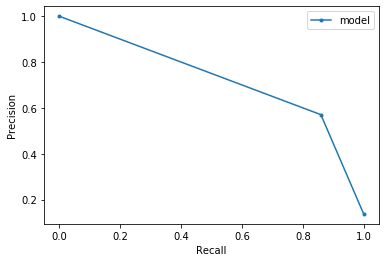

(0.7803632236095345, 275, 1804, 45, 207)

In [2391]:
evaluate(y_pred_class, y_test['diagnostic_t2dm'], y_probs)

In [2392]:
final_model = CatBoostClassifier(random_seed = 42) 

In [2393]:
cb_space = {
    'iterations' : np.arange(10, 2000, 20), 
    'learning_rate' : np.linspace(0.000001, 0.1),
    'max_depth' : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    'l2_leaf_reg': np.arange(2, 30), 
    'border_count' : np.arange(1, 255), 
    'bagging_temperature': np.linspace(0.0,1.0), 
    'random_strength': np.linspace(0.000000001, 1.0), 
    'one_hot_max_size': [1, 2, 3, 4, 5]}

In [2394]:
randomized_search_result = final_model.randomized_search(cb_space,train_pool, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.1885090	best: 0.1885090 (0)	total: 9.84s	remaining: 1m 28s
1:	loss: 0.1537975	best: 0.1537975 (1)	total: 17.9s	remaining: 1m 11s
2:	loss: 0.1516447	best: 0.1516447 (2)	total: 27.1s	remaining: 1m 3s
3:	loss: 0.1510413	best: 0.1510413 (3)	total: 45.1s	remaining: 1m 7s
4:	loss: 0.1498049	best: 0.1498049 (4)	total: 59.7s	remaining: 59.7s
5:	loss: 0.1535048	best: 0.1498049 (4)	total: 1m 3s	remaining: 42.5s
6:	loss: 0.1489381	best: 0.1489381 (6)	total: 1m 6s	remaining: 28.5s
7:	loss: 0.1503756	best: 0.1489381 (6)	total: 1m 23s	remaining: 20.8s
8:	loss: 0.1526880	best: 0.1489381 (6)	total: 1m 28s	remaining: 9.78s
9:	loss: 0.1498540	best: 0.1489381 (6)	total: 1m 33s	remaining: 0us
Estimating final quality...


In [2357]:
cv_params = final_model.get_params()

cv_params.update({'loss_function': 'Logloss'})

cv_data = cv(
Pool(X_train, y_train['diagnostic_t2dm'], cat_features = categorical_features_indices), cv_params, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6053304	test: 0.6055758	best: 0.6055758 (0)	total: 83.5ms	remaining: 27.5s
1:	learn: 0.5312060	test: 0.5315646	best: 0.5315646 (1)	total: 140ms	remaining: 22.9s
2:	learn: 0.4652631	test: 0.4659687	best: 0.4659687 (2)	total: 205ms	remaining: 22.3s
3:	learn: 0.4107691	test: 0.4114516	best: 0.4114516 (3)	total: 276ms	remaining: 22.5s
4:	learn: 0.3670198	test: 0.3678666	best: 0.3678666 (4)	total: 331ms	remaining: 21.5s
5:	learn: 0.3299556	test: 0.3311822	best: 0.3311822 (5)	total: 390ms	remaining: 21s
6:	learn: 0.3022488	test: 0.3036179	best: 0.3036179 (6)	total: 447ms	remaining: 20.6s
7:	learn: 0.2777843	test: 0.2792933	best: 0.2792933 (7)	total: 505ms	remaining: 20.3s
8:	learn: 0.2603918	test: 0.2620474	best: 0.2620474 (8)	total: 563ms	remaining: 20.1s
9:	learn: 0.2437677	test: 0.2455125	best: 0.2455125 (9)	total: 622ms	remaining: 19.9s
10:	learn: 0.2312158	test: 0.2330795	best: 0.2330795 (10)	total: 686ms	remaining: 19.9s
11:	learn: 0.2191913	test: 0.2211583	best: 0.2211583 

94:	learn: 0.1285398	test: 0.1475230	best: 0.1475230 (94)	total: 4.92s	remaining: 12.2s
95:	learn: 0.1283022	test: 0.1474807	best: 0.1474807 (95)	total: 4.98s	remaining: 12.1s
96:	learn: 0.1281024	test: 0.1474377	best: 0.1474377 (96)	total: 5.04s	remaining: 12.1s
97:	learn: 0.1279196	test: 0.1474036	best: 0.1474036 (97)	total: 5.09s	remaining: 12.1s
98:	learn: 0.1277023	test: 0.1473820	best: 0.1473820 (98)	total: 5.15s	remaining: 12s
99:	learn: 0.1275161	test: 0.1473698	best: 0.1473698 (99)	total: 5.23s	remaining: 12s
100:	learn: 0.1273563	test: 0.1473427	best: 0.1473427 (100)	total: 5.29s	remaining: 12s
101:	learn: 0.1271671	test: 0.1473284	best: 0.1473284 (101)	total: 5.37s	remaining: 12s
102:	learn: 0.1269373	test: 0.1472838	best: 0.1472838 (102)	total: 5.45s	remaining: 12s
103:	learn: 0.1266887	test: 0.1472613	best: 0.1472613 (103)	total: 5.57s	remaining: 12.1s
104:	learn: 0.1264834	test: 0.1472215	best: 0.1472215 (104)	total: 5.66s	remaining: 12.1s
105:	learn: 0.1263063	test: 0.14

190:	learn: 0.1138531	test: 0.1461175	best: 0.1461175 (190)	total: 12.3s	remaining: 8.98s
191:	learn: 0.1137408	test: 0.1461117	best: 0.1461117 (191)	total: 12.4s	remaining: 8.91s
192:	learn: 0.1136234	test: 0.1460739	best: 0.1460739 (192)	total: 12.4s	remaining: 8.83s
193:	learn: 0.1135930	test: 0.1460718	best: 0.1460718 (193)	total: 12.5s	remaining: 8.76s
194:	learn: 0.1135278	test: 0.1460624	best: 0.1460624 (194)	total: 12.5s	remaining: 8.69s
195:	learn: 0.1134647	test: 0.1460554	best: 0.1460554 (195)	total: 12.6s	remaining: 8.63s
196:	learn: 0.1133557	test: 0.1460306	best: 0.1460306 (196)	total: 12.7s	remaining: 8.57s
197:	learn: 0.1132210	test: 0.1460710	best: 0.1460306 (196)	total: 12.8s	remaining: 8.5s
198:	learn: 0.1130639	test: 0.1460623	best: 0.1460306 (196)	total: 12.8s	remaining: 8.43s
199:	learn: 0.1129879	test: 0.1460456	best: 0.1460306 (196)	total: 12.9s	remaining: 8.36s
200:	learn: 0.1128900	test: 0.1460491	best: 0.1460306 (196)	total: 12.9s	remaining: 8.28s
201:	learn:

283:	learn: 0.1033306	test: 0.1467799	best: 0.1460306 (196)	total: 16.8s	remaining: 2.72s
284:	learn: 0.1032012	test: 0.1468019	best: 0.1460306 (196)	total: 16.9s	remaining: 2.66s
285:	learn: 0.1030454	test: 0.1468330	best: 0.1460306 (196)	total: 16.9s	remaining: 2.6s
286:	learn: 0.1029311	test: 0.1468240	best: 0.1460306 (196)	total: 17s	remaining: 2.54s
287:	learn: 0.1027552	test: 0.1468517	best: 0.1460306 (196)	total: 17.1s	remaining: 2.49s
288:	learn: 0.1026708	test: 0.1468562	best: 0.1460306 (196)	total: 17.1s	remaining: 2.43s
289:	learn: 0.1025518	test: 0.1468623	best: 0.1460306 (196)	total: 17.2s	remaining: 2.37s
290:	learn: 0.1024206	test: 0.1468643	best: 0.1460306 (196)	total: 17.3s	remaining: 2.31s
291:	learn: 0.1022915	test: 0.1468761	best: 0.1460306 (196)	total: 17.3s	remaining: 2.26s
292:	learn: 0.1021100	test: 0.1469040	best: 0.1460306 (196)	total: 17.4s	remaining: 2.2s
293:	learn: 0.1019927	test: 0.1469261	best: 0.1460306 (196)	total: 17.5s	remaining: 2.14s
294:	learn: 0.

In [2395]:
y_preds = final_model.predict(validate_pool)
y_probs = final_model.predict_proba(validate_pool)[:,1]

In [2396]:
#select threshold based on validate dataset 
threshold_setting(y_probs, y_val['diagnostic_t2dm'])

Best F2 score: 0.80040733197556 at a threshold of 0.15


(0.15, 0.80040733197556)

In [2397]:
#make prediction from the test set 
y_preds = final_model.predict(test_pool)
y_probs = final_model.predict_proba(test_pool)[:,1]

In [2398]:
#apply threshold 
y_pred_class = np.where(y_probs > 0.15, 1, 0)


##### Evaluating Model #####
ROC AUC SCORE: 0.96

 [[1823  188]
 [  46  274]]

True Positives: 274
True Negatives: 1823
False Positives: 188
False Negatives: 46


Recall: 0.85625
Precision: 0.5930735930735931
Specificity 0.9065141720537047
F1 score: 0.7007672634271099
F2 score: 0.7864523536165327
Accuracy: 0.8996138996138996


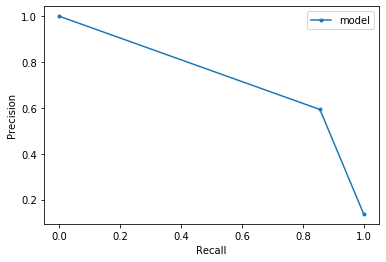

(0.7864523536165327, 274, 1823, 46, 188)

In [2399]:
evaluate(y_pred_class, y_test['diagnostic_t2dm'], y_probs)

In [2363]:
shap_values = final_model.get_feature_importance(train_pool, type="ShapValues")
shap_values = shap_values[:,:-1]


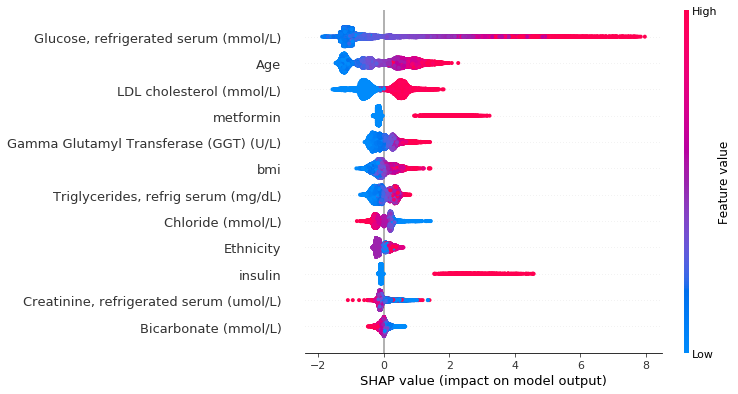

In [2372]:
shap.summary_plot(shap_values, X_train, max_display=24, show=False)
plt.savefig('cb_final_shap.png', bbox_inches='tight')

In [2365]:
#save model 
import pickle
pickle.dump(final_model, open('final_cb_model.pkl','wb'))


# Clinical Implications 

In [2402]:
y_test['prediction'] = y_pred_class

In [2403]:
y_test.columns 

Index(['SEQN', 'Gender', 'Age', 'Ethnicity', 'FHx', 'Fasting Glucose (mmol/L)',
       'Two Hour Glucose(OGTT) (mmol/L)',
       'How long ago saw a diabetes specialist', 'Retinopathy',
       'Last time had pupils dilated for exam', 'bmi',
       'Alanine Aminotransferase (ALT) (U/L)',
       'Albumin, refrigerated serum (g/dL)',
       'Alkaline Phosphatase (ALP) (U/L)',
       'Aspartate Aminotransferase (AST) (U/L)', 'Bicarbonate (mmol/L)',
       'Blood Urea Nitrogen (g/dL)', 'Chloride (mmol/L)',
       'Cholesterol, refrigerated serum (mg/dL)',
       'Creatinine, refrigerated serum (umol/L)',
       'Gamma Glutamyl Transferase (GGT) (U/L)',
       'Glucose, refrigerated serum (mmol/L)', 'Potassium (mmol/L)',
       'Sodium (mmol/L)', 'Total Bilirubin (umol/L)', 'Total Calcium (mmol/L)',
       'Triglycerides, refrig serum (mg/dL)', 'LDL cholesterol (mmol/L)',
       'HDL cholesterol (mmol/L)', 'Prescriptions', 'insulin', 'statin',
       'metformin', 'other_agents', 'ace_arbs', 

In [2620]:
clinical_implications = y_test[['prediction',  'diagnostic_t2dm','Gender', 'Age', 'Ethnicity', 'FHx', 'Fasting Glucose (mmol/L)',
       'Two Hour Glucose(OGTT) (mmol/L)', 'Bicarbonate (mmol/L)','Chloride (mmol/L)',
       'How long ago saw a diabetes specialist', 'Retinopathy',
       'Last time had pupils dilated for exam', 'bmi','Glucose, refrigerated serum (mmol/L)', 'Prescriptions', 'insulin', 'statin',
       'metformin', 'other_agents', 'ace_arbs', 'eGFR', 'HbA1c_correct',
       'known_diabetes', 'hba1c_result', 'MAP', 'ogtt_result', 'LDL cholesterol (mmol/L)', 'HDL cholesterol (mmol/L)', 'Triglycerides, refrig serum (mg/dL)'
                               , 'Creatinine, refrigerated serum (umol/L)',
       'Gamma Glutamyl Transferase (GGT) (U/L)']]

In [2621]:
clinical_implications

,prediction,diagnostic_t2dm,Gender,Age,Ethnicity,FHx,Fasting Glucose (mmol/L),Two Hour Glucose(OGTT) (mmol/L),Bicarbonate (mmol/L),Chloride (mmol/L),...,HbA1c_correct,known_diabetes,hba1c_result,MAP,ogtt_result,LDL cholesterol (mmol/L),HDL cholesterol (mmol/L),"Triglycerides, refrig serum (mg/dL)","Creatinine, refrigerated serum (umol/L)",Gamma Glutamyl Transferase (GGT) (U/L)
24084,0,0,1,23.0,3.0,2.0,5.995,1.887,27.0,104.0,...,33.318758,2.0,0.0,92.84,0,51.0,1.32,0.790,90.17,18.0
6193,0,0,1,36.0,4.0,2.0,5.273,6.106,25.0,108.0,...,39.877569,2.0,0.0,96.14,0,217.0,1.03,1.197,96.36,49.0
22438,1,0,1,55.0,4.0,1.0,-999.000,-999.000,26.0,93.0,...,47.529515,1.0,0.0,86.24,0,-999.0,0.72,3.635,96.36,22.0
27875,0,0,2,51.0,1.0,2.0,-999.000,-999.000,22.0,106.0,...,35.505028,2.0,0.0,96.14,0,-999.0,1.97,1.219,72.49,11.0
3905,0,0,2,80.0,3.0,2.0,-999.000,-999.000,28.0,97.0,...,32.225623,2.0,0.0,126.06,0,-999.0,1.78,1.626,63.65,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21063,1,1,2,71.0,4.0,1.0,9.159,-999.000,28.0,105.0,...,57.367731,1.0,1.0,80.96,1,135.0,1.53,0.689,48.62,20.0
4529,0,0,2,35.0,4.0,2.0,4.880,6.050,25.0,105.0,...,-999.000000,2.0,-999.0,64.46,0,81.0,1.76,0.361,64.53,11.0
7967,0,0,2,61.0,3.0,1.0,5.495,6.106,20.0,105.0,...,32.225623,2.0,0.0,89.10,0,114.0,1.55,0.756,67.18,17.0
25199,0,0,2,30.0,3.0,2.0,-999.000,-999.000,24.0,106.0,...,28.946218,2.0,0.0,78.32,0,-999.0,1.50,1.524,79.56,10.0


In [2622]:
def unrecognised_diabetes(row): 
    
    if ((row['diagnostic_t2dm'] == 1) & (row['known_diabetes'] == 2)): 
        return(1)
    
    else: 
        return(2)
    
clinical_implications['unrecognised_diabetes'] = clinical_implications.apply(unrecognised_diabetes, axis=1)

def outcome(row): 
    
    if ((row['diagnostic_t2dm'] ==-999.0) & (row['prediction'] == 1)): 
        return 'missing predicted positive'
    
    if ((row['diagnostic_t2dm'] ==-999.0) & (row['prediction'] == 0)): 
        return 'missing predicted negative'
    
    if ((row['diagnostic_t2dm'] ==1) & (row['prediction'] == 1)): 
        return 'TP'
    
    if ((row['diagnostic_t2dm'] == 0) & (row['prediction'] == 0)): 
        return 'TN'
    
    if ((row['diagnostic_t2dm'] == 1) & (row['prediction'] == 0)): 
        return 'FN'
    
    if ((row['diagnostic_t2dm'] == 0) & (row['prediction'] == 1)): 
        return 'FP'
    
clinical_implications['outcome'] = clinical_implications.apply(outcome, axis=1)


In [2623]:
clinical_implications['known_diabetes'].value_counts(dropna=False)

2.0    1996
1.0     292
3.0      43
Name: known_diabetes, dtype: int64

In [2624]:
clinical_implications['outcome'].value_counts(dropna=False)

TN    1823
TP     274
FP     188
FN      46
Name: outcome, dtype: int64

In [2625]:
clinical_implications['unrecognised_diabetes'].value_counts(dropna=False)

2    2216
1     115
Name: unrecognised_diabetes, dtype: int64

In [2626]:
def ground_truth(row):
    
    
    if row['known_diabetes'] == 1.0: 
        
        if row['diagnostic_t2dm'] == 1.0: 
            return('Poorly controlled T2DM')
        
        if row['diagnostic_t2dm'] == 0.0: 
            return('Well controlled T2DM')
        
        if row['diagnostic_t2dm'] == -999.0: 
            return('Missing')
        
    #participants without diabetes
        
    if row['known_diabetes'] == 2.0: 
        
        if row['diagnostic_t2dm'] == 1.0: 
            return('New diagnosis of T2DM and poorly controlled blood sugars')
        
        if row['diagnostic_t2dm'] == 0.0: 
            return('Non-diabetic')
        
        if row['diagnostic_t2dm'] == -999.0: 
            return('Missing')
        
    #participants with prediabetes
        
    if row['known_diabetes'] == 3.0: 
        
        if row['diagnostic_t2dm'] == 1.0: 
            return('New diagnosis of T2DM in person with prediabetes')
        
        if row['diagnostic_t2dm'] == 0.0: 
            return('Known pre-diabetic')
        
        if row['diagnostic_t2dm'] == -999.0: 
            return('Missing')
        
    #unknown participants
    
    else:
        
        if row['diagnostic_t2dm'] == 1.0: 
            return('Diagnosis of Diabetes - no previous clinical information available')
        
        if row['diagnostic_t2dm'] == 0.0: 
            return('No diagnosis of Diabetes - no previous clinical information available')
        
        if row['diagnostic_t2dm'] == -999.0: 
            return('Missing')
        
clinical_implications['ground_truth'] = clinical_implications.apply(ground_truth, axis=1)

In [2627]:
clinical_implications['ground_truth'].value_counts(dropna=False)

Non-diabetic                                                1881
Poorly controlled T2DM                                       188
New diagnosis of T2DM and poorly controlled blood sugars     115
Well controlled T2DM                                         104
Known pre-diabetic                                            26
New diagnosis of T2DM in person with prediabetes              17
Name: ground_truth, dtype: int64

In [2628]:
def predicted_clinical_outcome(row): 
    
    #participants with diabetes 
    
    if row['known_diabetes'] == 1.0: 
        
        if row['prediction'] == 1.0: 
            return('Poorly controlled T2DM')
        
        if row['prediction'] == 0.0: 
            return('Well controlled T2DM')
        
        
    #participants without diabetes
        
    if row['known_diabetes'] == 2.0: 
        
        if row['prediction'] == 1.0: 
            return('New diagnosis of T2DM and poorly controlled blood sugars')
        
        if row['prediction'] == 0.0: 
            return('Non-diabetic')
        
    #participants with prediabetes
        
    if row['known_diabetes'] == 3.0: 
        
        if row['prediction'] == 1.0: 
            return('New diagnosis of T2DM in person with prediabetes')
        
        if row['prediction'] == 0.0: 
            return('Known pre-diabetic with good glycaemic control')
        
    #unknown participants
    
    else:
        
        if row['prediction'] == 1.0: 
            return('Diagnosis of Diabetes - no previous clinical information available')
        
        if row['prediction'] == 0.0: 
            return('No diagnosis of Diabetes - no previous clinical information available')
        
clinical_implications['predicted_clinical_outcome'] = clinical_implications.apply(predicted_clinical_outcome, axis=1)

In [2629]:
clinical_implications['predicted_clinical_outcome'].value_counts(dropna=False)

Non-diabetic                                                1808
Poorly controlled T2DM                                       248
New diagnosis of T2DM and poorly controlled blood sugars     188
Well controlled T2DM                                          44
New diagnosis of T2DM in person with prediabetes              26
Known pre-diabetic with good glycaemic control                17
Name: predicted_clinical_outcome, dtype: int64

In [2630]:
def clinical_stats(df): 
    
    #participants tested 
    tested = df.shape[0]
    
    #participants with diabetes 
    diabetes = df[df['known_diabetes'] == 1.0].shape[0]
    prediabetes = df[df['known_diabetes'] == 3.0].shape[0]
    
    #percentage of unrecognised diabetes
    unrecognised_diabetes = df[df['unrecognised_diabetes'] == 1.0].shape[0]
    unrecognised_diabetes_df = df[df['unrecognised_diabetes'] == 1.0]
    
    #alerts 
    flags = df[df['prediction'] == 1.0].shape[0]
    
    #identify new cases of diabetes
    newly_recognised = unrecognised_diabetes_df[unrecognised_diabetes_df['prediction']==1.0].shape[0]
    
    #confusion matrix
    cm = df.groupby('known_diabetes')['outcome'].value_counts().unstack()
    
    #output 
    
    print("***** Clinical Statistics *****")
    print(f"\nThis tested {tested} participants")
    print(f"\n{diabetes} participants with diabetes", ((diabetes/tested)*100), "% of cohort")
    print(f"\n{prediabetes} participants with pre-diabetes", ((prediabetes/tested)*100), "% of cohort")
    print(f"\n{unrecognised_diabetes} participants with previously unrecognised diabetes", ((unrecognised_diabetes/(diabetes+prediabetes))*100), "% of cohort with diabetes/pre-diabetes")
    print(f"\nThis system made {flags} alerts\n")
    print("***Effectiveness***\n")
    print(f"This system detected {newly_recognised} cases of diabetes\n")
    print("This reduced the unrecognised diabetes rate by", (((unrecognised_diabetes - (unrecognised_diabetes - newly_recognised))/unrecognised_diabetes)*100),'%\n')
    print("***Clinical Prediction***\n")
    print(df['predicted_clinical_outcome'].value_counts())
    print("\n***Actual Ground Truth***\n")
    print(df['ground_truth'].value_counts())
    print("\n", cm)
    print("\nBeneficial alerts: ", cm.loc[1.0][3]+cm.loc[2.0][3]+cm.loc[3.0][3])
    print("Nuissance alerts: ", cm.loc[1.0][1]+cm.loc[2.0][1]+cm.loc[3.0][1])
    print("Missed alerts: ", cm.loc[1.0][0]+cm.loc[2.0][0]+cm.loc[3.0][0])

In [2631]:
clinical_stats(clinical_implications)

***** Clinical Statistics *****

This tested 2331 participants

292 participants with diabetes 12.526812526812527 % of cohort

43 participants with pre-diabetes 1.8447018447018446 % of cohort

115 participants with previously unrecognised diabetes 34.32835820895522 % of cohort with diabetes/pre-diabetes

This system made 462 alerts

***Effectiveness***

This system detected 78 cases of diabetes

This reduced the unrecognised diabetes rate by 67.82608695652173 %

***Clinical Prediction***

Non-diabetic                                                1808
Poorly controlled T2DM                                       248
New diagnosis of T2DM and poorly controlled blood sugars     188
Well controlled T2DM                                          44
New diagnosis of T2DM in person with prediabetes              26
Known pre-diabetic with good glycaemic control                17
Name: predicted_clinical_outcome, dtype: int64

***Actual Ground Truth***

Non-diabetic                             

In [2632]:
clinical_implications.columns

Index(['prediction', 'diagnostic_t2dm', 'Gender', 'Age', 'Ethnicity', 'FHx',
       'Fasting Glucose (mmol/L)', 'Two Hour Glucose(OGTT) (mmol/L)',
       'Bicarbonate (mmol/L)', 'Chloride (mmol/L)',
       'How long ago saw a diabetes specialist', 'Retinopathy',
       'Last time had pupils dilated for exam', 'bmi',
       'Glucose, refrigerated serum (mmol/L)', 'Prescriptions', 'insulin',
       'statin', 'metformin', 'other_agents', 'ace_arbs', 'eGFR',
       'HbA1c_correct', 'known_diabetes', 'hba1c_result', 'MAP', 'ogtt_result',
       'LDL cholesterol (mmol/L)', 'HDL cholesterol (mmol/L)',
       'Triglycerides, refrig serum (mg/dL)',
       'Creatinine, refrigerated serum (umol/L)',
       'Gamma Glutamyl Transferase (GGT) (U/L)', 'unrecognised_diabetes',
       'outcome', 'ground_truth', 'predicted_clinical_outcome'],
      dtype='object')

In [2633]:
clinical_implications[clinical_implications['predicted_clinical_outcome'] == 'Non-diabetic']['outcome'].value_counts(dropna=False)

TN    1771
FN      37
Name: outcome, dtype: int64

In [2634]:
clinical_implications[clinical_implications['predicted_clinical_outcome'] == 'New diagnosis of T2DM and poorly controlled blood sugars']['outcome'].value_counts(dropna=False)

FP    110
TP     78
Name: outcome, dtype: int64

In [2635]:
clinical_implications[clinical_implications['predicted_clinical_outcome'] == 'New diagnosis of T2DM in person with prediabetes']['outcome'].value_counts(dropna=False)

TP    16
FP    10
Name: outcome, dtype: int64

In [2636]:
clinical_implications[clinical_implications['predicted_clinical_outcome'] == 'Known pre-diabetic with good glycaemic control']['outcome'].value_counts(dropna=False)

TN    16
FN     1
Name: outcome, dtype: int64

In [2637]:
clinical_implications[clinical_implications['predicted_clinical_outcome'] == 'Well controlled T2DM']['outcome'].value_counts(dropna=False)

TN    36
FN     8
Name: outcome, dtype: int64

In [2638]:
clinical_implications[clinical_implications['predicted_clinical_outcome'] == 'Poorly controlled T2DM']['outcome'].value_counts(dropna=False)

TP    180
FP     68
Name: outcome, dtype: int64

In [2639]:
#what was the RBG for the unrecognised T2DM

newly_recognised_m = ((clinical_implications['outcome']=='TP') & (clinical_implications['known_diabetes'] == 2))
newly_recognised_df = clinical_implications[newly_recognised_m]

In [2640]:
def elevated_rbg(row): 
    if row['Glucose, refrigerated serum (mmol/L)'] > 11.1: 
        return(1)
    else: 
        return(0)
    
newly_recognised_df['elevated_rbg'] = newly_recognised_df.apply(elevated_rbg, axis=1)

In [2641]:
newly_recognised_df['elevated_rbg'].value_counts(dropna=False)

0    66
1    12
Name: elevated_rbg, dtype: int64

In [2642]:
newly_recognised_df['Glucose, refrigerated serum (mmol/L)'].replace({-999:np.nan}).describe()

count    76.000000
mean      8.792105
std       3.453953
min       4.220000
25%       6.610000
50%       7.550000
75%       9.480000
max      22.260000
Name: Glucose, refrigerated serum (mmol/L), dtype: float64

In [2643]:
newly_recognised_df['HbA1c_correct'].replace({-999:np.nan}).describe()

count     71.000000
mean      56.151425
std       18.377817
min       35.505028
25%       44.250109
50%       49.715785
75%       60.647136
max      114.210756
Name: HbA1c_correct, dtype: float64

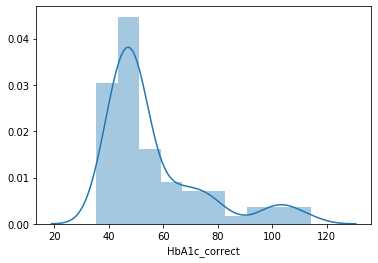

In [2644]:
sns.distplot(newly_recognised_df['HbA1c_correct'].replace({-999:np.nan}))

# Newly diagnosed T2DM 

In [2645]:
newly_recognised_df['Gender'].value_counts(dropna=False)

2    39
1    39
Name: Gender, dtype: int64

In [2646]:
newly_recognised_df['Age'].describe()

count    78.000000
mean     58.435897
std      15.640930
min      25.000000
25%      45.250000
50%      60.000000
75%      72.500000
max      80.000000
Name: Age, dtype: float64

In [2647]:
newly_recognised_df['Ethnicity'].value_counts(dropna=False)

3.0    26
4.0    20
1.0    17
5.0     8
2.0     7
Name: Ethnicity, dtype: int64

In [2648]:
newly_recognised_df['bmi'].describe()

count    78.000000
mean     33.155128
std       7.814679
min      19.900000
25%      27.475000
50%      32.155000
75%      36.810000
max      58.700000
Name: bmi, dtype: float64

In [2649]:
newly_recognised_df['MAP'].replace({-999:np.nan}).describe()

count     72.000000
mean      90.250417
std       14.093682
min       62.480000
25%       82.445000
50%       88.330000
75%       94.380000
max      160.820000
Name: MAP, dtype: float64

In [2650]:
newly_recognised_df['Glucose, refrigerated serum (mmol/L)'].replace({-999:np.nan}).describe()

count    76.000000
mean      8.792105
std       3.453953
min       4.220000
25%       6.610000
50%       7.550000
75%       9.480000
max      22.260000
Name: Glucose, refrigerated serum (mmol/L), dtype: float64

In [2651]:
newly_recognised_df['HbA1c_correct'].replace({-999:np.nan}).describe()

count     71.000000
mean      56.151425
std       18.377817
min       35.505028
25%       44.250109
50%       49.715785
75%       60.647136
max      114.210756
Name: HbA1c_correct, dtype: float64

In [2652]:
newly_recognised_df['LDL cholesterol (mmol/L)'].replace({-999:np.nan}).describe()

count     58.000000
mean     127.862069
std       38.952264
min       59.000000
25%       97.500000
50%      127.500000
75%      156.250000
max      251.000000
Name: LDL cholesterol (mmol/L), dtype: float64

In [2653]:
newly_recognised_df['HDL cholesterol (mmol/L)'].replace({-999:np.nan}).describe()

count    77.000000
mean      1.232468
std       0.388005
min       0.570000
25%       1.010000
50%       1.160000
75%       1.420000
max       3.080000
Name: HDL cholesterol (mmol/L), dtype: float64

In [2654]:
newly_recognised_df['How long ago saw a diabetes specialist'].value_counts(dropna=False)

-999.0    78
Name: How long ago saw a diabetes specialist, dtype: int64

In [2655]:
newly_recognised_df['Retinopathy'].value_counts(dropna=False)

-999.0    78
Name: Retinopathy, dtype: int64

In [2656]:
newly_recognised_df['ace_arbs'].value_counts(dropna=False)

0    67
1    11
Name: ace_arbs, dtype: int64

# Error Analysis 

In [2657]:
missed_diagnosis = clinical_implications[clinical_implications['outcome']=='FN']

In [2658]:
missed_diagnosis.shape

(46, 36)

Model appears to be missing people who had abnormal OGTT but normal HbA1c values 

In [2659]:
missed_diagnosis['HbA1c_correct'].replace({-999:np.nan}).describe()

count    40.000000
mean     45.698513
std      11.088274
min      28.946218
25%      38.784434
50%      43.703542
75%      49.989069
max      82.509838
Name: HbA1c_correct, dtype: float64

In [2660]:
missed_diagnosis['ogtt_result'].value_counts(dropna=False)

1    29
0    17
Name: ogtt_result, dtype: int64

In [2661]:
missed_diagnosis['hba1c_result'].value_counts(dropna=False)

 0.0      23
 1.0      17
-999.0     6
Name: hba1c_result, dtype: int64

In [2662]:
def composite(row): 
    
    if ((row['hba1c_result'] == 1.0) & (row['ogtt_result'] == 1)): 
        return('Both')
    
    if ((row['hba1c_result'] == 0.0) & (row['ogtt_result'] == 0)): 
        return('Neither')
    
    if ((row['hba1c_result'] == -999) & (row['ogtt_result'] == 0)): 
        return('Neither')
    
    if ((row['hba1c_result'] == 0.0) & (row['ogtt_result'] == 1)): 
        return('OGTT only')
    
    if ((row['hba1c_result'] == -999) & (row['ogtt_result'] == 1)): 
        return('OGTT only')
    
    if ((row['hba1c_result'] == 1.0) & (row['ogtt_result'] == 0)): 
        return('HbA1c only')
    


In [2663]:
missed_diagnosis['composite'] = missed_diagnosis.apply(composite, axis=1)

In [2664]:
missed_diagnosis['composite'].value_counts(dropna=False)

OGTT only     29
HbA1c only    17
Name: composite, dtype: int64

In [2665]:
missed_diagnosis

,prediction,diagnostic_t2dm,Gender,Age,Ethnicity,FHx,Fasting Glucose (mmol/L),Two Hour Glucose(OGTT) (mmol/L),Bicarbonate (mmol/L),Chloride (mmol/L),...,LDL cholesterol (mmol/L),HDL cholesterol (mmol/L),"Triglycerides, refrig serum (mg/dL)","Creatinine, refrigerated serum (umol/L)",Gamma Glutamyl Transferase (GGT) (U/L),unrecognised_diabetes,outcome,ground_truth,predicted_clinical_outcome,composite
10726,0,1,1,72.0,3.0,2.0,6.328,13.489,26.0,105.0,...,53.0,1.16,1.310,89.28,21.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,OGTT only
2186,0,1,2,57.0,4.0,1.0,5.200,18.100,18.0,106.0,...,66.0,2.15,2.021,71.60,170.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,OGTT only
22239,0,1,2,71.0,2.0,-999.0,5.384,12.046,26.0,103.0,...,127.0,1.66,2.348,41.55,20.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,OGTT only
14945,0,1,1,75.0,4.0,-999.0,5.551,12.656,19.0,107.0,...,147.0,2.35,0.881,197.13,50.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,OGTT only
20448,0,1,1,67.0,3.0,2.0,6.162,12.101,27.0,98.0,...,140.0,1.37,1.671,75.14,38.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,OGTT only
3338,0,1,1,72.0,1.0,2.0,5.270,12.000,25.0,104.0,...,88.0,2.87,0.711,69.84,34.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,OGTT only
20153,0,1,2,57.0,1.0,2.0,-999.000,-999.000,28.0,102.0,...,-999.0,1.53,2.597,57.46,31.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,HbA1c only
13930,0,1,2,47.0,4.0,2.0,-999.000,-999.000,26.0,108.0,...,-999.0,1.14,2.145,99.89,45.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,HbA1c only
1569,0,1,1,60.0,4.0,1.0,7.220,-999.000,21.0,106.0,...,-999.0,0.83,1.739,58.34,20.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,OGTT only
20640,0,1,1,55.0,3.0,1.0,-999.000,-999.000,28.0,101.0,...,-999.0,1.42,1.660,72.49,117.0,1,FN,New diagnosis of T2DM and poorly controlled bl...,Non-diabetic,HbA1c only


In [2666]:
missed_diagnosis['HbA1c_correct'].replace({-999:np.nan}).describe()

count    40.000000
mean     45.698513
std      11.088274
min      28.946218
25%      38.784434
50%      43.703542
75%      49.989069
max      82.509838
Name: HbA1c_correct, dtype: float64

In [2667]:
missed_diagnosis.replace({-999:np.nan}).isnull().sum()

prediction                                  0
diagnostic_t2dm                             0
Gender                                      0
Age                                         0
Ethnicity                                   0
FHx                                         2
Fasting Glucose (mmol/L)                   12
Two Hour Glucose(OGTT) (mmol/L)            18
Bicarbonate (mmol/L)                        0
Chloride (mmol/L)                           0
How long ago saw a diabetes specialist     38
Retinopathy                                38
Last time had pupils dilated for exam      38
bmi                                         1
Glucose, refrigerated serum (mmol/L)        0
Prescriptions                               8
insulin                                     0
statin                                      0
metformin                                   0
other_agents                                0
ace_arbs                                    0
eGFR                              

# correct diagnosis 

In [2668]:
tp_m = clinical_implications['outcome'] == 'TP'
tp_df = clinical_implications[tp_m]

fn_m = clinical_implications['outcome'] == 'FN'
fn_df = clinical_implications[fn_m]

In [2669]:
tp_df.shape

(274, 36)

In [2670]:
tp_df['Gender'].value_counts(dropna=False)

1    138
2    136
Name: Gender, dtype: int64

In [2671]:
fn_df['Gender'].value_counts(dropna=False)

1    24
2    22
Name: Gender, dtype: int64

In [2672]:
fn_df['Ethnicity'].value_counts(dropna=False)

3.0    23
4.0     8
1.0     7
2.0     5
5.0     3
Name: Ethnicity, dtype: int64

In [2673]:
fn_df['bmi'].replace({-999:np.nan}).describe()

count    45.000000
mean     29.166444
std       6.674236
min      17.900000
25%      25.070000
50%      28.320000
75%      30.830000
max      52.800000
Name: bmi, dtype: float64

In [2674]:
fn_df['Glucose, refrigerated serum (mmol/L)'].replace({-999:np.nan}).describe()

count    46.000000
mean      5.596304
std       0.661891
min       4.110000
25%       5.110000
50%       5.635000
75%       6.110000
max       7.330000
Name: Glucose, refrigerated serum (mmol/L), dtype: float64

In [2675]:
tp_df['HbA1c_correct'].replace({-999:np.nan}).describe()

count    244.000000
mean      62.564602
std       20.648018
min       35.505028
25%       49.715785
50%       55.181460
75%       69.392217
max      133.887188
Name: HbA1c_correct, dtype: float64

In [2676]:
fn_df['hba1c_result'].value_counts(dropna=False)

 0.0      23
 1.0      17
-999.0     6
Name: hba1c_result, dtype: int64

In [2684]:
fn_df['Triglycerides, refrig serum (mg/dL)'].replace({-999:np.nan}).describe()

count    46.000000
mean      1.609304
std       0.626202
min       0.576000
25%       1.168250
50%       1.586500
75%       2.018250
max       2.890000
Name: Triglycerides, refrig serum (mg/dL), dtype: float64

In [2693]:
fn_df['Gamma Glutamyl Transferase (GGT) (U/L)'].replace({-999:np.nan}).describe()

count     46.000000
mean      42.500000
std       84.417415
min       10.000000
25%       19.250000
50%       25.000000
75%       32.500000
max      573.000000
Name: Gamma Glutamyl Transferase (GGT) (U/L), dtype: float64

In [2704]:
fn_df['statin'].value_counts(dropna=False)

0    30
1    16
Name: statin, dtype: int64

In [2715]:
import scipy 
from scipy.stats import mannwhitneyu

scipy.stats.mannwhitneyu(tp_df['Age'], fn_df['Age']) 

MannwhitneyuResult(statistic=5787.5, pvalue=0.1877792181117131)